In [1]:
import pandas as pd
from sklearn.cluster import KMeans 
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
from sklearn.preprocessing import StandardScaler
from scipy.stats import zscore
from scipy.cluster.hierarchy import linkage, dendrogram
from scipy.cluster.hierarchy import fcluster
from sklearn.cluster import KMeans
from sklearn.mixture import GaussianMixture
from sklearn.metrics import silhouette_score

import warnings
warnings.filterwarnings("ignore")

## Clustering case study

The ads24x7 is a Digital Marketing company which has now got seed funding of $10 Million. They are expanding their wings in Marketing Analytics. They collected data from their Marketing Intelligence team and now wants you (their newly appointed data analyst) to segment type of ads based on the features provided. Use Clustering procedure to segment ads into homogeneous groups.

The following three features are commonly used in digital marketing:

CPM = (Total Campaign Spend / Number of Impressions) * 1,000. Note that the Total Campaign Spend refers to the 'Spend' Column in the dataset and the Number of Impressions refers to the 'Impressions' Column in the dataset. 

CPC = Total Cost (spend) / Number of Clicks.  Note that the Total Cost (spend) refers to the 'Spend' Column in the dataset and the Number of Clicks refers to the 'Clicks' Column in the dataset. 

CTR = Total Measured Clicks / Total Measured Ad Impressions x 100. Note that the Total Measured Clicks refers to the 'Clicks' Column in the dataset and the Total Measured Ad Impressions refers to the 'Impressions' Column in the dataset. 

In [2]:
Ads_df = pd.read_excel("/Users/aravindakshan/Downloads/Cluster_Ad.xlsx")

In [3]:
Ads_df.head()

,Timestamp,InventoryType,Ad - Length,Ad- Width,Ad Size,Ad Type,Platform,Device Type,Format,Available_Impressions,Matched_Queries,Impressions,Clicks,Spend,Fee,Revenue,CTR,CPM,CPC
0,2020-9-2-17,Format1,300,250,75000,Inter222,Video,Desktop,Display,1806,325,323,1,0.0,0.35,0.0,0.0031,0.0,0.0
1,2020-9-2-10,Format1,300,250,75000,Inter227,App,Mobile,Video,1780,285,285,1,0.0,0.35,0.0,0.0035,0.0,0.0
2,2020-9-1-22,Format1,300,250,75000,Inter222,Video,Desktop,Display,2727,356,355,1,0.0,0.35,0.0,0.0028,0.0,0.0
3,2020-9-3-20,Format1,300,250,75000,Inter228,Video,Mobile,Video,2430,497,495,1,0.0,0.35,0.0,0.0020,0.0,0.0
4,2020-9-4-15,Format1,300,250,75000,Inter217,Web,Desktop,Video,1218,242,242,1,0.0,0.35,0.0,0.0041,0.0,0.0


In [4]:
Ads_df.tail()

,Timestamp,InventoryType,Ad - Length,Ad- Width,Ad Size,Ad Type,Platform,Device Type,Format,Available_Impressions,Matched_Queries,Impressions,Clicks,Spend,Fee,Revenue,CTR,CPM,CPC
23061,2020-9-13-7,Format5,720,300,216000,Inter220,Web,Mobile,Video,1,1,1,1,0.07,0.35,0.0455,NaN,NaN,NaN
23062,2020-11-2-7,Format5,720,300,216000,Inter224,Web,Desktop,Video,3,2,2,1,0.04,0.35,0.0260,NaN,NaN,NaN
23063,2020-9-14-22,Format5,720,300,216000,Inter218,App,Mobile,Video,2,1,1,1,0.05,0.35,0.0325,NaN,NaN,NaN
23064,2020-11-18-2,Format4,120,600,72000,inter230,Video,Mobile,Video,7,1,1,1,0.07,0.35,0.0455,NaN,NaN,NaN
23065,2020-9-14-0,Format5,720,300,216000,Inter221,App,Mobile,Video,2,2,2,1,0.09,0.35,0.0585,NaN,NaN,NaN


In [5]:
Ads_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 23066 entries, 0 to 23065
Data columns (total 19 columns):
 #   Column                 Non-Null Count  Dtype  
---  ------                 --------------  -----  
 0   Timestamp              23066 non-null  object 
 1   InventoryType          23066 non-null  object 
 2   Ad - Length            23066 non-null  int64  
 3   Ad- Width              23066 non-null  int64  
 4   Ad Size                23066 non-null  int64  
 5   Ad Type                23066 non-null  object 
 6   Platform               23066 non-null  object 
 7   Device Type            23066 non-null  object 
 8   Format                 23066 non-null  object 
 9   Available_Impressions  23066 non-null  int64  
 10  Matched_Queries        23066 non-null  int64  
 11  Impressions            23066 non-null  int64  
 12  Clicks                 23066 non-null  int64  
 13  Spend                  23066 non-null  float64
 14  Fee                    23066 non-null  float64
 15  Re

>From the information above it's evident that CTR, CPM and CPC are missing some values on their observations. This will be handled as directed in the project notes.

In [6]:
Ads_df[Ads_df.duplicated()]

,Timestamp,InventoryType,Ad - Length,Ad- Width,Ad Size,Ad Type,Platform,Device Type,Format,Available_Impressions,Matched_Queries,Impressions,Clicks,Spend,Fee,Revenue,CTR,CPM,CPC


>There are no duplicates in this entire dataset

In [7]:
Ads_df.describe().round(2).T

,count,mean,std,min,25%,50%,75%,max
Ad - Length,23066.0,385.16,233.65,120.00,120.00,300.00,720.00,728.00
Ad- Width,23066.0,337.90,203.09,70.00,250.00,300.00,600.00,600.00
Ad Size,23066.0,96674.47,61538.33,33600.00,72000.00,72000.00,84000.00,216000.00
Available_Impressions,23066.0,2432043.67,4742887.76,1.00,33672.25,483771.00,2527711.75,27592861.00
Matched_Queries,23066.0,1295099.14,2512969.86,1.00,18282.50,258087.50,1180700.00,14702025.00
Impressions,23066.0,1241519.52,2429399.96,1.00,7990.50,225290.00,1112428.50,14194774.00
Clicks,23066.0,10678.52,17353.41,1.00,710.00,4425.00,12793.75,143049.00
Spend,23066.0,2706.63,4067.93,0.00,85.18,1425.12,3121.40,26931.87
Fee,23066.0,0.34,0.03,0.21,0.33,0.35,0.35,0.35
Revenue,23066.0,1924.25,3105.24,0.00,55.37,926.34,2091.34,21276.18


> Checking the Mean and Median of the above numeric fields, it shows skewness in almost all columns. 
>> Positive Skew found in Ad- Length, Ad- Width, Ad Size, Available_Impressions, Matched_Queries, Impressions, Clicks, Spend, Revenue, CPM and CPC
>> Negative Skew found in CTR, Fee

In [8]:
Ads_df.isnull().sum()

Timestamp                   0
InventoryType               0
Ad - Length                 0
Ad- Width                   0
Ad Size                     0
Ad Type                     0
Platform                    0
Device Type                 0
Format                      0
Available_Impressions       0
Matched_Queries             0
Impressions                 0
Clicks                      0
Spend                       0
Fee                         0
Revenue                     0
CTR                      4736
CPM                      4736
CPC                      4736
dtype: int64

> 4736 rows are empty for CTR, CPM and CPC features

>> **"CPM stands for "cost per 1000 impressions." Formula used here is CPM = (Total Campaign Spend / Number of Impressions) * 1,000. Note that the Total Campaign Spend refers to the 'Spend' Column and the Number of Impressions refers to the 'Impressions' Column. "**

>> **"CPC stands for "Cost-per-click". Cost-per-click (CPC) bidding means that you pay for each click on your ads. The Formula used here is CPC = Total Cost (spend) / Number of Clicks. Note that the Total Cost (spend) refers to the 'Spend' Column and the Number of Clicks refers to the 'Clicks' Column."**

>>**"CTR stands for "Click through rate". CTR is the number of clicks that your ad receives divided by the number of times your ad is shown. Formula used here is CTR = Total Measured Clicks / Total Measured Ad Impressions x 100. Note that the Total Measured Clicks refers to the 'Clicks' Column and the Total Measured Ad Impressions refers to the 'Impressions' Column. "**

In [9]:
def calculate_CPM(x):
    Spend=Ads_df.Spend
    No_impression=Ads_df.Impressions
    CPM = (Spend/No_impression)*1000
    return CPM

In [10]:
def calculate_CPC(x):
    Spend=Ads_df.Spend
    No_clicks=Ads_df.Clicks
    CPC = (Spend/No_clicks)
    return CPC

In [11]:
def calculate_CTR(x):
    No_clicks_1=Ads_df.Clicks
    No_Impressions_1=Ads_df.Impressions
    CTR = (No_clicks_1/No_Impressions_1) * 100
    return CTR

In [12]:
Ads_df['CPM']= Ads_df[['CPM']].apply(lambda x: calculate_CPM(x))

In [13]:
Ads_df['CTR']= Ads_df[['CTR']].apply(lambda x: calculate_CTR(x))

In [14]:
Ads_df['CPC']= Ads_df[['CPC']].apply(lambda x: calculate_CPC(x))

In [15]:
Ads_df.isnull().sum()

Timestamp                0
InventoryType            0
Ad - Length              0
Ad- Width                0
Ad Size                  0
Ad Type                  0
Platform                 0
Device Type              0
Format                   0
Available_Impressions    0
Matched_Queries          0
Impressions              0
Clicks                   0
Spend                    0
Fee                      0
Revenue                  0
CTR                      0
CPM                      0
CPC                      0
dtype: int64

> **All the features contains values.**

In [16]:
Ads_nums_cols = ['Ad - Length','Ad- Width','Ad Size','Available_Impressions','Matched_Queries','Impressions','Clicks','Spend','Fee','Revenue','CTR','CPM','CPC']

In [17]:
Ads_df.describe().round(2).T

,count,mean,std,min,25%,50%,75%,max
Ad - Length,23066.0,385.16,233.65,120.00,120.00,300.00,720.00,728.00
Ad- Width,23066.0,337.90,203.09,70.00,250.00,300.00,600.00,600.00
Ad Size,23066.0,96674.47,61538.33,33600.00,72000.00,72000.00,84000.00,216000.00
Available_Impressions,23066.0,2432043.67,4742887.76,1.00,33672.25,483771.00,2527711.75,27592861.00
Matched_Queries,23066.0,1295099.14,2512969.86,1.00,18282.50,258087.50,1180700.00,14702025.00
Impressions,23066.0,1241519.52,2429399.96,1.00,7990.50,225290.00,1112428.50,14194774.00
Clicks,23066.0,10678.52,17353.41,1.00,710.00,4425.00,12793.75,143049.00
Spend,23066.0,2706.63,4067.93,0.00,85.18,1425.12,3121.40,26931.87
Fee,23066.0,0.34,0.03,0.21,0.33,0.35,0.35,0.35
Revenue,23066.0,1924.25,3105.24,0.00,55.37,926.34,2091.34,21276.18


##### Visualize the numeric column values to identify outliers and their distribution using hist and box plots

Ad - Length
Skew : 0.33


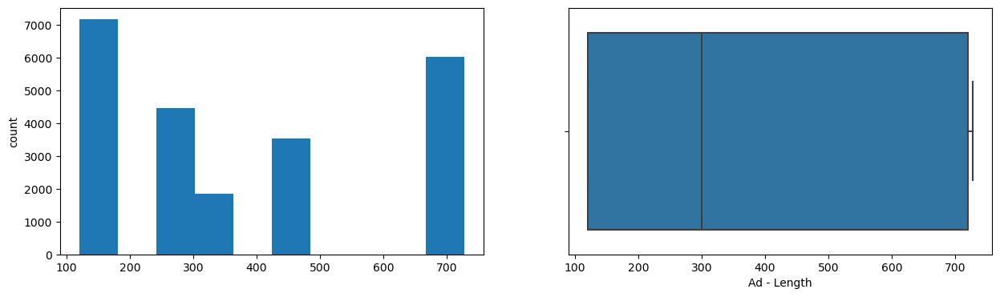

Ad- Width
Skew : 0.21


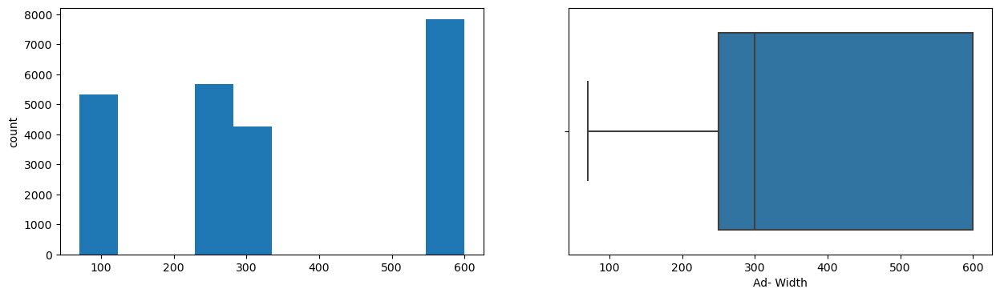

Ad Size
Skew : 1.21


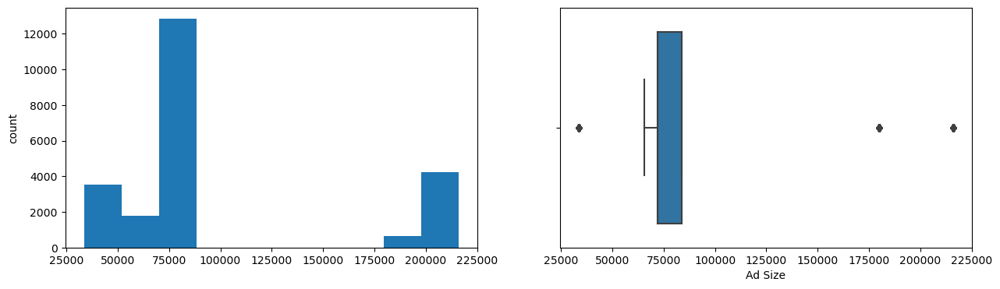

Available_Impressions
Skew : 3.07


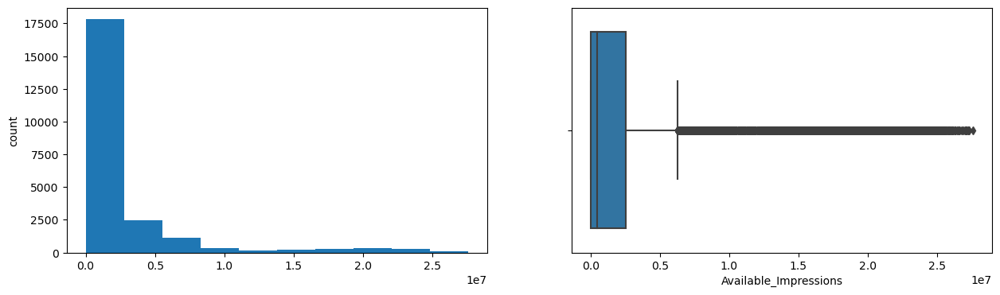

Matched_Queries
Skew : 2.98


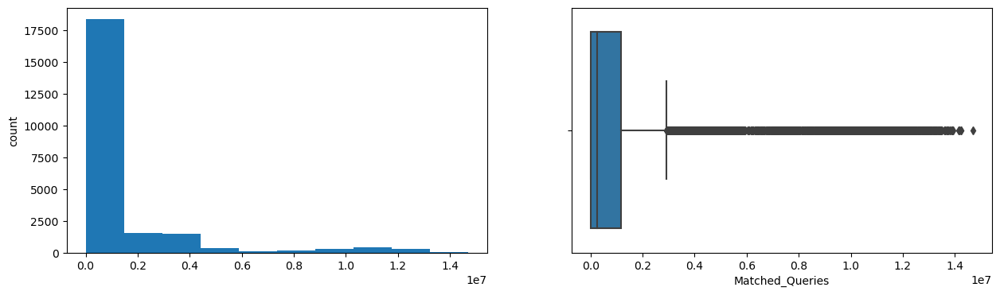

Impressions
Skew : 2.97


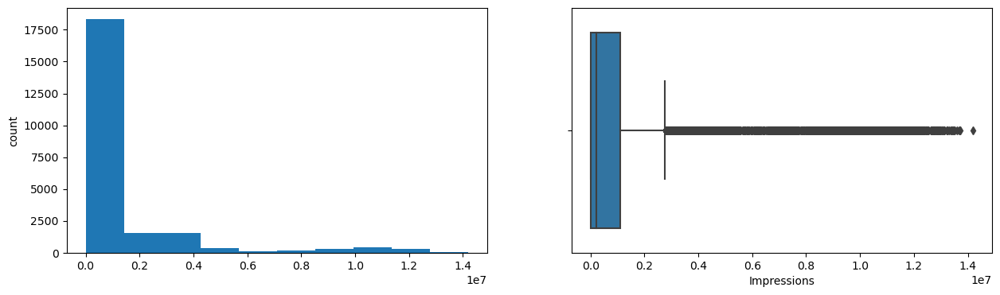

Clicks
Skew : 2.94


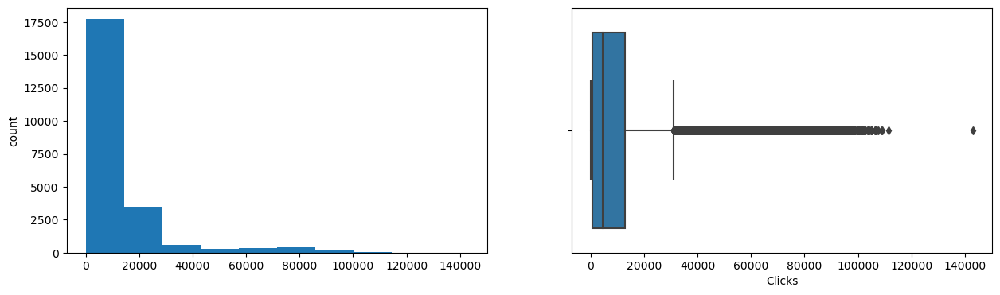

Spend
Skew : 2.58


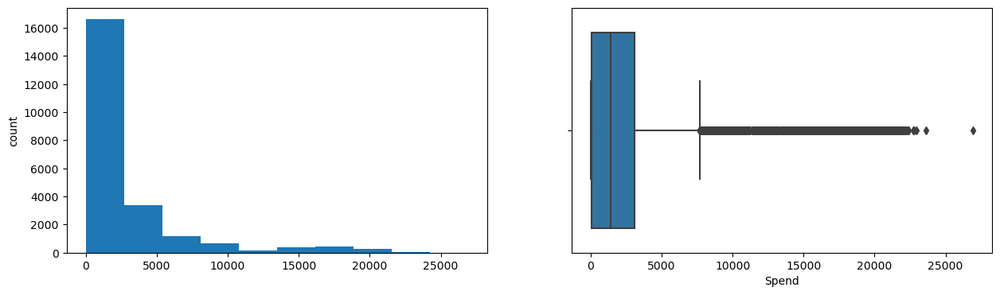

Fee
Skew : -2.3


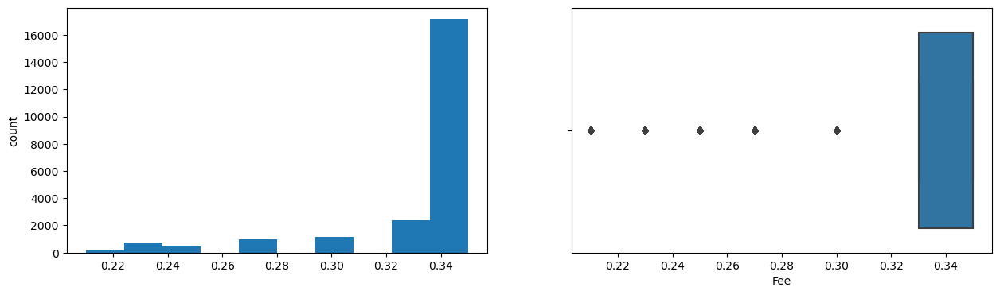

Revenue
Skew : 2.79


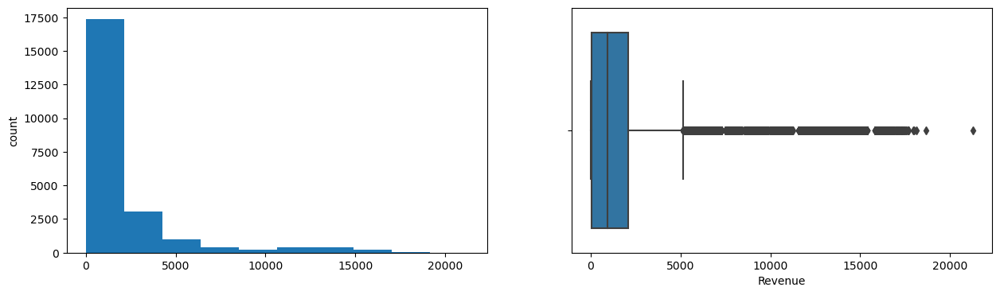

CTR
Skew : 2.44


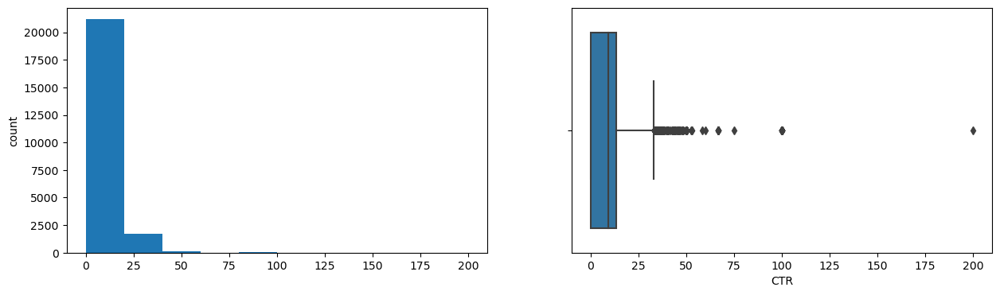

CPM
Skew : 22.32


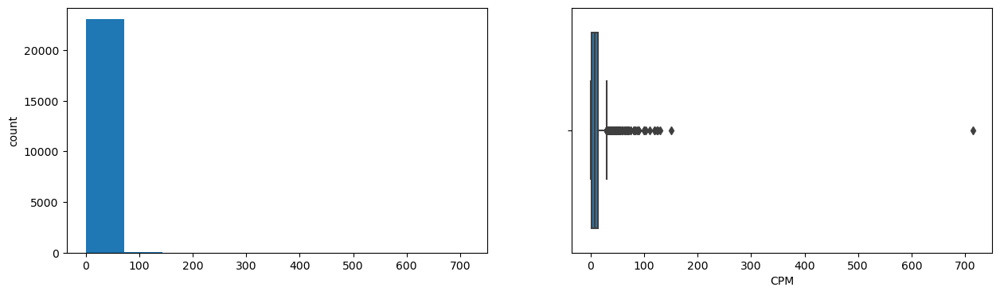

CPC
Skew : 1.84


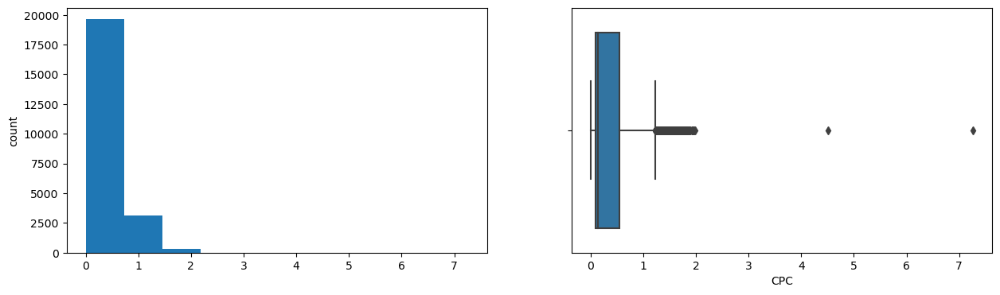

<Figure size 640x480 with 0 Axes>

In [18]:
for col in Ads_nums_cols:
    print(col)
    print('Skew :',round(Ads_df[col].skew(),2))
    plt.figure(figsize=(15,4))
    plt.subplot(1,2,1)
    Ads_df[col].hist(bins=10, grid=False)
    plt.ylabel('count')
    plt.subplot(1,2,2)
    sns.boxplot(x=Ads_df[col])
    plt.show()
plt.savefig('/Users/aravindakshan/Downloads/Ads_Outlier.png',bbox_inches='tight')

>>> Every feature has skewness as described earlier using statistic method. Additionally there are outliers in most of the features. 

>**K-Means algorithm uses the mean distance of every observation and form a cluster. After it calculates the centroids, it compares with rest of the observations within group to readjust the formation of cluster. If outliers are present, it will affect the mean calculation and subsequently the observation movement between clusters. Alternatively, K-Means can form a separate cluster for outliers itself. Hence, there will be a separate cluster level for outlier will be formed. Since it impacts the quality of the cluster formed, I am treating the outlier with IQR method.**

In [19]:
Q1 = Ads_df.quantile(0.25)
Q3 = Ads_df.quantile(0.75)
IQR = Q3 - Q1

In [20]:
((Ads_df < (Q1 - 1.5 * IQR)) | (Ads_df > (Q3 + 1.5 * IQR))).sum()

Ad - Length                 0
Ad Size                  8448
Ad Type                     0
Ad- Width                   0
Available_Impressions    2378
CPC                       585
CPM                       207
CTR                       275
Clicks                   1691
Device Type                 0
Fee                      3517
Format                      0
Impressions              3269
InventoryType               0
Matched_Queries          3192
Platform                    0
Revenue                  2325
Spend                    2081
Timestamp                   0
dtype: int64

In [21]:
no_outlier = ['Ad - Length', 'Ad Type', 'Ad- Width', 'Device Type', 'Format', 'Platform', 'Timestamp', 'InventoryType']

In [22]:
def treat_outlier(x):
    q25=np.percentile(x,25)
    q75=np.percentile(x,75)
    IQR=q75-q25
    lower_bound=q25-(1.5*IQR)
    upper_bound=q75+(1.5*IQR)
    return x.apply(lambda y: q75 if y > q75 else y).apply(lambda y: q25 if y < q25 else y)

In [23]:
outlier_list = [x for x in Ads_df.columns if x not in no_outlier]

In [24]:
for i in Ads_df[outlier_list]:    
    Ads_df[i]=treat_outlier(Ads_df[i])

In [25]:
Ads_df.head()

,Timestamp,InventoryType,Ad - Length,Ad- Width,Ad Size,Ad Type,Platform,Device Type,Format,Available_Impressions,Matched_Queries,Impressions,Clicks,Spend,Fee,Revenue,CTR,CPM,CPC
0,2020-9-2-17,Format1,300,250,75000.0,Inter222,Video,Desktop,Display,33672.25,18282.5,7990.5,710.0,85.18,0.35,55.365375,0.309598,1.749084,0.089736
1,2020-9-2-10,Format1,300,250,75000.0,Inter227,App,Mobile,Video,33672.25,18282.5,7990.5,710.0,85.18,0.35,55.365375,0.350877,1.749084,0.089736
2,2020-9-1-22,Format1,300,250,75000.0,Inter222,Video,Desktop,Display,33672.25,18282.5,7990.5,710.0,85.18,0.35,55.365375,0.281690,1.749084,0.089736
3,2020-9-3-20,Format1,300,250,75000.0,Inter228,Video,Mobile,Video,33672.25,18282.5,7990.5,710.0,85.18,0.35,55.365375,0.265107,1.749084,0.089736
4,2020-9-4-15,Format1,300,250,75000.0,Inter217,Web,Desktop,Video,33672.25,18282.5,7990.5,710.0,85.18,0.35,55.365375,0.413223,1.749084,0.089736


Ad - Length
Skew : 0.33


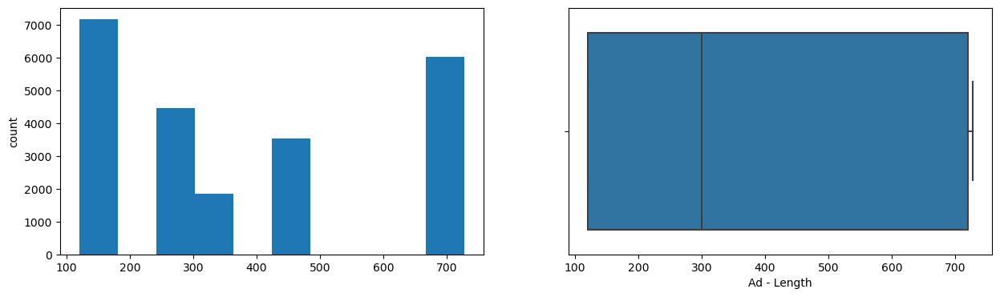

Ad- Width
Skew : 0.21


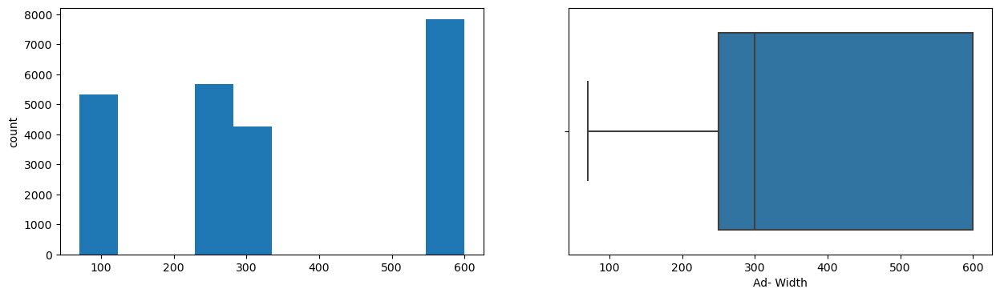

Ad Size
Skew : 0.79


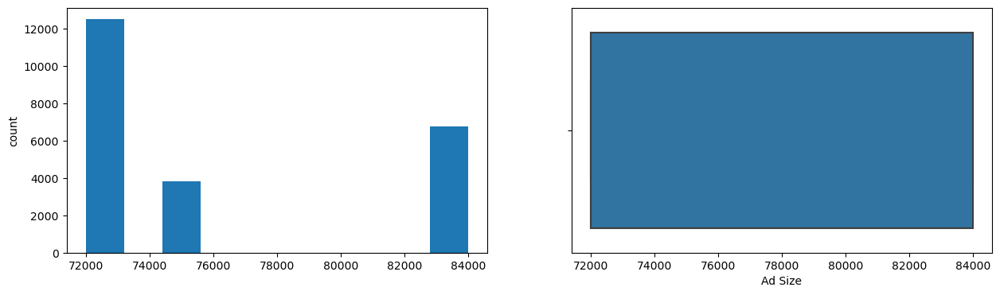

Available_Impressions
Skew : 0.53


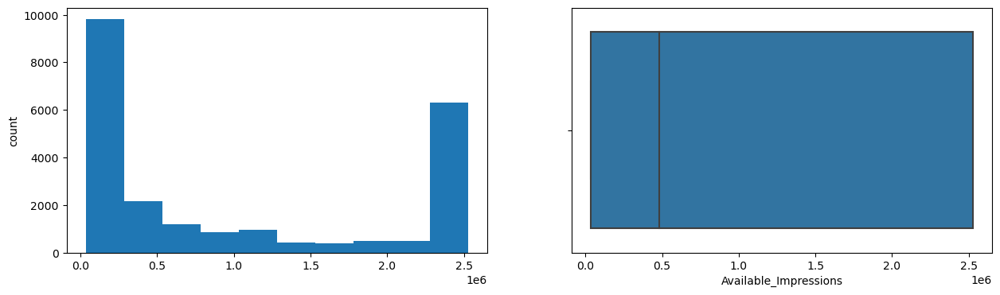

Matched_Queries
Skew : 0.43


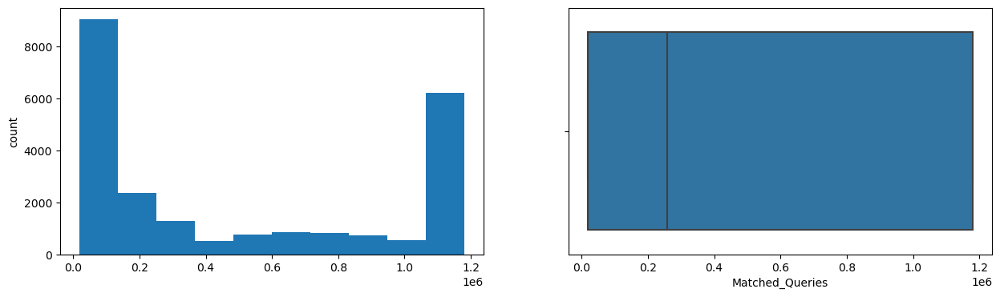

Impressions
Skew : 0.44


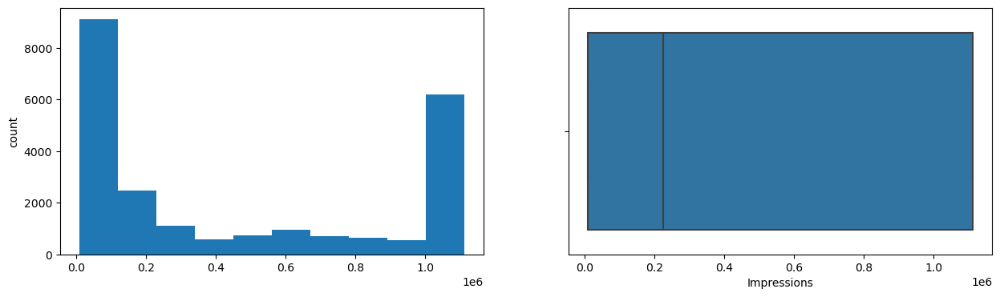

Clicks
Skew : 0.38


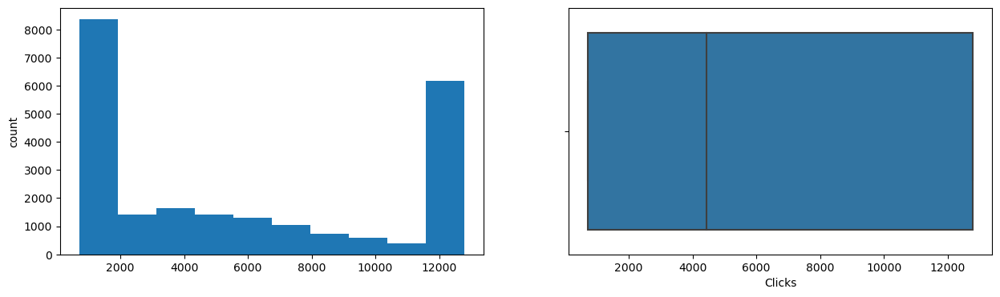

Spend
Skew : 0.17


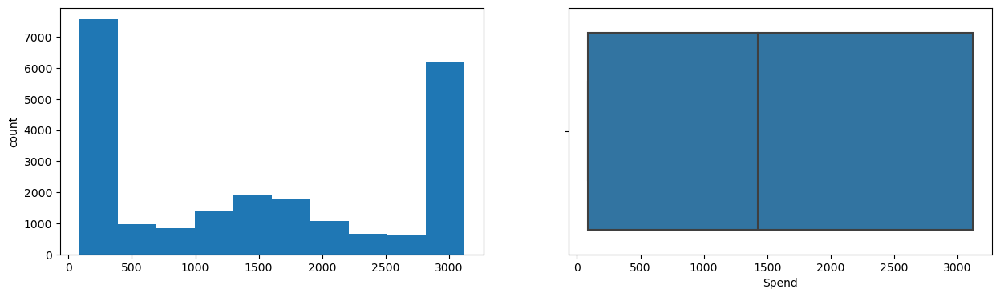

Fee
Skew : -1.11


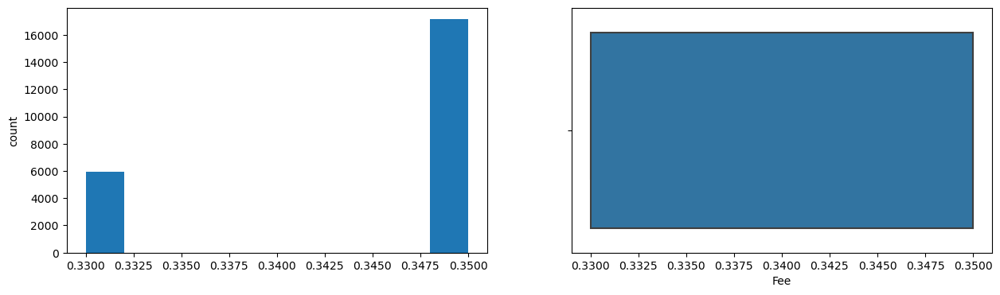

Revenue
Skew : 0.21


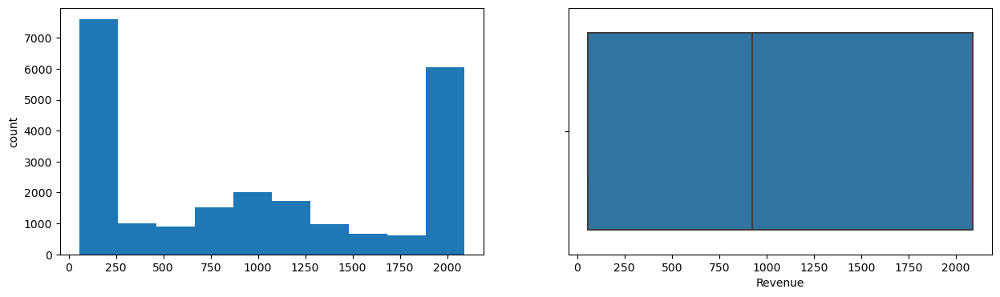

CTR
Skew : -0.09


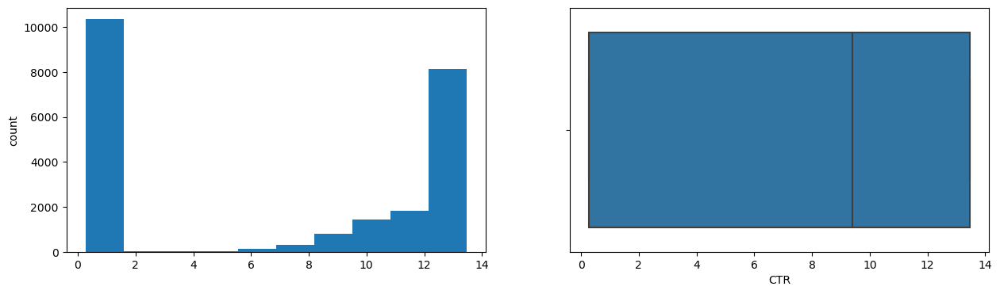

CPM
Skew : -0.0


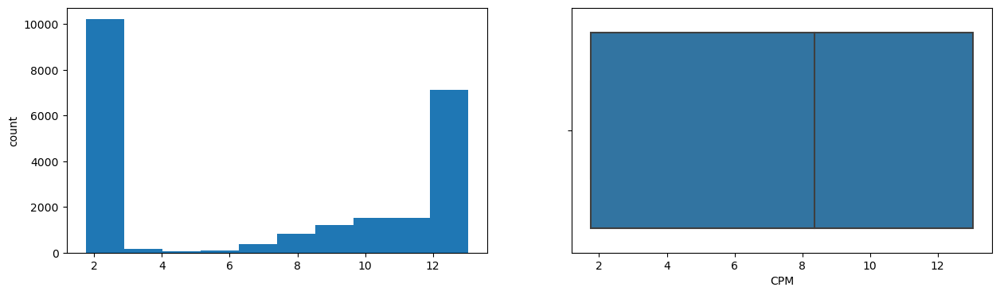

CPC
Skew : 0.46


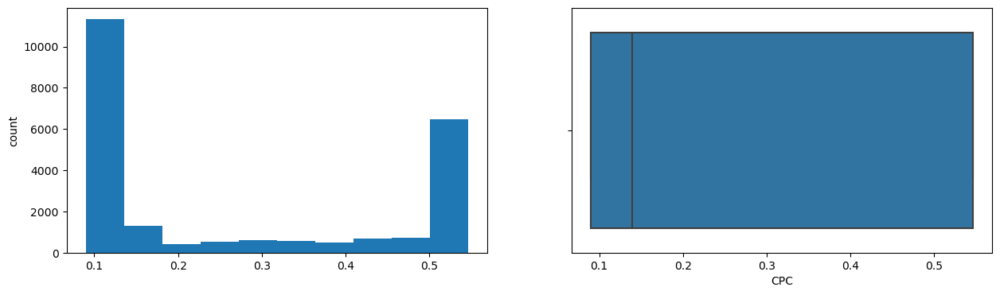

In [26]:
for col in Ads_nums_cols:
    print(col)
    print('Skew :',round(Ads_df[col].skew(),2))
    plt.figure(figsize=(15,4))
    plt.subplot(1,2,1)
    Ads_df[col].hist(bins=10, grid=False)
    plt.ylabel('count')
    plt.subplot(1,2,2)
    sns.boxplot(x=Ads_df[col])
    plt.show()

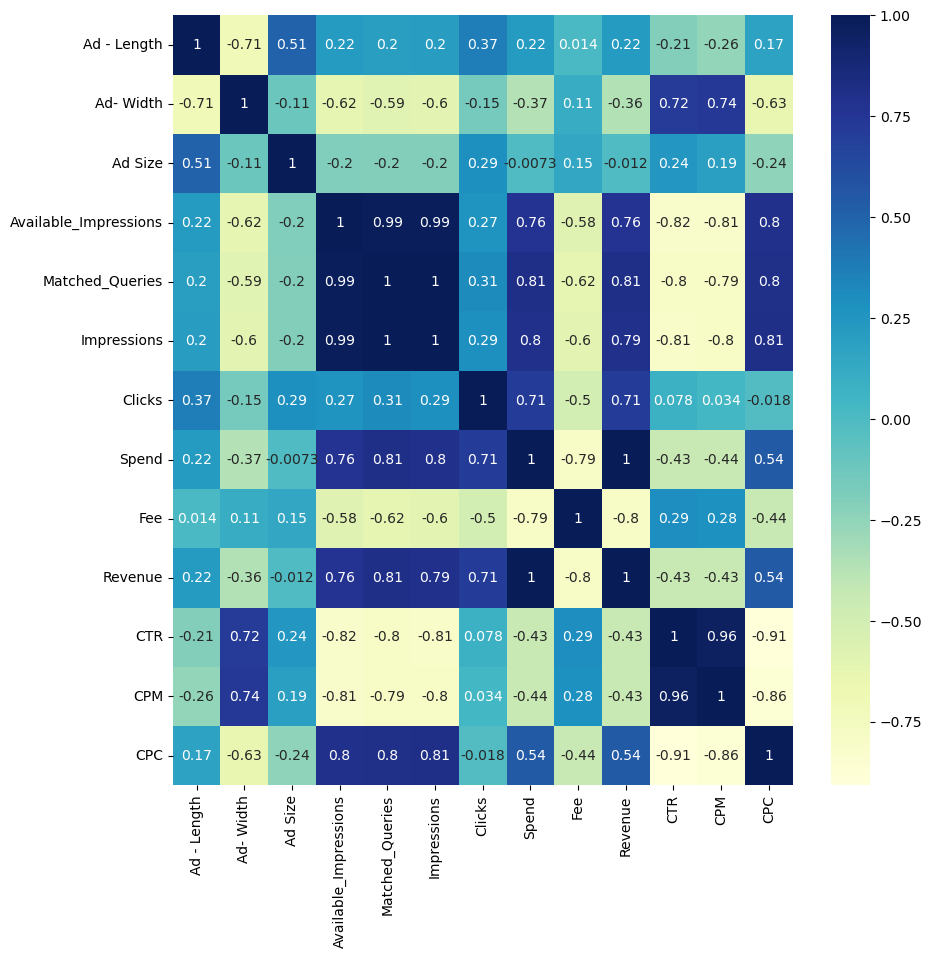

<Figure size 640x480 with 0 Axes>

In [27]:
plt.figure(figsize  = (10,10))
sns.heatmap(Ads_df.corr(), annot = True, cmap="YlGnBu")
plt.show()
plt.savefig('heat.png')

> Strong positive correlation is found between

>> Available_Impressions and Matched Queries 
Available_Impressions and Spend 
Matched_Queries and Spend 
Available_Impressions and Impressions

> Strong negative correlation exists between

>> Fee and Spend 
Fee and Revenue 
Fee and Available_Impressions 
Fee and Matched_Queries

**Since the scale of data is very different in dataset, peforming a zscore scaling will bring all observations into Mean 0 and SD = 1.**

In [28]:
df_num = Ads_df.select_dtypes(include = ['float64', 'int64'])
lstnumericcolumns = list(df_num.columns.values)
len(lstnumericcolumns)

13

In [29]:
df_num_scaled=df_num.apply(zscore)
df_num_scaled.head()

,Ad - Length,Ad- Width,Ad Size,Available_Impressions,Matched_Queries,Impressions,Clicks,Spend,Fee,Revenue,CTR,CPM,CPC
0,-0.364496,-0.432797,-0.192668,-0.934925,-0.98599,-0.978479,-1.043986,-1.156558,0.587931,-1.145389,-1.089247,-1.08971,-0.913653
1,-0.364496,-0.432797,-0.192668,-0.934925,-0.98599,-0.978479,-1.043986,-1.156558,0.587931,-1.145389,-1.082385,-1.08971,-0.913653
2,-0.364496,-0.432797,-0.192668,-0.934925,-0.98599,-0.978479,-1.043986,-1.156558,0.587931,-1.145389,-1.093886,-1.08971,-0.913653
3,-0.364496,-0.432797,-0.192668,-0.934925,-0.98599,-0.978479,-1.043986,-1.156558,0.587931,-1.145389,-1.096643,-1.08971,-0.913653
4,-0.364496,-0.432797,-0.192668,-0.934925,-0.98599,-0.978479,-1.043986,-1.156558,0.587931,-1.145389,-1.072020,-1.08971,-0.913653


Applied zscore scaling on the numeric data columns

Z Score scaling helps to achieve the mean value to be 0 (Zero) with a standard deviation of 1.

k-means clustering is formed based on the distance between the observations, the scale of data is very importance. If scale varies between observations it will mislead the cluster forming. With help of z score scaling, all the data points are brought to similar scale and hence the eculidean distance calculated will be more appropriate while used for forming clusters.

K-means algorithm goal is to reduce the distance between observations within cluster , same scale improves the grouping more perfectly. Thus it enhances the k-mean algorithm to achieve the end goal in best way.

**Perform Hierarchical by constructing a Dendrogram using WARD and Euclidean distance**



In [30]:
Z=linkage(df_num_scaled,method='ward')

#plt.figure(figsize=(10,5))
#plt.title('Hierarchial Clustering using Dendrogram')
#dendrogram(Z,leaf_rotation=90,leaf_font_size=8.)

{'icoord': [[5.0, 5.0, 15.0, 15.0],
  [35.0, 35.0, 45.0, 45.0],
  [25.0, 25.0, 40.0, 40.0],
  [10.0, 10.0, 32.5, 32.5]],
 'dcoord': [[0.0, 256.39701029273607, 256.39701029273607, 0.0],
  [0.0, 238.72687381511784, 238.72687381511784, 0.0],
  [0.0, 284.83821602122043, 284.83821602122043, 238.72687381511784],
  [256.39701029273607,
   526.9844122626034,
   526.9844122626034,
   284.83821602122043]],
 'ivl': ['(4278)', '(6074)', '(5782)', '(1647)', '(5285)'],
 'leaves': [46124, 46126, 46123, 46121, 46125],
 'color_list': ['C1', 'C2', 'C2', 'C0'],
 'leaves_color_list': ['C1', 'C1', 'C2', 'C2', 'C2']}

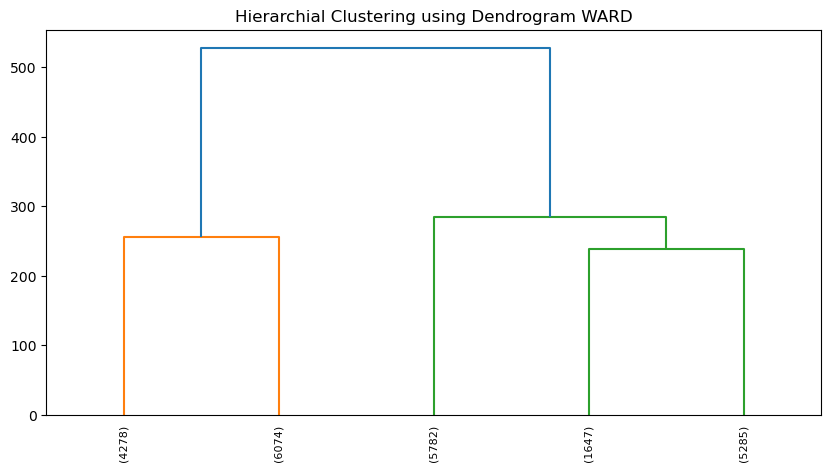

In [31]:
plt.figure(figsize=(10,5))
plt.title('Hierarchial Clustering using Dendrogram WARD')
dendrogram(Z,truncate_mode='lastp',p=5,leaf_rotation=90,leaf_font_size=8.)

**The first dendrogram was very clumsy when it was drawn for all the observations without a level. 
Later dendrogram was truncated to have only 5 clusters for better visualization. Each clusters number of observations are shown along the x axis and the distance between clusters are shown on y axis**



{'icoord': [[5.0, 5.0, 15.0, 15.0],
  [35.0, 35.0, 45.0, 45.0],
  [25.0, 25.0, 40.0, 40.0],
  [10.0, 10.0, 32.5, 32.5]],
 'dcoord': [[0.0, 3.6191501253280056, 3.6191501253280056, 0.0],
  [0.0, 3.840886476194775, 3.840886476194775, 0.0],
  [0.0, 4.445503196033823, 4.445503196033823, 3.840886476194775],
  [3.6191501253280056,
   4.9323092857295965,
   4.9323092857295965,
   4.445503196033823]],
 'ivl': ['(4278)', '(6075)', '(1647)', '(5780)', '(5286)'],
 'leaves': [46115, 46125, 46126, 46123, 46124],
 'color_list': ['C0', 'C0', 'C0', 'C0'],
 'leaves_color_list': ['C0', 'C0', 'C0', 'C0', 'C0']}

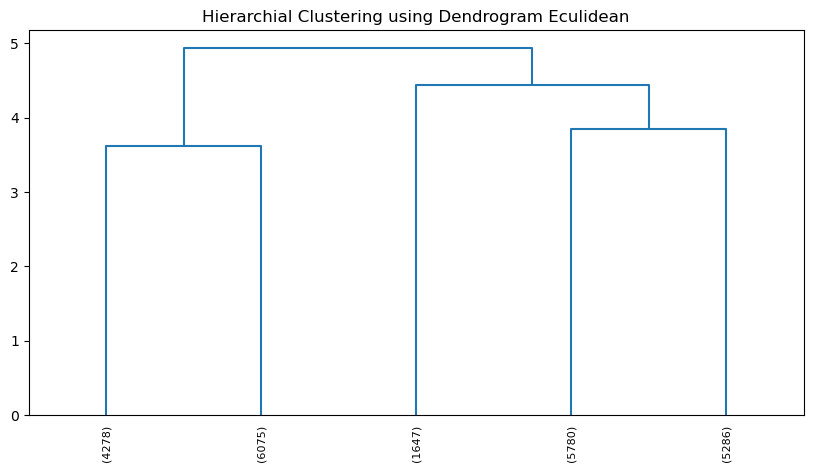

In [32]:
Z=linkage(df_num_scaled,method='centroid')
plt.figure(figsize=(10,5))
plt.title('Hierarchial Clustering using Dendrogram Eculidean')
dendrogram(Z,truncate_mode='lastp',p=5,leaf_rotation=90,leaf_font_size=8.)

Using centroid method the clusters are formed with limit of 5 numbers. Each clusters observations are found along x axis and the distance on y axis. 

>> Since the outlier are treated using z-score, the formation of cluster doesn't show huge variation. If outliers aren't treated then it forms cluster containing outlier which has very far distance forming 1 observation at each cluster and other falling into single cluster. 

**Make Elbow plot (up to n=10) and identify optimum number of clusters for k-means algorithm.**

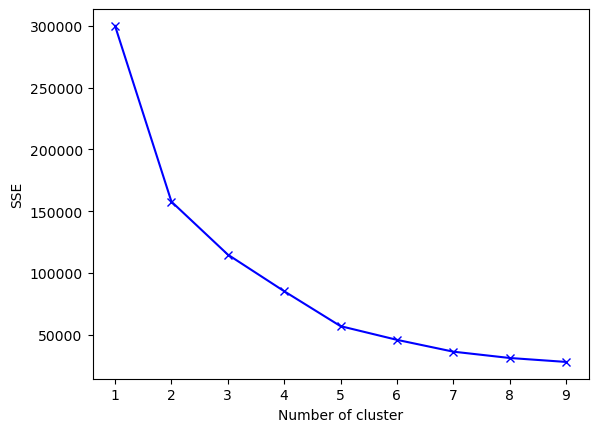

In [33]:
sse = {} 
for k in range(1, 10):
    kmeans = KMeans(n_clusters=k, random_state=1).fit(df_num_scaled)
    sse[k] = kmeans.inertia_ 

plt.figure()
plt.plot(list(sse.keys()), list(sse.values()), 'bx-')
plt.xlabel("Number of cluster")
plt.ylabel("SSE")
plt.show()

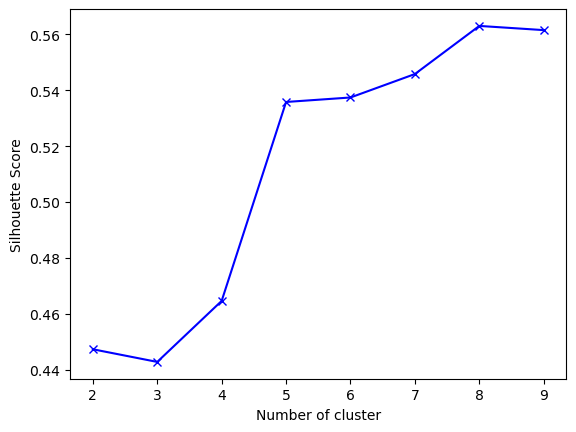

In [34]:
sc = {} 
for k in range(2, 10):
    kmeans = KMeans(n_clusters=k, random_state=1).fit(df_num_scaled)
    labels = kmeans.predict(df_num_scaled)
    sc[k] = silhouette_score(df_num_scaled, labels)
plt.figure()
plt.plot(list(sc.keys()), list(sc.values()), 'bx-')
plt.xlabel("Number of cluster")
plt.ylabel("Silhouette Score")
plt.show()

In [35]:
kmeans_1 = KMeans(n_clusters=5, random_state=1).fit(df_num_scaled)
labels_1 = kmeans_1.predict(df_num_scaled)
sc_1 = silhouette_score(df_num_scaled, labels_1)
sc_1

0.5357996807527596

Silhouette Score shows that n_clusters=5 has 0.53 as value. n_clusters=8 even gives a better score but that will too many clusters to analyse and outcome with business details. 

Hence I choose 5 cluster size for further analysis.

In [36]:
w_labels=fcluster(Z, 5, criterion='maxclust')
w_labels

array([2, 2, 2, ..., 5, 4, 5], dtype=int32)

In [37]:
Ads_df['KMean_cluster']=w_labels

In [38]:
Ads_df.groupby('KMean_cluster').count()

,Timestamp,InventoryType,Ad - Length,Ad- Width,Ad Size,Ad Type,Platform,Device Type,Format,Available_Impressions,Matched_Queries,Impressions,Clicks,Spend,Fee,Revenue,CTR,CPM,CPC
KMean_cluster,,,,,,,,,,,,,,,,,,,
1,4278,4278,4278,4278,4278,4278,4278,4278,4278,4278,4278,4278,4278,4278,4278,4278,4278,4278,4278
2,6075,6075,6075,6075,6075,6075,6075,6075,6075,6075,6075,6075,6075,6075,6075,6075,6075,6075,6075
3,1647,1647,1647,1647,1647,1647,1647,1647,1647,1647,1647,1647,1647,1647,1647,1647,1647,1647,1647
4,5780,5780,5780,5780,5780,5780,5780,5780,5780,5780,5780,5780,5780,5780,5780,5780,5780,5780,5780
5,5286,5286,5286,5286,5286,5286,5286,5286,5286,5286,5286,5286,5286,5286,5286,5286,5286,5286,5286


In [39]:
KMean_cluster_3=Ads_df[Ads_df['KMean_cluster']==5]
KMean_cluster_3.groupby('Format').sum()

,Ad - Length,Ad- Width,Ad Size,Available_Impressions,Matched_Queries,Impressions,Clicks,Spend,Fee,Revenue,CTR,CPM,CPC,KMean_cluster
Format,,,,,,,,,,,,,,
Display,1644540,803000,217728000.0,5.780459e+08,314279877.0,261816466.0,21622334.00,2804306.27,907.2,1.822798e+06,31276.672439,28353.459114,256.753676,12960
Video,1713648,834100,226296000.0,5.903615e+08,320782414.5,266580311.5,22214131.75,2854550.31,942.9,1.855457e+06,32255.054595,29417.452373,269.994619,13470


In [40]:
Ads_df.groupby('KMean_cluster').sum().round(2)

,Ad - Length,Ad- Width,Ad Size,Available_Impressions,Matched_Queries,Impressions,Clicks,Spend,Fee,Revenue,CTR,CPM,CPC
KMean_cluster,,,,,,,,,,,,,
1,1959064,863550,320679000.0,1.080848e+10,5.050657e+09,4.758622e+09,38154989.50,13346298.22,1411.74,8942020.41,1141.57,7777.61,2286.91
2,2582200,911660,450639000.0,9.788474e+09,4.683519e+09,4.430571e+09,19898657.00,8724510.37,2126.25,5670931.32,2599.42,11968.27,2587.13
3,291120,913600,121788000.0,1.292433e+09,9.049825e+08,7.638206e+08,21071306.25,5138466.91,543.51,3442773.08,21672.24,20626.45,186.24
4,693600,3468000,416160000.0,2.854961e+08,1.693369e+08,1.016599e+08,11664722.75,1490977.71,2023.00,969128.32,69330.71,67438.44,645.96
5,3358188,1637100,444024000.0,1.168407e+09,6.350623e+08,5.283968e+08,43836465.75,5658856.58,1850.10,3678255.01,63531.73,57770.91,526.75


In [41]:
Ads_df.groupby('KMean_cluster').mean().round(2)

,Ad - Length,Ad- Width,Ad Size,Available_Impressions,Matched_Queries,Impressions,Clicks,Spend,Fee,Revenue,CTR,CPM,CPC
KMean_cluster,,,,,,,,,,,,,
1,457.94,201.86,74960.03,2526525.32,1180611.70,1112347.37,8918.88,3119.75,0.33,2090.23,0.27,1.82,0.53
2,425.05,150.07,74179.26,1611271.45,770949.56,729312.17,3275.50,1436.13,0.35,933.49,0.43,1.97,0.43
3,176.76,554.71,73945.36,784719.21,549473.27,463764.76,12793.75,3119.89,0.33,2090.33,13.16,12.52,0.11
4,120.00,600.00,72000.00,49393.79,29297.04,17588.22,2018.12,257.95,0.35,167.67,11.99,11.67,0.11
5,635.30,309.70,84000.00,221038.10,120140.43,99961.55,8292.94,1070.54,0.35,695.85,12.02,10.93,0.10


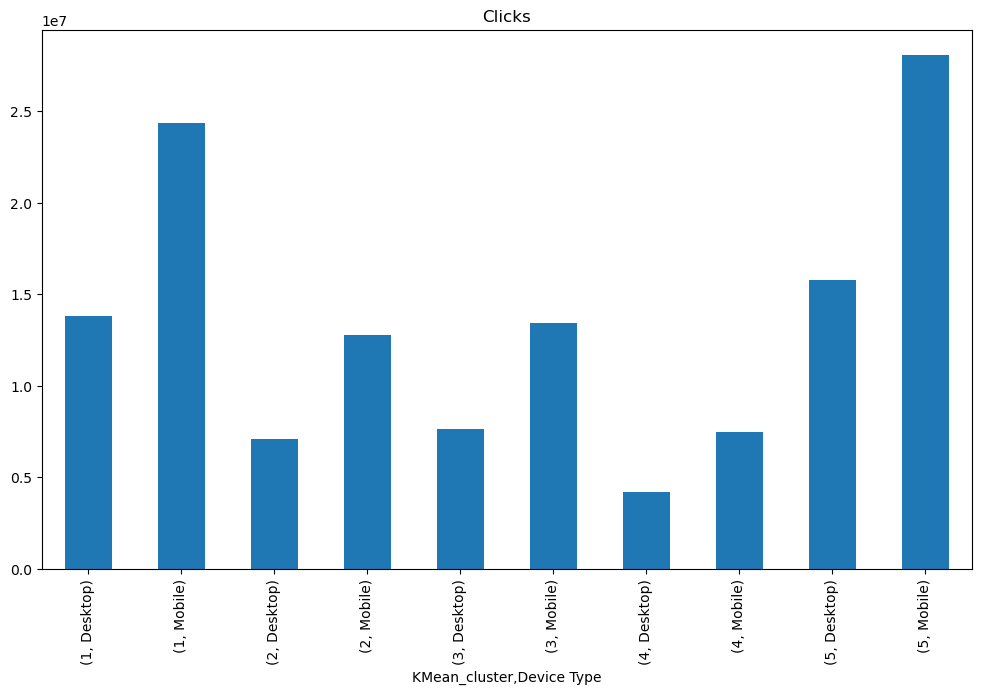

In [42]:
Ads_df.groupby(['KMean_cluster','Device Type']).sum()['Clicks'].plot(kind='bar',figsize=(12,7),title='Clicks');

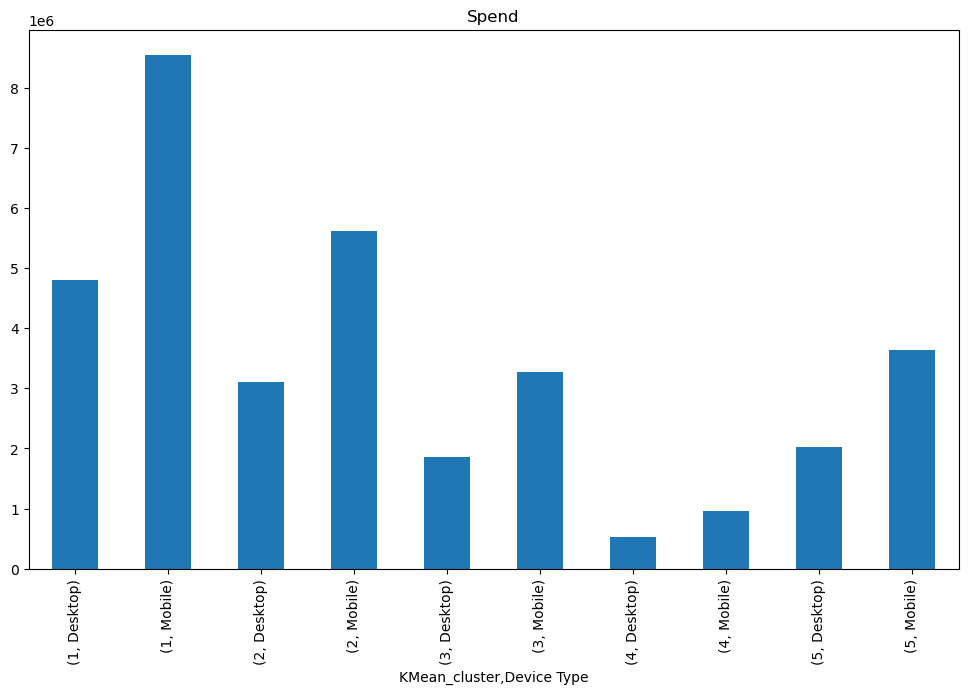

In [43]:
Ads_df.groupby(['KMean_cluster','Device Type']).sum()['Spend'].plot(kind='bar',figsize=(12,7),title='Spend');

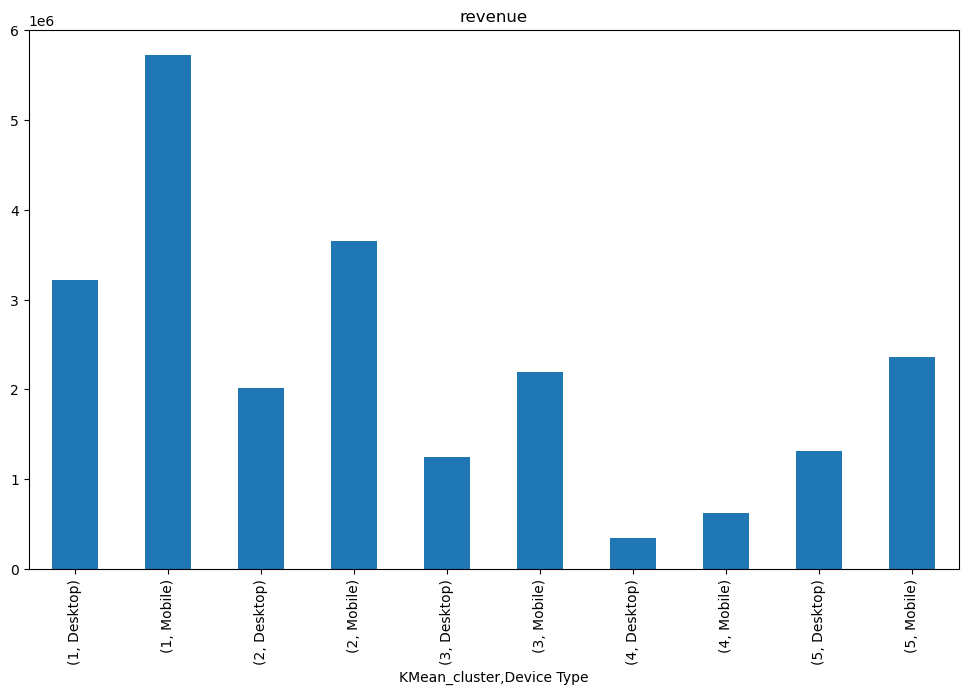

In [44]:
Ads_df.groupby(['KMean_cluster','Device Type'])['Revenue'].sum().plot(kind='bar',figsize=(12,7),title="revenue");

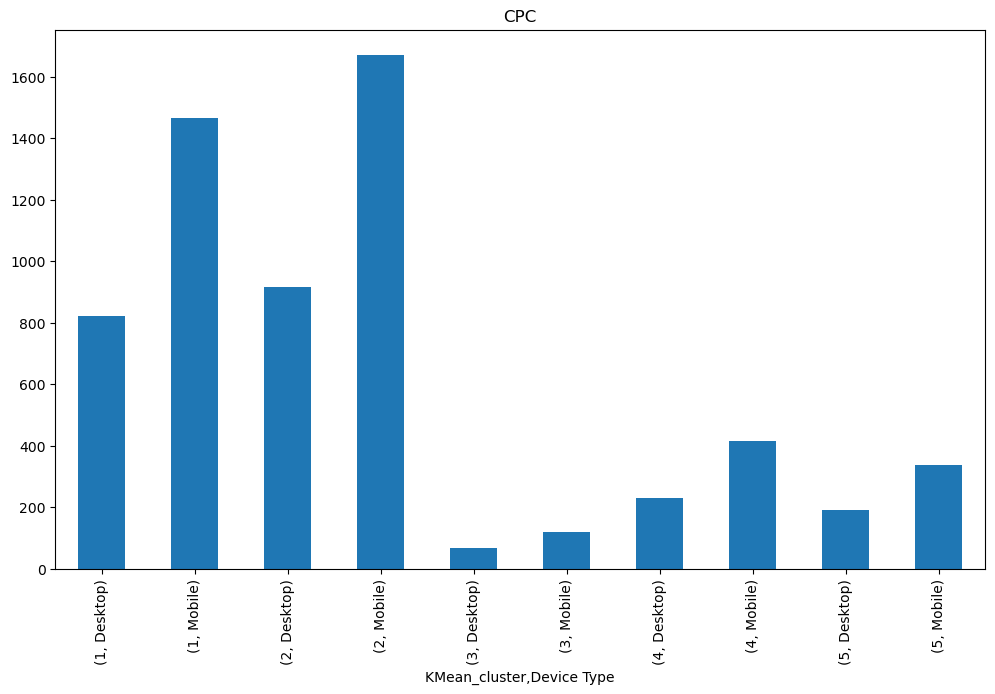

In [45]:
Ads_df.groupby(['KMean_cluster','Device Type']).sum()['CPC'].plot(kind='bar',figsize=(12,7),title='CPC');

1. Highest number of ads are present in Cluster 2
2. Ads in Cluster 1 are published the highest times and equally impressions are high
3. Cluster 3 contains ads that has highest clicks which results in generating more revenue for the company
4. Cluster 2,4 and 5 has ads where the fee is high compared to Cluster 1 and 3


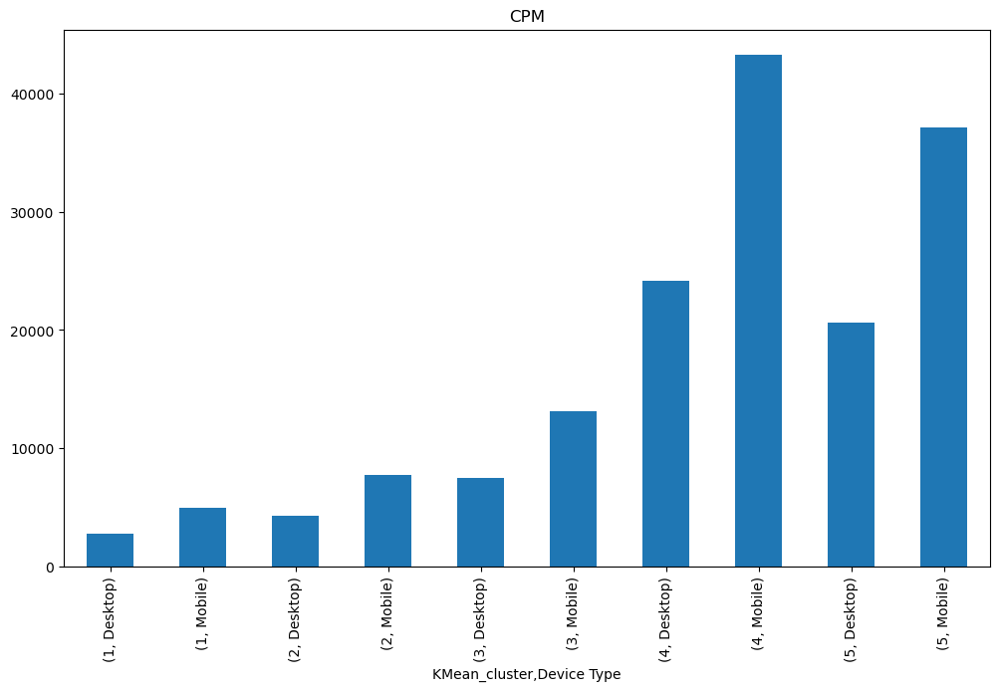

In [46]:
Ads_df.groupby(['KMean_cluster','Device Type']).sum()['CPM'].plot(kind='bar',figsize=(12,7),title='CPM');

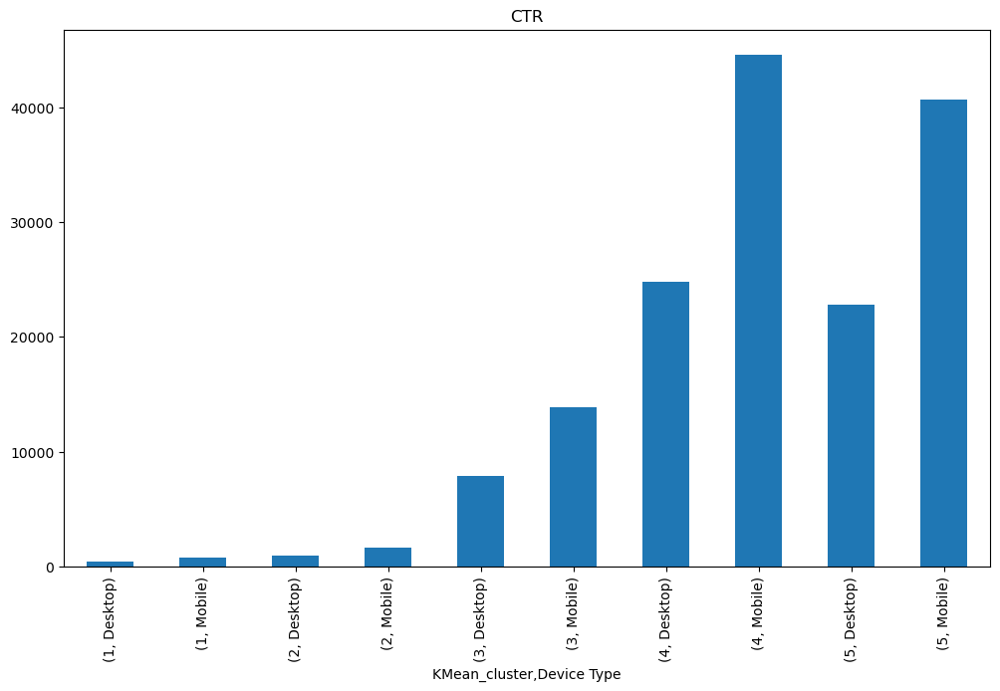

In [47]:
Ads_df.groupby(['KMean_cluster','Device Type']).sum()['CTR'].plot(kind='bar',figsize=(12,7),title='CTR');

In [48]:
pca_data_df = pd.read_excel("/Users/aravindakshan/Downloads/PCA India Data_Census.xlsx")

In [49]:
pca_data_df.head()

,State Code,Dist.Code,State,Area Name,No_HH,TOT_M,TOT_F,M_06,F_06,M_SC,...,MARG_CL_0_3_M,MARG_CL_0_3_F,MARG_AL_0_3_M,MARG_AL_0_3_F,MARG_HH_0_3_M,MARG_HH_0_3_F,MARG_OT_0_3_M,MARG_OT_0_3_F,NON_WORK_M,NON_WORK_F
0,1,1,Jammu & Kashmir,Kupwara,7707,23388,29796,5862,6196,3,...,1150,749,180,237,680,252,32,46,258,214
1,1,2,Jammu & Kashmir,Badgam,6218,19585,23102,4482,3733,7,...,525,715,123,229,186,148,76,178,140,160
2,1,3,Jammu & Kashmir,Leh(Ladakh),4452,6546,10964,1082,1018,3,...,114,188,44,89,3,34,0,4,67,61
3,1,4,Jammu & Kashmir,Kargil,1320,2784,4206,563,677,0,...,194,247,61,128,13,50,4,10,116,59
4,1,5,Jammu & Kashmir,Punch,11654,20591,29981,5157,4587,20,...,874,1928,465,1043,205,302,24,105,180,478


In [50]:
pca_data_df.tail()

,State Code,Dist.Code,State,Area Name,No_HH,TOT_M,TOT_F,M_06,F_06,M_SC,...,MARG_CL_0_3_M,MARG_CL_0_3_F,MARG_AL_0_3_M,MARG_AL_0_3_F,MARG_HH_0_3_M,MARG_HH_0_3_F,MARG_OT_0_3_M,MARG_OT_0_3_F,NON_WORK_M,NON_WORK_F
635,34,636,Puducherry,Mahe,3333,8154,11781,1146,1203,21,...,32,47,0,0,0,0,0,0,32,47
636,34,637,Puducherry,Karaikal,10612,12346,21691,1544,1533,2234,...,155,337,3,14,38,130,4,23,110,170
637,35,638,Andaman & Nicobar Island,Nicobars,1275,1549,2630,227,225,0,...,104,134,9,4,2,6,17,47,76,77
638,35,639,Andaman & Nicobar Island,North & Middle Andaman,3762,5200,8012,723,664,0,...,136,172,24,44,11,21,1,4,100,103
639,35,640,Andaman & Nicobar Island,South Andaman,7975,11977,18049,1470,1358,0,...,173,122,6,2,17,17,2,4,148,99


In [51]:
pca_data_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 640 entries, 0 to 639
Data columns (total 61 columns):
 #   Column          Non-Null Count  Dtype 
---  ------          --------------  ----- 
 0   State Code      640 non-null    int64 
 1   Dist.Code       640 non-null    int64 
 2   State           640 non-null    object
 3   Area Name       640 non-null    object
 4   No_HH           640 non-null    int64 
 5   TOT_M           640 non-null    int64 
 6   TOT_F           640 non-null    int64 
 7   M_06            640 non-null    int64 
 8   F_06            640 non-null    int64 
 9   M_SC            640 non-null    int64 
 10  F_SC            640 non-null    int64 
 11  M_ST            640 non-null    int64 
 12  F_ST            640 non-null    int64 
 13  M_LIT           640 non-null    int64 
 14  F_LIT           640 non-null    int64 
 15  M_ILL           640 non-null    int64 
 16  F_ILL           640 non-null    int64 
 17  TOT_WORK_M      640 non-null    int64 
 18  TOT_WORK_F

There are two object variable and 59 numeric features. There are no missing values through out the feature in entire dataset. No need to handle any missing values.

In [52]:
pca_data_df.describe().round(2).T

,count,mean,std,min,25%,50%,75%,max
State Code,640.0,17.11,9.43,1.0,9.00,18.0,24.00,35.0
Dist.Code,640.0,320.50,184.90,1.0,160.75,320.5,480.25,640.0
No_HH,640.0,51222.87,48135.41,350.0,19484.00,35837.0,68892.00,310450.0
TOT_M,640.0,79940.58,73384.51,391.0,30228.00,58339.0,107918.50,485417.0
TOT_F,640.0,122372.08,113600.72,698.0,46517.75,87724.5,164251.75,750392.0
M_06,640.0,12309.10,11500.91,56.0,4733.75,9159.0,16520.25,96223.0
F_06,640.0,11942.30,11326.29,56.0,4672.25,8663.0,15902.25,95129.0
M_SC,640.0,13820.95,14426.37,0.0,3466.25,9591.5,19429.75,103307.0
F_SC,640.0,20778.39,21727.89,0.0,5603.25,13709.0,29180.00,156429.0
M_ST,640.0,6191.81,9912.67,0.0,293.75,2333.5,7658.00,96785.0



1. The scale of data are different and hence a scaling will be needed
2. The number of feature is too many to analyse data

In [53]:
pca_data_df.duplicated().sum()

0

No duplicates through out the dataset

There are several features represents high correlation

Perform detailed Exploratory analysis by creating certain questions like (i) Which state has highest gender ratio and which has the lowest? (ii) Which district has the highest & lowest gender ratio? (Example Questions). Pick 5 variables out of the given 24 variables below for EDA: No_HH, TOT_M, TOT_F, M_06, F_06, M_SC, F_SC, M_ST, F_ST, M_LIT, F_LIT, M_ILL, F_ILL, TOT_WORK_M, TOT_WORK_F, MAINWORK_M, MAINWORK_F, MAIN_CL_M, MAIN_CL_F, MAIN_AL_M, MAIN_AL_F, MAIN_HH_M, MAIN_HH_F, MAIN_OT_M, MAIN_OT_F

1. Which State code has highest Female and male Population

In [54]:
pca_data_num_df=pca_data_df.select_dtypes(include = ['float64', 'int64'])
lstnumericcolumns = list(pca_data_num_df.columns.values)
len(lstnumericcolumns)

59

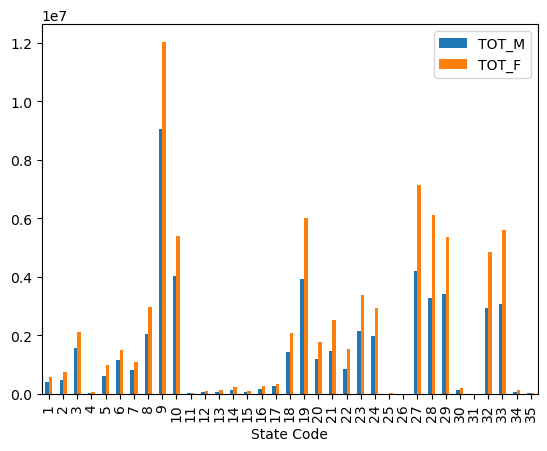

In [55]:
pca_data_num_df.groupby('State Code')['TOT_M','TOT_F'].sum().plot(kind='bar');

*State Code 9 (UP) shows highest number of Female and Male count compared to all other states in the dataset.*

2. What is the working population compared to that of literated population? Which State code has highest working population?

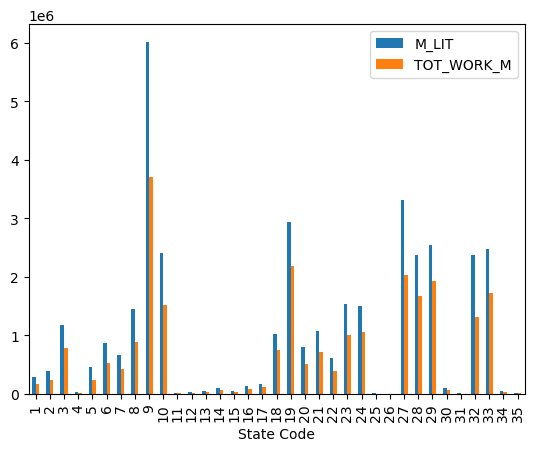

In [56]:
pca_data_num_df.groupby('State Code')['M_LIT','TOT_WORK_M'].sum().plot(kind='bar');

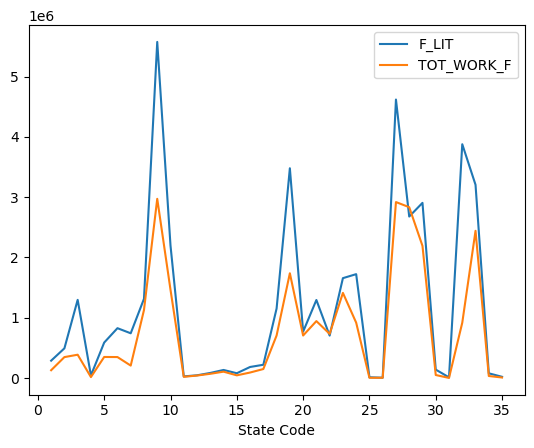

In [57]:
pca_data_num_df.groupby('State Code')['F_LIT','TOT_WORK_F'].sum().plot(kind='line');

Total working male and female are less compared to literated population in all the states.
State UP has highest educated people and working professions compared to all other states.

3. Which state has highest number of SC, ST?

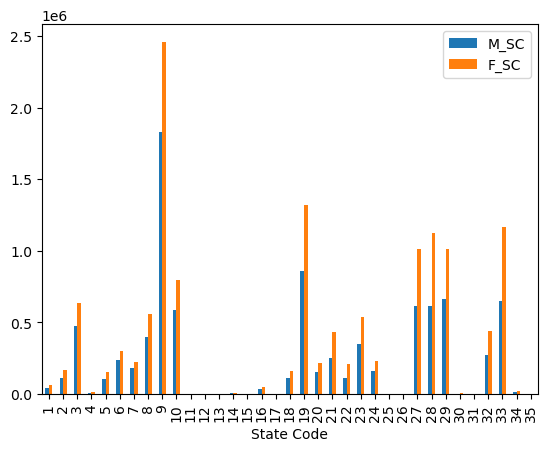

In [58]:
pca_data_num_df.groupby('State Code')['M_SC','F_SC'].sum().plot(kind='bar');

Highest Scheduled Cast populated is found in State code 9 (UP)

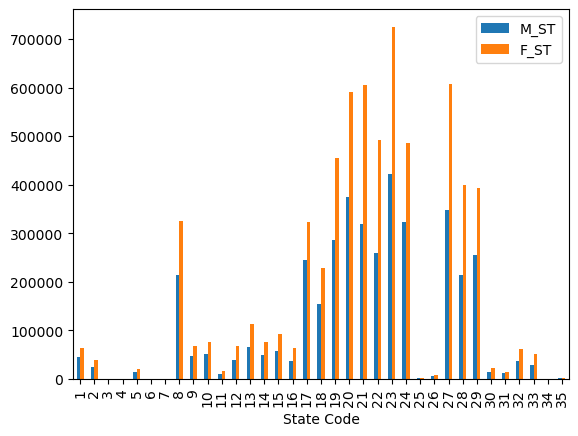

In [59]:
pca_data_num_df.groupby('State Code')['M_ST','F_ST',].sum().plot(kind='bar');

Scheduled Cast is highest in UP and highest Scheduled Tribe is from Madhya Pradesh states. This shows that the Government will have to open more opportunity and services to support the peoples of this level. 

4. Which state has highest gender ratio and which has the lowest?

In [60]:
pca_data_num_df['Genderratio']=pca_data_num_df['TOT_M']/pca_data_num_df['TOT_F']

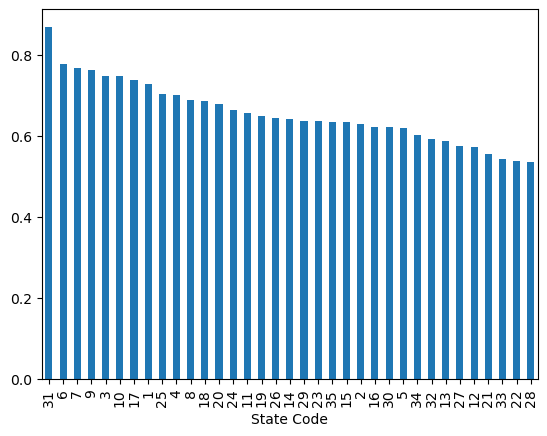

In [61]:
pca_data_num_df.groupby(['State Code']).mean()['Genderratio'].sort_values(ascending=False).plot(kind='bar');

5. Which disctrict has highest gender ratio and which has the lowest?

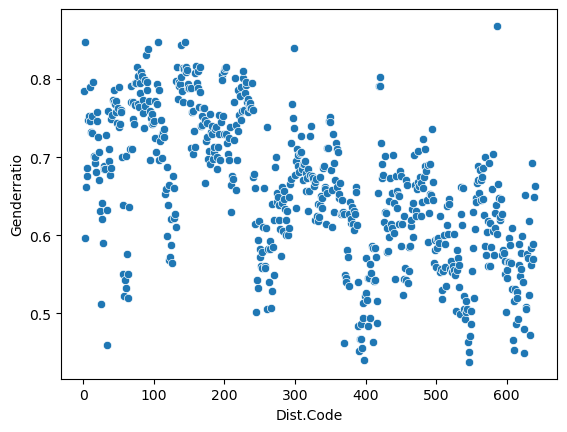

In [62]:
sns.scatterplot(data=pca_data_num_df,x='Dist.Code',y='Genderratio');

Highest gender ratio is observed in 587 and lowest in 547 district wise.

6. Which state has more number of agriculturist?

In [63]:
pca_data_num_df['Agriculturist']=pca_data_num_df['MARG_AL_M']+pca_data_num_df['MARG_AL_F']

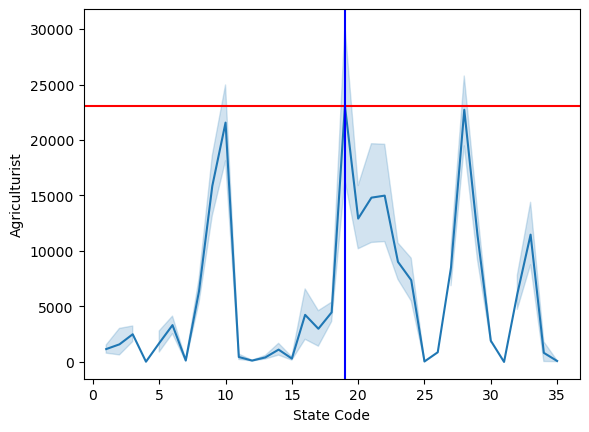

In [64]:
sns.lineplot(data=pca_data_num_df,x='State Code',y='Agriculturist');
plt.axhline(y=23100,c='r')
plt.axvline(x=19,c='b')

UP had most agriculturist in overall population dataset

In [65]:
def univariateAnalysis_numeric(column,nbins):
    print("Description of " + column)
    print("----------------------------------------------------------------------------")
    print(pca_data_num_df[column].describe(),end=' ')
    print('Skew :',round(pca_data_num_df[column].skew(),2))
    
    plt.figure(figsize=[25,10])
    print("Distribution of " + column)
    print("----------------------------------------------------------------------------")
    a=round(pca_data_num_df[column].min())
    b=round(pca_data_num_df[column].max())
    freq, bins, patches = plt.hist(pca_data_num_df[column], bins=nbins, range=[a,b], edgecolor='Black', color='cyan')
    bin_centers = np.diff(bins)*0.5 + bins[:-1]
    n = 0
    for fr, x, patch in zip(freq, bin_centers, patches):
      height = int(freq[n])
      plt.annotate("{}".format(height),
               xy = (x, height),             # top left corner of the histogram bar
               xytext = (0,0.2),             # offsetting label position above its bar
               textcoords = "offset points", # Offset (in points) from the *xy* value
               ha = 'center', va = 'bottom'
               )
      n = n+1

    #plt.legend()
    #plt.xticks(range(a,b,round((b-a)/nbins)))
    plt.show;
    plt.figure()
    print("BoxPlot of " + column)
    print("----------------------------------------------------------------------------")
    ax = sns.boxplot(x=pca_data_num_df[column])
    #ax.legend()
    plt.show()

Description of State Code
----------------------------------------------------------------------------
count    640.000000
mean      17.114062
std        9.426486
min        1.000000
25%        9.000000
50%       18.000000
75%       24.000000
max       35.000000
Name: State Code, dtype: float64 Skew : 0.04
Distribution of State Code
----------------------------------------------------------------------------
BoxPlot of State Code
----------------------------------------------------------------------------


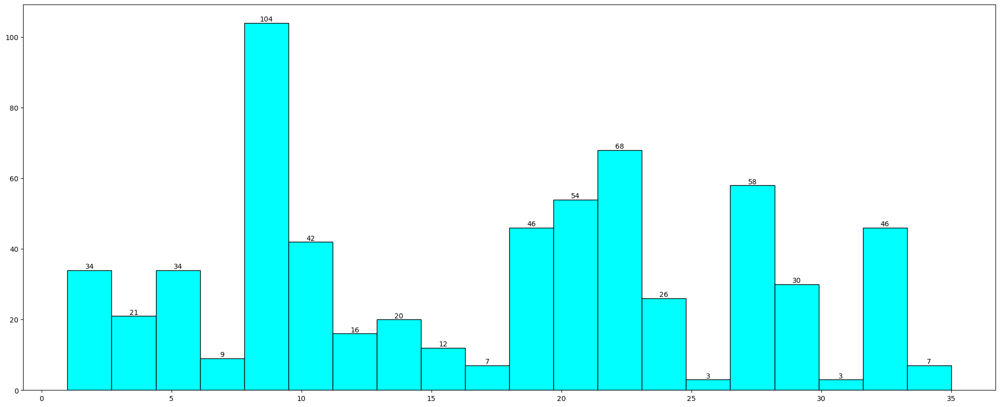

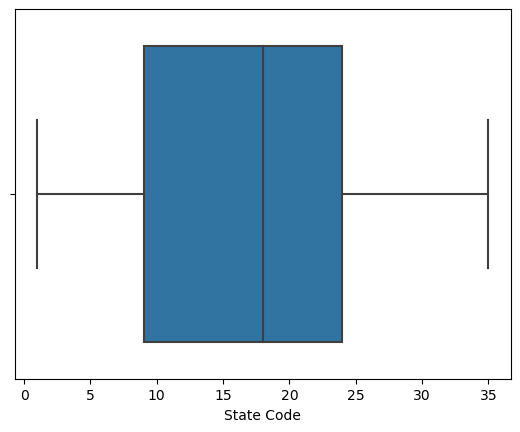

Description of Dist.Code
----------------------------------------------------------------------------
count    640.000000
mean     320.500000
std      184.896367
min        1.000000
25%      160.750000
50%      320.500000
75%      480.250000
max      640.000000
Name: Dist.Code, dtype: float64 Skew : 0.0
Distribution of Dist.Code
----------------------------------------------------------------------------
BoxPlot of Dist.Code
----------------------------------------------------------------------------


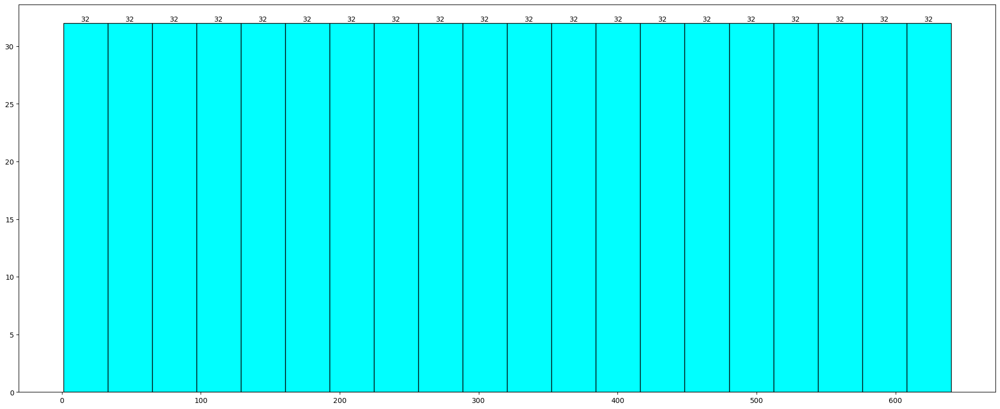

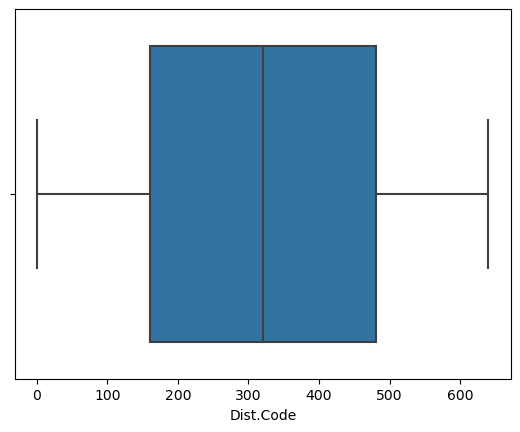

Description of No_HH
----------------------------------------------------------------------------
count       640.000000
mean      51222.871875
std       48135.405475
min         350.000000
25%       19484.000000
50%       35837.000000
75%       68892.000000
max      310450.000000
Name: No_HH, dtype: float64 Skew : 2.02
Distribution of No_HH
----------------------------------------------------------------------------
BoxPlot of No_HH
----------------------------------------------------------------------------


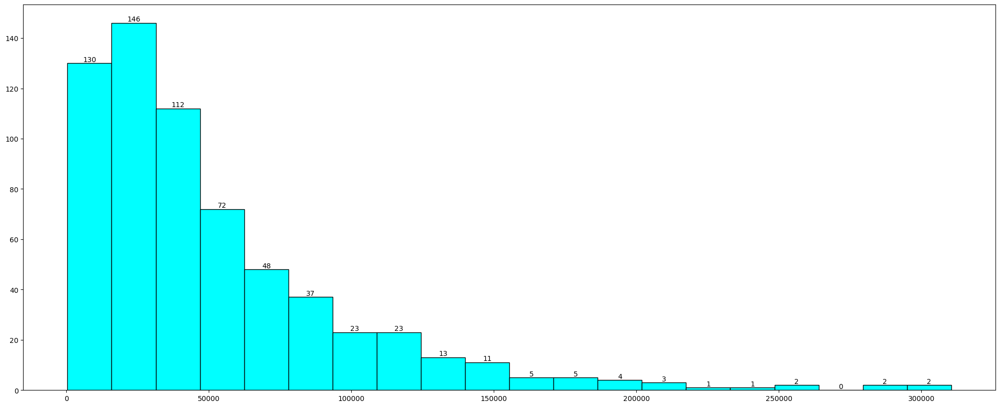

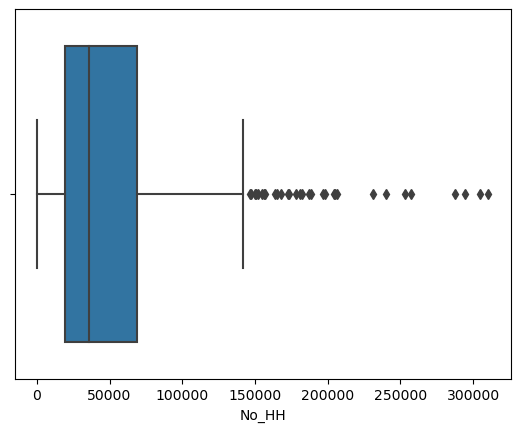

Description of TOT_M
----------------------------------------------------------------------------
count       640.000000
mean      79940.576563
std       73384.511114
min         391.000000
25%       30228.000000
50%       58339.000000
75%      107918.500000
max      485417.000000
Name: TOT_M, dtype: float64 Skew : 2.03
Distribution of TOT_M
----------------------------------------------------------------------------
BoxPlot of TOT_M
----------------------------------------------------------------------------


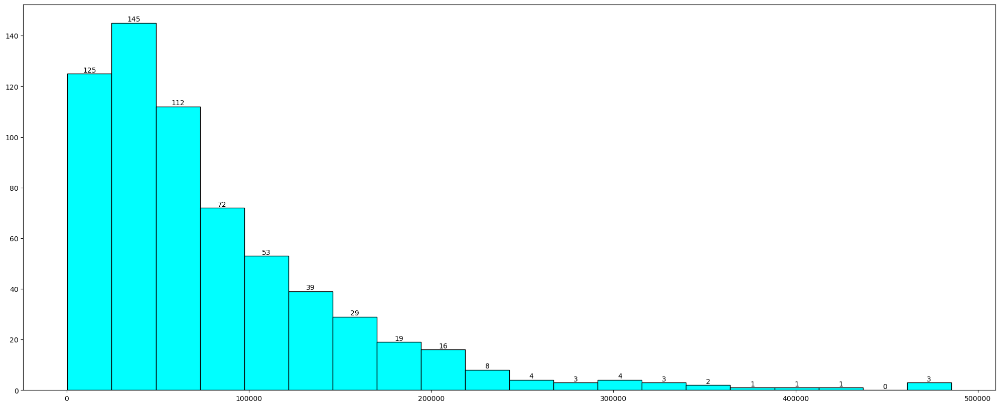

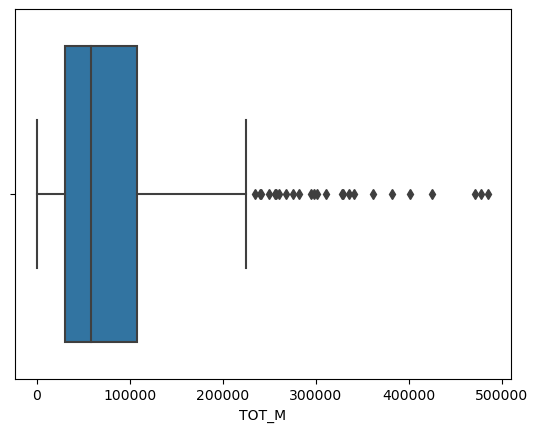

Description of TOT_F
----------------------------------------------------------------------------
count       640.000000
mean     122372.084375
std      113600.717282
min         698.000000
25%       46517.750000
50%       87724.500000
75%      164251.750000
max      750392.000000
Name: TOT_F, dtype: float64 Skew : 2.11
Distribution of TOT_F
----------------------------------------------------------------------------
BoxPlot of TOT_F
----------------------------------------------------------------------------


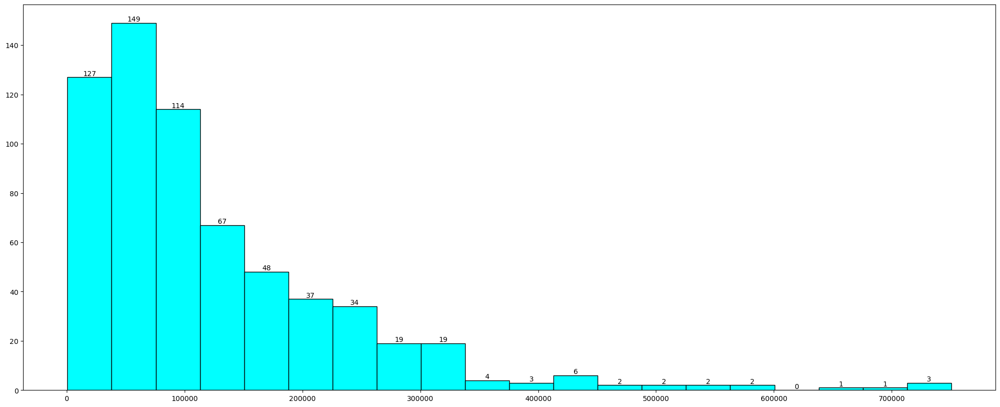

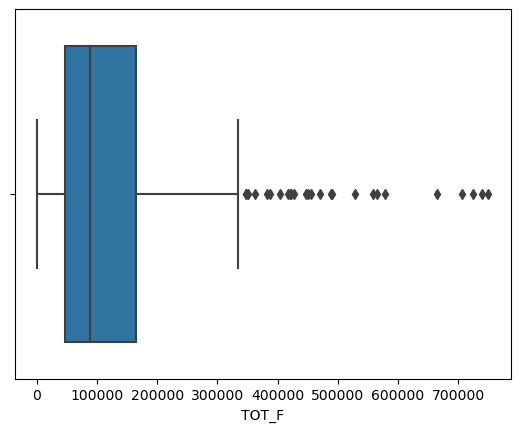

Description of M_06
----------------------------------------------------------------------------
count      640.000000
mean     12309.098438
std      11500.906881
min         56.000000
25%       4733.750000
50%       9159.000000
75%      16520.250000
max      96223.000000
Name: M_06, dtype: float64 Skew : 2.19
Distribution of M_06
----------------------------------------------------------------------------
BoxPlot of M_06
----------------------------------------------------------------------------


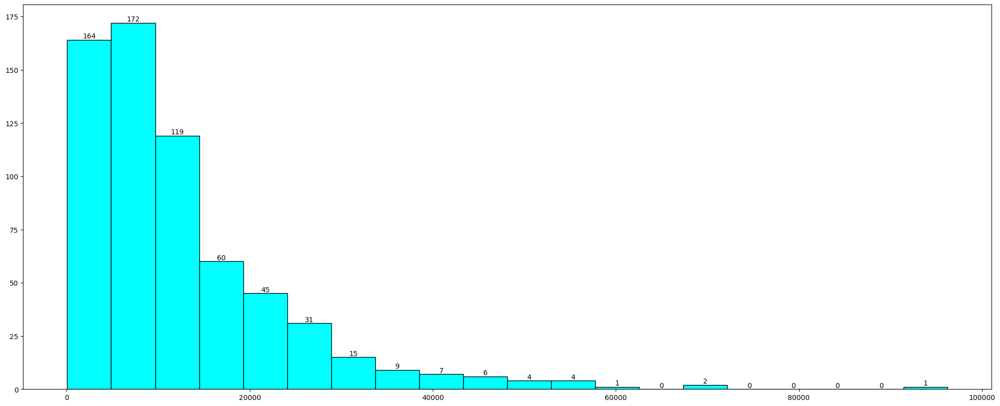

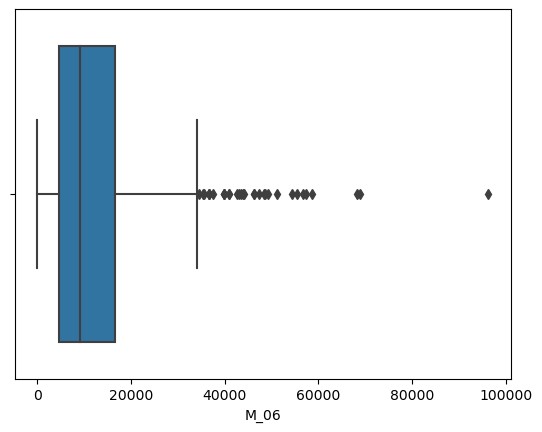

Description of F_06
----------------------------------------------------------------------------
count      640.000000
mean     11942.300000
std      11326.294567
min         56.000000
25%       4672.250000
50%       8663.000000
75%      15902.250000
max      95129.000000
Name: F_06, dtype: float64 Skew : 2.23
Distribution of F_06
----------------------------------------------------------------------------
BoxPlot of F_06
----------------------------------------------------------------------------


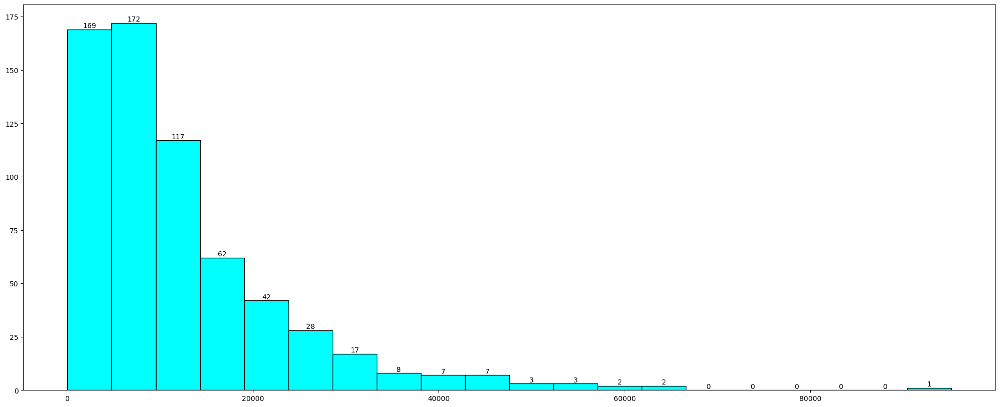

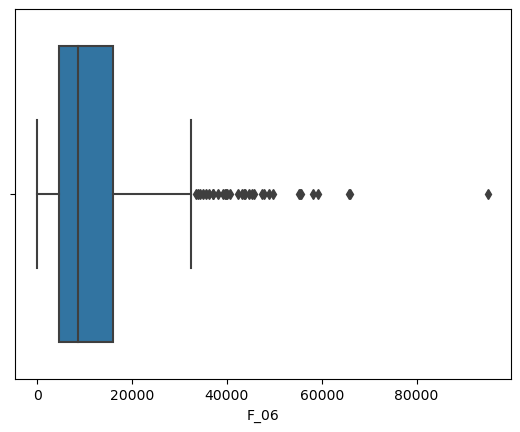

Description of M_SC
----------------------------------------------------------------------------
count       640.000000
mean      13820.946875
std       14426.373130
min           0.000000
25%        3466.250000
50%        9591.500000
75%       19429.750000
max      103307.000000
Name: M_SC, dtype: float64 Skew : 1.99
Distribution of M_SC
----------------------------------------------------------------------------
BoxPlot of M_SC
----------------------------------------------------------------------------


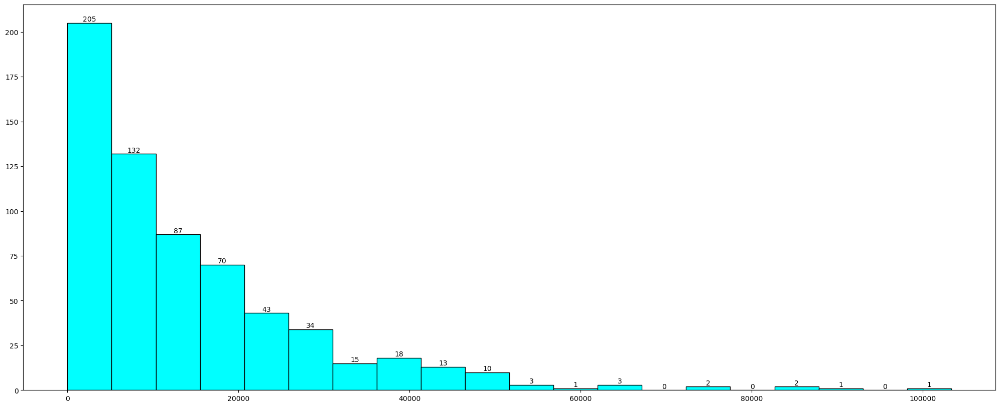

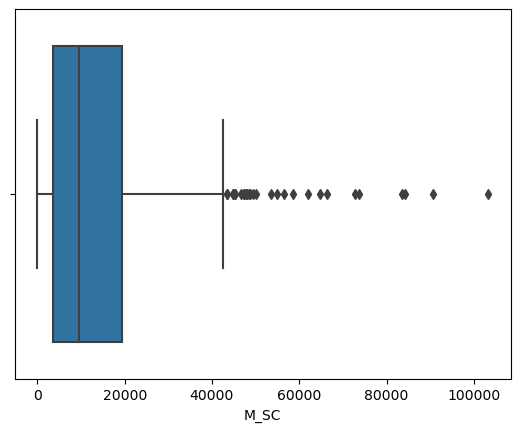

Description of F_SC
----------------------------------------------------------------------------
count       640.000000
mean      20778.392188
std       21727.887713
min           0.000000
25%        5603.250000
50%       13709.000000
75%       29180.000000
max      156429.000000
Name: F_SC, dtype: float64 Skew : 1.99
Distribution of F_SC
----------------------------------------------------------------------------
BoxPlot of F_SC
----------------------------------------------------------------------------


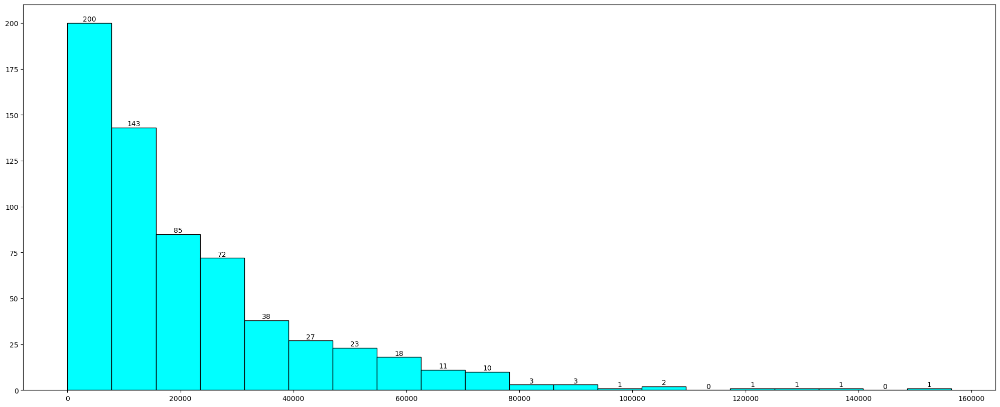

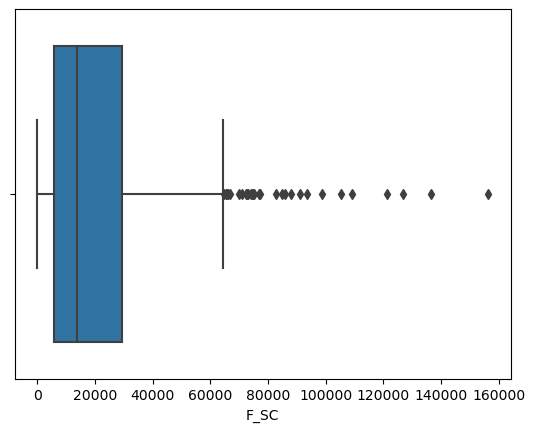

Description of M_ST
----------------------------------------------------------------------------
count      640.000000
mean      6191.807813
std       9912.668948
min          0.000000
25%        293.750000
50%       2333.500000
75%       7658.000000
max      96785.000000
Name: M_ST, dtype: float64 Skew : 3.44
Distribution of M_ST
----------------------------------------------------------------------------
BoxPlot of M_ST
----------------------------------------------------------------------------


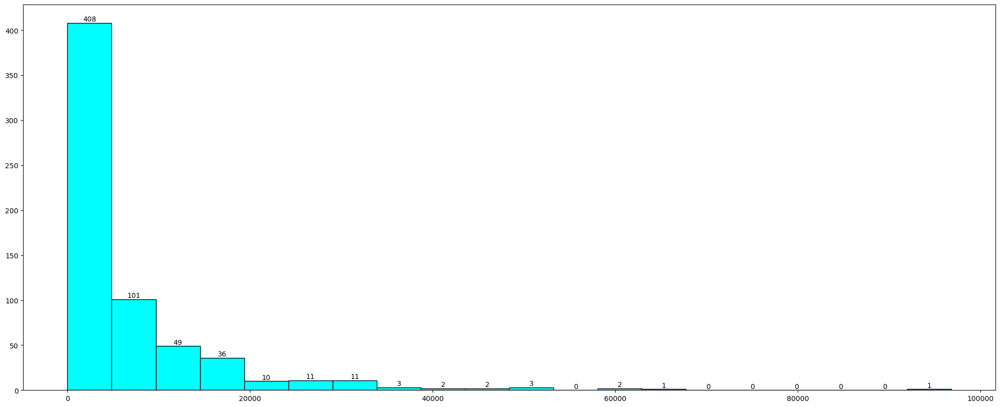

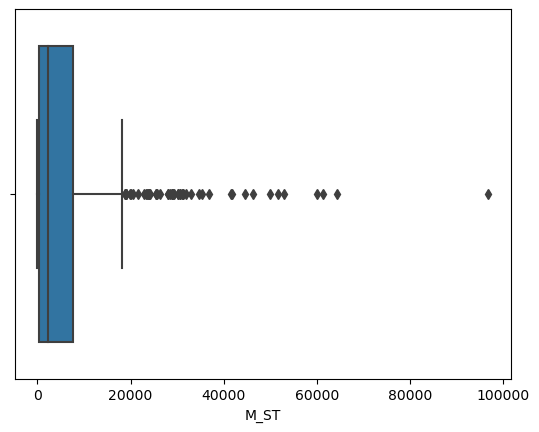

Description of F_ST
----------------------------------------------------------------------------
count       640.000000
mean      10155.640625
std       15875.701488
min           0.000000
25%         429.500000
50%        3834.500000
75%       12480.250000
max      130119.000000
Name: F_ST, dtype: float64 Skew : 2.98
Distribution of F_ST
----------------------------------------------------------------------------
BoxPlot of F_ST
----------------------------------------------------------------------------


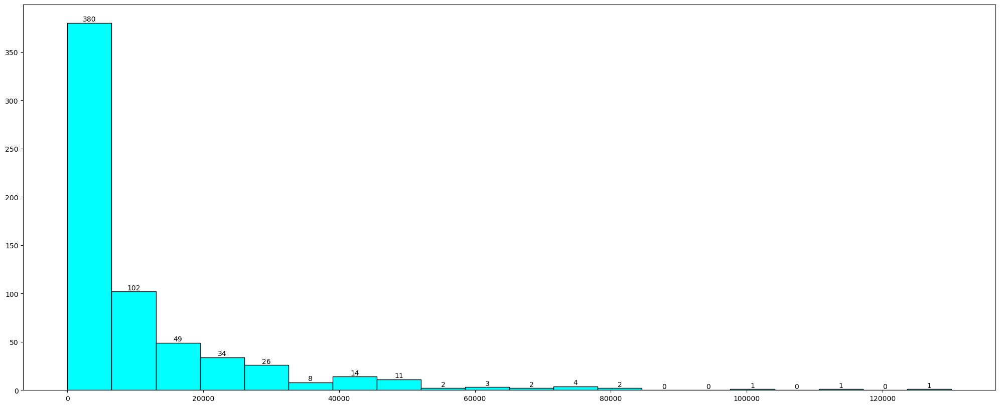

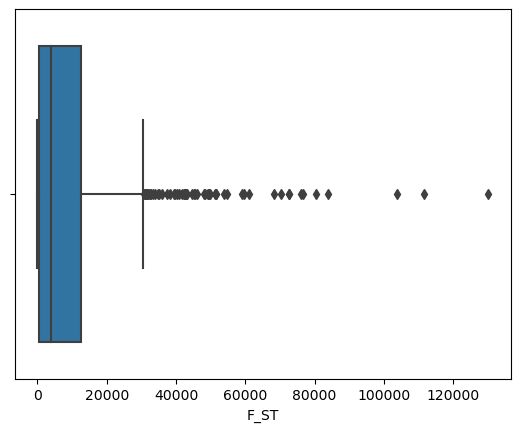

Description of M_LIT
----------------------------------------------------------------------------
count       640.000000
mean      57967.979688
std       55910.282466
min         286.000000
25%       21298.000000
50%       42693.500000
75%       77989.500000
max      403261.000000
Name: M_LIT, dtype: float64 Skew : 2.34
Distribution of M_LIT
----------------------------------------------------------------------------
BoxPlot of M_LIT
----------------------------------------------------------------------------


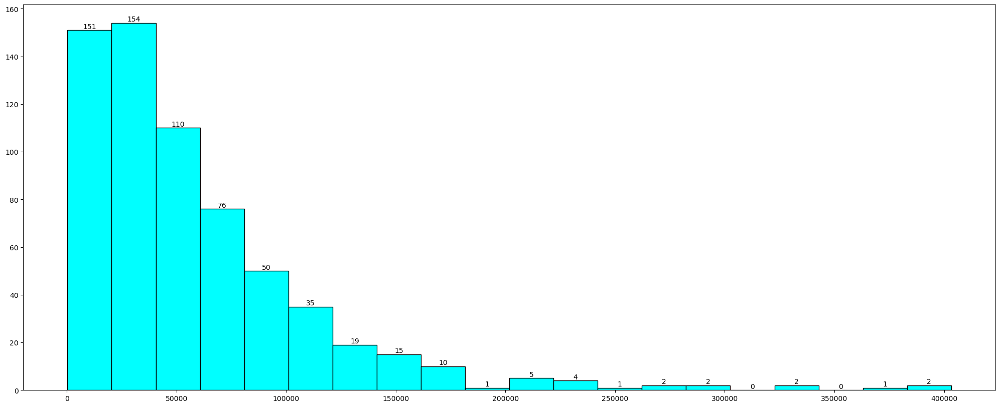

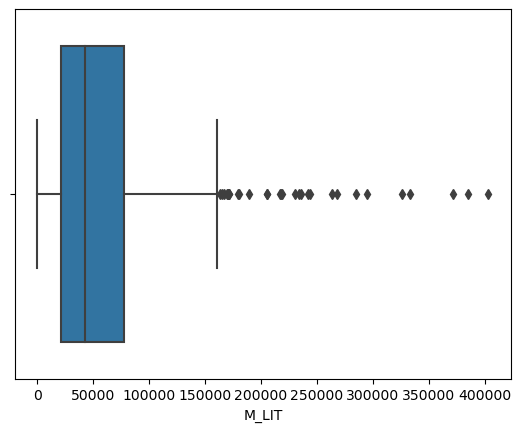

Description of F_LIT
----------------------------------------------------------------------------
count       640.000000
mean      66359.565625
std       75037.860207
min         371.000000
25%       20932.000000
50%       43796.500000
75%       84799.750000
max      571140.000000
Name: F_LIT, dtype: float64 Skew : 3.15
Distribution of F_LIT
----------------------------------------------------------------------------
BoxPlot of F_LIT
----------------------------------------------------------------------------


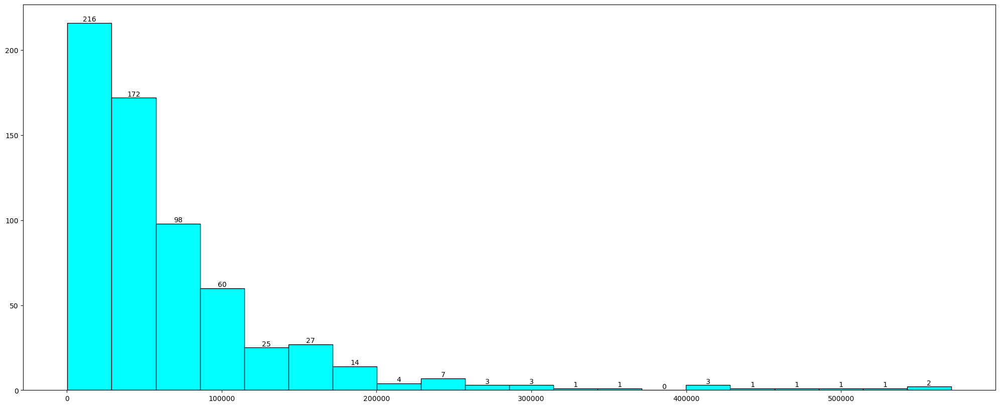

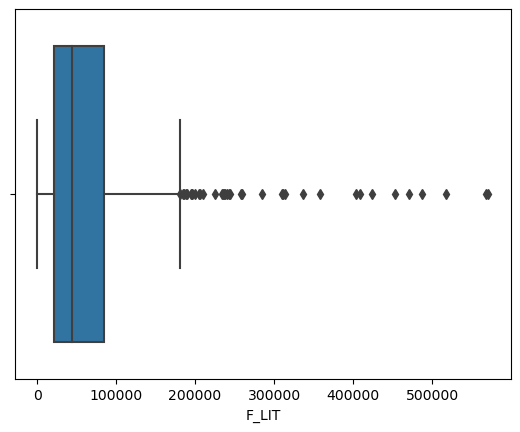

Description of M_ILL
----------------------------------------------------------------------------
count       640.000000
mean      21972.596875
std       19825.605268
min         105.000000
25%        8590.000000
50%       15767.500000
75%       29512.500000
max      105961.000000
Name: M_ILL, dtype: float64 Skew : 1.58
Distribution of M_ILL
----------------------------------------------------------------------------
BoxPlot of M_ILL
----------------------------------------------------------------------------


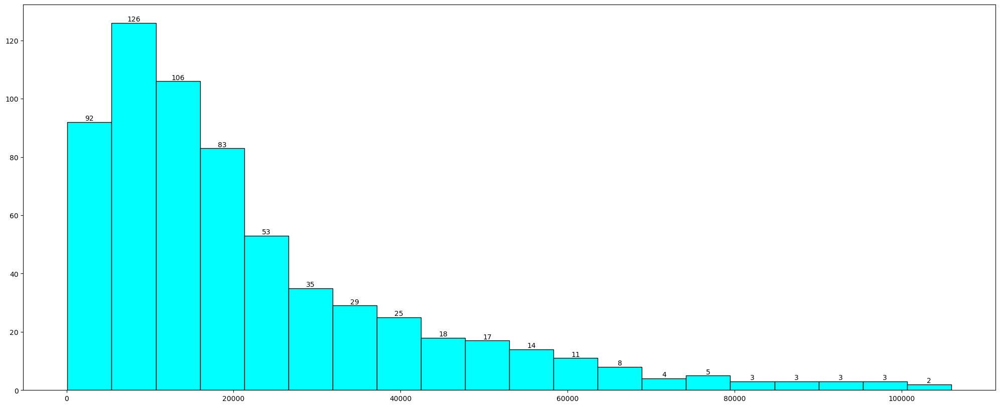

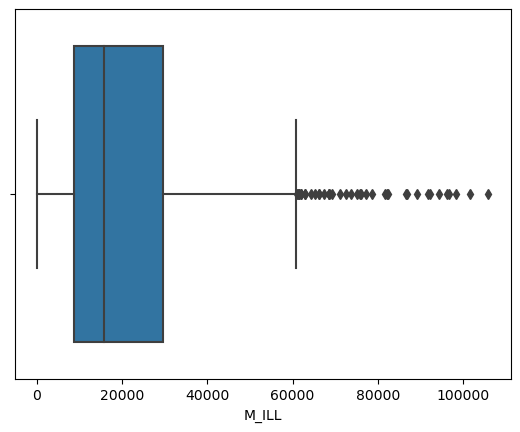

Description of F_ILL
----------------------------------------------------------------------------
count       640.000000
mean      56012.518750
std       47116.693769
min         327.000000
25%       22367.000000
50%       42386.000000
75%       78471.000000
max      254160.000000
Name: F_ILL, dtype: float64 Skew : 1.34
Distribution of F_ILL
----------------------------------------------------------------------------
BoxPlot of F_ILL
----------------------------------------------------------------------------


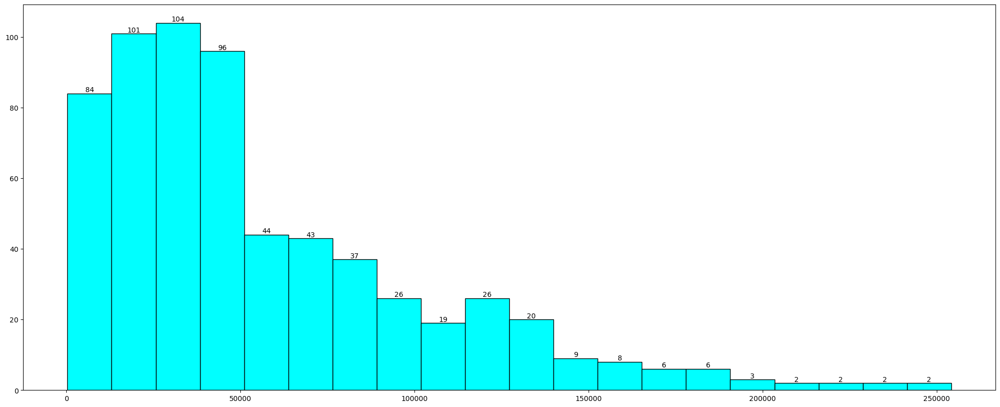

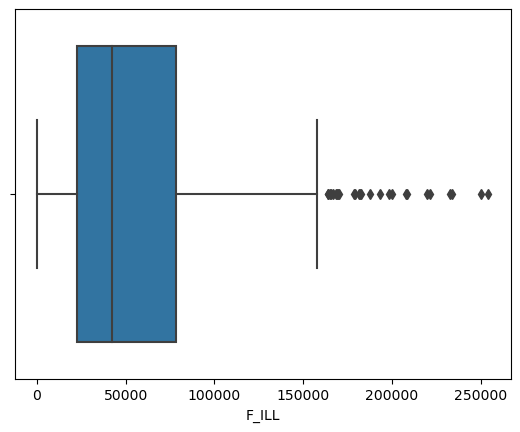

Description of TOT_WORK_M
----------------------------------------------------------------------------
count       640.000000
mean      37992.407813
std       36419.537491
min         100.000000
25%       13753.500000
50%       27936.500000
75%       50226.750000
max      269422.000000
Name: TOT_WORK_M, dtype: float64 Skew : 2.3
Distribution of TOT_WORK_M
----------------------------------------------------------------------------
BoxPlot of TOT_WORK_M
----------------------------------------------------------------------------


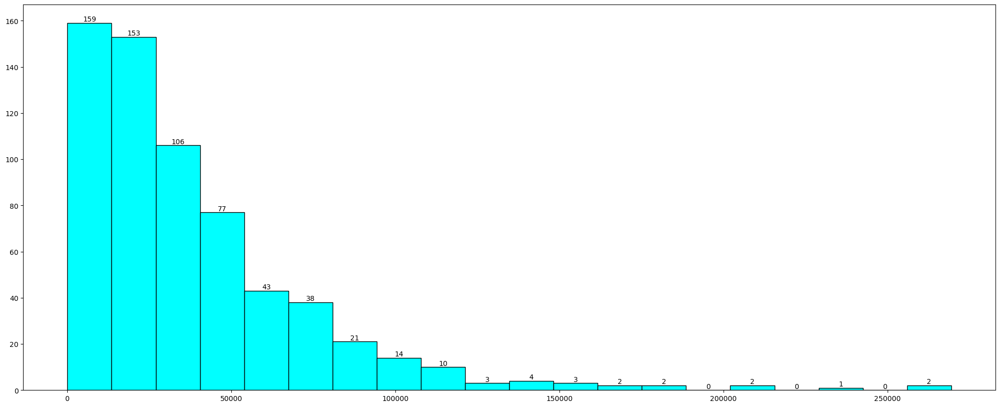

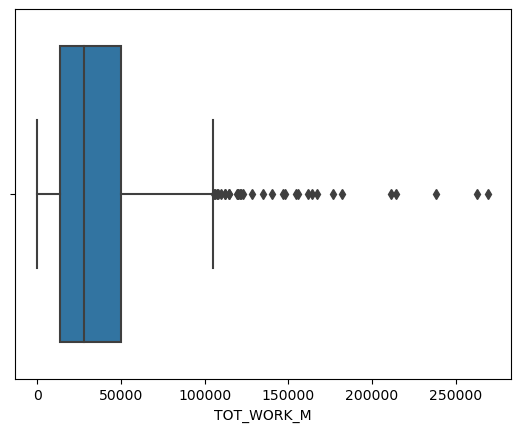

Description of TOT_WORK_F
----------------------------------------------------------------------------
count       640.000000
mean      41295.760938
std       37192.360943
min         357.000000
25%       16097.750000
50%       30588.500000
75%       53234.250000
max      257848.000000
Name: TOT_WORK_F, dtype: float64 Skew : 1.93
Distribution of TOT_WORK_F
----------------------------------------------------------------------------
BoxPlot of TOT_WORK_F
----------------------------------------------------------------------------


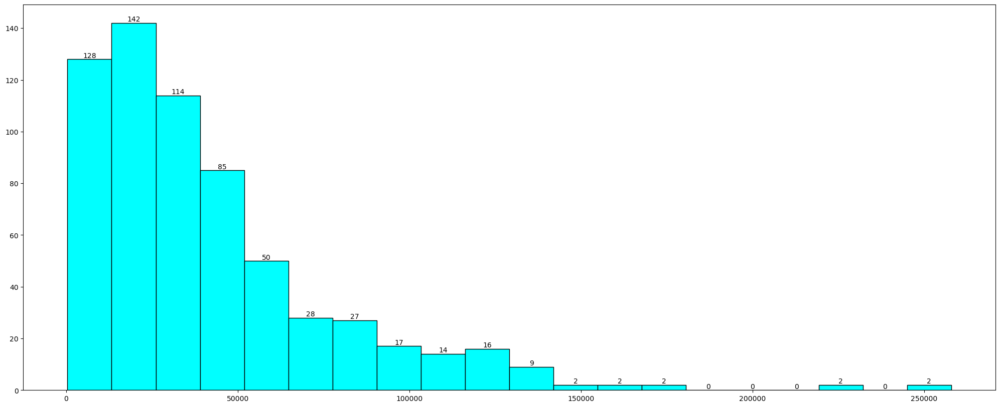

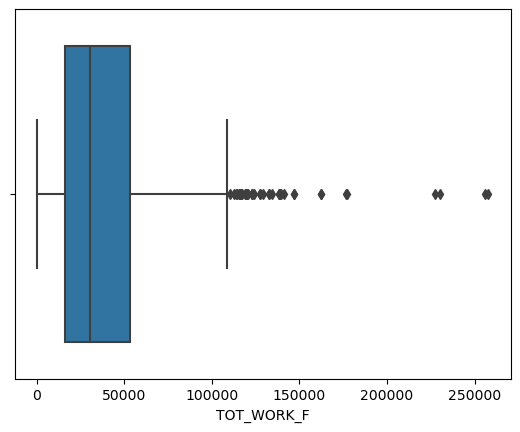

Description of MAINWORK_M
----------------------------------------------------------------------------
count       640.000000
mean      30204.446875
std       31480.915680
min          65.000000
25%        9787.000000
50%       21250.500000
75%       40119.000000
max      247911.000000
Name: MAINWORK_M, dtype: float64 Skew : 2.63
Distribution of MAINWORK_M
----------------------------------------------------------------------------
BoxPlot of MAINWORK_M
----------------------------------------------------------------------------


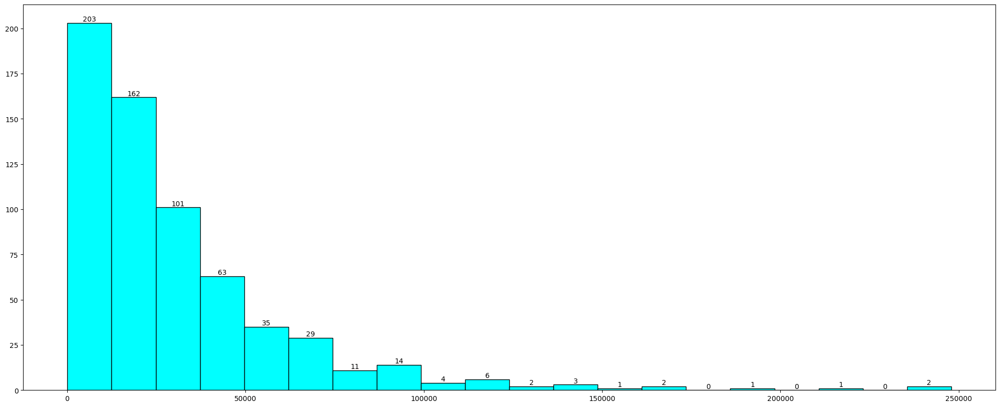

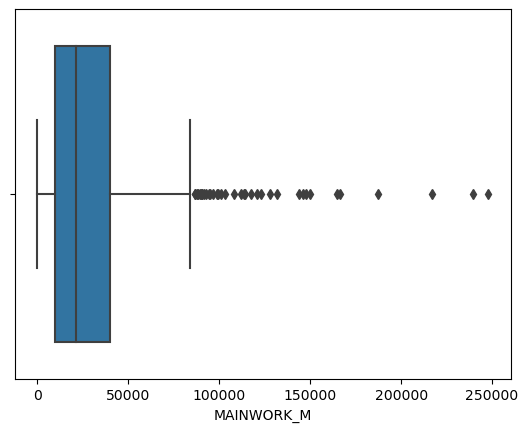

Description of MAINWORK_F
----------------------------------------------------------------------------
count       640.000000
mean      28198.846875
std       29998.262689
min         240.000000
25%        9502.250000
50%       18484.000000
75%       35063.250000
max      226166.000000
Name: MAINWORK_F, dtype: float64 Skew : 2.55
Distribution of MAINWORK_F
----------------------------------------------------------------------------
BoxPlot of MAINWORK_F
----------------------------------------------------------------------------


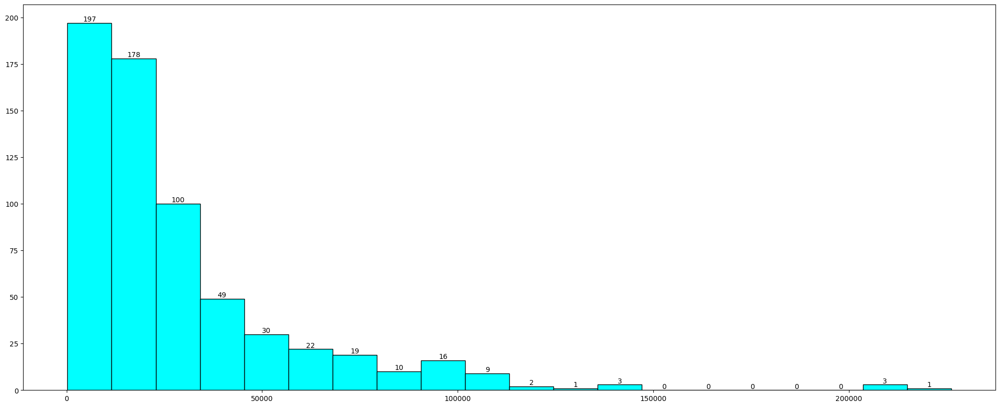

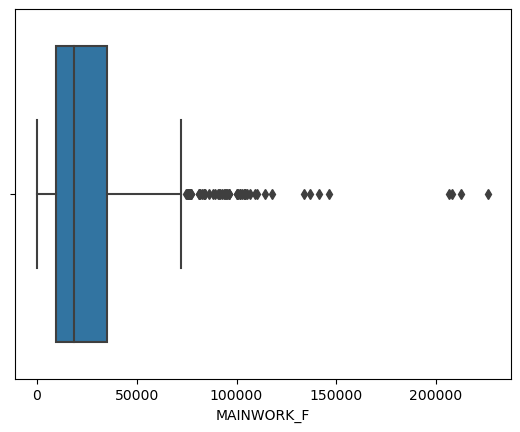

Description of MAIN_CL_M
----------------------------------------------------------------------------
count      640.000000
mean      5424.342188
std       4739.161969
min          0.000000
25%       2023.500000
50%       4160.500000
75%       7695.000000
max      29113.000000
Name: MAIN_CL_M, dtype: float64 Skew : 1.68
Distribution of MAIN_CL_M
----------------------------------------------------------------------------
BoxPlot of MAIN_CL_M
----------------------------------------------------------------------------


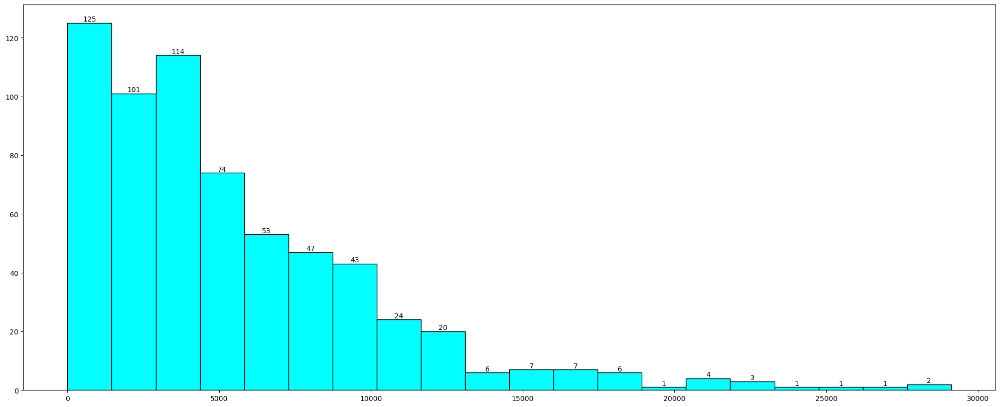

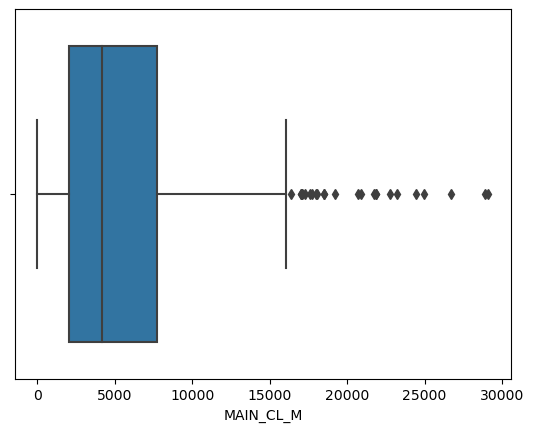

Description of MAIN_CL_F
----------------------------------------------------------------------------
count      640.000000
mean      5486.042188
std       5326.362728
min          0.000000
25%       1920.250000
50%       3908.500000
75%       7286.250000
max      36193.000000
Name: MAIN_CL_F, dtype: float64 Skew : 2.38
Distribution of MAIN_CL_F
----------------------------------------------------------------------------
BoxPlot of MAIN_CL_F
----------------------------------------------------------------------------


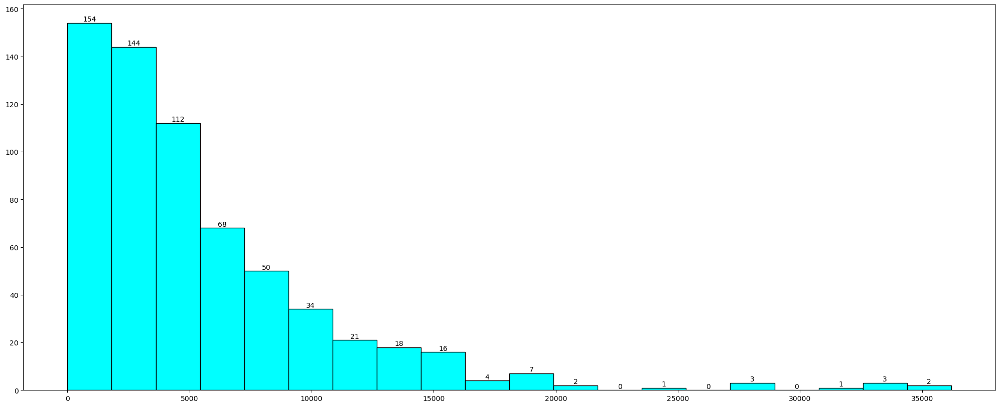

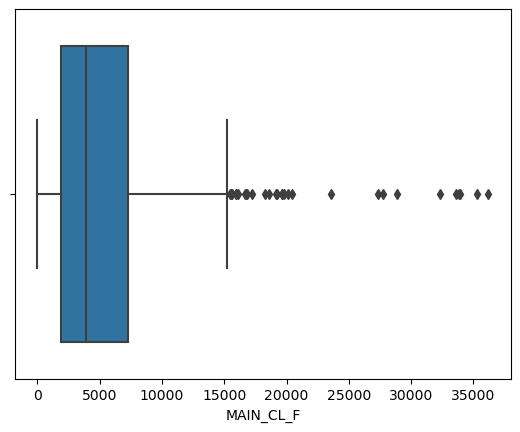

Description of MAIN_AL_M
----------------------------------------------------------------------------
count      640.000000
mean      5849.109375
std       6399.507966
min          0.000000
25%       1070.250000
50%       3936.500000
75%       8067.250000
max      40843.000000
Name: MAIN_AL_M, dtype: float64 Skew : 1.88
Distribution of MAIN_AL_M
----------------------------------------------------------------------------
BoxPlot of MAIN_AL_M
----------------------------------------------------------------------------


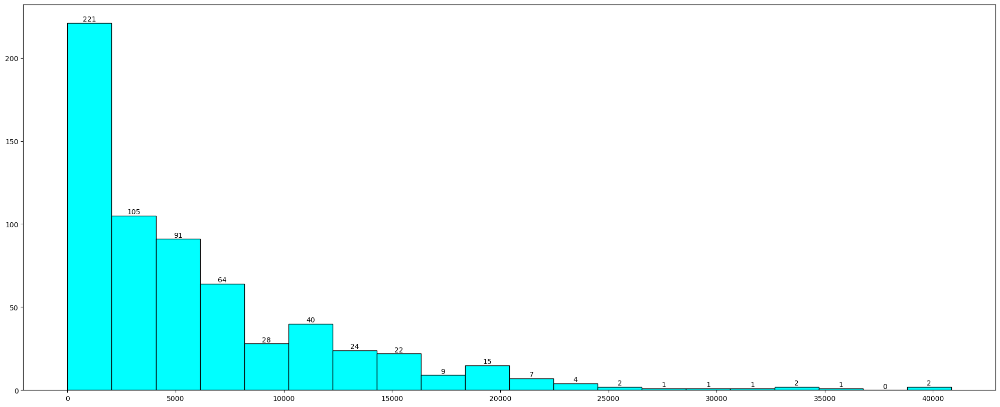

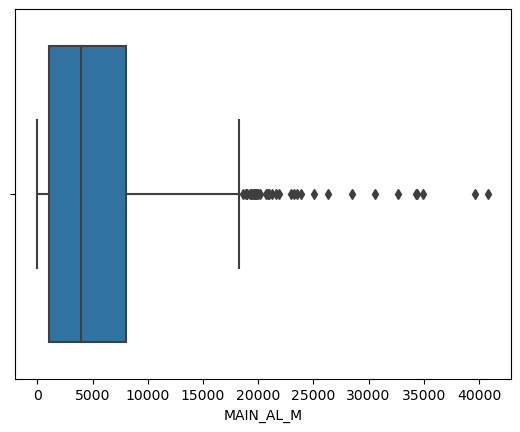

Description of MAIN_AL_F
----------------------------------------------------------------------------
count      640.000000
mean      8925.995312
std      12864.287584
min          0.000000
25%       1408.750000
50%       3933.500000
75%      10617.500000
max      87945.000000
Name: MAIN_AL_F, dtype: float64 Skew : 2.72
Distribution of MAIN_AL_F
----------------------------------------------------------------------------
BoxPlot of MAIN_AL_F
----------------------------------------------------------------------------


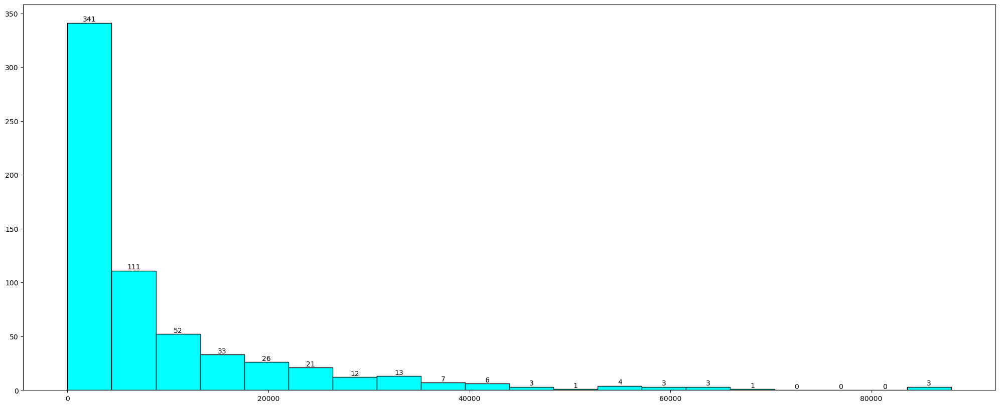

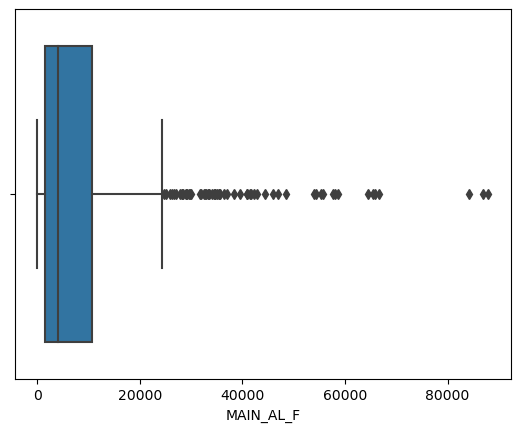

Description of MAIN_HH_M
----------------------------------------------------------------------------
count      640.000000
mean       883.893750
std       1278.642345
min          0.000000
25%        187.500000
50%        498.500000
75%       1099.250000
max      16429.000000
Name: MAIN_HH_M, dtype: float64 Skew : 4.88
Distribution of MAIN_HH_M
----------------------------------------------------------------------------
BoxPlot of MAIN_HH_M
----------------------------------------------------------------------------


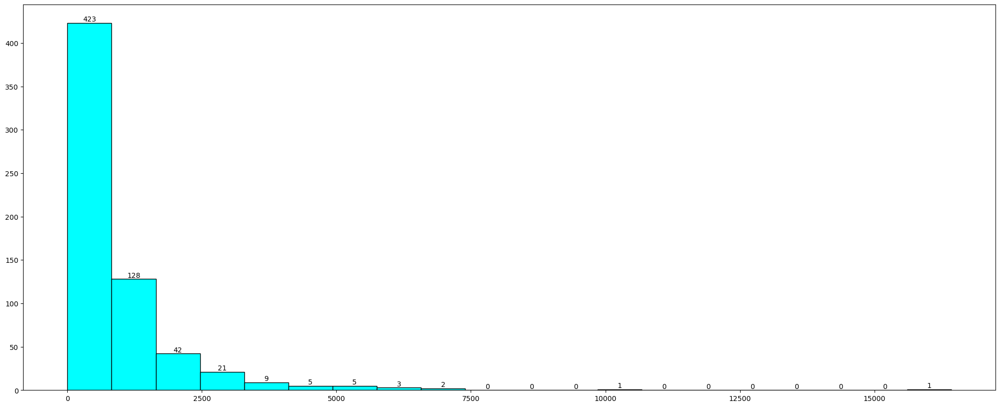

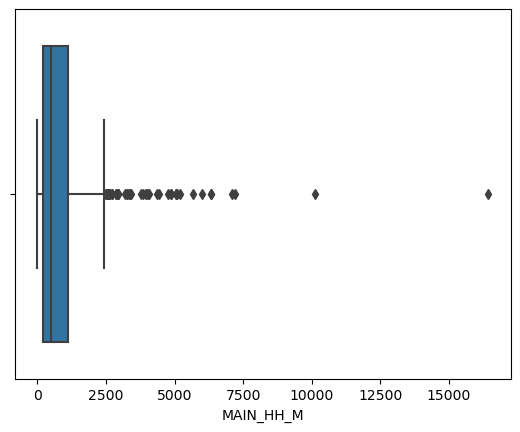

Description of MAIN_HH_F
----------------------------------------------------------------------------
count      640.000000
mean      1380.773438
std       3179.414449
min          0.000000
25%        248.750000
50%        540.500000
75%       1435.750000
max      45979.000000
Name: MAIN_HH_F, dtype: float64 Skew : 8.58
Distribution of MAIN_HH_F
----------------------------------------------------------------------------
BoxPlot of MAIN_HH_F
----------------------------------------------------------------------------


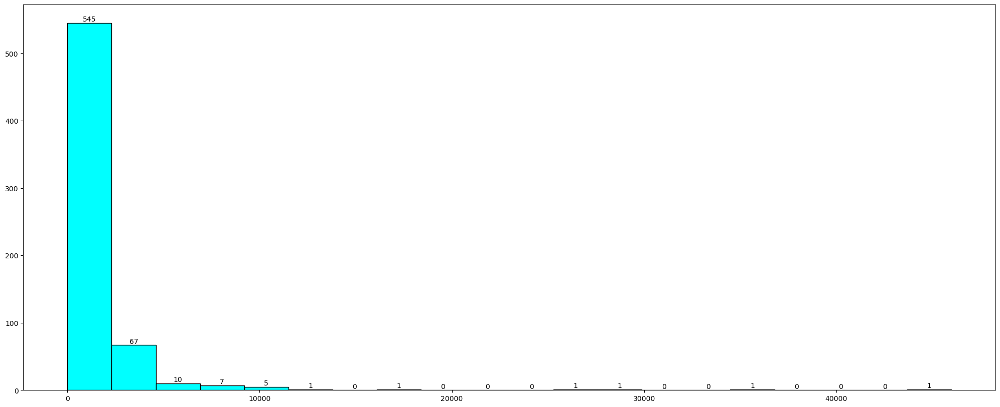

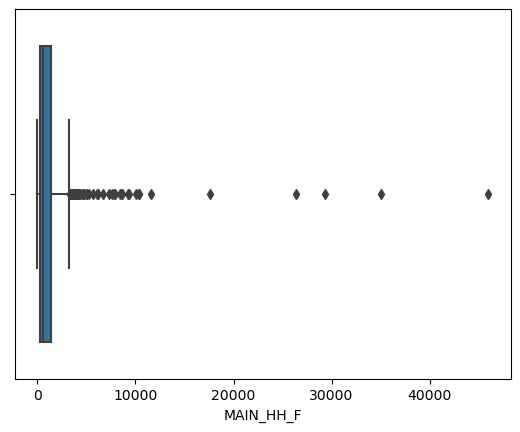

Description of MAIN_OT_M
----------------------------------------------------------------------------
count       640.000000
mean      18047.101562
std       26068.480886
min          36.000000
25%        3997.500000
50%        9598.000000
75%       21249.500000
max      240855.000000
Name: MAIN_OT_M, dtype: float64 Skew : 3.89
Distribution of MAIN_OT_M
----------------------------------------------------------------------------
BoxPlot of MAIN_OT_M
----------------------------------------------------------------------------


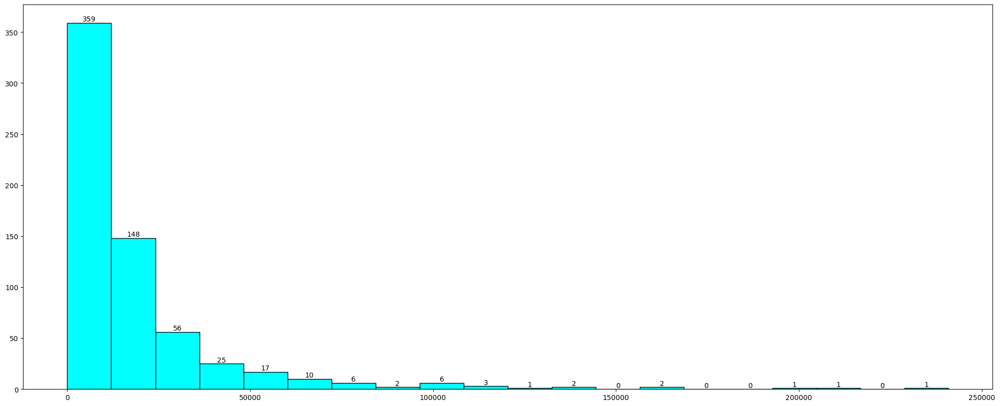

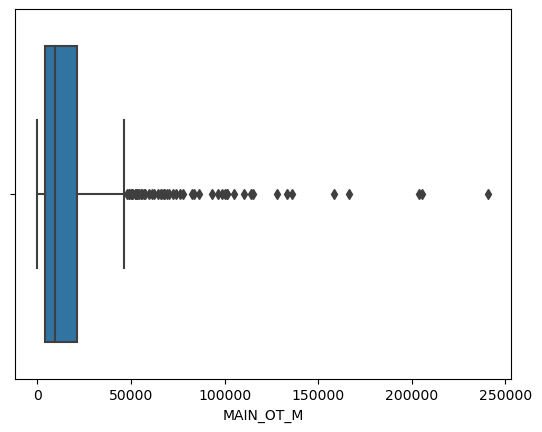

Description of MAIN_OT_F
----------------------------------------------------------------------------
count       640.000000
mean      12406.035938
std       18972.202369
min         153.000000
25%        3142.500000
50%        6380.500000
75%       14368.250000
max      209355.000000
Name: MAIN_OT_F, dtype: float64 Skew : 5.34
Distribution of MAIN_OT_F
----------------------------------------------------------------------------
BoxPlot of MAIN_OT_F
----------------------------------------------------------------------------


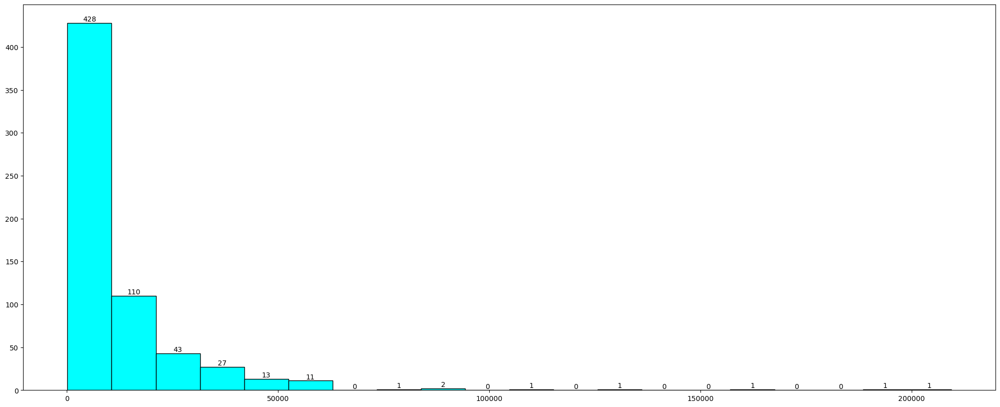

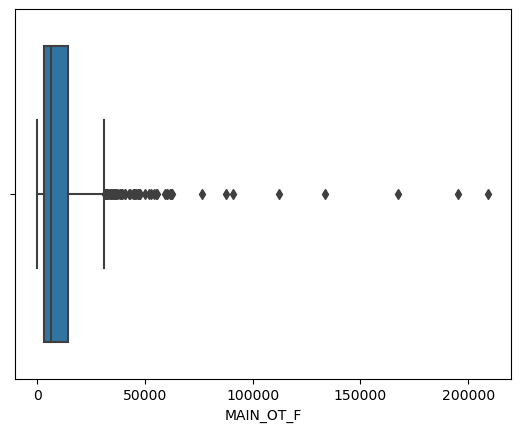

Description of MARGWORK_M
----------------------------------------------------------------------------
count      640.000000
mean      7787.960938
std       7410.791691
min         35.000000
25%       2937.500000
50%       5627.000000
75%       9800.250000
max      47553.000000
Name: MARGWORK_M, dtype: float64 Skew : 2.0
Distribution of MARGWORK_M
----------------------------------------------------------------------------
BoxPlot of MARGWORK_M
----------------------------------------------------------------------------


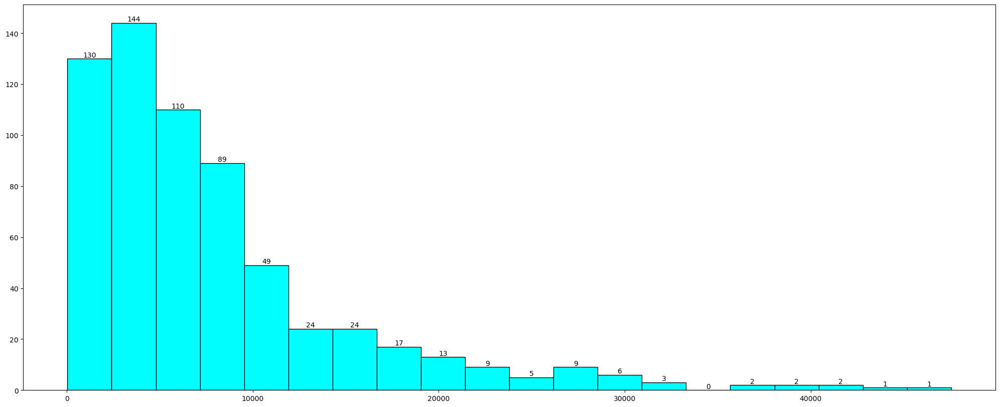

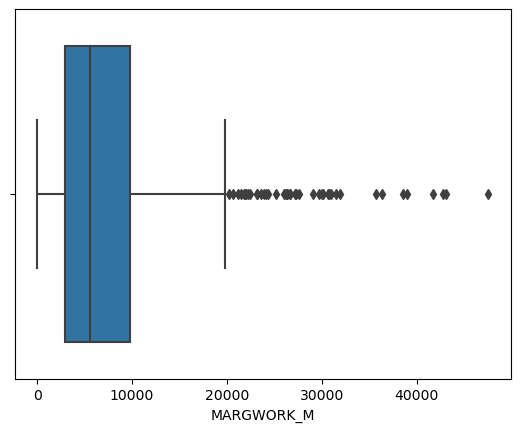

Description of MARGWORK_F
----------------------------------------------------------------------------
count      640.000000
mean     13096.914062
std      10996.474528
min        117.000000
25%       5424.500000
50%      10175.000000
75%      18879.250000
max      66915.000000
Name: MARGWORK_F, dtype: float64 Skew : 1.52
Distribution of MARGWORK_F
----------------------------------------------------------------------------
BoxPlot of MARGWORK_F
----------------------------------------------------------------------------


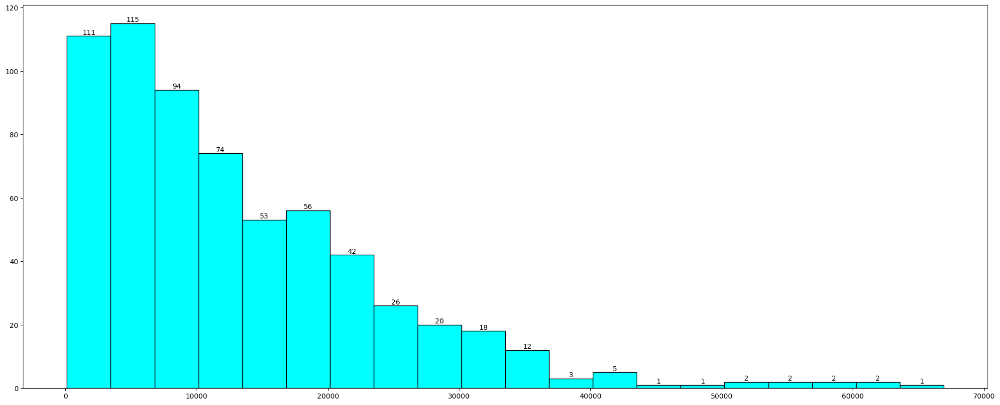

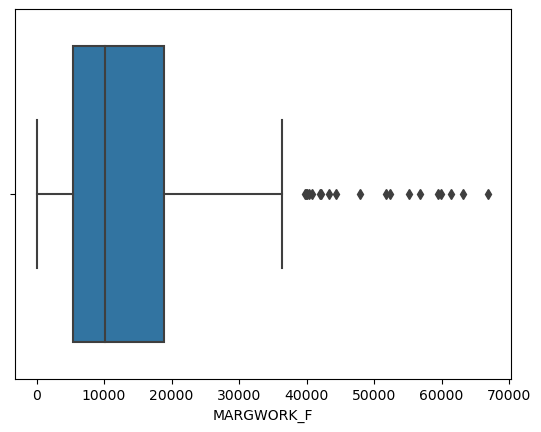

Description of MARG_CL_M
----------------------------------------------------------------------------
count      640.000000
mean      1040.737500
std       1311.546847
min          0.000000
25%        311.750000
50%        606.500000
75%       1281.000000
max      13201.000000
Name: MARG_CL_M, dtype: float64 Skew : 3.63
Distribution of MARG_CL_M
----------------------------------------------------------------------------
BoxPlot of MARG_CL_M
----------------------------------------------------------------------------


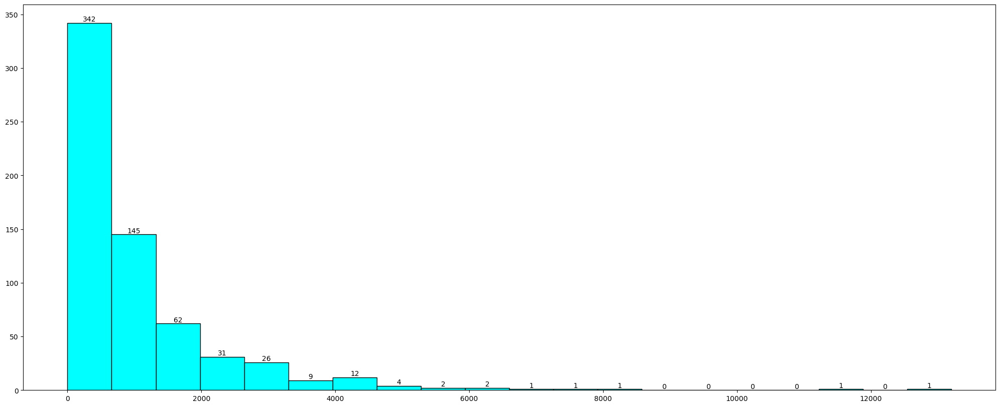

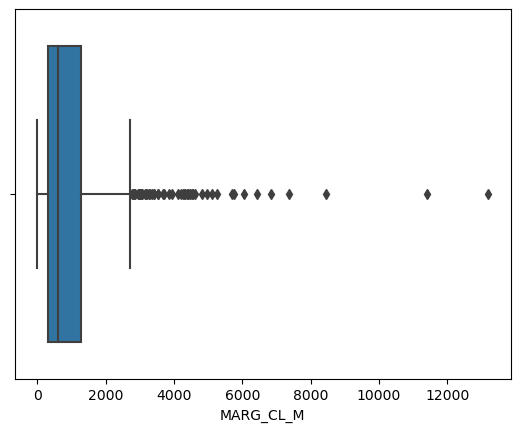

Description of MARG_CL_F
----------------------------------------------------------------------------
count      640.000000
mean      2307.682813
std       3564.626095
min          0.000000
25%        630.250000
50%       1226.000000
75%       2659.250000
max      44324.000000
Name: MARG_CL_F, dtype: float64 Skew : 5.51
Distribution of MARG_CL_F
----------------------------------------------------------------------------
BoxPlot of MARG_CL_F
----------------------------------------------------------------------------


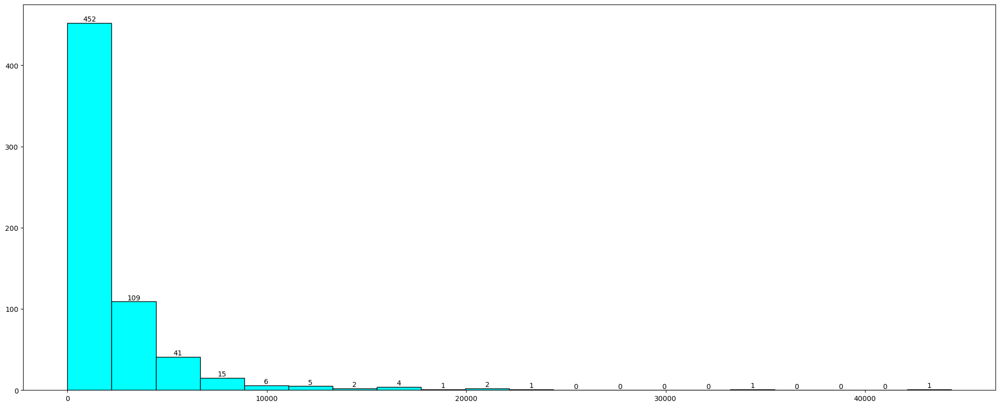

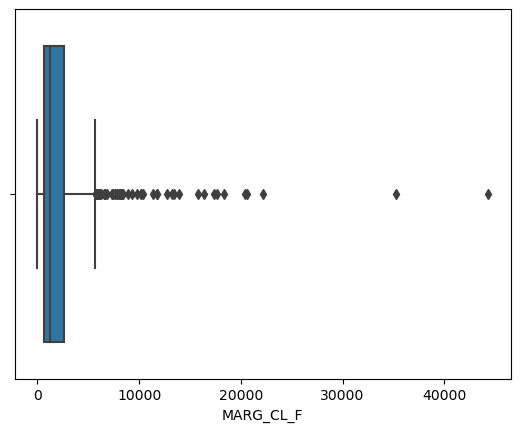

Description of MARG_AL_M
----------------------------------------------------------------------------
count      640.000000
mean      3304.326562
std       3781.555707
min          0.000000
25%        873.500000
50%       2062.000000
75%       4300.750000
max      23719.000000
Name: MARG_AL_M, dtype: float64 Skew : 2.22
Distribution of MARG_AL_M
----------------------------------------------------------------------------
BoxPlot of MARG_AL_M
----------------------------------------------------------------------------


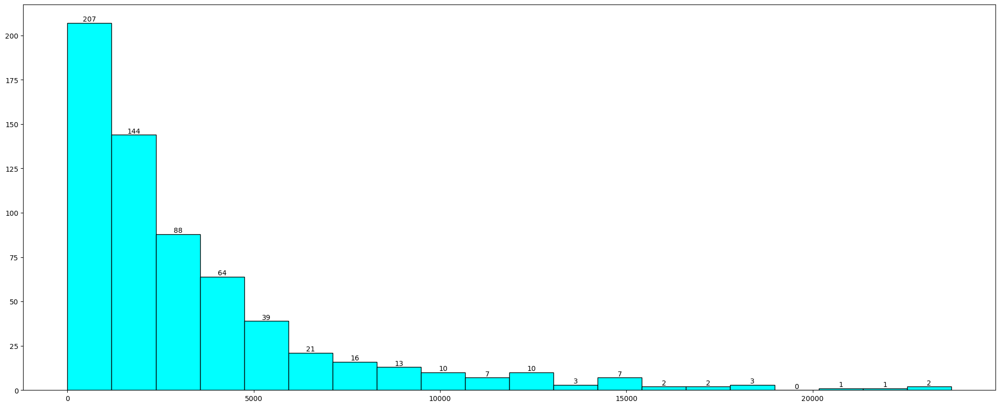

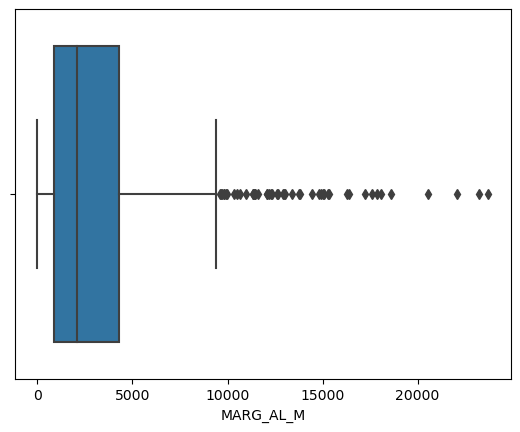

Description of MARG_AL_F
----------------------------------------------------------------------------
count      640.000000
mean      6463.281250
std       6773.876298
min          0.000000
25%       1402.500000
50%       4020.500000
75%       9089.250000
max      45301.000000
Name: MARG_AL_F, dtype: float64 Skew : 1.72
Distribution of MARG_AL_F
----------------------------------------------------------------------------
BoxPlot of MARG_AL_F
----------------------------------------------------------------------------


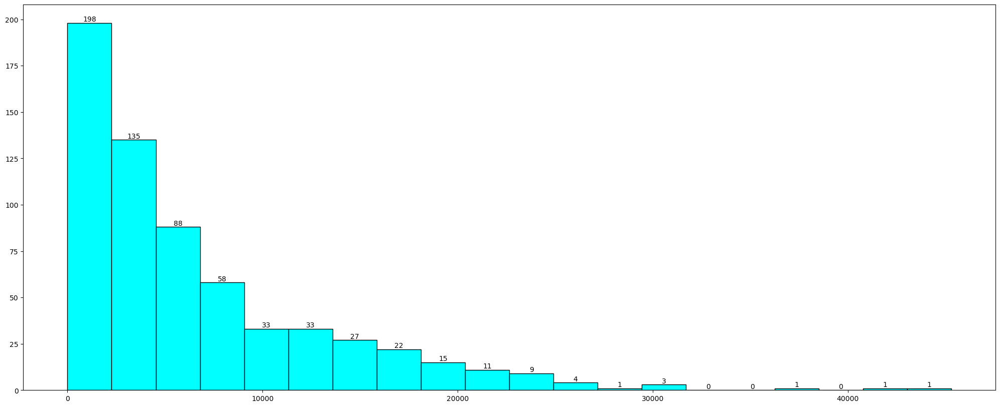

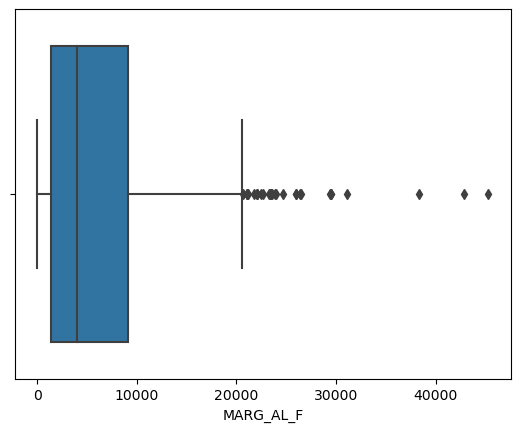

Description of MARG_HH_M
----------------------------------------------------------------------------
count     640.000000
mean      316.742188
std       462.661891
min         0.000000
25%        71.750000
50%       166.000000
75%       356.500000
max      4298.000000
Name: MARG_HH_M, dtype: float64 Skew : 3.88
Distribution of MARG_HH_M
----------------------------------------------------------------------------
BoxPlot of MARG_HH_M
----------------------------------------------------------------------------


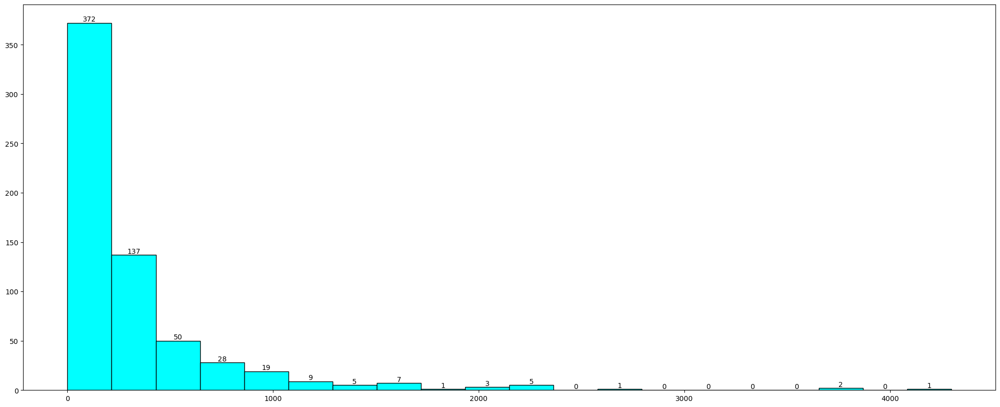

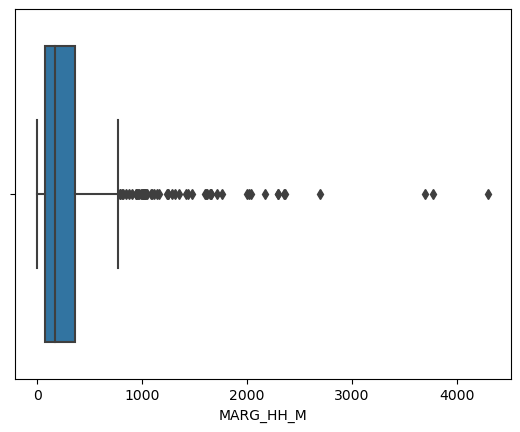

Description of MARG_HH_F
----------------------------------------------------------------------------
count      640.000000
mean       786.626562
std       1198.718213
min          0.000000
25%        171.750000
50%        429.000000
75%        962.500000
max      15448.000000
Name: MARG_HH_F, dtype: float64 Skew : 5.36
Distribution of MARG_HH_F
----------------------------------------------------------------------------
BoxPlot of MARG_HH_F
----------------------------------------------------------------------------


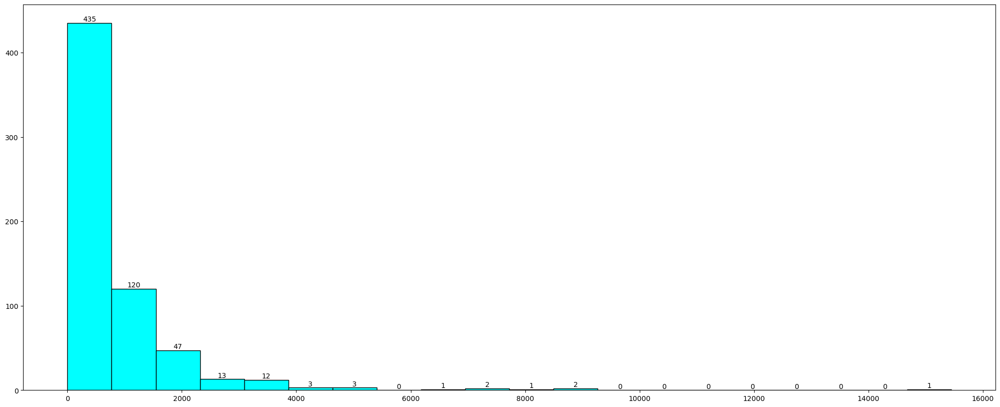

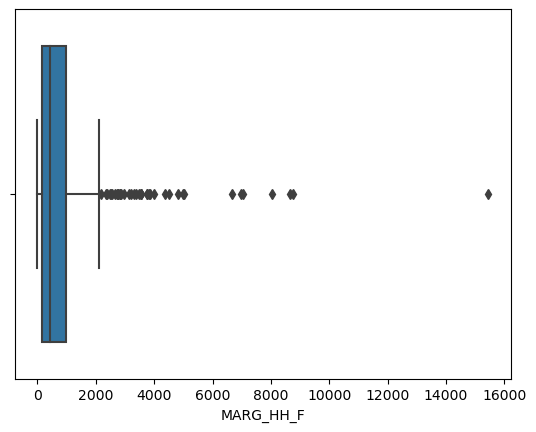

Description of MARG_OT_M
----------------------------------------------------------------------------
count      640.000000
mean      3126.154687
std       3609.391821
min          7.000000
25%        935.500000
50%       2036.000000
75%       3985.250000
max      24728.000000
Name: MARG_OT_M, dtype: float64 Skew : 2.7
Distribution of MARG_OT_M
----------------------------------------------------------------------------
BoxPlot of MARG_OT_M
----------------------------------------------------------------------------


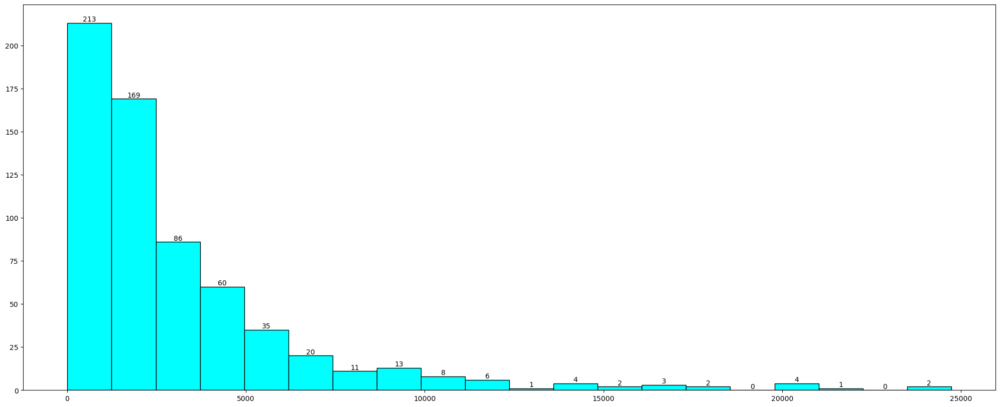

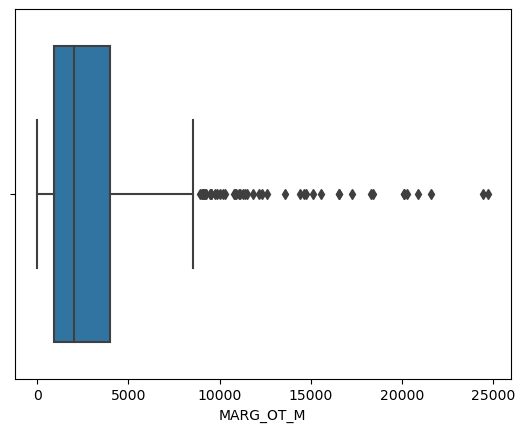

Description of MARG_OT_F
----------------------------------------------------------------------------
count      640.000000
mean      3539.323438
std       4115.191314
min         19.000000
25%       1071.750000
50%       2349.500000
75%       4400.500000
max      36377.000000
Name: MARG_OT_F, dtype: float64 Skew : 3.06
Distribution of MARG_OT_F
----------------------------------------------------------------------------
BoxPlot of MARG_OT_F
----------------------------------------------------------------------------


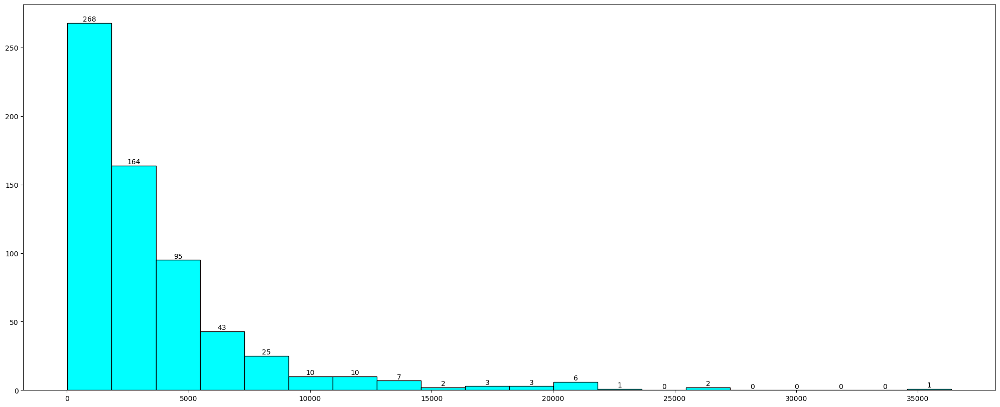

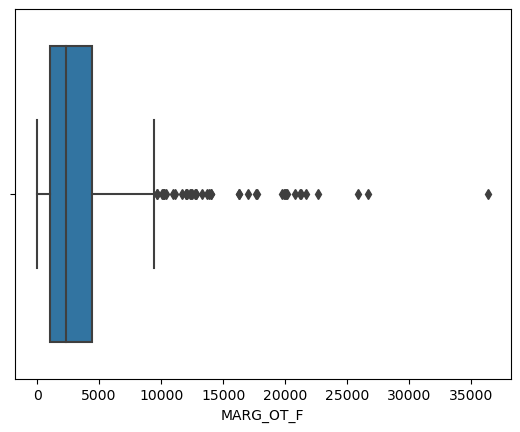

Description of MARGWORK_3_6_M
----------------------------------------------------------------------------
count       640.000000
mean      41948.168750
std       39045.316918
min         291.000000
25%       16208.250000
50%       30315.000000
75%       57218.750000
max      300937.000000
Name: MARGWORK_3_6_M, dtype: float64 Skew : 2.15
Distribution of MARGWORK_3_6_M
----------------------------------------------------------------------------
BoxPlot of MARGWORK_3_6_M
----------------------------------------------------------------------------


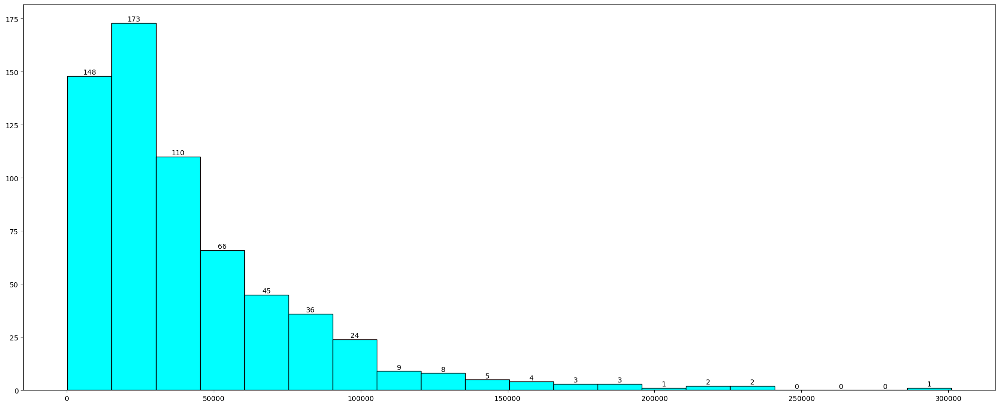

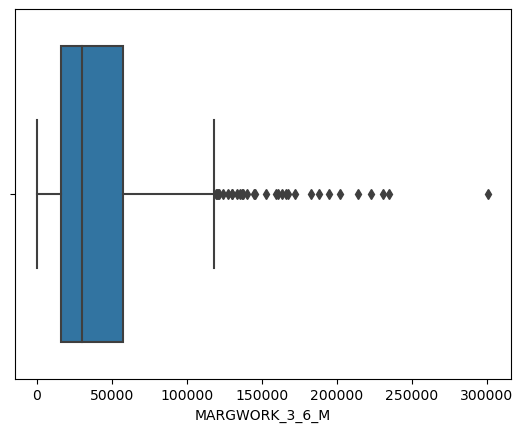

Description of MARGWORK_3_6_F
----------------------------------------------------------------------------
count       640.000000
mean      81076.323438
std       82970.406216
min         341.000000
25%       26619.500000
50%       56793.000000
75%      107924.000000
max      676450.000000
Name: MARGWORK_3_6_F, dtype: float64 Skew : 2.54
Distribution of MARGWORK_3_6_F
----------------------------------------------------------------------------
BoxPlot of MARGWORK_3_6_F
----------------------------------------------------------------------------


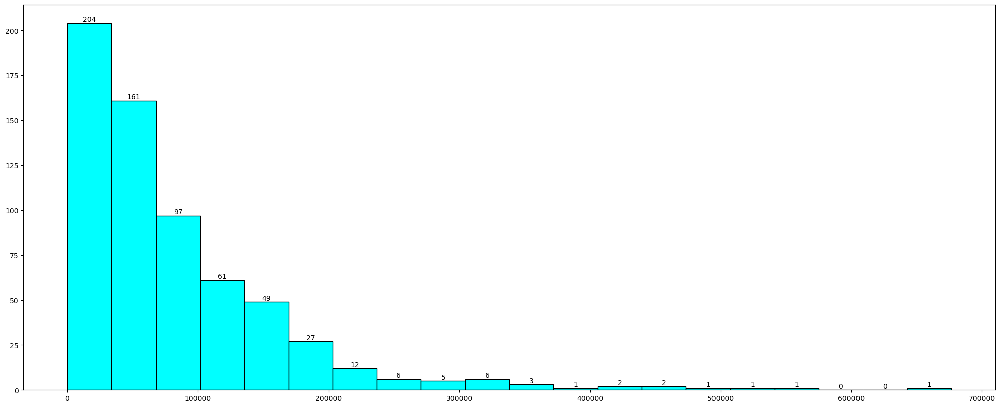

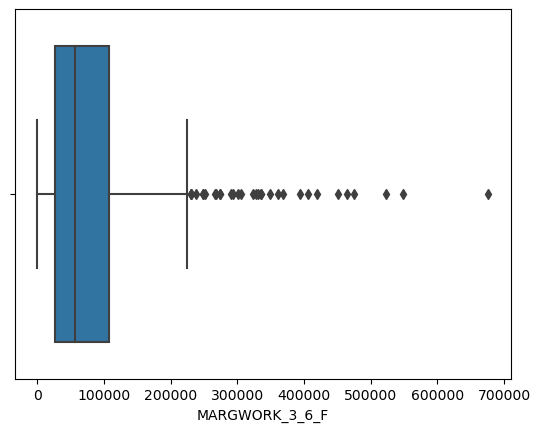

Description of MARG_CL_3_6_M
----------------------------------------------------------------------------
count      640.000000
mean      6394.987500
std       6019.806644
min         27.000000
25%       2372.000000
50%       4630.000000
75%       8167.000000
max      39106.000000
Name: MARG_CL_3_6_M, dtype: float64 Skew : 1.89
Distribution of MARG_CL_3_6_M
----------------------------------------------------------------------------
BoxPlot of MARG_CL_3_6_M
----------------------------------------------------------------------------


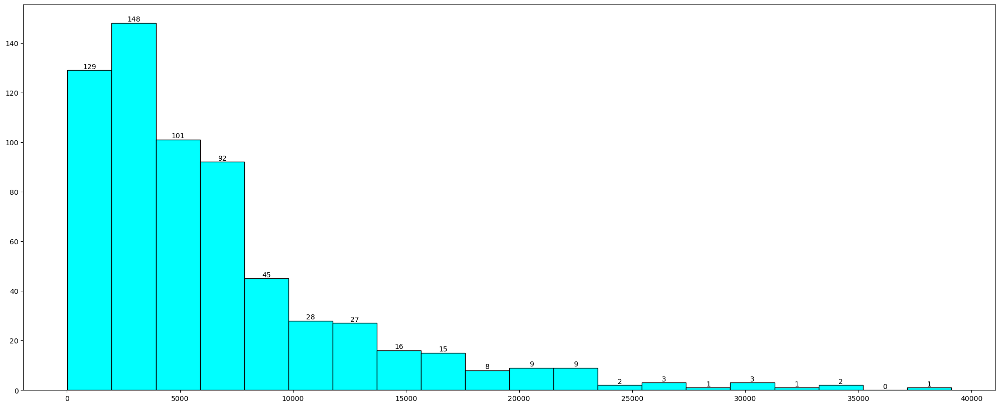

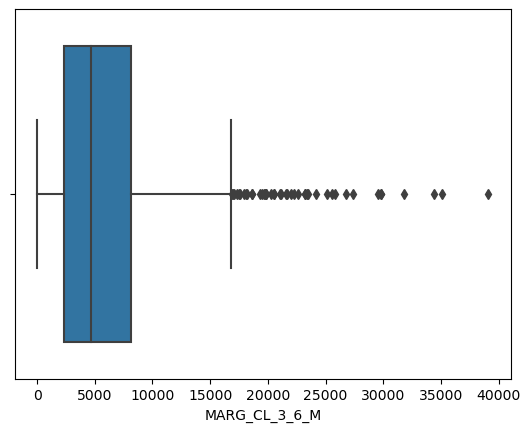

Description of MARG_CL_3_6_F
----------------------------------------------------------------------------
count      640.000000
mean     10339.864063
std       8467.473429
min         85.000000
25%       4351.500000
50%       8295.000000
75%      15102.000000
max      50065.000000
Name: MARG_CL_3_6_F, dtype: float64 Skew : 1.35
Distribution of MARG_CL_3_6_F
----------------------------------------------------------------------------
BoxPlot of MARG_CL_3_6_F
----------------------------------------------------------------------------


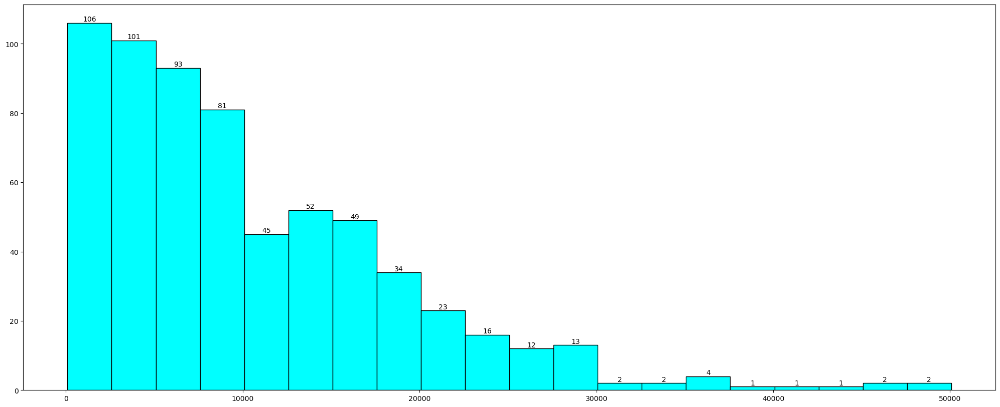

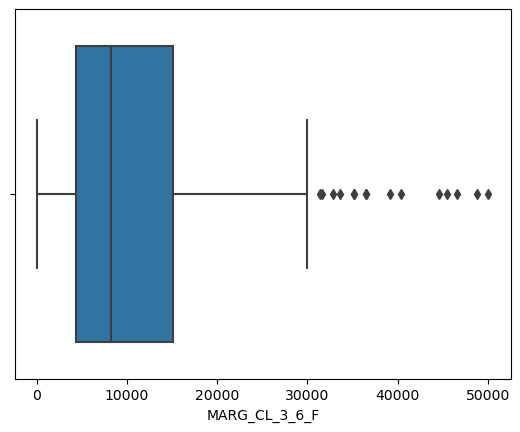

Description of MARG_AL_3_6_M
----------------------------------------------------------------------------
count     640.000000
mean      789.848438
std       905.639279
min         0.000000
25%       235.500000
50%       480.500000
75%       986.000000
max      7426.000000
Name: MARG_AL_3_6_M, dtype: float64 Skew : 2.83
Distribution of MARG_AL_3_6_M
----------------------------------------------------------------------------
BoxPlot of MARG_AL_3_6_M
----------------------------------------------------------------------------


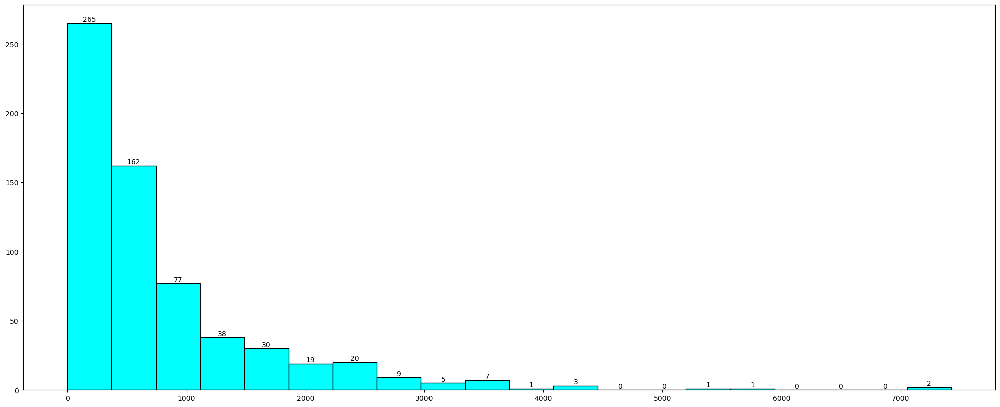

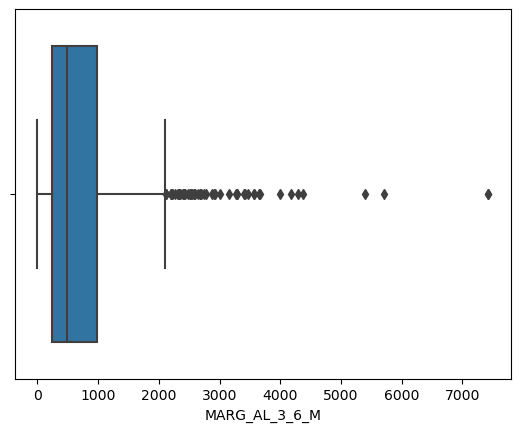

Description of MARG_AL_3_6_F
----------------------------------------------------------------------------
count      640.000000
mean      1749.584375
std       2496.541514
min          0.000000
25%        497.250000
50%        985.500000
75%       2059.000000
max      27171.000000
Name: MARG_AL_3_6_F, dtype: float64 Skew : 4.72
Distribution of MARG_AL_3_6_F
----------------------------------------------------------------------------
BoxPlot of MARG_AL_3_6_F
----------------------------------------------------------------------------


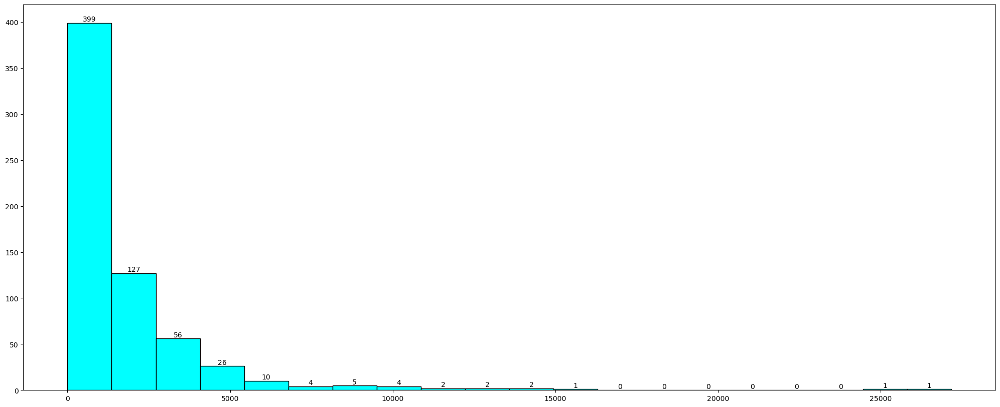

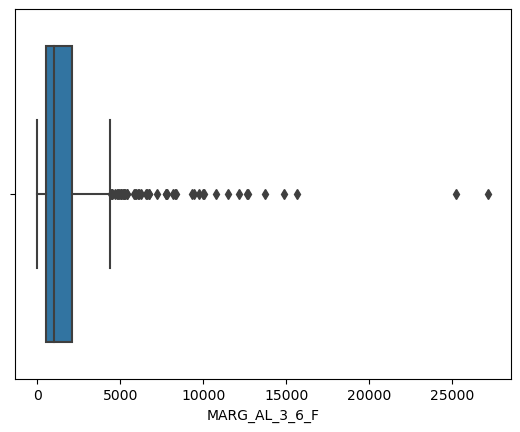

Description of MARG_HH_3_6_M
----------------------------------------------------------------------------
count      640.000000
mean      2743.635938
std       3059.586387
min          0.000000
25%        718.750000
50%       1714.500000
75%       3702.250000
max      19343.000000
Name: MARG_HH_3_6_M, dtype: float64 Skew : 2.07
Distribution of MARG_HH_3_6_M
----------------------------------------------------------------------------
BoxPlot of MARG_HH_3_6_M
----------------------------------------------------------------------------


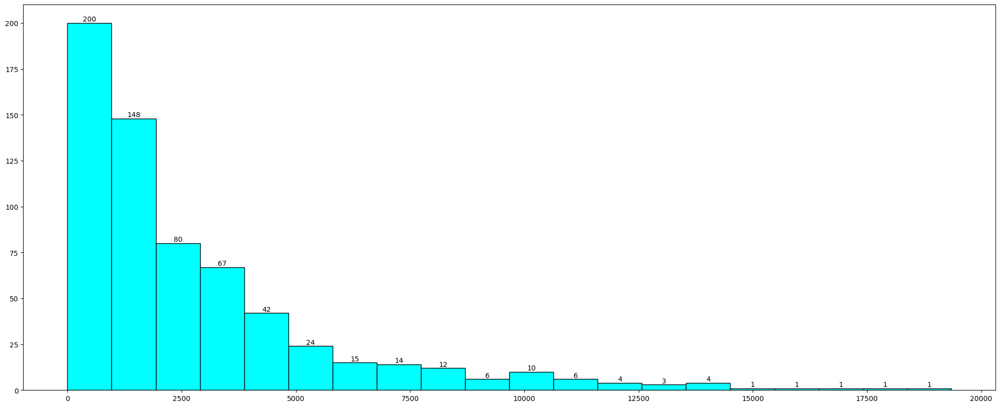

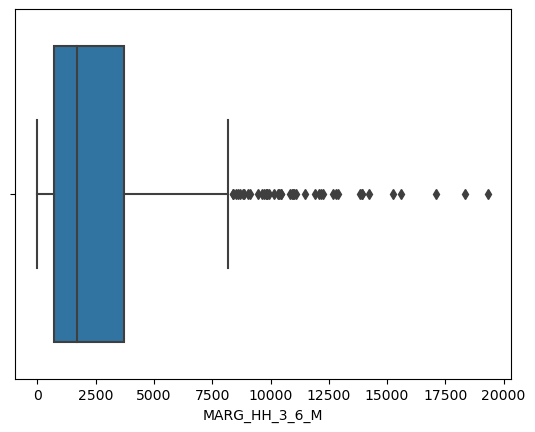

Description of MARG_HH_3_6_F
----------------------------------------------------------------------------
count      640.00000
mean      5169.85000
std       5335.64096
min          0.00000
25%       1113.75000
50%       3294.00000
75%       7502.25000
max      36253.00000
Name: MARG_HH_3_6_F, dtype: float64 Skew : 1.59
Distribution of MARG_HH_3_6_F
----------------------------------------------------------------------------
BoxPlot of MARG_HH_3_6_F
----------------------------------------------------------------------------


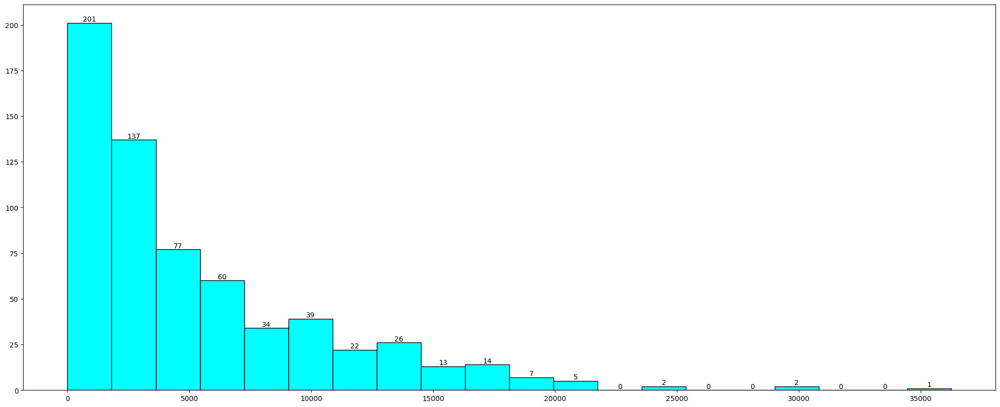

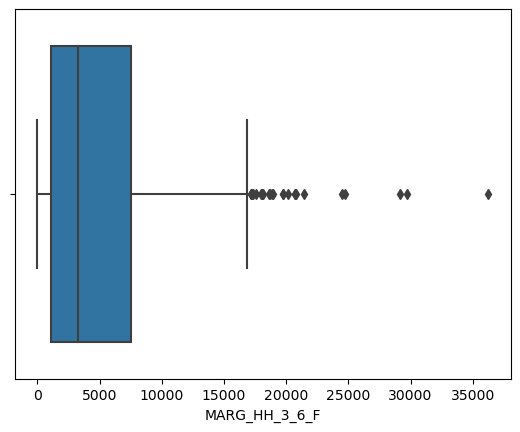

Description of MARG_OT_3_6_M
----------------------------------------------------------------------------
count     640.000000
mean      245.362500
std       358.728567
min         0.000000
25%        58.000000
50%       129.500000
75%       276.000000
max      3535.000000
Name: MARG_OT_3_6_M, dtype: float64 Skew : 3.99
Distribution of MARG_OT_3_6_M
----------------------------------------------------------------------------
BoxPlot of MARG_OT_3_6_M
----------------------------------------------------------------------------


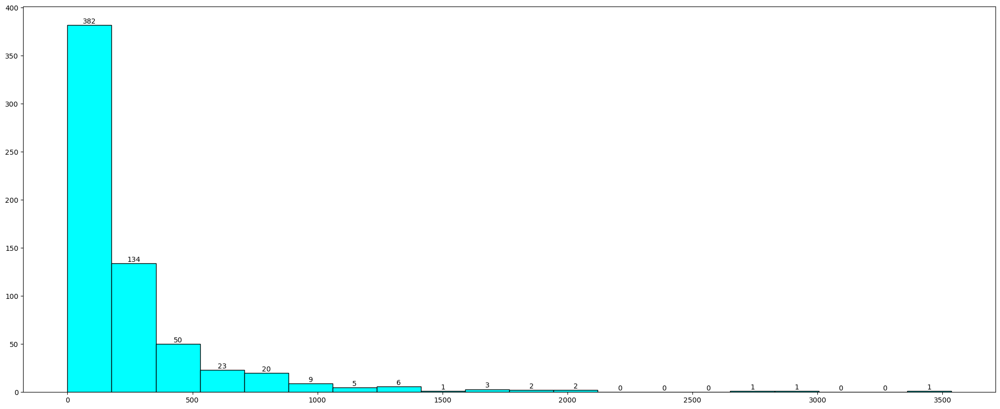

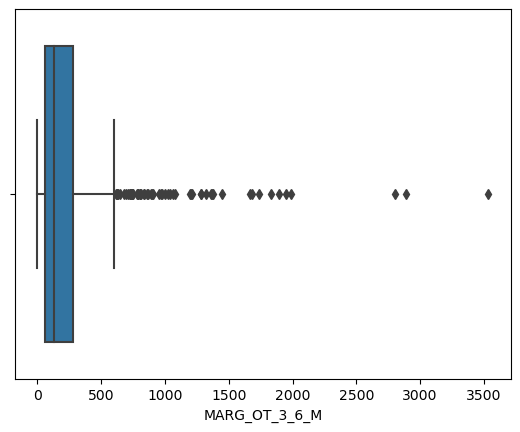

Description of MARG_OT_3_6_F
----------------------------------------------------------------------------
count      640.000000
mean       585.884375
std        900.025817
min          0.000000
25%        127.750000
50%        320.500000
75%        719.250000
max      12094.000000
Name: MARG_OT_3_6_F, dtype: float64 Skew : 5.61
Distribution of MARG_OT_3_6_F
----------------------------------------------------------------------------
BoxPlot of MARG_OT_3_6_F
----------------------------------------------------------------------------


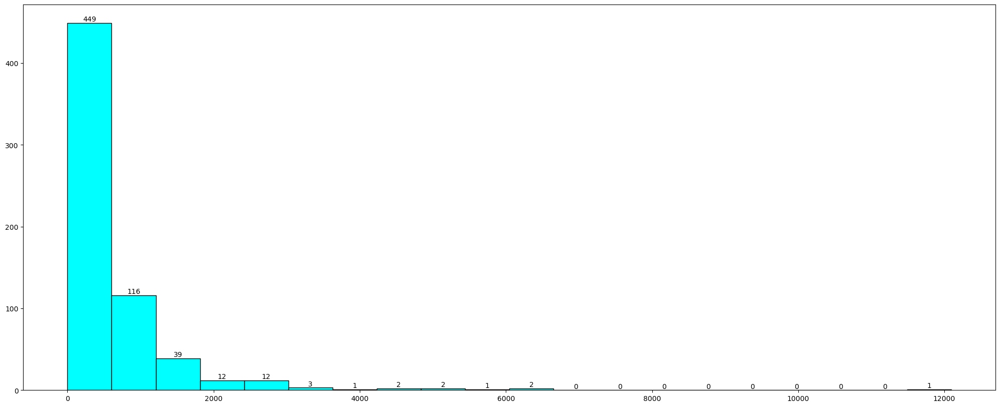

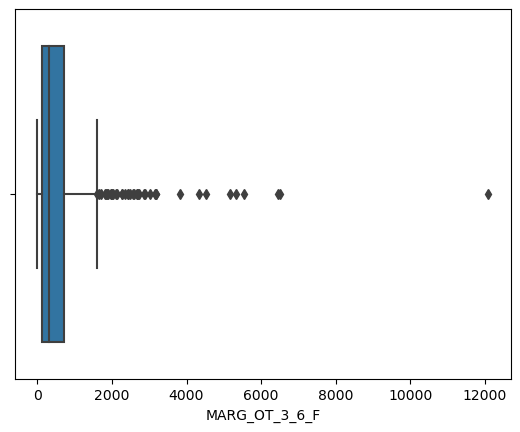

Description of MARGWORK_0_3_M
----------------------------------------------------------------------------
count      640.000000
mean      2616.140625
std       3036.964381
min          7.000000
25%        755.000000
50%       1681.500000
75%       3320.250000
max      20648.000000
Name: MARGWORK_0_3_M, dtype: float64 Skew : 2.69
Distribution of MARGWORK_0_3_M
----------------------------------------------------------------------------
BoxPlot of MARGWORK_0_3_M
----------------------------------------------------------------------------


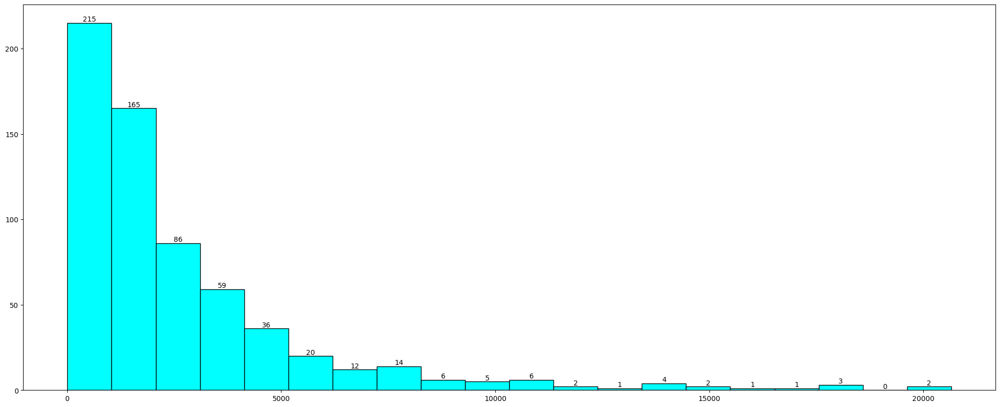

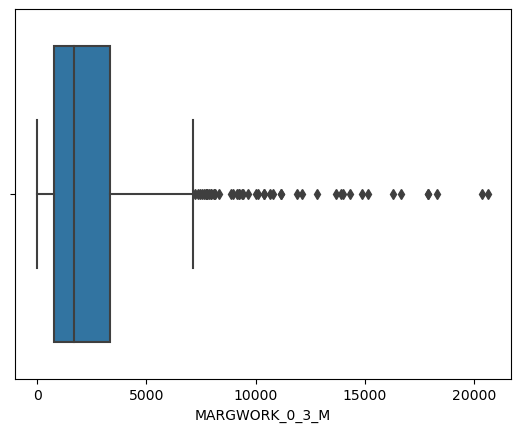

Description of MARGWORK_0_3_F
----------------------------------------------------------------------------
count      640.000000
mean      2834.545312
std       3327.836932
min         14.000000
25%        833.500000
50%       1834.500000
75%       3610.500000
max      25844.000000
Name: MARGWORK_0_3_F, dtype: float64 Skew : 3.04
Distribution of MARGWORK_0_3_F
----------------------------------------------------------------------------
BoxPlot of MARGWORK_0_3_F
----------------------------------------------------------------------------


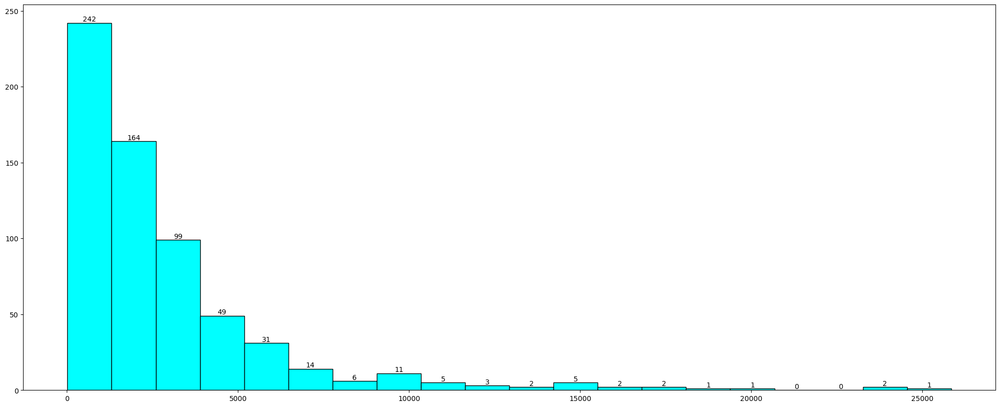

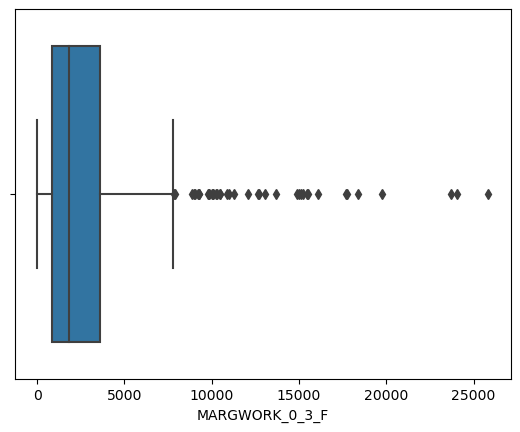

Description of MARG_CL_0_3_M
----------------------------------------------------------------------------
count     640.000000
mean     1392.973438
std      1489.707052
min         4.000000
25%       489.500000
50%       949.000000
75%      1714.000000
max      9875.000000
Name: MARG_CL_0_3_M, dtype: float64 Skew : 2.65
Distribution of MARG_CL_0_3_M
----------------------------------------------------------------------------
BoxPlot of MARG_CL_0_3_M
----------------------------------------------------------------------------


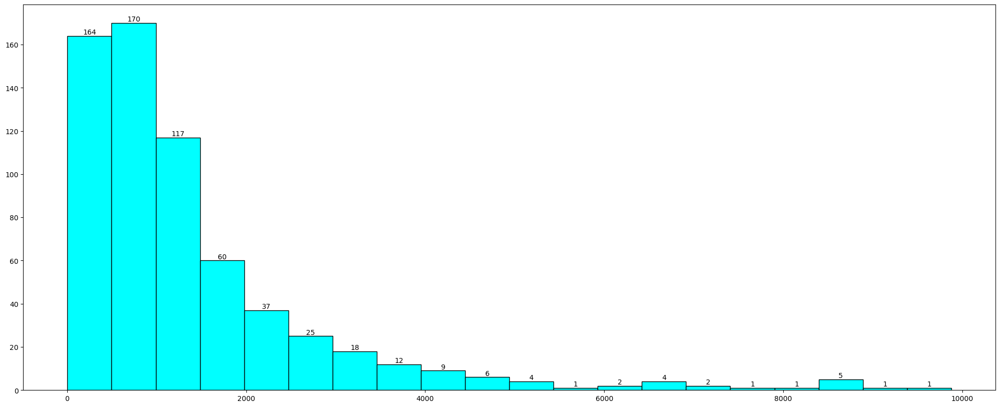

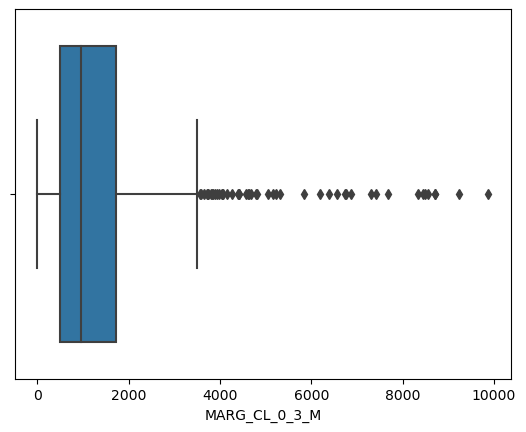

Description of MARG_CL_0_3_F
----------------------------------------------------------------------------
count      640.000000
mean      2757.050000
std       2788.776676
min         30.000000
25%        957.250000
50%       1928.000000
75%       3599.750000
max      21611.000000
Name: MARG_CL_0_3_F, dtype: float64 Skew : 2.47
Distribution of MARG_CL_0_3_F
----------------------------------------------------------------------------
BoxPlot of MARG_CL_0_3_F
----------------------------------------------------------------------------


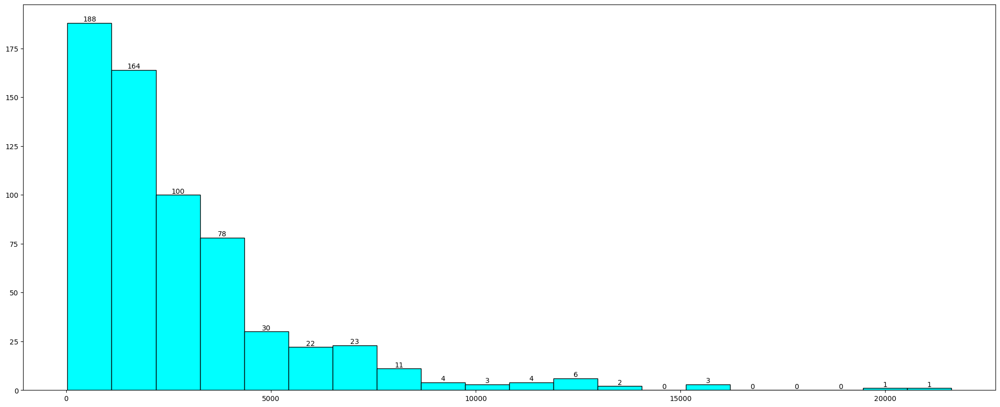

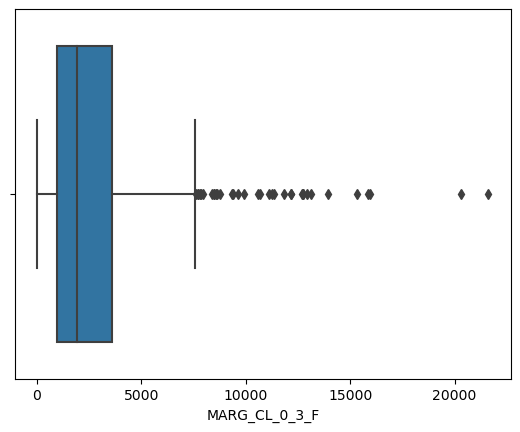

Description of MARG_AL_0_3_M
----------------------------------------------------------------------------
count     640.000000
mean      250.889062
std       453.336594
min         0.000000
25%        47.000000
50%       114.500000
75%       270.750000
max      5775.000000
Name: MARG_AL_0_3_M, dtype: float64 Skew : 5.81
Distribution of MARG_AL_0_3_M
----------------------------------------------------------------------------
BoxPlot of MARG_AL_0_3_M
----------------------------------------------------------------------------


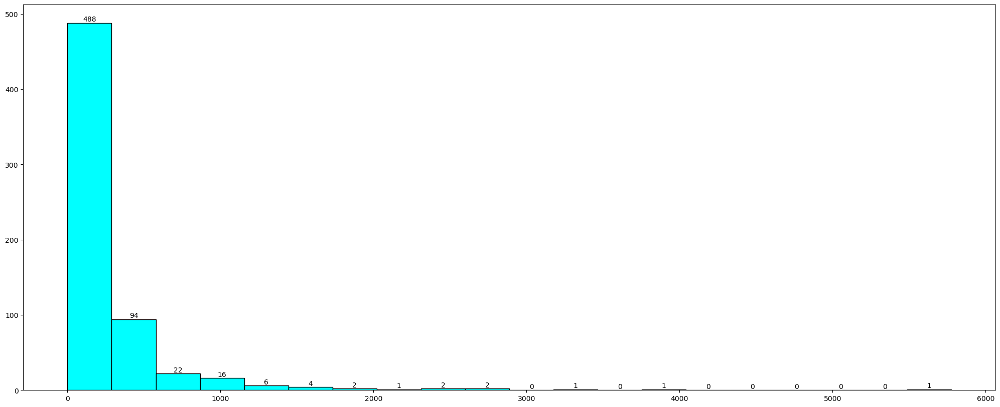

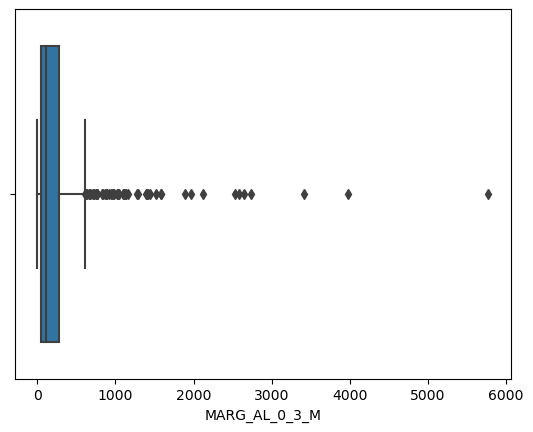

Description of MARG_AL_0_3_F
----------------------------------------------------------------------------
count      640.000000
mean       558.098438
std       1117.642748
min          0.000000
25%        109.000000
50%        247.500000
75%        568.750000
max      17153.000000
Name: MARG_AL_0_3_F, dtype: float64 Skew : 7.69
Distribution of MARG_AL_0_3_F
----------------------------------------------------------------------------
BoxPlot of MARG_AL_0_3_F
----------------------------------------------------------------------------


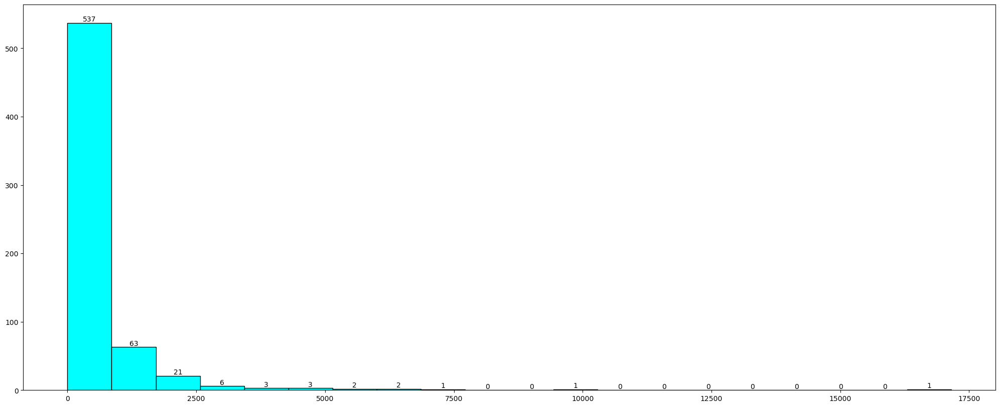

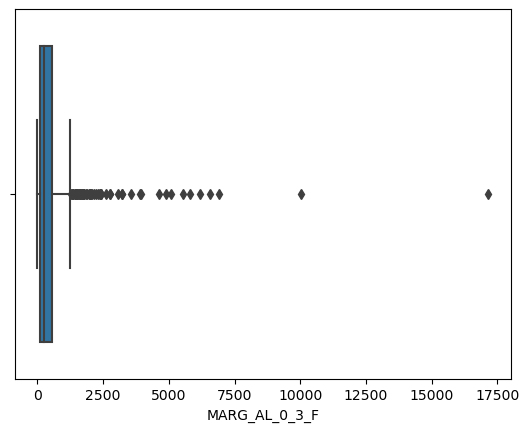

Description of MARG_HH_0_3_M
----------------------------------------------------------------------------
count     640.000000
mean      560.690625
std       762.578991
min         0.000000
25%       136.500000
50%       308.000000
75%       642.000000
max      6116.000000
Name: MARG_HH_0_3_M, dtype: float64 Skew : 3.09
Distribution of MARG_HH_0_3_M
----------------------------------------------------------------------------
BoxPlot of MARG_HH_0_3_M
----------------------------------------------------------------------------


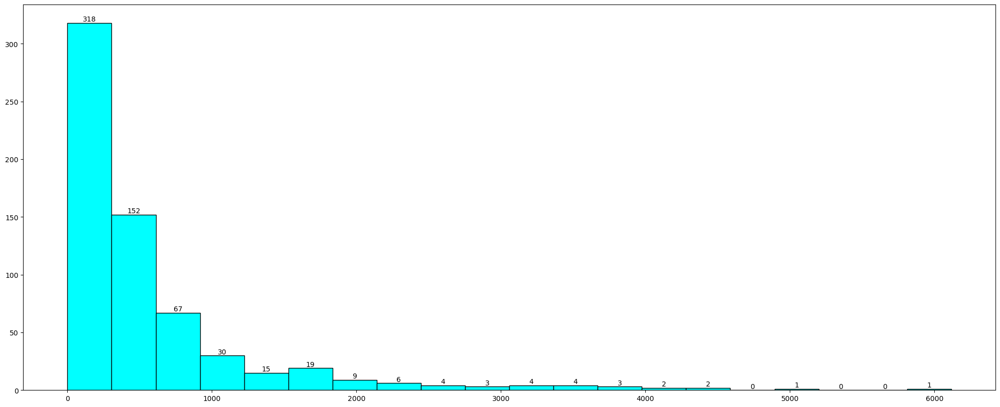

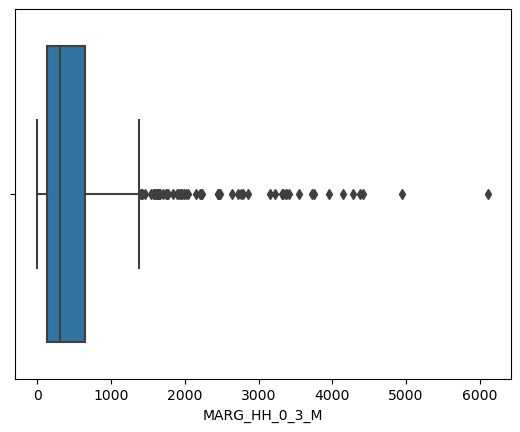

Description of MARG_HH_0_3_F
----------------------------------------------------------------------------
count      640.000000
mean      1293.431250
std       1585.377936
min          0.000000
25%        298.000000
50%        717.000000
75%       1710.750000
max      13714.000000
Name: MARG_HH_0_3_F, dtype: float64 Skew : 2.62
Distribution of MARG_HH_0_3_F
----------------------------------------------------------------------------
BoxPlot of MARG_HH_0_3_F
----------------------------------------------------------------------------


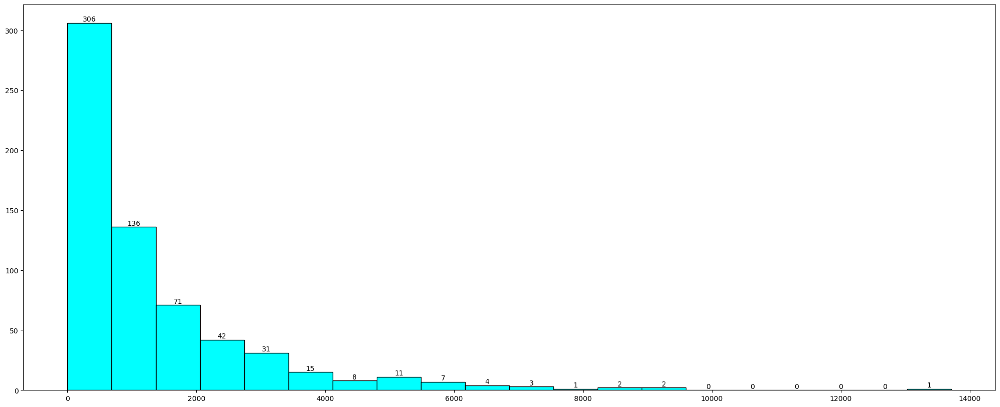

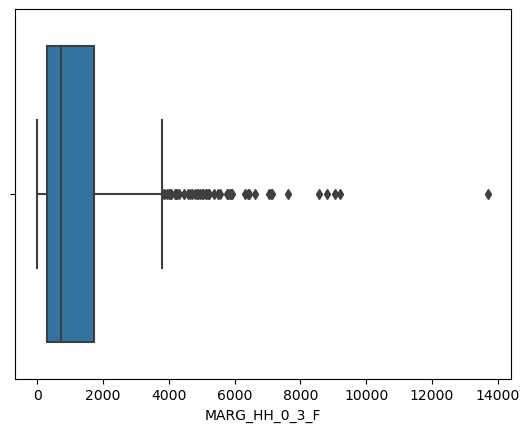

Description of MARG_OT_0_3_M
----------------------------------------------------------------------------
count    640.000000
mean      71.379688
std      107.897627
min        0.000000
25%       14.000000
50%       35.000000
75%       79.000000
max      895.000000
Name: MARG_OT_0_3_M, dtype: float64 Skew : 3.81
Distribution of MARG_OT_0_3_M
----------------------------------------------------------------------------
BoxPlot of MARG_OT_0_3_M
----------------------------------------------------------------------------


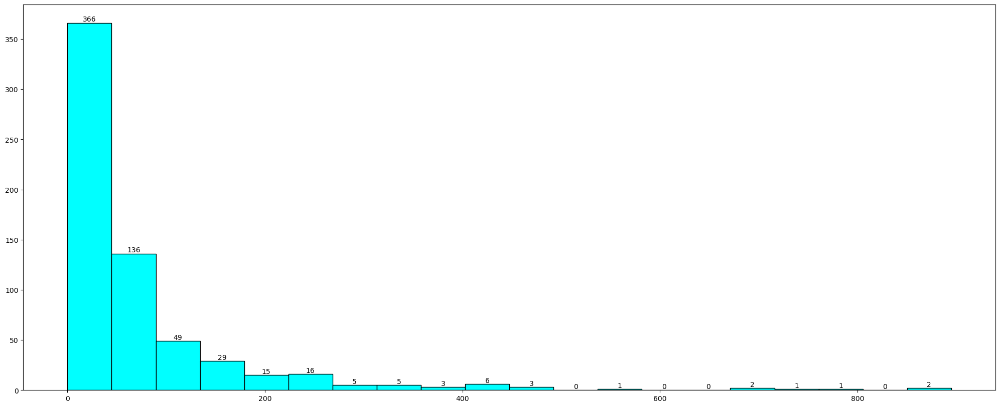

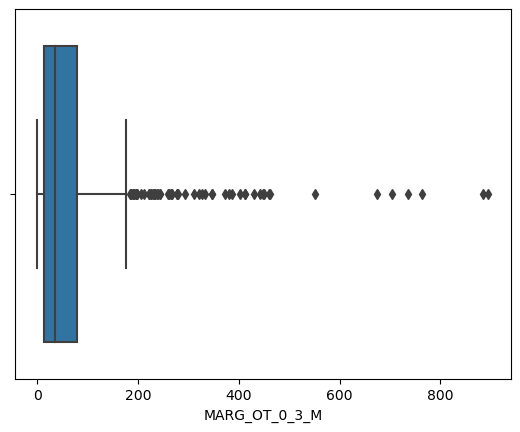

Description of MARG_OT_0_3_F
----------------------------------------------------------------------------
count     640.000000
mean      200.742188
std       309.740854
min         0.000000
25%        43.000000
50%       113.000000
75%       240.000000
max      3354.000000
Name: MARG_OT_0_3_F, dtype: float64 Skew : 4.74
Distribution of MARG_OT_0_3_F
----------------------------------------------------------------------------
BoxPlot of MARG_OT_0_3_F
----------------------------------------------------------------------------


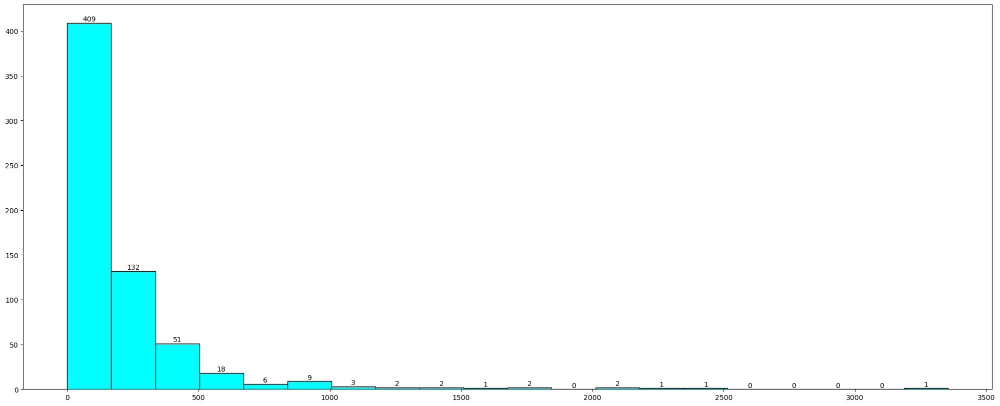

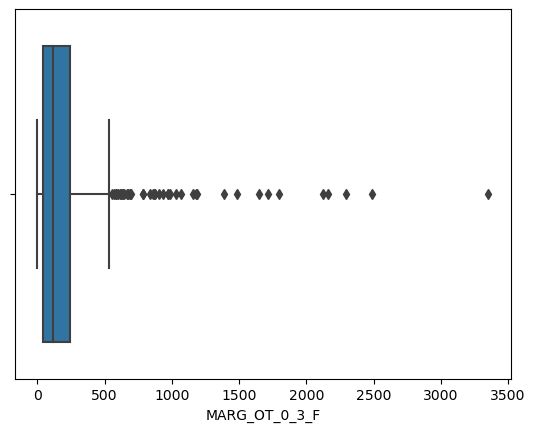

Description of NON_WORK_M
----------------------------------------------------------------------------
count     640.000000
mean      510.014063
std       610.603187
min         0.000000
25%       161.000000
50%       326.000000
75%       604.500000
max      6456.000000
Name: NON_WORK_M, dtype: float64 Skew : 3.63
Distribution of NON_WORK_M
----------------------------------------------------------------------------
BoxPlot of NON_WORK_M
----------------------------------------------------------------------------


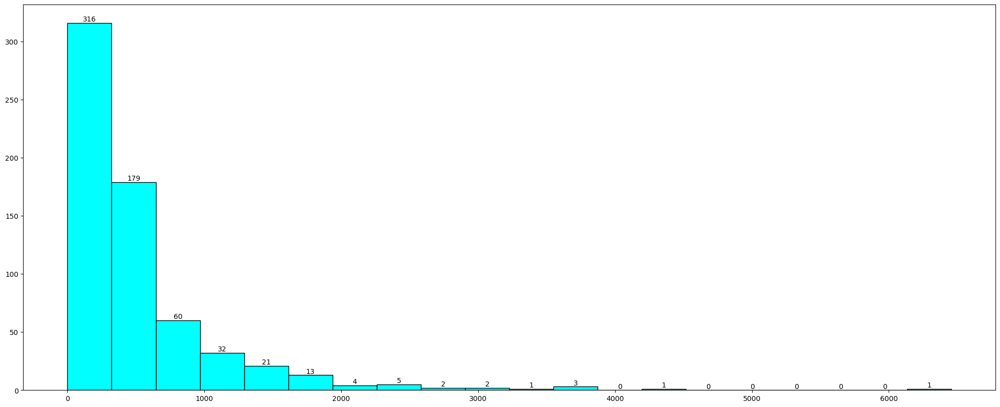

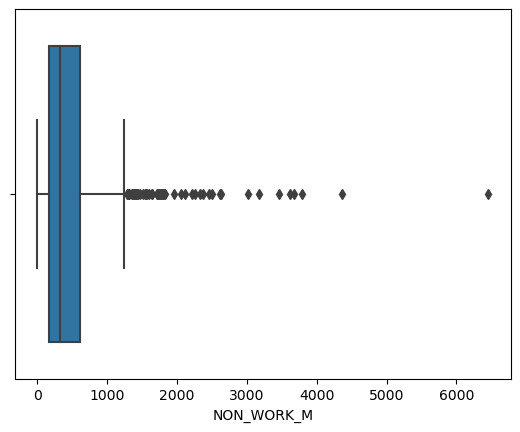

Description of NON_WORK_F
----------------------------------------------------------------------------
count      640.000000
mean       704.778125
std        910.209225
min          5.000000
25%        220.500000
50%        464.500000
75%        853.500000
max      10533.000000
Name: NON_WORK_F, dtype: float64 Skew : 4.8
Distribution of NON_WORK_F
----------------------------------------------------------------------------
BoxPlot of NON_WORK_F
----------------------------------------------------------------------------


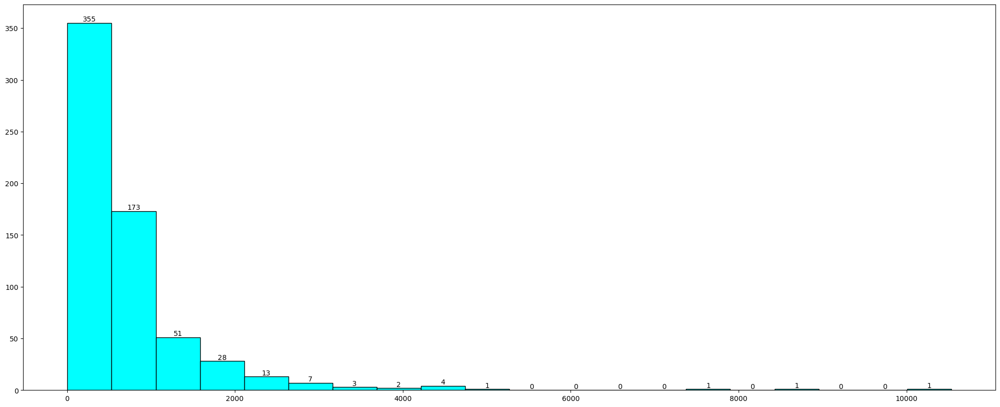

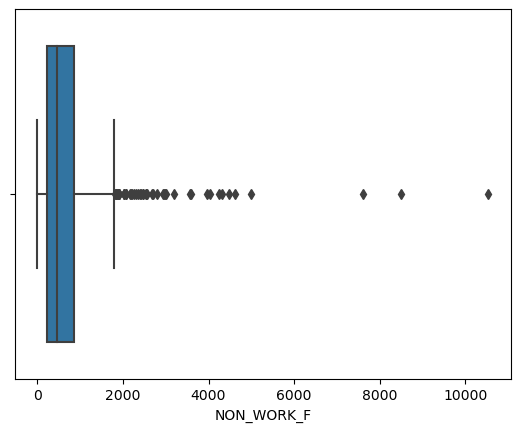

In [66]:
for x in lstnumericcolumns:
    univariateAnalysis_numeric(x,20)

1. Mostly the data is right/ positive skewed in many features
2. Total Females is higher than total males in overall dataset
3. Total females in a particular category is higher than males
4. Outliers are visible in most of the features, PCA reacts to outlier and it should be treated.

In [67]:
for col in pca_data_num_df.columns:
    print('Columns' + col)
    print(len(pca_data_num_df[pca_data_num_df[col]==0])/len(pca_data_num_df) * 100)

ColumnsState Code
0.0
ColumnsDist.Code
0.0
ColumnsNo_HH
0.0
ColumnsTOT_M
0.0
ColumnsTOT_F
0.0
ColumnsM_06
0.0
ColumnsF_06
0.0
ColumnsM_SC
6.875000000000001
ColumnsF_SC
7.03125
ColumnsM_ST
8.75
ColumnsF_ST
8.90625
ColumnsM_LIT
0.0
ColumnsF_LIT
0.0
ColumnsM_ILL
0.0
ColumnsF_ILL
0.0
ColumnsTOT_WORK_M
0.0
ColumnsTOT_WORK_F
0.0
ColumnsMAINWORK_M
0.0
ColumnsMAINWORK_F
0.0
ColumnsMAIN_CL_M
0.15625
ColumnsMAIN_CL_F
0.15625
ColumnsMAIN_AL_M
0.3125
ColumnsMAIN_AL_F
0.15625
ColumnsMAIN_HH_M
0.15625
ColumnsMAIN_HH_F
0.15625
ColumnsMAIN_OT_M
0.0
ColumnsMAIN_OT_F
0.0
ColumnsMARGWORK_M
0.0
ColumnsMARGWORK_F
0.0
ColumnsMARG_CL_M
0.15625
ColumnsMARG_CL_F
0.3125
ColumnsMARG_AL_M
0.15625
ColumnsMARG_AL_F
0.15625
ColumnsMARG_HH_M
0.78125
ColumnsMARG_HH_F
0.15625
ColumnsMARG_OT_M
0.0
ColumnsMARG_OT_F
0.0
ColumnsMARGWORK_3_6_M
0.0
ColumnsMARGWORK_3_6_F
0.0
ColumnsMARG_CL_3_6_M
0.0
ColumnsMARG_CL_3_6_F
0.0
ColumnsMARG_AL_3_6_M
0.15625
ColumnsMARG_AL_3_6_F
0.3125
ColumnsMARG_HH_3_6_M
0.15625
ColumnsMARG_HH_3_

All columns has reasonably valid data and very few features contains zero. We cannot drop the columns that contains zero which might have hidden relation.

Handling outlier will solve these zero rows for those columns

In [68]:
corr = pca_data_num_df.corr(method='pearson')

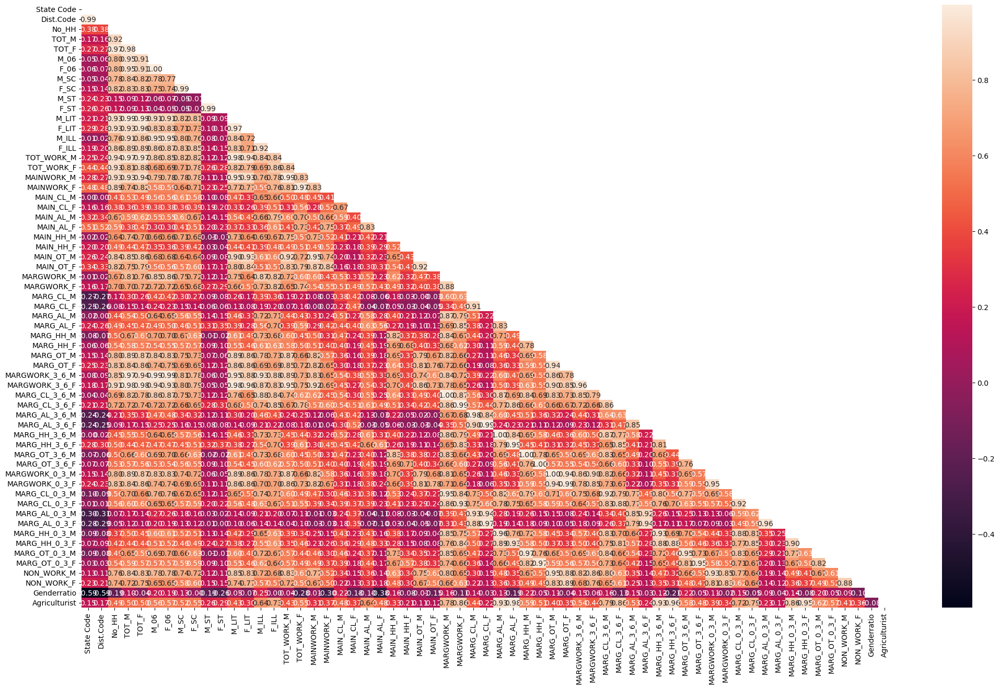

In [69]:
mask = np.triu(np.ones_like(corr, dtype=np.bool)) 
fig = plt.subplots(figsize=(25, 15))
sns.heatmap(pca_data_num_df.corr(), annot=True,fmt='.2f',mask=mask)
plt.show()

Highest agriculturist are found in State Code 28 which represents Andhra Pradesh



### Scaling data using Min Max Scaler

In [70]:
from sklearn.preprocessing import MinMaxScaler
scaler = MinMaxScaler()
scaler.fit(pca_data_num_df)
pca_df_num_scaled_1=pd.DataFrame(scaler.transform(pca_data_num_df),columns=pca_data_df.columns)

In [71]:
pca_df_num_scaled_1.head()

,State Code,Dist.Code,State,Area Name,No_HH,TOT_M,TOT_F,M_06,F_06,M_SC,...,MARG_CL_0_3_M,MARG_CL_0_3_F,MARG_AL_0_3_M,MARG_AL_0_3_F,MARG_HH_0_3_M,MARG_HH_0_3_F,MARG_OT_0_3_M,MARG_OT_0_3_F,NON_WORK_M,NON_WORK_F
0,0.0,0.000000,0.023725,0.047414,0.038813,0.060374,0.064582,0.000029,0.000000,0.020654,...,0.031169,0.013817,0.111184,0.018375,0.035754,0.013715,0.039963,0.019852,0.806729,0.040742
1,0.0,0.001565,0.018923,0.039573,0.029884,0.046024,0.038676,0.000068,0.000038,0.004412,...,0.021299,0.013350,0.030412,0.010792,0.084916,0.053071,0.021685,0.014723,0.952803,0.022118
2,0.0,0.003130,0.013228,0.012690,0.013694,0.010669,0.010119,0.000029,0.000038,0.059989,...,0.007619,0.005189,0.000491,0.002479,0.000000,0.001193,0.010378,0.005319,0.369860,0.003041
3,0.0,0.004695,0.003128,0.004934,0.004679,0.005272,0.006532,0.000000,0.000000,0.027546,...,0.010563,0.007462,0.002126,0.003646,0.004469,0.002982,0.017968,0.005129,0.520681,0.003616
4,0.0,0.006260,0.036453,0.041647,0.039060,0.053043,0.047658,0.000194,0.000211,0.079248,...,0.080519,0.060806,0.033519,0.022021,0.026816,0.031306,0.027881,0.044928,0.578553,0.031861


Box plot shows that even after scaling there are outlier to the data and must be treated as it will heavily impact PCA.

**Scale the Data using z-score method. Does scaling have any impact on outliers? Compare boxplots before and after scaling and comment.**

In [72]:
pca_df_num_scaled=pca_data_num_df.apply(zscore)
pca_df_num_scaled.head(20)

,State Code,Dist.Code,No_HH,TOT_M,TOT_F,M_06,F_06,M_SC,F_SC,M_ST,...,MARG_AL_0_3_M,MARG_AL_0_3_F,MARG_HH_0_3_M,MARG_HH_0_3_F,MARG_OT_0_3_M,MARG_OT_0_3_F,NON_WORK_M,NON_WORK_F,Genderratio,Agriculturist
0,-1.710782,-1.729347,-0.904738,-0.771236,-0.815563,-0.561012,-0.507738,-0.958575,-0.957049,-0.423306,...,-0.156494,-0.287524,0.156577,-0.657412,-0.365258,-0.499977,-0.413053,-0.539614,1.397939,-0.697786
1,-1.710782,-1.723934,-0.935695,-0.823100,-0.874534,-0.681096,-0.725367,-0.958297,-0.956772,-0.582014,...,-0.282327,-0.294688,-0.491731,-0.723062,0.042855,-0.073481,-0.606455,-0.598988,2.084345,-0.819203
2,-1.710782,-1.718521,-0.972412,-1.000919,-0.981466,-0.976956,-0.965262,-0.958575,-0.956772,-0.038951,...,-0.456727,-0.420050,-0.731894,-0.795026,-0.662068,-0.635680,-0.726103,-0.707839,-0.654934,-0.943578
3,-1.710782,-1.713109,-1.037530,-1.052224,-1.041001,-1.022118,-0.995393,-0.958783,-0.957049,-0.355965,...,-0.419198,-0.385127,-0.718770,-0.784926,-0.624966,-0.616294,-0.645791,-0.710038,0.053784,-0.939830
4,-1.710782,-1.707696,-0.822676,-0.809381,-0.813933,-0.622359,-0.649908,-0.957395,-0.955529,0.149238,...,0.472670,0.434200,-0.466796,-0.625849,-0.439461,-0.309346,-0.540895,-0.249344,0.325728,-0.755684
5,-1.710782,-1.702283,-0.725145,-0.745298,-0.748345,-0.535515,-0.587438,-0.779249,-0.772809,0.161959,...,2.265234,1.626031,-0.435299,-0.654887,-0.485837,-0.419201,-0.372077,0.143180,0.204799,-0.809833
6,-1.710782,-1.696871,-0.804878,-0.779351,-0.809440,-0.729304,-0.772463,-0.587158,-0.638960,-0.525376,...,-0.200646,-0.246334,-0.561286,-0.740738,-0.560039,-0.587215,-0.511393,-0.622077,0.989255,-0.868716
7,-1.710782,-1.691458,-0.869247,-0.777073,-0.809281,-0.701632,-0.693028,-0.958783,-0.957049,-0.529717,...,-0.182985,-0.212307,-0.230570,-0.649205,-0.198303,-0.344887,-0.432721,-0.557207,1.044241,-0.730138
8,-1.710782,-1.686045,-0.985677,-0.949465,-0.963018,-0.927878,-0.898021,-0.958783,-0.957049,-0.448545,...,-0.315441,-0.249021,-0.449735,-0.668774,-0.207578,-0.183336,-0.606455,-0.507729,1.455910,-0.815751
9,-1.710782,-1.680633,-0.751134,-0.558137,-0.617504,-0.525595,-0.551211,-0.958020,-0.956910,-0.604932,...,-0.531785,-0.473776,-0.688586,-0.802601,-0.513663,-0.215646,-0.432721,-0.503331,0.975569,-0.939436


In [73]:
def univariateAnalysis_numeric_s(column,nbins):
    print("Description of " + column)
    print("----------------------------------------------------------------------------")
    print(pca_df_num_scaled[column].describe(),end=' ')
    print('Skew :',round(pca_df_num_scaled[column].skew(),2))
    
    plt.figure(figsize=[25,10])
    print("Distribution of " + column)
    print("----------------------------------------------------------------------------")
    a=round(pca_df_num_scaled[column].min())
    b=round(pca_df_num_scaled[column].max())
    freq, bins, patches = plt.hist(pca_df_num_scaled[column], bins=nbins, range=[a,b], edgecolor='Black', color='cyan')
    bin_centers = np.diff(bins)*0.5 + bins[:-1]
    n = 0
    for fr, x, patch in zip(freq, bin_centers, patches):
      height = int(freq[n])
      plt.annotate("{}".format(height),
               xy = (x, height),             # top left corner of the histogram bar
               xytext = (0,0.2),             # offsetting label position above its bar
               textcoords = "offset points", # Offset (in points) from the *xy* value
               ha = 'center', va = 'bottom'
               )
      n = n+1

    #plt.legend()
    #plt.xticks(range(a,b,round((b-a)/nbins)))
    plt.show;
    plt.figure()
    print("BoxPlot of " + column)
    print("----------------------------------------------------------------------------")
    ax = sns.boxplot(x=pca_df_num_scaled[column])
    #ax.legend()
    plt.show()

Description of State Code
----------------------------------------------------------------------------
count    640.000000
mean      17.114062
std        9.426486
min        1.000000
25%        9.000000
50%       18.000000
75%       24.000000
max       35.000000
Name: State Code, dtype: float64 Skew : 0.04
Distribution of State Code
----------------------------------------------------------------------------
BoxPlot of State Code
----------------------------------------------------------------------------


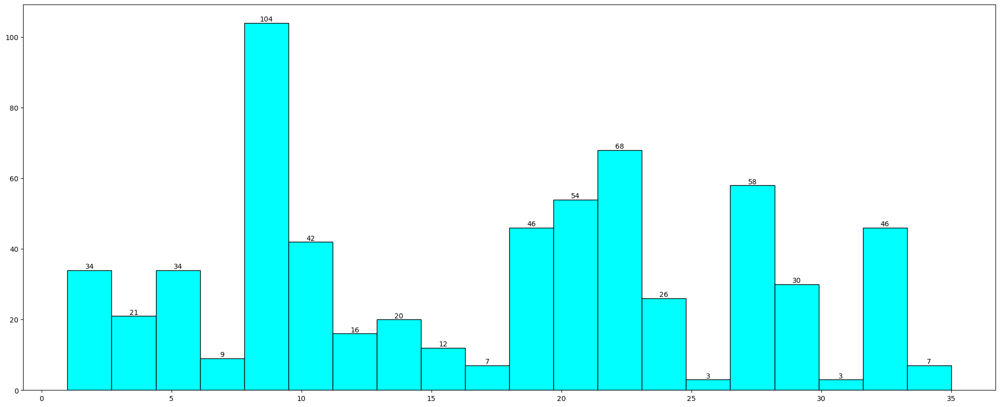

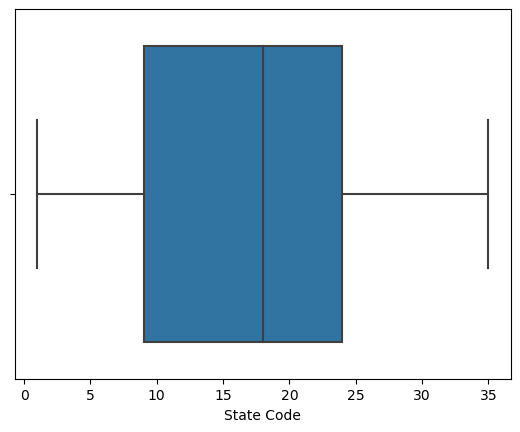

Description of Dist.Code
----------------------------------------------------------------------------
count    640.000000
mean     320.500000
std      184.896367
min        1.000000
25%      160.750000
50%      320.500000
75%      480.250000
max      640.000000
Name: Dist.Code, dtype: float64 Skew : 0.0
Distribution of Dist.Code
----------------------------------------------------------------------------
BoxPlot of Dist.Code
----------------------------------------------------------------------------


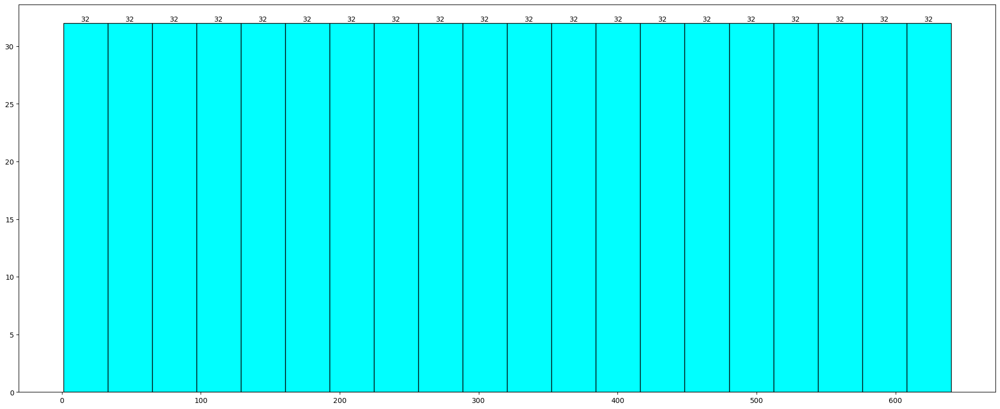

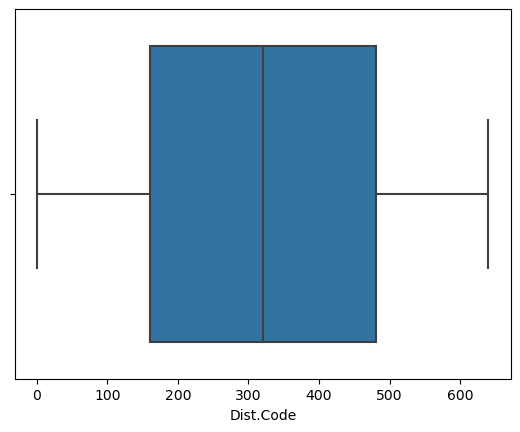

Description of No_HH
----------------------------------------------------------------------------
count       640.000000
mean      51222.871875
std       48135.405475
min         350.000000
25%       19484.000000
50%       35837.000000
75%       68892.000000
max      310450.000000
Name: No_HH, dtype: float64 Skew : 2.02
Distribution of No_HH
----------------------------------------------------------------------------
BoxPlot of No_HH
----------------------------------------------------------------------------


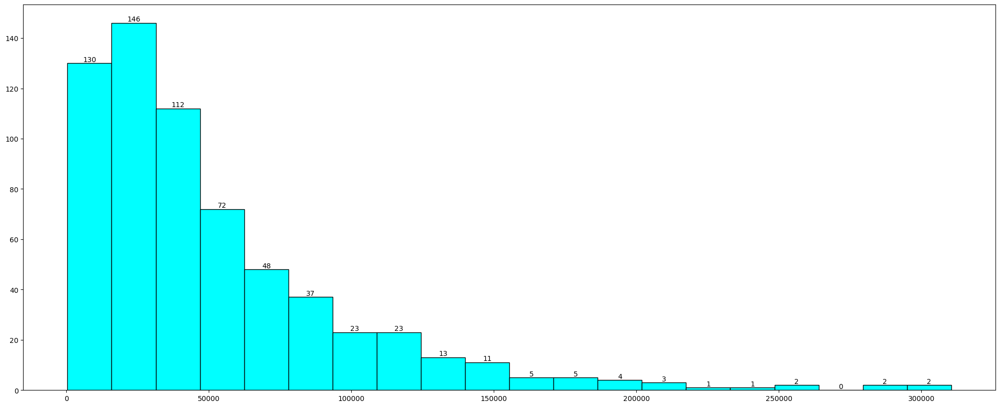

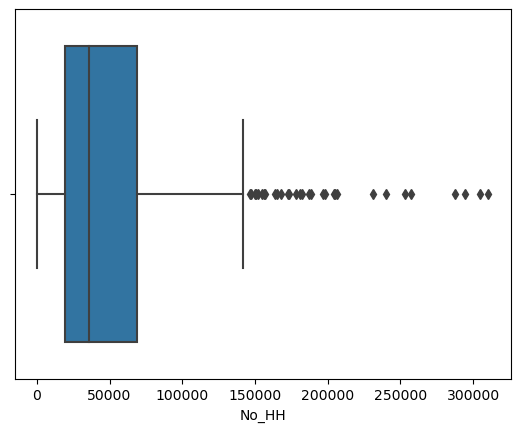

Description of TOT_M
----------------------------------------------------------------------------
count       640.000000
mean      79940.576563
std       73384.511114
min         391.000000
25%       30228.000000
50%       58339.000000
75%      107918.500000
max      485417.000000
Name: TOT_M, dtype: float64 Skew : 2.03
Distribution of TOT_M
----------------------------------------------------------------------------
BoxPlot of TOT_M
----------------------------------------------------------------------------


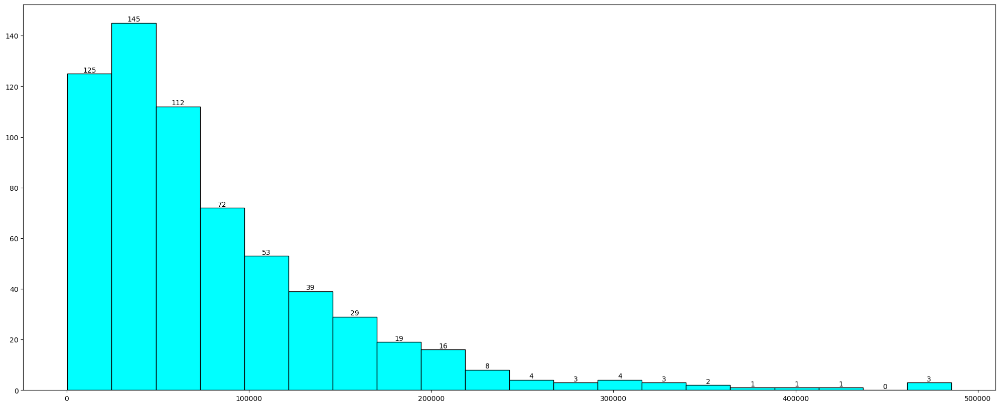

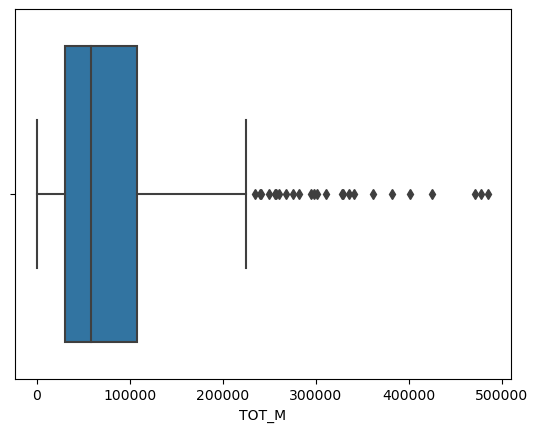

Description of TOT_F
----------------------------------------------------------------------------
count       640.000000
mean     122372.084375
std      113600.717282
min         698.000000
25%       46517.750000
50%       87724.500000
75%      164251.750000
max      750392.000000
Name: TOT_F, dtype: float64 Skew : 2.11
Distribution of TOT_F
----------------------------------------------------------------------------
BoxPlot of TOT_F
----------------------------------------------------------------------------


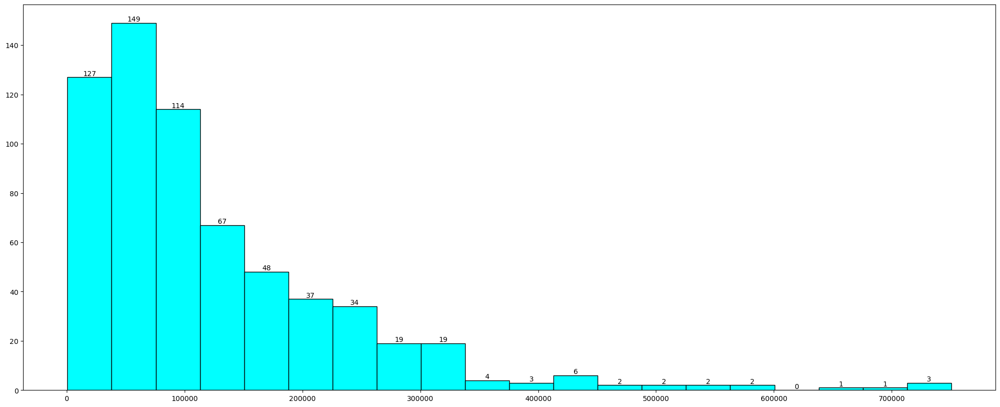

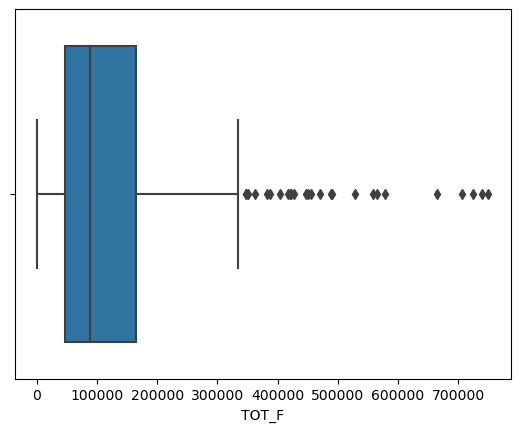

Description of M_06
----------------------------------------------------------------------------
count      640.000000
mean     12309.098438
std      11500.906881
min         56.000000
25%       4733.750000
50%       9159.000000
75%      16520.250000
max      96223.000000
Name: M_06, dtype: float64 Skew : 2.19
Distribution of M_06
----------------------------------------------------------------------------
BoxPlot of M_06
----------------------------------------------------------------------------


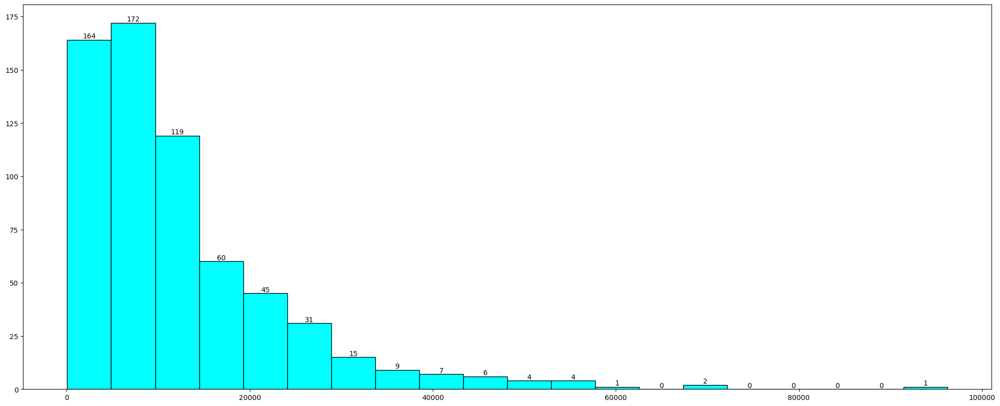

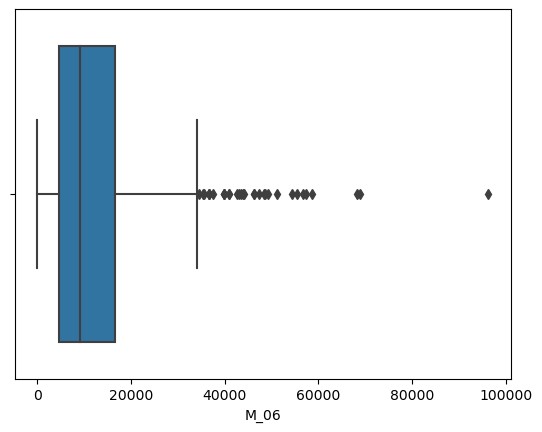

Description of F_06
----------------------------------------------------------------------------
count      640.000000
mean     11942.300000
std      11326.294567
min         56.000000
25%       4672.250000
50%       8663.000000
75%      15902.250000
max      95129.000000
Name: F_06, dtype: float64 Skew : 2.23
Distribution of F_06
----------------------------------------------------------------------------
BoxPlot of F_06
----------------------------------------------------------------------------


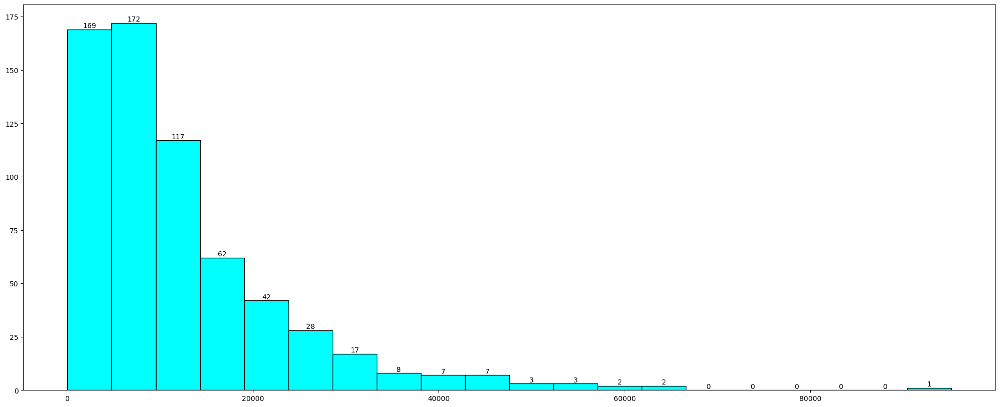

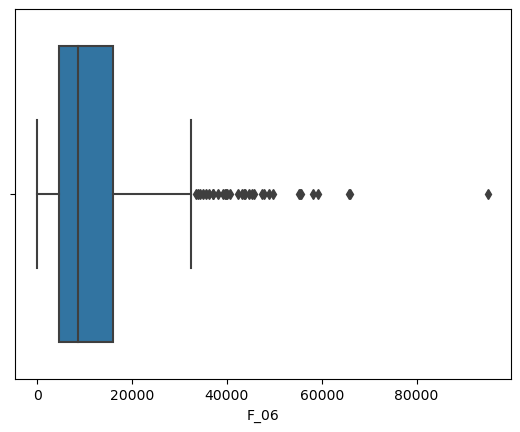

Description of M_SC
----------------------------------------------------------------------------
count       640.000000
mean      13820.946875
std       14426.373130
min           0.000000
25%        3466.250000
50%        9591.500000
75%       19429.750000
max      103307.000000
Name: M_SC, dtype: float64 Skew : 1.99
Distribution of M_SC
----------------------------------------------------------------------------
BoxPlot of M_SC
----------------------------------------------------------------------------


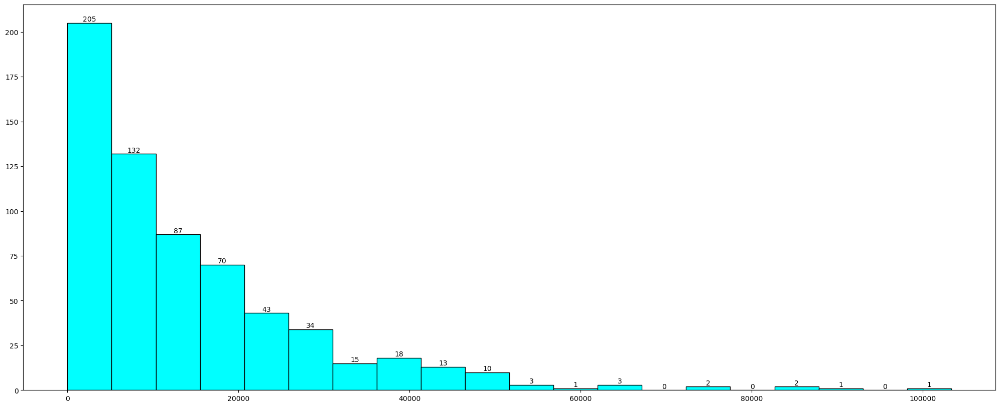

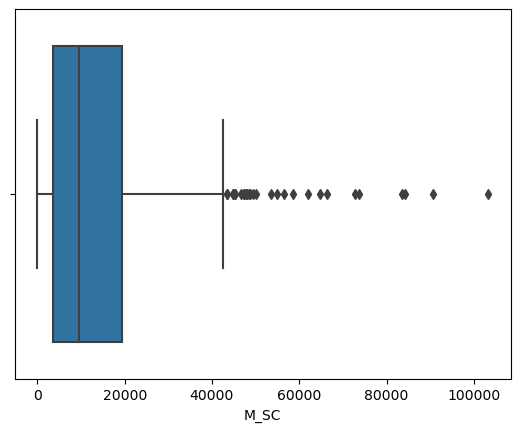

Description of F_SC
----------------------------------------------------------------------------
count       640.000000
mean      20778.392188
std       21727.887713
min           0.000000
25%        5603.250000
50%       13709.000000
75%       29180.000000
max      156429.000000
Name: F_SC, dtype: float64 Skew : 1.99
Distribution of F_SC
----------------------------------------------------------------------------
BoxPlot of F_SC
----------------------------------------------------------------------------


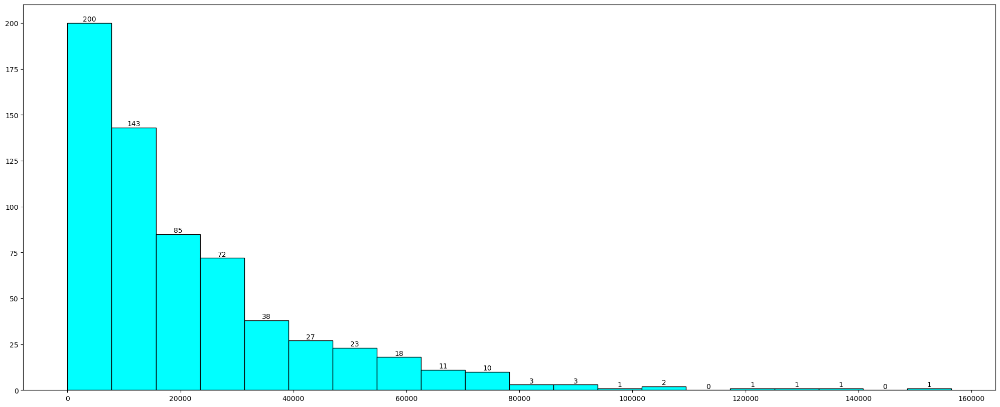

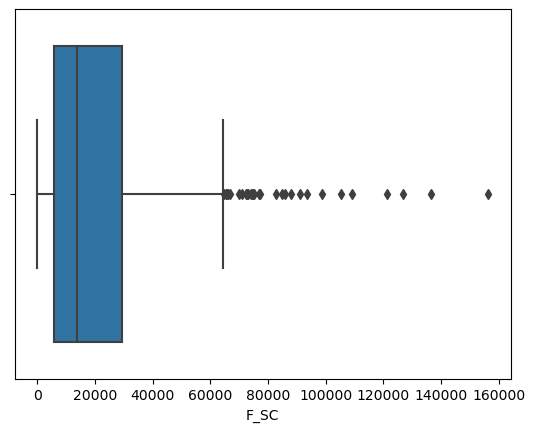

Description of M_ST
----------------------------------------------------------------------------
count      640.000000
mean      6191.807813
std       9912.668948
min          0.000000
25%        293.750000
50%       2333.500000
75%       7658.000000
max      96785.000000
Name: M_ST, dtype: float64 Skew : 3.44
Distribution of M_ST
----------------------------------------------------------------------------
BoxPlot of M_ST
----------------------------------------------------------------------------


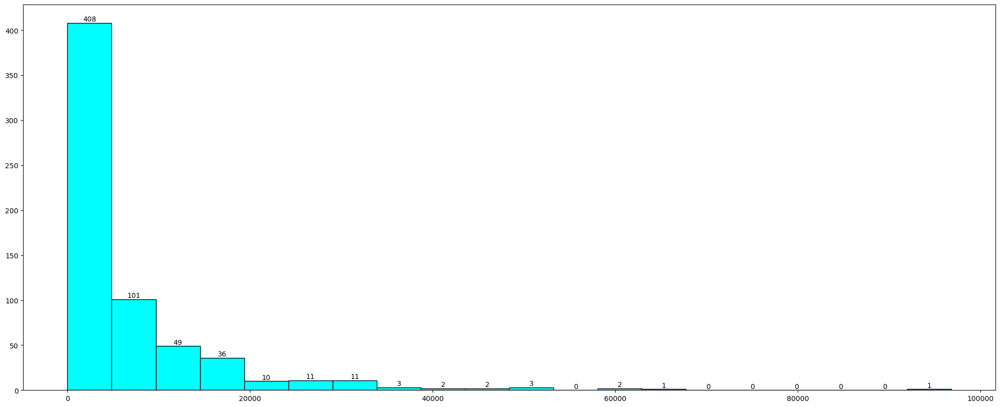

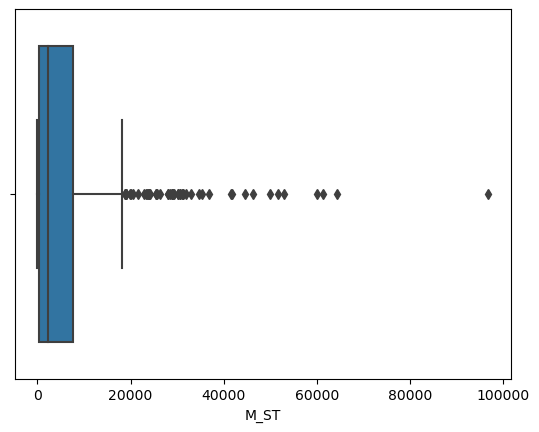

Description of F_ST
----------------------------------------------------------------------------
count       640.000000
mean      10155.640625
std       15875.701488
min           0.000000
25%         429.500000
50%        3834.500000
75%       12480.250000
max      130119.000000
Name: F_ST, dtype: float64 Skew : 2.98
Distribution of F_ST
----------------------------------------------------------------------------
BoxPlot of F_ST
----------------------------------------------------------------------------


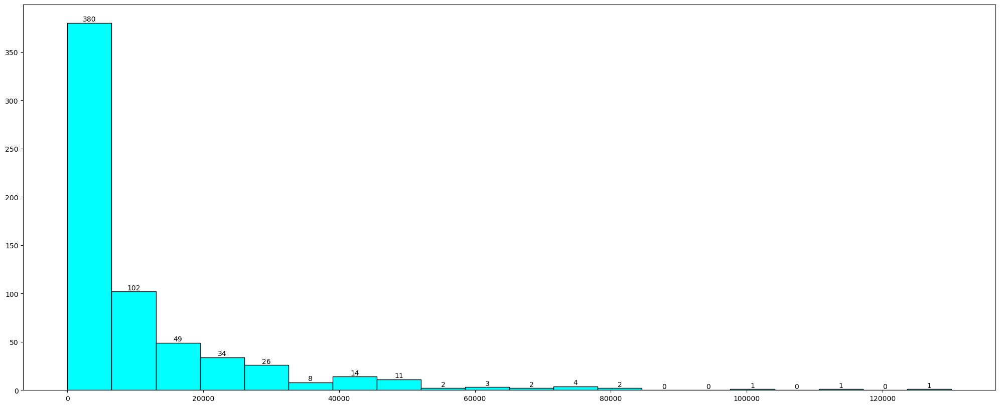

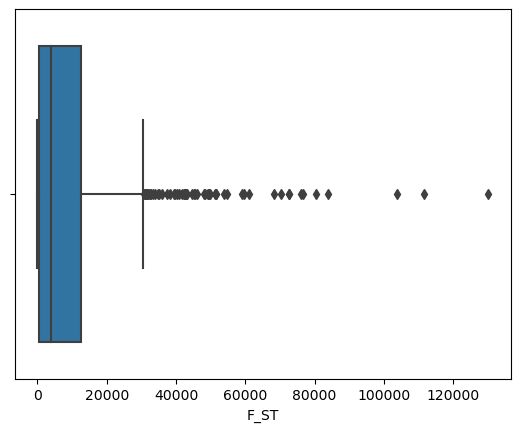

Description of M_LIT
----------------------------------------------------------------------------
count       640.000000
mean      57967.979688
std       55910.282466
min         286.000000
25%       21298.000000
50%       42693.500000
75%       77989.500000
max      403261.000000
Name: M_LIT, dtype: float64 Skew : 2.34
Distribution of M_LIT
----------------------------------------------------------------------------
BoxPlot of M_LIT
----------------------------------------------------------------------------


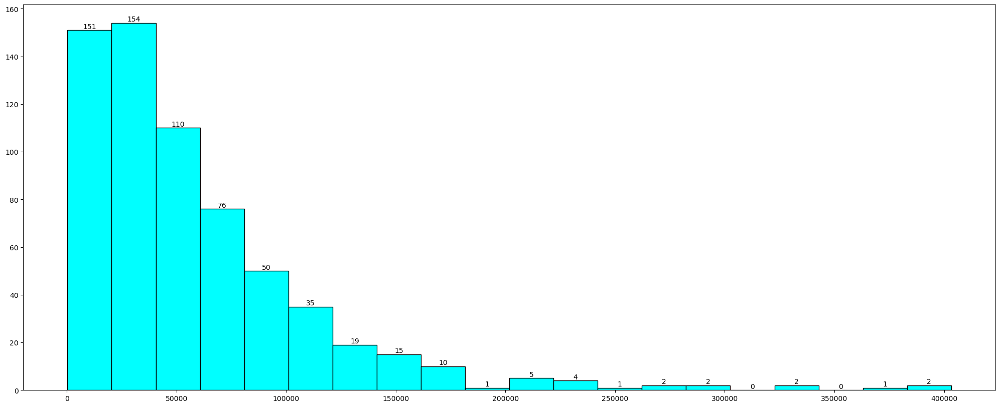

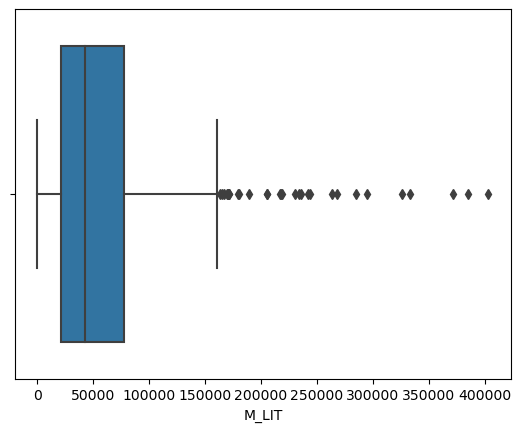

Description of F_LIT
----------------------------------------------------------------------------
count       640.000000
mean      66359.565625
std       75037.860207
min         371.000000
25%       20932.000000
50%       43796.500000
75%       84799.750000
max      571140.000000
Name: F_LIT, dtype: float64 Skew : 3.15
Distribution of F_LIT
----------------------------------------------------------------------------
BoxPlot of F_LIT
----------------------------------------------------------------------------


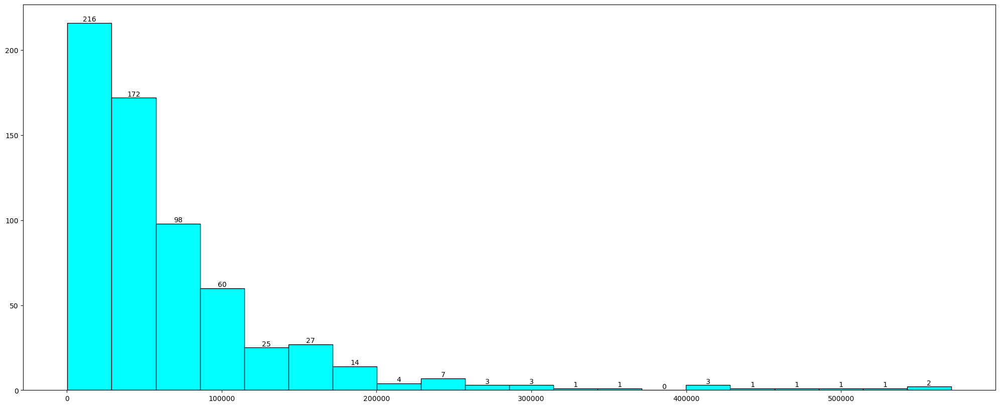

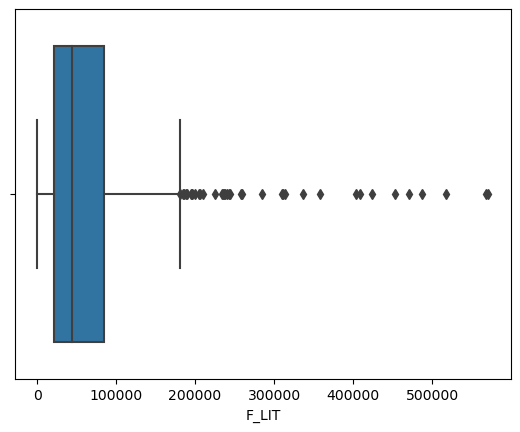

Description of M_ILL
----------------------------------------------------------------------------
count       640.000000
mean      21972.596875
std       19825.605268
min         105.000000
25%        8590.000000
50%       15767.500000
75%       29512.500000
max      105961.000000
Name: M_ILL, dtype: float64 Skew : 1.58
Distribution of M_ILL
----------------------------------------------------------------------------
BoxPlot of M_ILL
----------------------------------------------------------------------------


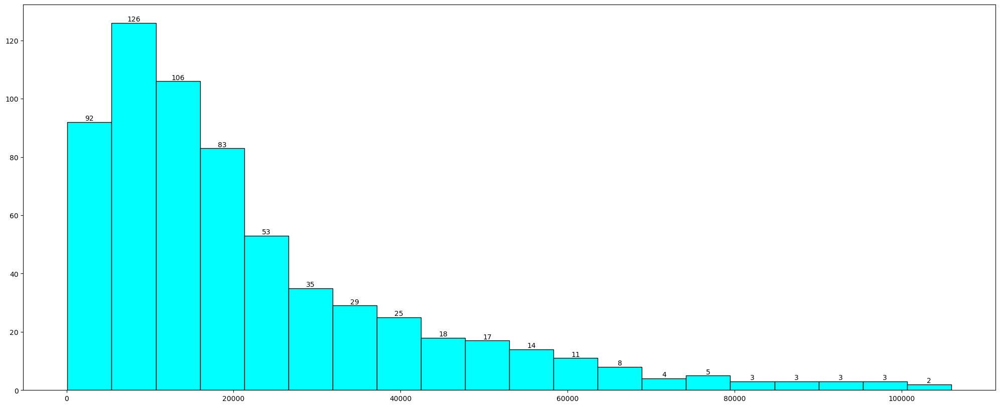

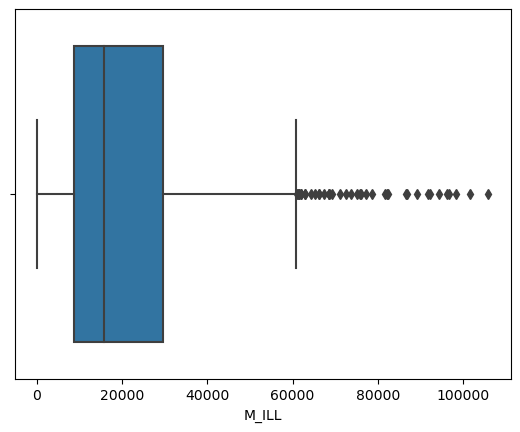

Description of F_ILL
----------------------------------------------------------------------------
count       640.000000
mean      56012.518750
std       47116.693769
min         327.000000
25%       22367.000000
50%       42386.000000
75%       78471.000000
max      254160.000000
Name: F_ILL, dtype: float64 Skew : 1.34
Distribution of F_ILL
----------------------------------------------------------------------------
BoxPlot of F_ILL
----------------------------------------------------------------------------


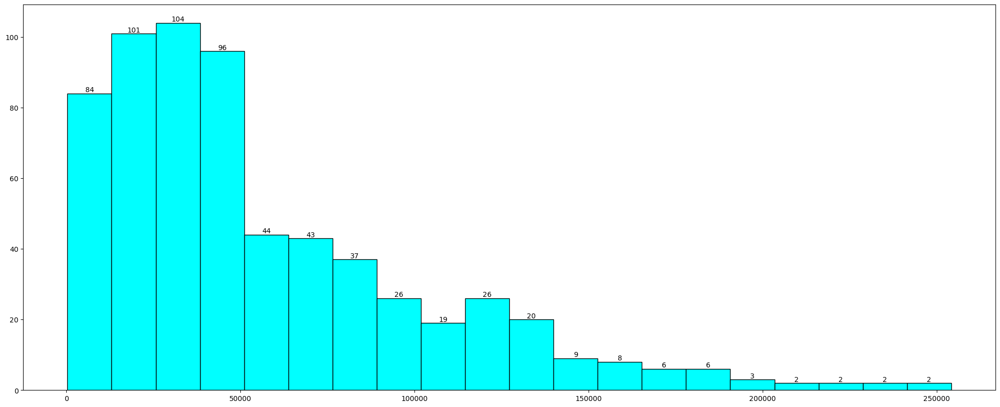

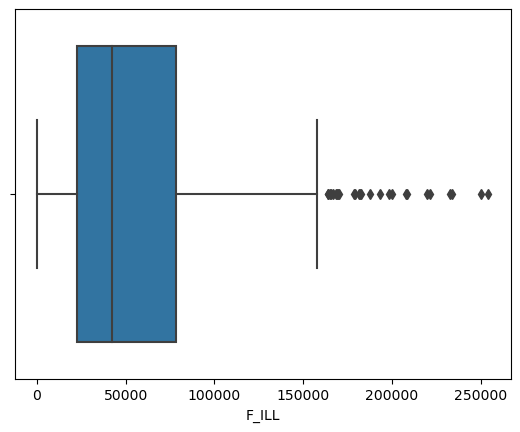

Description of TOT_WORK_M
----------------------------------------------------------------------------
count       640.000000
mean      37992.407813
std       36419.537491
min         100.000000
25%       13753.500000
50%       27936.500000
75%       50226.750000
max      269422.000000
Name: TOT_WORK_M, dtype: float64 Skew : 2.3
Distribution of TOT_WORK_M
----------------------------------------------------------------------------
BoxPlot of TOT_WORK_M
----------------------------------------------------------------------------


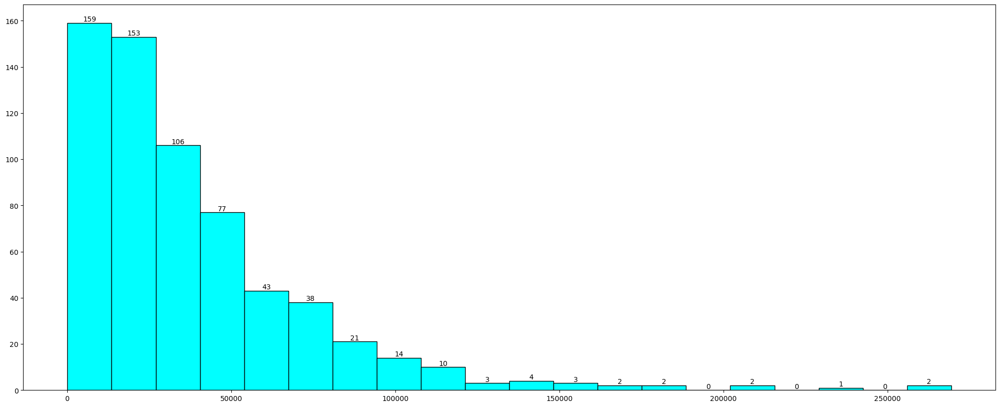

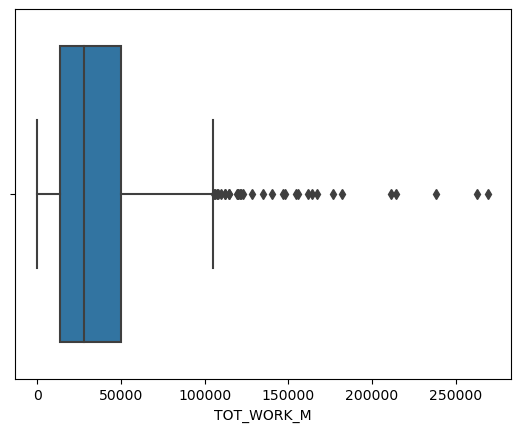

Description of TOT_WORK_F
----------------------------------------------------------------------------
count       640.000000
mean      41295.760938
std       37192.360943
min         357.000000
25%       16097.750000
50%       30588.500000
75%       53234.250000
max      257848.000000
Name: TOT_WORK_F, dtype: float64 Skew : 1.93
Distribution of TOT_WORK_F
----------------------------------------------------------------------------
BoxPlot of TOT_WORK_F
----------------------------------------------------------------------------


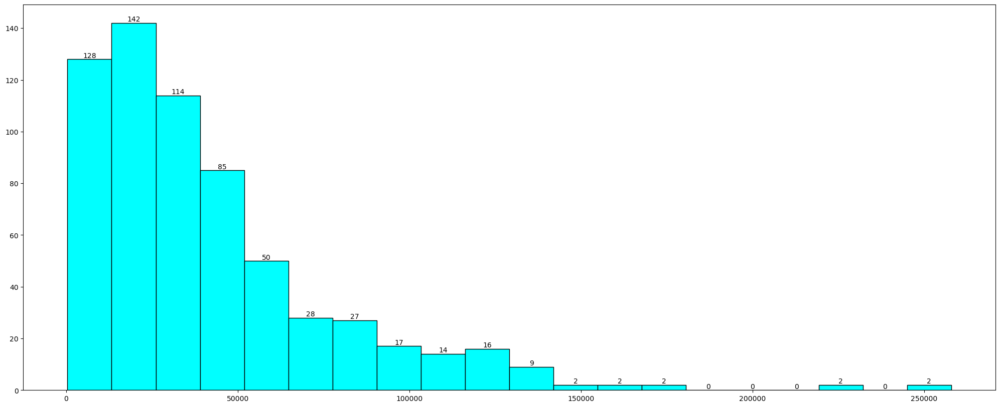

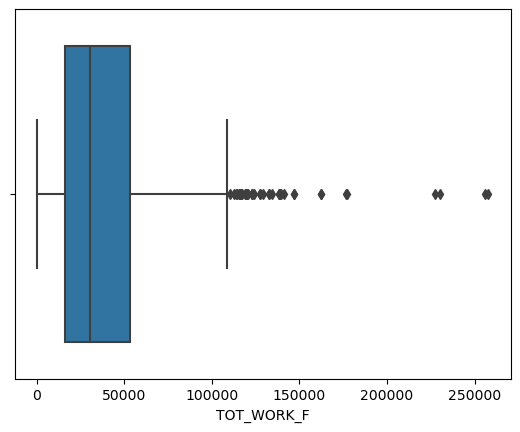

Description of MAINWORK_M
----------------------------------------------------------------------------
count       640.000000
mean      30204.446875
std       31480.915680
min          65.000000
25%        9787.000000
50%       21250.500000
75%       40119.000000
max      247911.000000
Name: MAINWORK_M, dtype: float64 Skew : 2.63
Distribution of MAINWORK_M
----------------------------------------------------------------------------
BoxPlot of MAINWORK_M
----------------------------------------------------------------------------


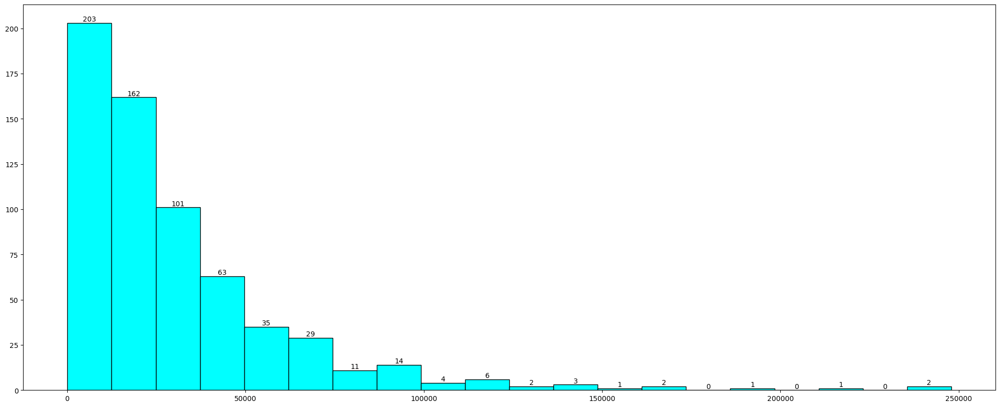

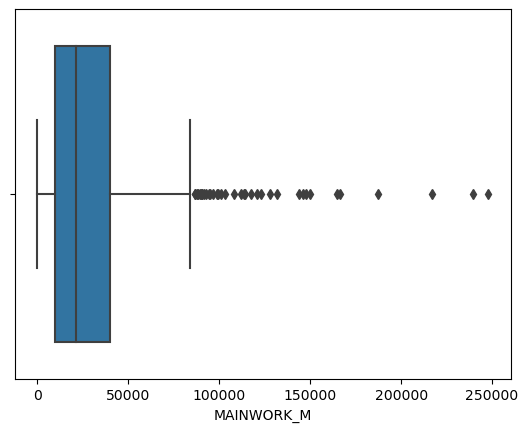

Description of MAINWORK_F
----------------------------------------------------------------------------
count       640.000000
mean      28198.846875
std       29998.262689
min         240.000000
25%        9502.250000
50%       18484.000000
75%       35063.250000
max      226166.000000
Name: MAINWORK_F, dtype: float64 Skew : 2.55
Distribution of MAINWORK_F
----------------------------------------------------------------------------
BoxPlot of MAINWORK_F
----------------------------------------------------------------------------


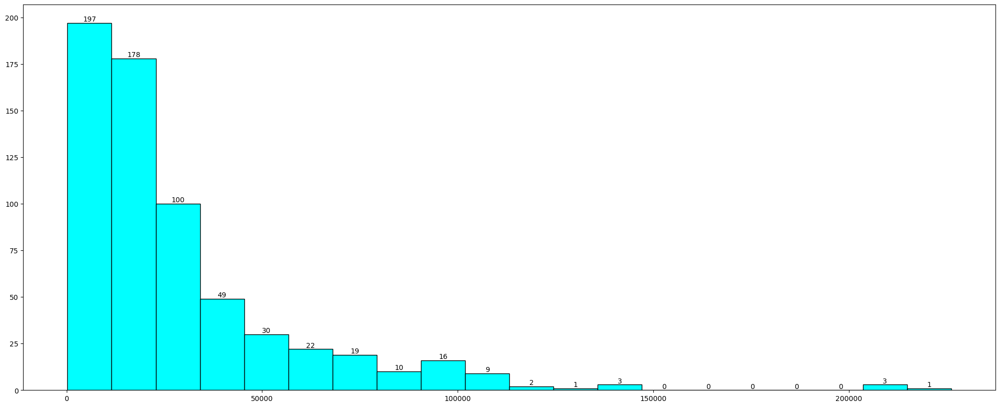

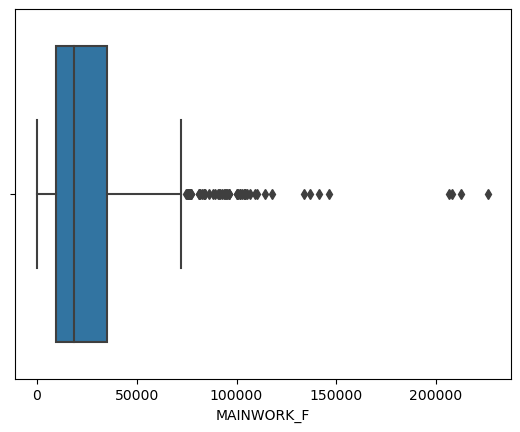

Description of MAIN_CL_M
----------------------------------------------------------------------------
count      640.000000
mean      5424.342188
std       4739.161969
min          0.000000
25%       2023.500000
50%       4160.500000
75%       7695.000000
max      29113.000000
Name: MAIN_CL_M, dtype: float64 Skew : 1.68
Distribution of MAIN_CL_M
----------------------------------------------------------------------------
BoxPlot of MAIN_CL_M
----------------------------------------------------------------------------


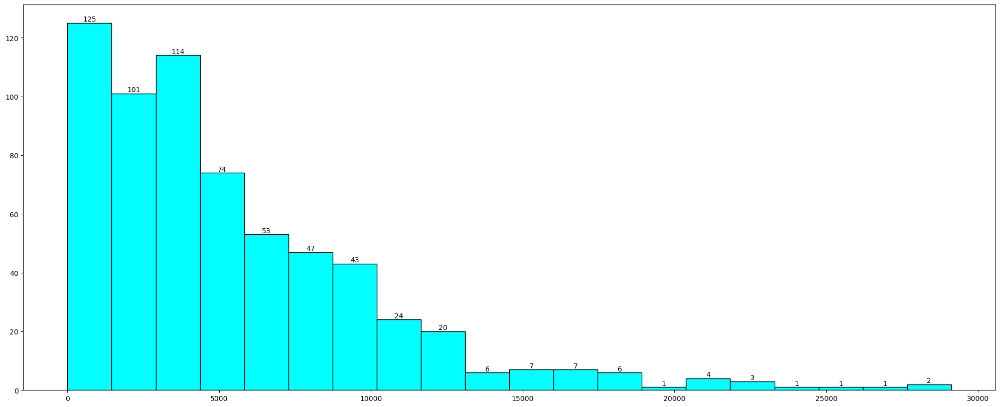

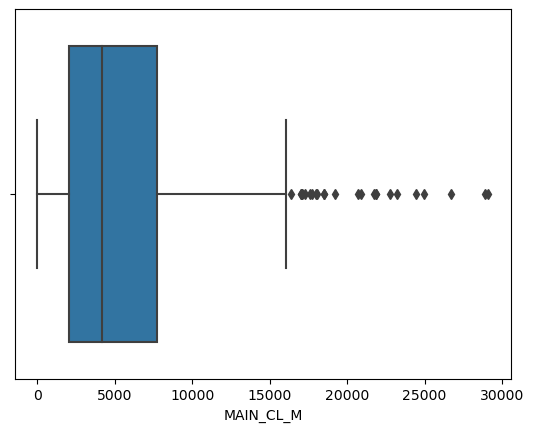

Description of MAIN_CL_F
----------------------------------------------------------------------------
count      640.000000
mean      5486.042188
std       5326.362728
min          0.000000
25%       1920.250000
50%       3908.500000
75%       7286.250000
max      36193.000000
Name: MAIN_CL_F, dtype: float64 Skew : 2.38
Distribution of MAIN_CL_F
----------------------------------------------------------------------------
BoxPlot of MAIN_CL_F
----------------------------------------------------------------------------


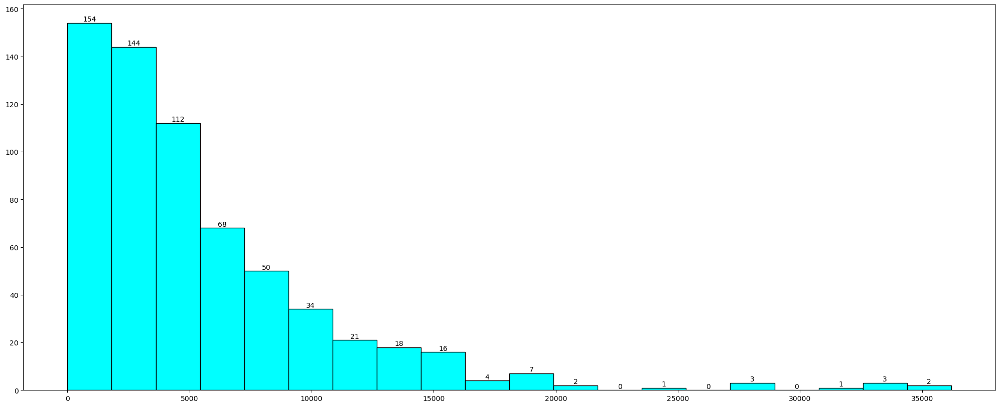

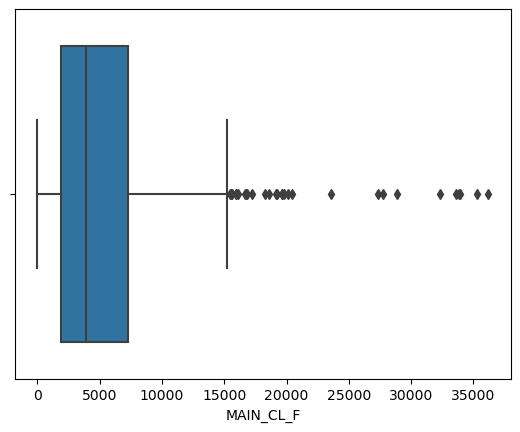

Description of MAIN_AL_M
----------------------------------------------------------------------------
count      640.000000
mean      5849.109375
std       6399.507966
min          0.000000
25%       1070.250000
50%       3936.500000
75%       8067.250000
max      40843.000000
Name: MAIN_AL_M, dtype: float64 Skew : 1.88
Distribution of MAIN_AL_M
----------------------------------------------------------------------------
BoxPlot of MAIN_AL_M
----------------------------------------------------------------------------


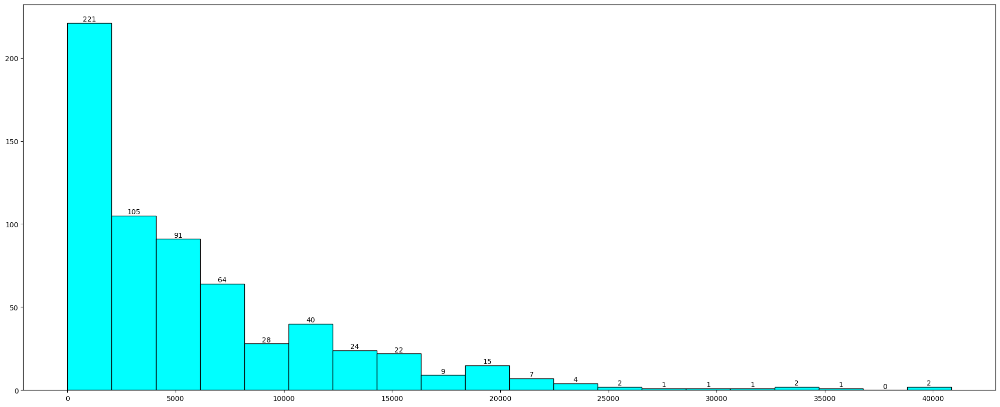

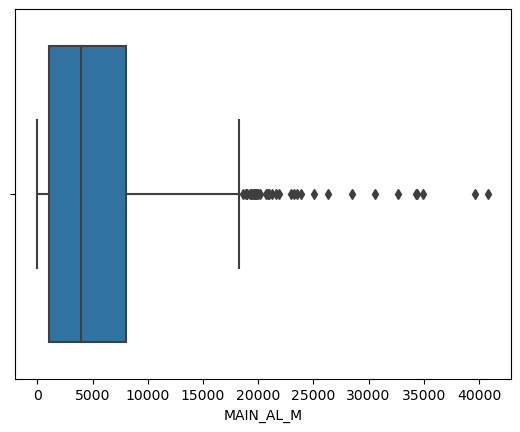

Description of MAIN_AL_F
----------------------------------------------------------------------------
count      640.000000
mean      8925.995312
std      12864.287584
min          0.000000
25%       1408.750000
50%       3933.500000
75%      10617.500000
max      87945.000000
Name: MAIN_AL_F, dtype: float64 Skew : 2.72
Distribution of MAIN_AL_F
----------------------------------------------------------------------------
BoxPlot of MAIN_AL_F
----------------------------------------------------------------------------


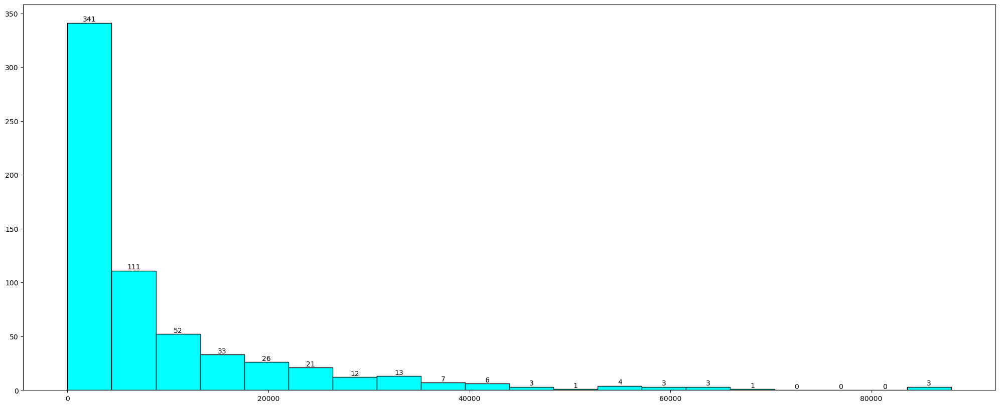

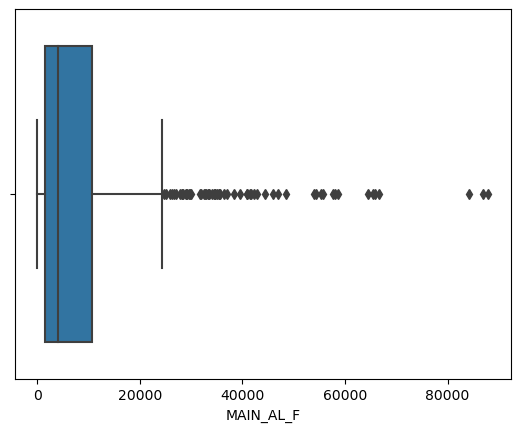

Description of MAIN_HH_M
----------------------------------------------------------------------------
count      640.000000
mean       883.893750
std       1278.642345
min          0.000000
25%        187.500000
50%        498.500000
75%       1099.250000
max      16429.000000
Name: MAIN_HH_M, dtype: float64 Skew : 4.88
Distribution of MAIN_HH_M
----------------------------------------------------------------------------
BoxPlot of MAIN_HH_M
----------------------------------------------------------------------------


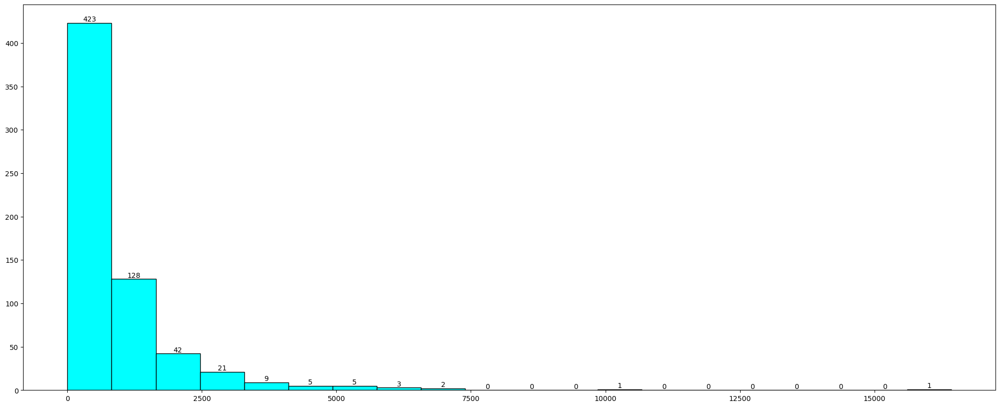

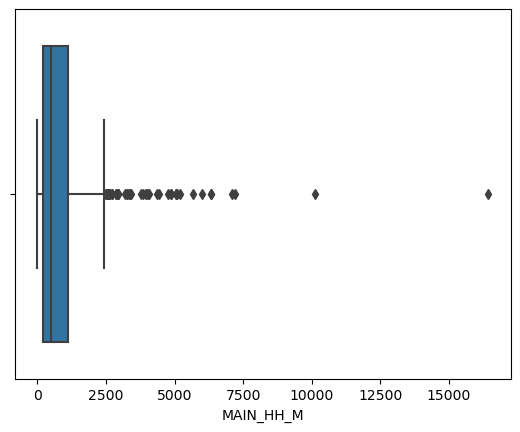

Description of MAIN_HH_F
----------------------------------------------------------------------------
count      640.000000
mean      1380.773438
std       3179.414449
min          0.000000
25%        248.750000
50%        540.500000
75%       1435.750000
max      45979.000000
Name: MAIN_HH_F, dtype: float64 Skew : 8.58
Distribution of MAIN_HH_F
----------------------------------------------------------------------------
BoxPlot of MAIN_HH_F
----------------------------------------------------------------------------


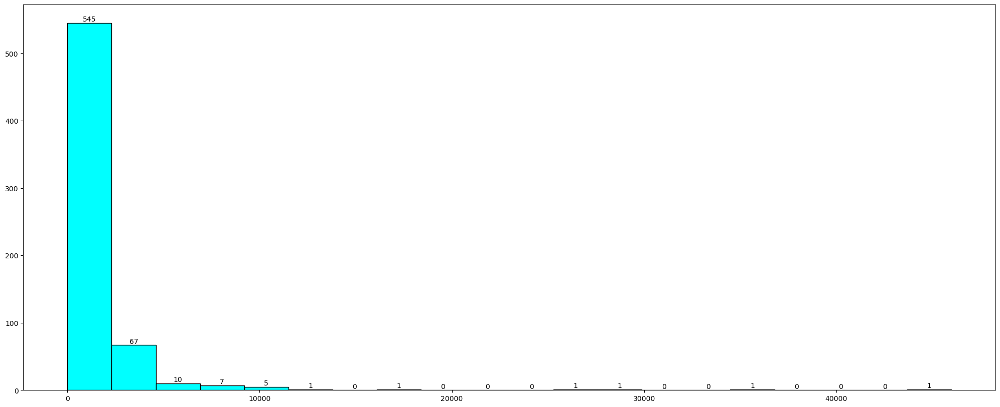

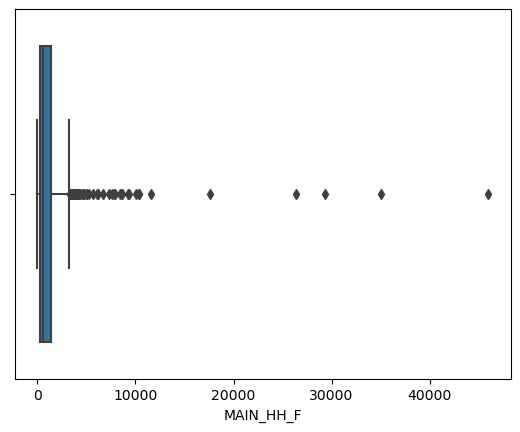

Description of MAIN_OT_M
----------------------------------------------------------------------------
count       640.000000
mean      18047.101562
std       26068.480886
min          36.000000
25%        3997.500000
50%        9598.000000
75%       21249.500000
max      240855.000000
Name: MAIN_OT_M, dtype: float64 Skew : 3.89
Distribution of MAIN_OT_M
----------------------------------------------------------------------------
BoxPlot of MAIN_OT_M
----------------------------------------------------------------------------


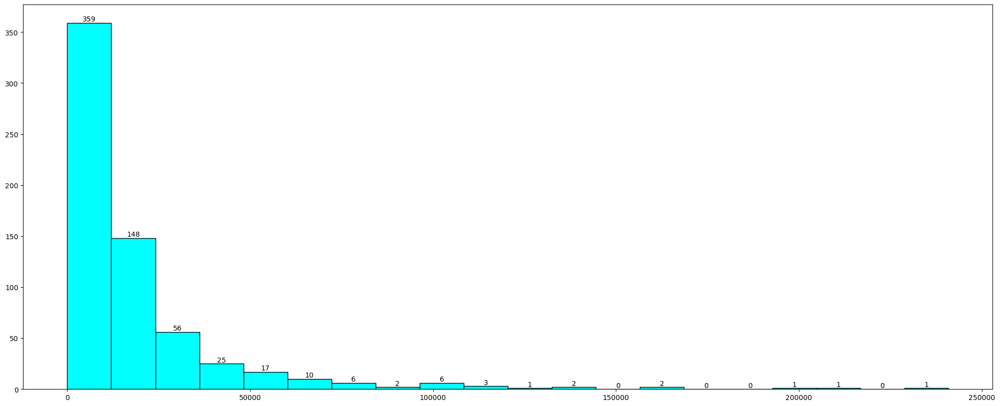

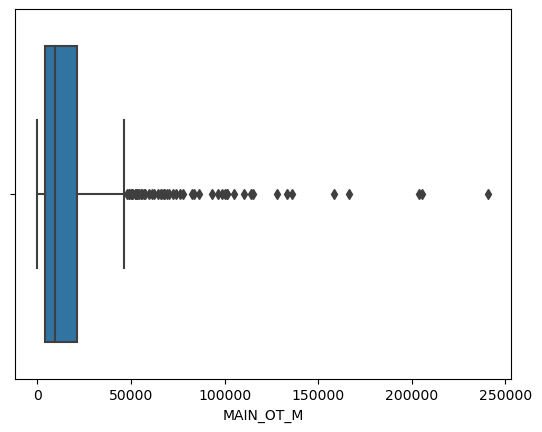

Description of MAIN_OT_F
----------------------------------------------------------------------------
count       640.000000
mean      12406.035938
std       18972.202369
min         153.000000
25%        3142.500000
50%        6380.500000
75%       14368.250000
max      209355.000000
Name: MAIN_OT_F, dtype: float64 Skew : 5.34
Distribution of MAIN_OT_F
----------------------------------------------------------------------------
BoxPlot of MAIN_OT_F
----------------------------------------------------------------------------


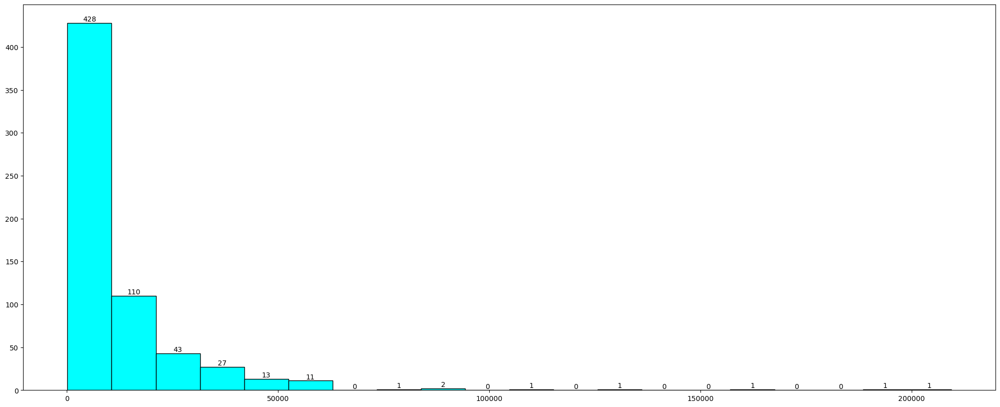

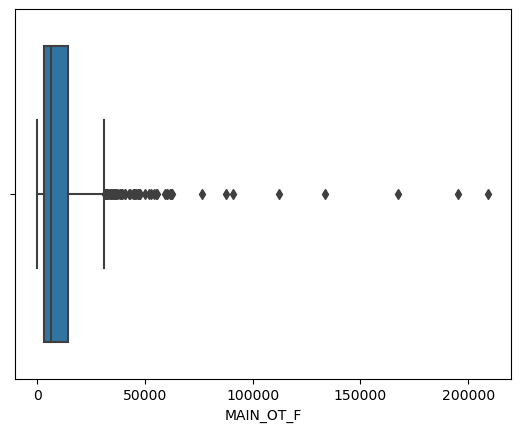

Description of MARGWORK_M
----------------------------------------------------------------------------
count      640.000000
mean      7787.960938
std       7410.791691
min         35.000000
25%       2937.500000
50%       5627.000000
75%       9800.250000
max      47553.000000
Name: MARGWORK_M, dtype: float64 Skew : 2.0
Distribution of MARGWORK_M
----------------------------------------------------------------------------
BoxPlot of MARGWORK_M
----------------------------------------------------------------------------


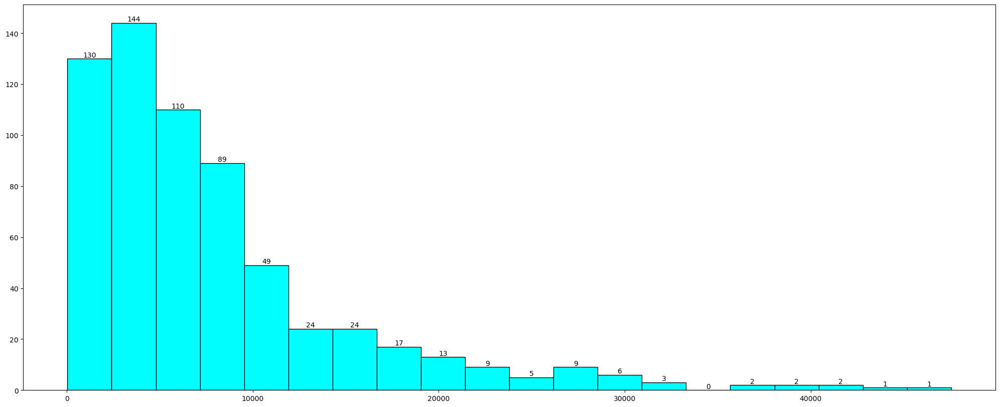

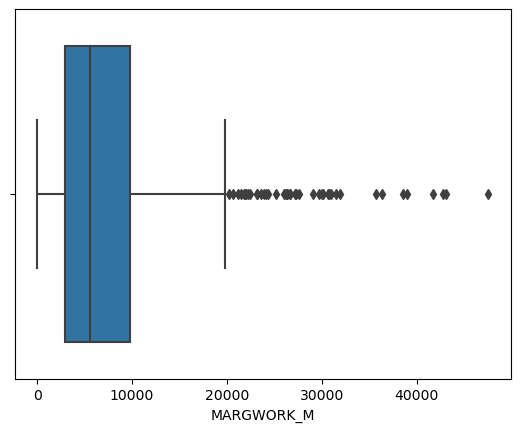

Description of MARGWORK_F
----------------------------------------------------------------------------
count      640.000000
mean     13096.914062
std      10996.474528
min        117.000000
25%       5424.500000
50%      10175.000000
75%      18879.250000
max      66915.000000
Name: MARGWORK_F, dtype: float64 Skew : 1.52
Distribution of MARGWORK_F
----------------------------------------------------------------------------
BoxPlot of MARGWORK_F
----------------------------------------------------------------------------


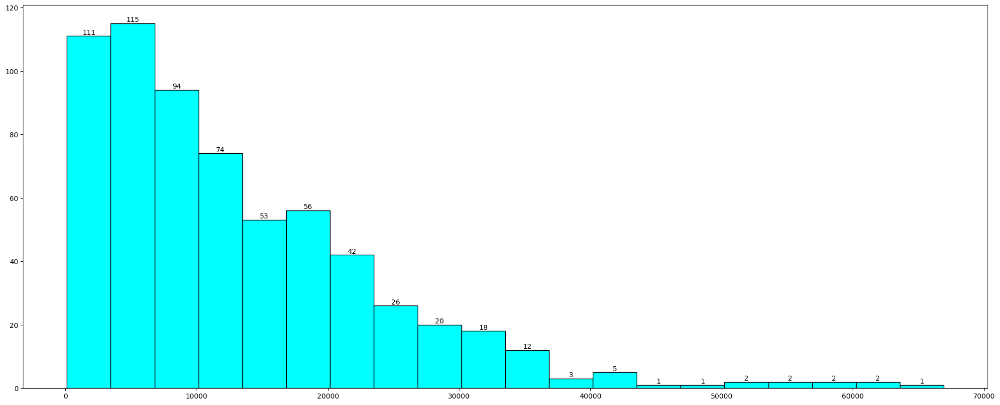

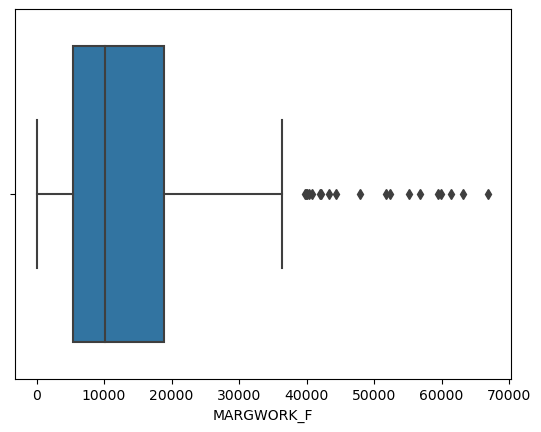

Description of MARG_CL_M
----------------------------------------------------------------------------
count      640.000000
mean      1040.737500
std       1311.546847
min          0.000000
25%        311.750000
50%        606.500000
75%       1281.000000
max      13201.000000
Name: MARG_CL_M, dtype: float64 Skew : 3.63
Distribution of MARG_CL_M
----------------------------------------------------------------------------
BoxPlot of MARG_CL_M
----------------------------------------------------------------------------


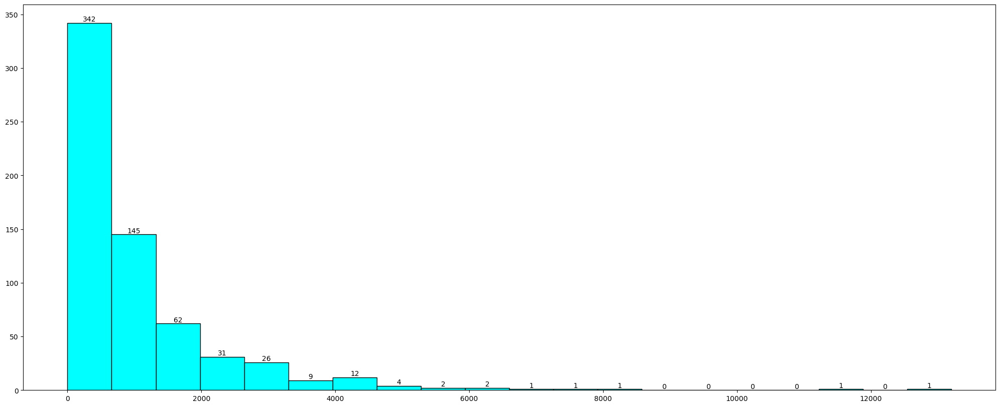

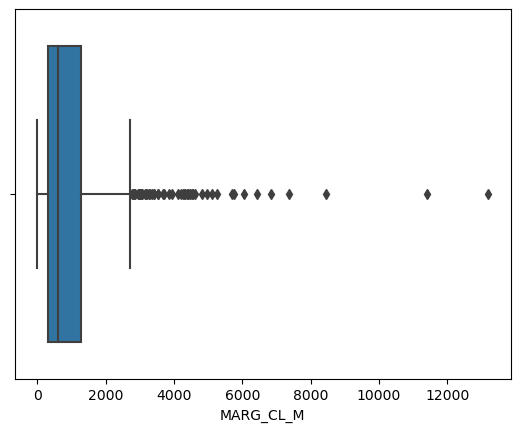

Description of MARG_CL_F
----------------------------------------------------------------------------
count      640.000000
mean      2307.682813
std       3564.626095
min          0.000000
25%        630.250000
50%       1226.000000
75%       2659.250000
max      44324.000000
Name: MARG_CL_F, dtype: float64 Skew : 5.51
Distribution of MARG_CL_F
----------------------------------------------------------------------------
BoxPlot of MARG_CL_F
----------------------------------------------------------------------------


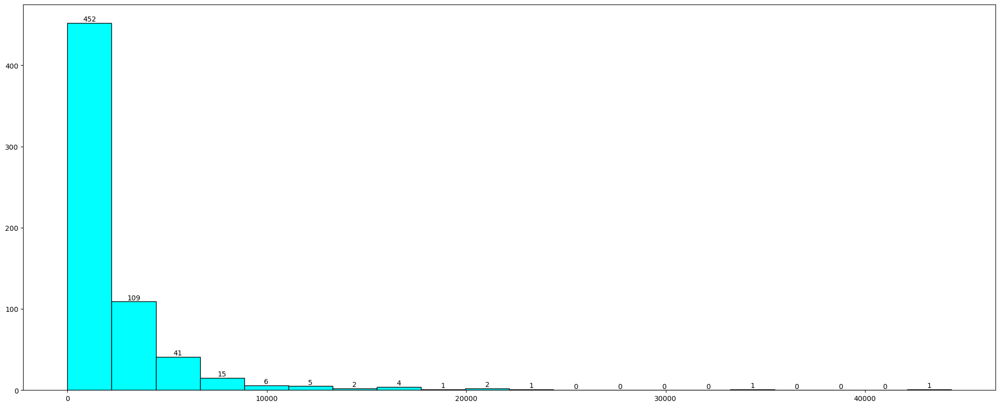

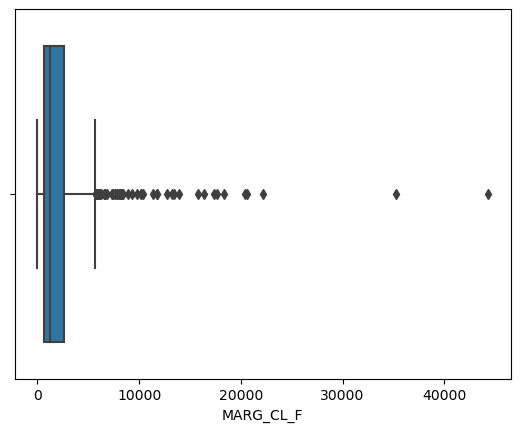

Description of MARG_AL_M
----------------------------------------------------------------------------
count      640.000000
mean      3304.326562
std       3781.555707
min          0.000000
25%        873.500000
50%       2062.000000
75%       4300.750000
max      23719.000000
Name: MARG_AL_M, dtype: float64 Skew : 2.22
Distribution of MARG_AL_M
----------------------------------------------------------------------------
BoxPlot of MARG_AL_M
----------------------------------------------------------------------------


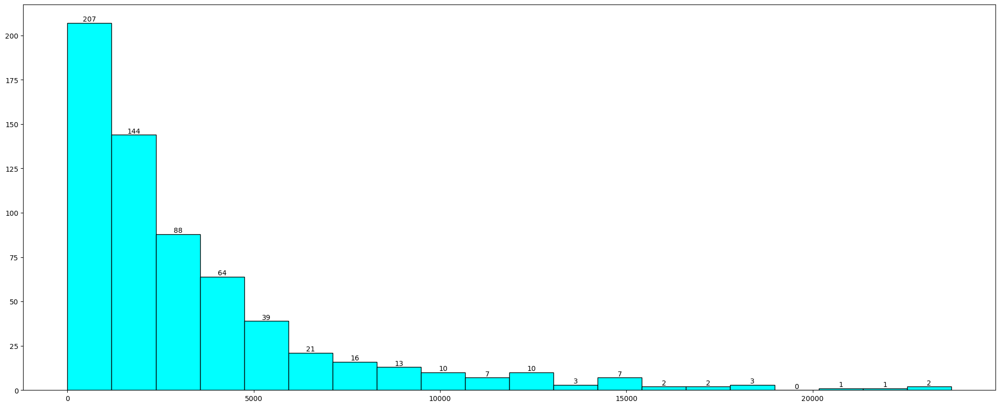

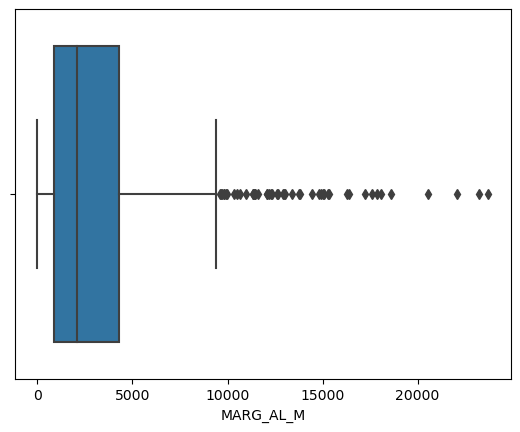

Description of MARG_AL_F
----------------------------------------------------------------------------
count      640.000000
mean      6463.281250
std       6773.876298
min          0.000000
25%       1402.500000
50%       4020.500000
75%       9089.250000
max      45301.000000
Name: MARG_AL_F, dtype: float64 Skew : 1.72
Distribution of MARG_AL_F
----------------------------------------------------------------------------
BoxPlot of MARG_AL_F
----------------------------------------------------------------------------


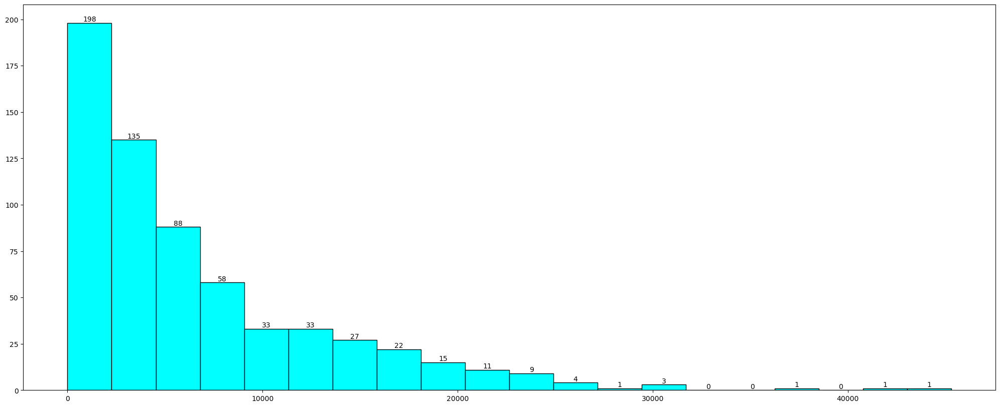

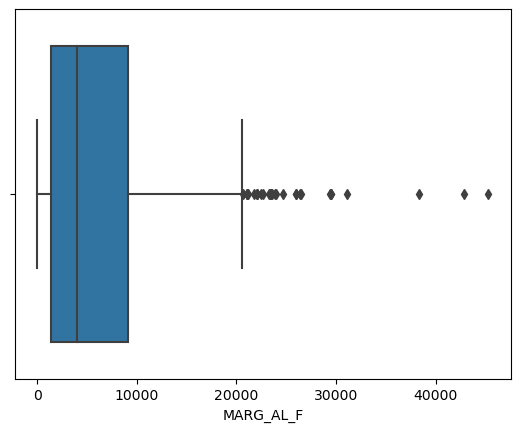

Description of MARG_HH_M
----------------------------------------------------------------------------
count     640.000000
mean      316.742188
std       462.661891
min         0.000000
25%        71.750000
50%       166.000000
75%       356.500000
max      4298.000000
Name: MARG_HH_M, dtype: float64 Skew : 3.88
Distribution of MARG_HH_M
----------------------------------------------------------------------------
BoxPlot of MARG_HH_M
----------------------------------------------------------------------------


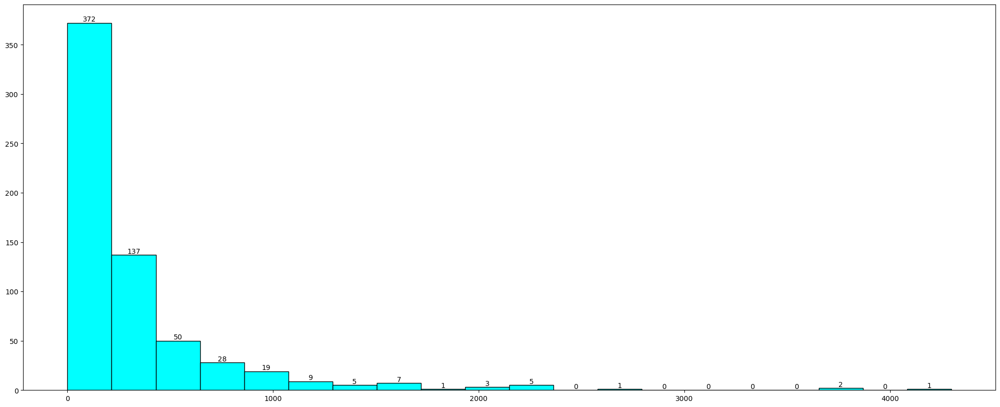

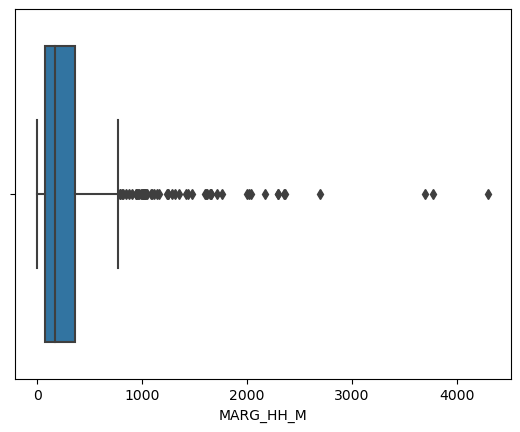

Description of MARG_HH_F
----------------------------------------------------------------------------
count      640.000000
mean       786.626562
std       1198.718213
min          0.000000
25%        171.750000
50%        429.000000
75%        962.500000
max      15448.000000
Name: MARG_HH_F, dtype: float64 Skew : 5.36
Distribution of MARG_HH_F
----------------------------------------------------------------------------
BoxPlot of MARG_HH_F
----------------------------------------------------------------------------


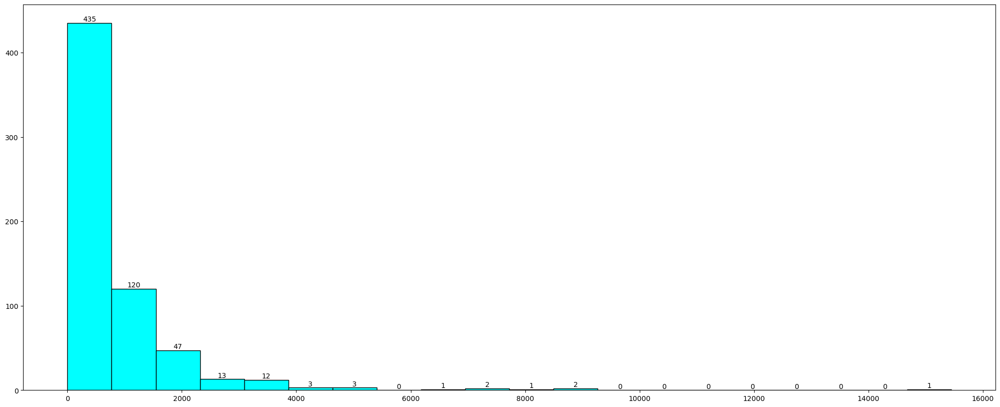

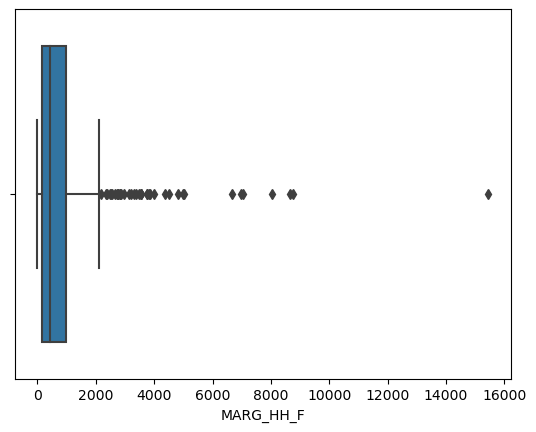

Description of MARG_OT_M
----------------------------------------------------------------------------
count      640.000000
mean      3126.154687
std       3609.391821
min          7.000000
25%        935.500000
50%       2036.000000
75%       3985.250000
max      24728.000000
Name: MARG_OT_M, dtype: float64 Skew : 2.7
Distribution of MARG_OT_M
----------------------------------------------------------------------------
BoxPlot of MARG_OT_M
----------------------------------------------------------------------------


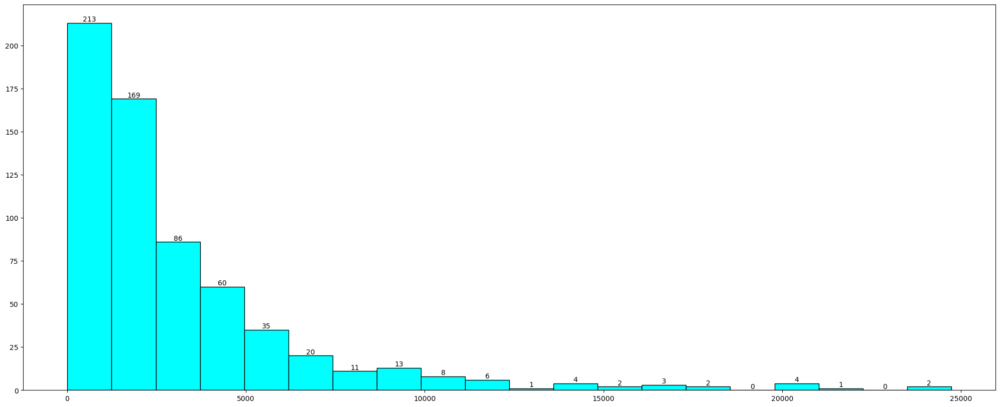

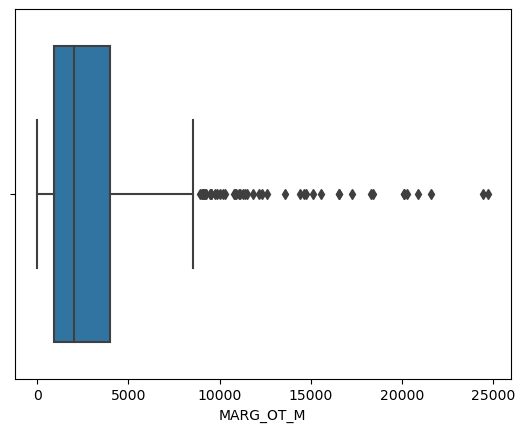

Description of MARG_OT_F
----------------------------------------------------------------------------
count      640.000000
mean      3539.323438
std       4115.191314
min         19.000000
25%       1071.750000
50%       2349.500000
75%       4400.500000
max      36377.000000
Name: MARG_OT_F, dtype: float64 Skew : 3.06
Distribution of MARG_OT_F
----------------------------------------------------------------------------
BoxPlot of MARG_OT_F
----------------------------------------------------------------------------


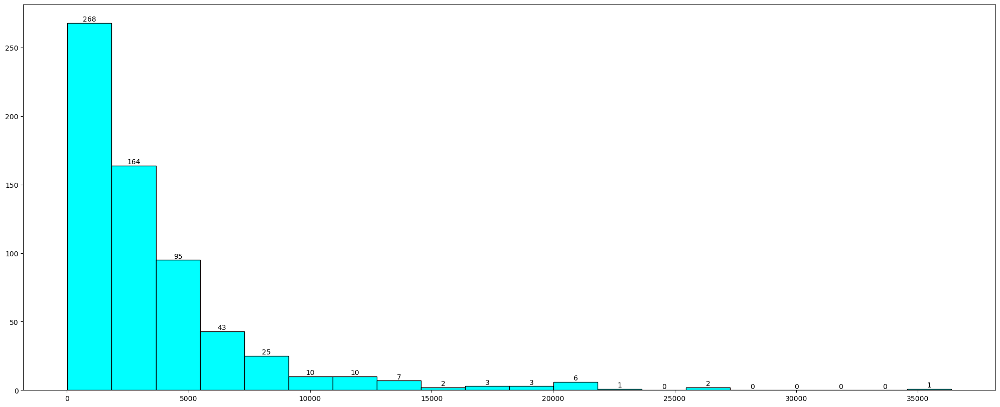

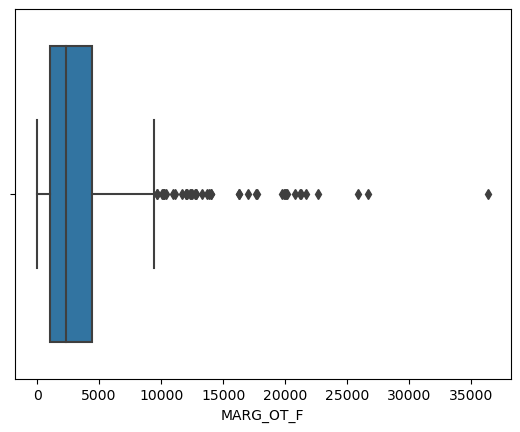

Description of MARGWORK_3_6_M
----------------------------------------------------------------------------
count       640.000000
mean      41948.168750
std       39045.316918
min         291.000000
25%       16208.250000
50%       30315.000000
75%       57218.750000
max      300937.000000
Name: MARGWORK_3_6_M, dtype: float64 Skew : 2.15
Distribution of MARGWORK_3_6_M
----------------------------------------------------------------------------
BoxPlot of MARGWORK_3_6_M
----------------------------------------------------------------------------


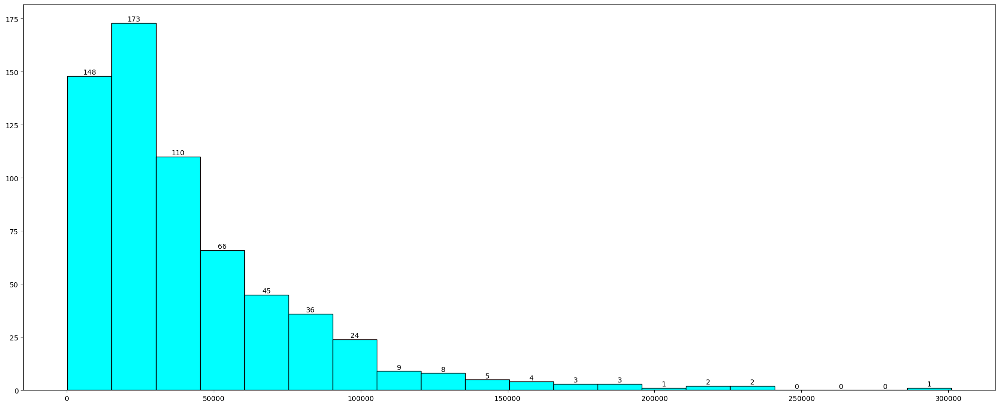

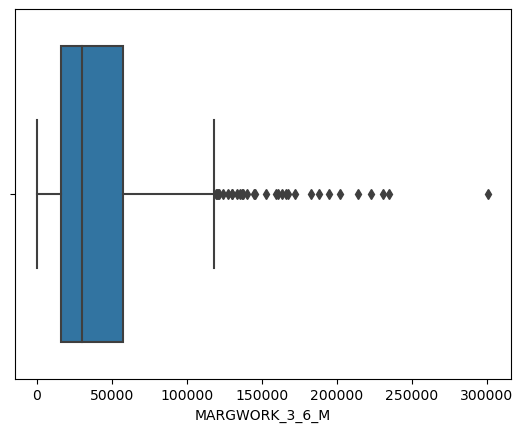

Description of MARGWORK_3_6_F
----------------------------------------------------------------------------
count       640.000000
mean      81076.323438
std       82970.406216
min         341.000000
25%       26619.500000
50%       56793.000000
75%      107924.000000
max      676450.000000
Name: MARGWORK_3_6_F, dtype: float64 Skew : 2.54
Distribution of MARGWORK_3_6_F
----------------------------------------------------------------------------
BoxPlot of MARGWORK_3_6_F
----------------------------------------------------------------------------


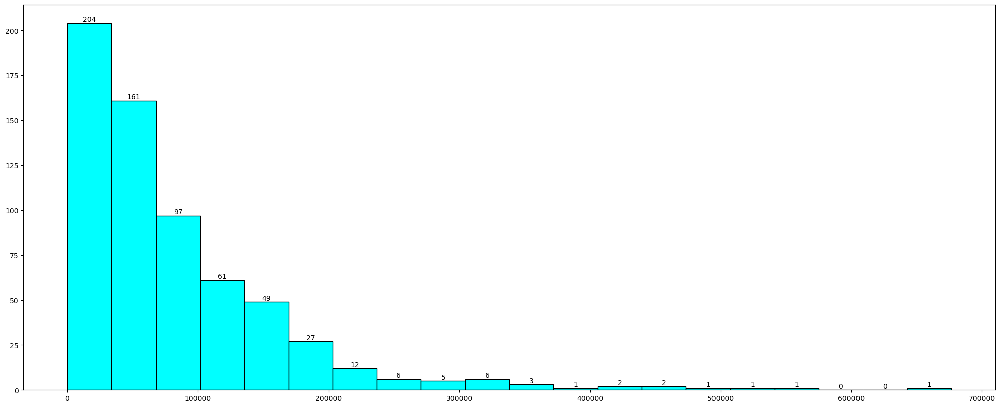

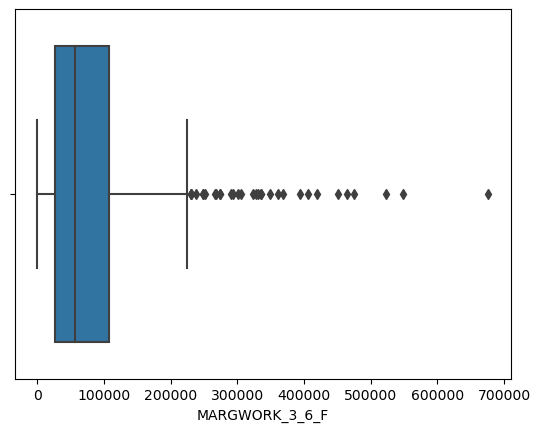

Description of MARG_CL_3_6_M
----------------------------------------------------------------------------
count      640.000000
mean      6394.987500
std       6019.806644
min         27.000000
25%       2372.000000
50%       4630.000000
75%       8167.000000
max      39106.000000
Name: MARG_CL_3_6_M, dtype: float64 Skew : 1.89
Distribution of MARG_CL_3_6_M
----------------------------------------------------------------------------
BoxPlot of MARG_CL_3_6_M
----------------------------------------------------------------------------


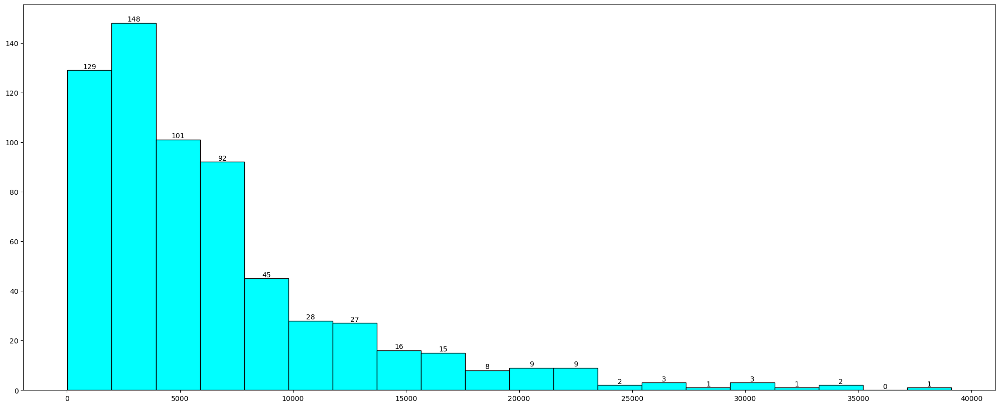

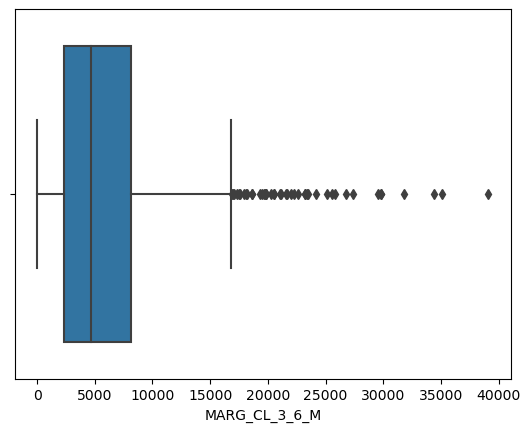

Description of MARG_CL_3_6_F
----------------------------------------------------------------------------
count      640.000000
mean     10339.864063
std       8467.473429
min         85.000000
25%       4351.500000
50%       8295.000000
75%      15102.000000
max      50065.000000
Name: MARG_CL_3_6_F, dtype: float64 Skew : 1.35
Distribution of MARG_CL_3_6_F
----------------------------------------------------------------------------
BoxPlot of MARG_CL_3_6_F
----------------------------------------------------------------------------


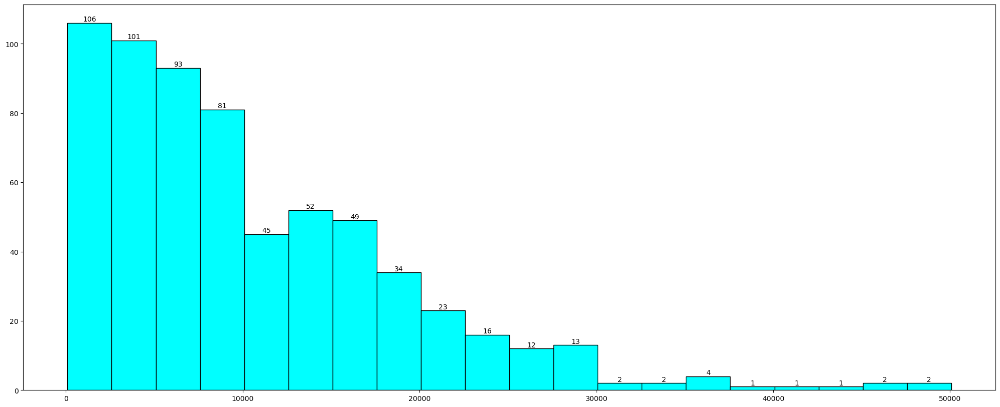

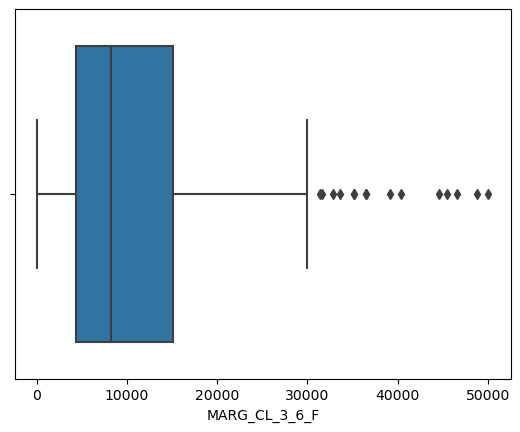

Description of MARG_AL_3_6_M
----------------------------------------------------------------------------
count     640.000000
mean      789.848438
std       905.639279
min         0.000000
25%       235.500000
50%       480.500000
75%       986.000000
max      7426.000000
Name: MARG_AL_3_6_M, dtype: float64 Skew : 2.83
Distribution of MARG_AL_3_6_M
----------------------------------------------------------------------------
BoxPlot of MARG_AL_3_6_M
----------------------------------------------------------------------------


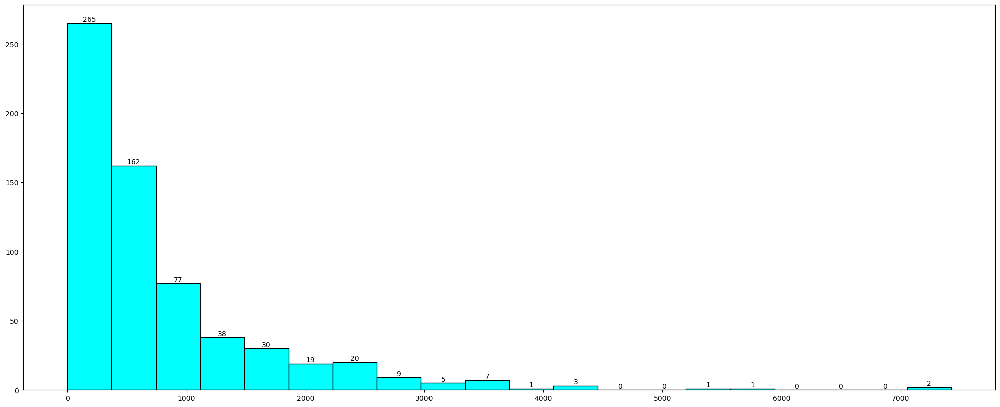

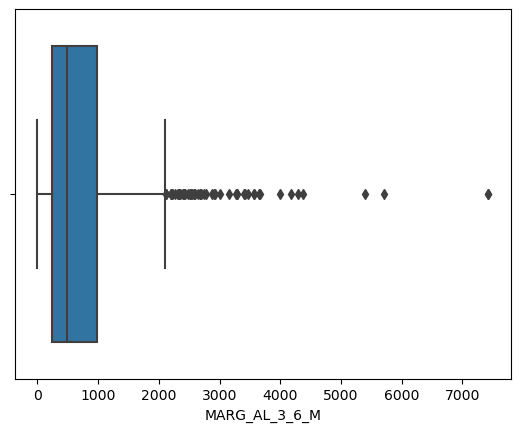

Description of MARG_AL_3_6_F
----------------------------------------------------------------------------
count      640.000000
mean      1749.584375
std       2496.541514
min          0.000000
25%        497.250000
50%        985.500000
75%       2059.000000
max      27171.000000
Name: MARG_AL_3_6_F, dtype: float64 Skew : 4.72
Distribution of MARG_AL_3_6_F
----------------------------------------------------------------------------
BoxPlot of MARG_AL_3_6_F
----------------------------------------------------------------------------


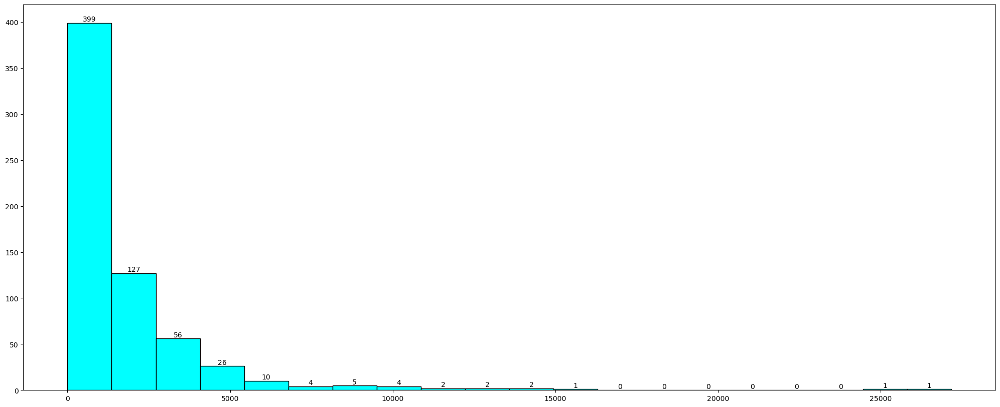

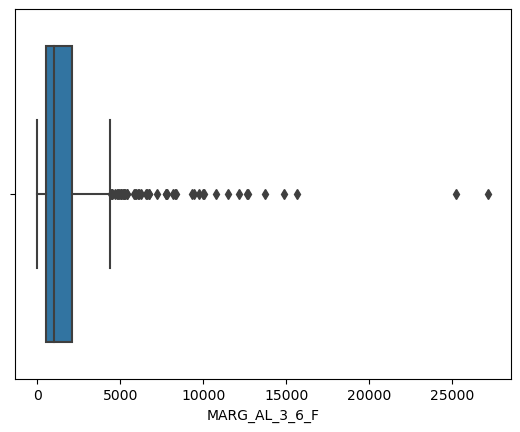

Description of MARG_HH_3_6_M
----------------------------------------------------------------------------
count      640.000000
mean      2743.635938
std       3059.586387
min          0.000000
25%        718.750000
50%       1714.500000
75%       3702.250000
max      19343.000000
Name: MARG_HH_3_6_M, dtype: float64 Skew : 2.07
Distribution of MARG_HH_3_6_M
----------------------------------------------------------------------------
BoxPlot of MARG_HH_3_6_M
----------------------------------------------------------------------------


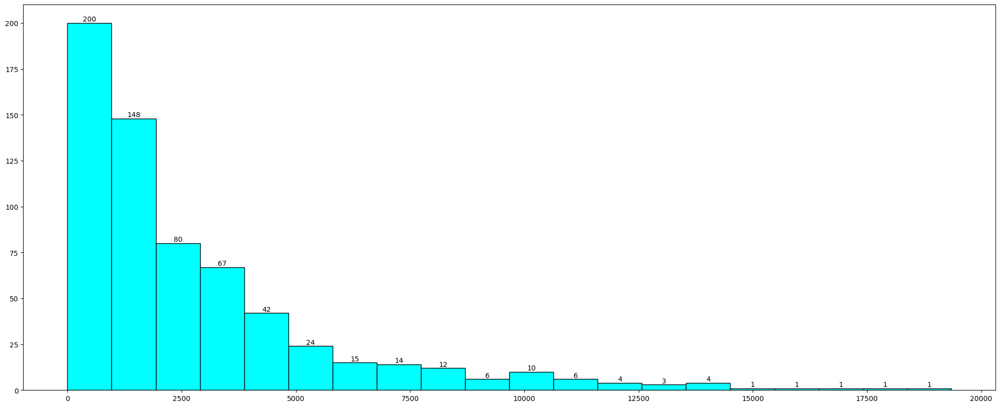

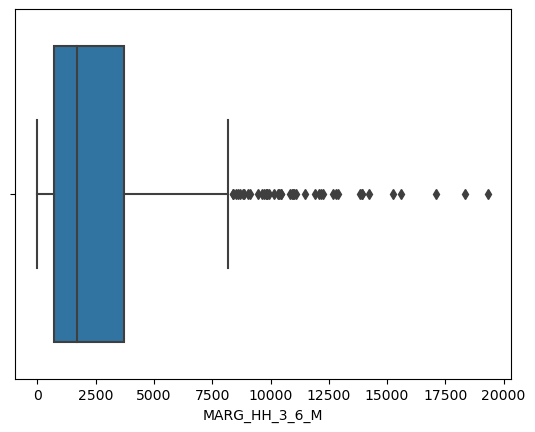

Description of MARG_HH_3_6_F
----------------------------------------------------------------------------
count      640.00000
mean      5169.85000
std       5335.64096
min          0.00000
25%       1113.75000
50%       3294.00000
75%       7502.25000
max      36253.00000
Name: MARG_HH_3_6_F, dtype: float64 Skew : 1.59
Distribution of MARG_HH_3_6_F
----------------------------------------------------------------------------
BoxPlot of MARG_HH_3_6_F
----------------------------------------------------------------------------


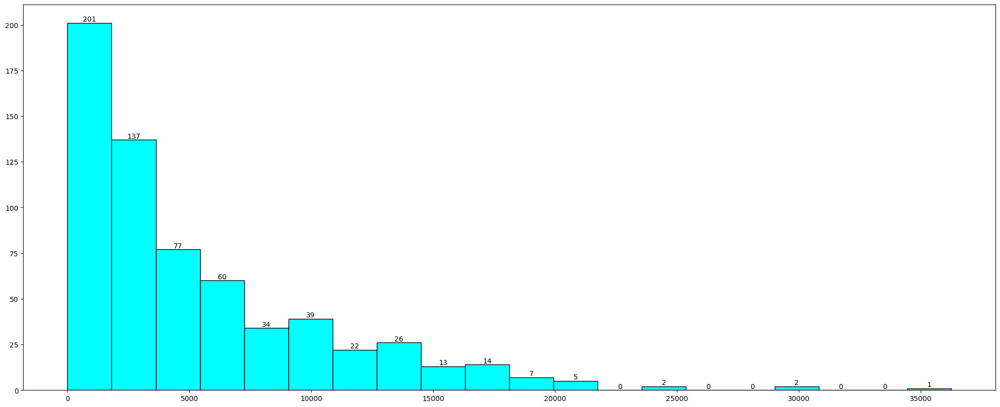

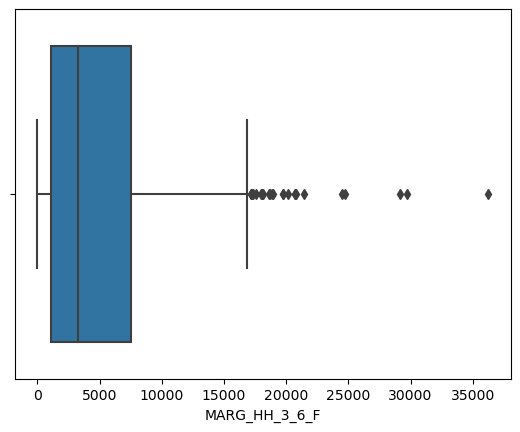

Description of MARG_OT_3_6_M
----------------------------------------------------------------------------
count     640.000000
mean      245.362500
std       358.728567
min         0.000000
25%        58.000000
50%       129.500000
75%       276.000000
max      3535.000000
Name: MARG_OT_3_6_M, dtype: float64 Skew : 3.99
Distribution of MARG_OT_3_6_M
----------------------------------------------------------------------------
BoxPlot of MARG_OT_3_6_M
----------------------------------------------------------------------------


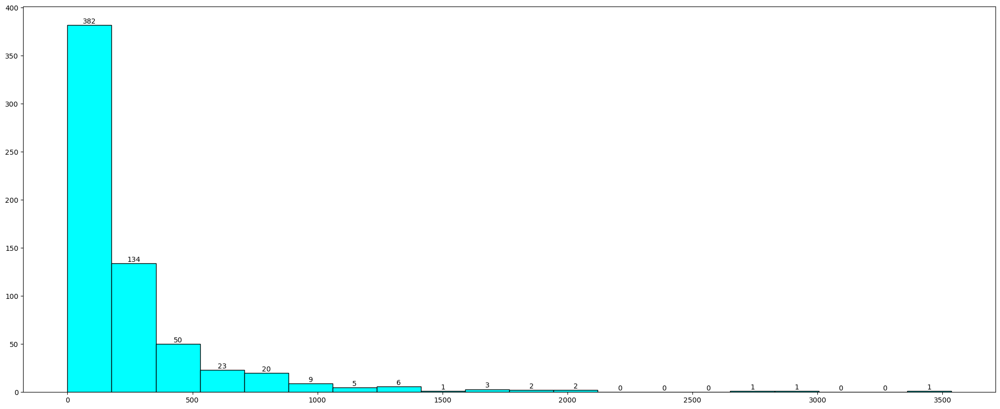

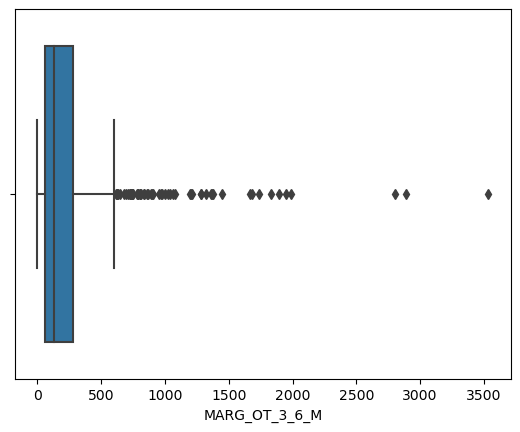

Description of MARG_OT_3_6_F
----------------------------------------------------------------------------
count      640.000000
mean       585.884375
std        900.025817
min          0.000000
25%        127.750000
50%        320.500000
75%        719.250000
max      12094.000000
Name: MARG_OT_3_6_F, dtype: float64 Skew : 5.61
Distribution of MARG_OT_3_6_F
----------------------------------------------------------------------------
BoxPlot of MARG_OT_3_6_F
----------------------------------------------------------------------------


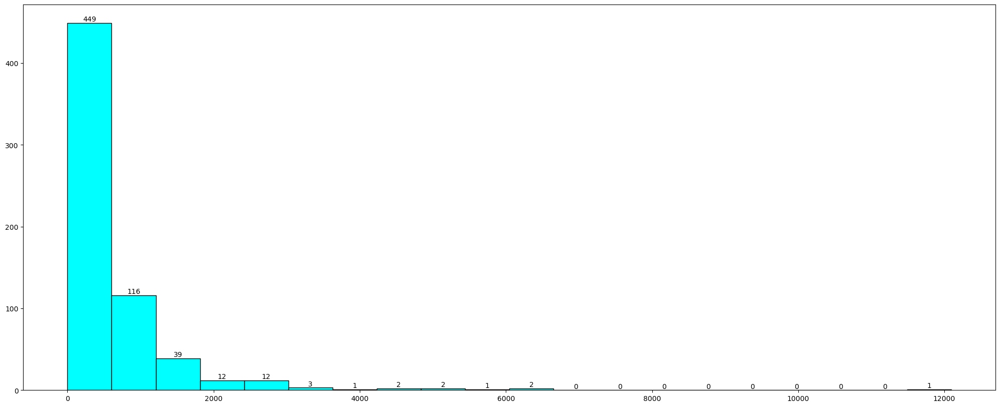

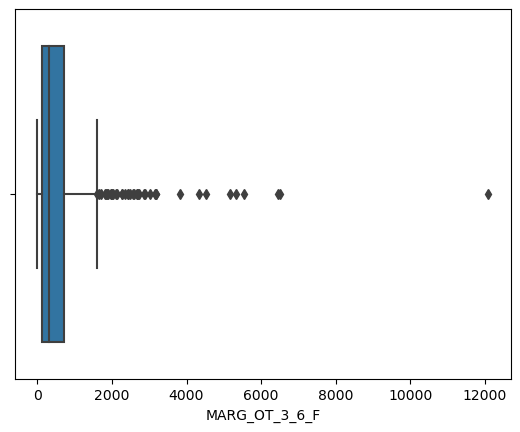

Description of MARGWORK_0_3_M
----------------------------------------------------------------------------
count      640.000000
mean      2616.140625
std       3036.964381
min          7.000000
25%        755.000000
50%       1681.500000
75%       3320.250000
max      20648.000000
Name: MARGWORK_0_3_M, dtype: float64 Skew : 2.69
Distribution of MARGWORK_0_3_M
----------------------------------------------------------------------------
BoxPlot of MARGWORK_0_3_M
----------------------------------------------------------------------------


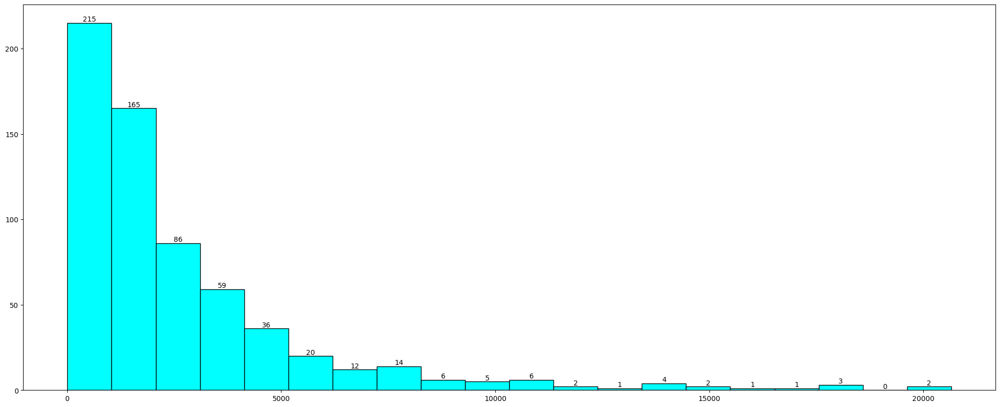

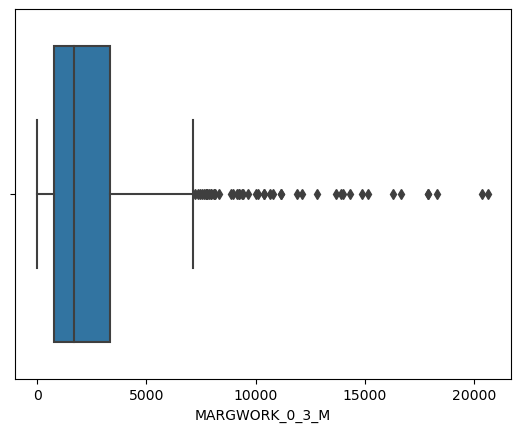

Description of MARGWORK_0_3_F
----------------------------------------------------------------------------
count      640.000000
mean      2834.545312
std       3327.836932
min         14.000000
25%        833.500000
50%       1834.500000
75%       3610.500000
max      25844.000000
Name: MARGWORK_0_3_F, dtype: float64 Skew : 3.04
Distribution of MARGWORK_0_3_F
----------------------------------------------------------------------------
BoxPlot of MARGWORK_0_3_F
----------------------------------------------------------------------------


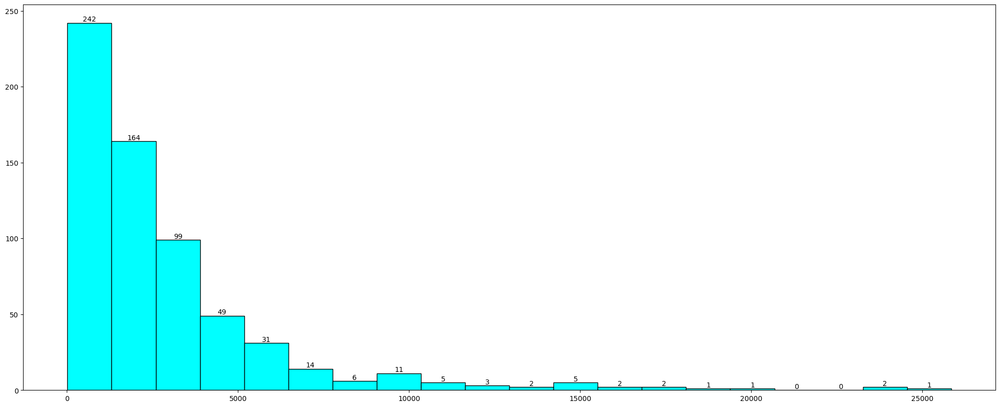

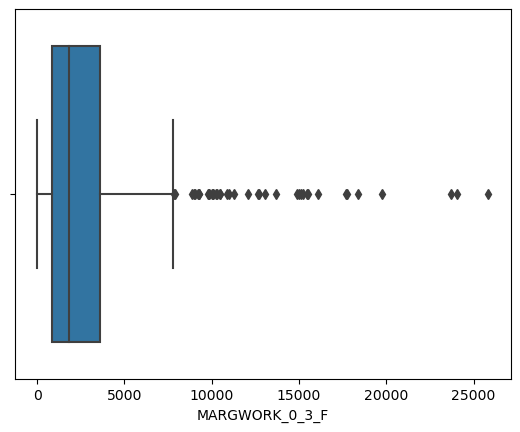

Description of MARG_CL_0_3_M
----------------------------------------------------------------------------
count     640.000000
mean     1392.973438
std      1489.707052
min         4.000000
25%       489.500000
50%       949.000000
75%      1714.000000
max      9875.000000
Name: MARG_CL_0_3_M, dtype: float64 Skew : 2.65
Distribution of MARG_CL_0_3_M
----------------------------------------------------------------------------
BoxPlot of MARG_CL_0_3_M
----------------------------------------------------------------------------


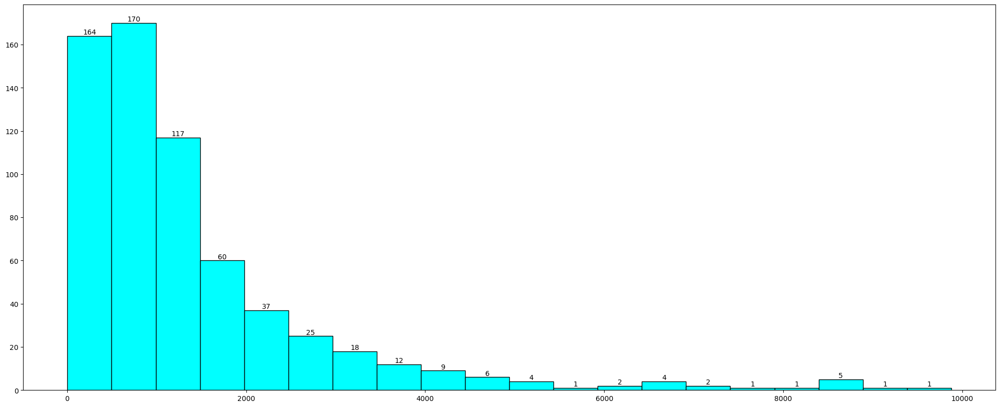

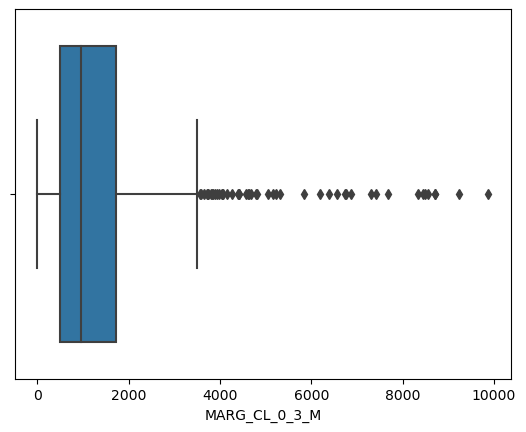

Description of MARG_CL_0_3_F
----------------------------------------------------------------------------
count      640.000000
mean      2757.050000
std       2788.776676
min         30.000000
25%        957.250000
50%       1928.000000
75%       3599.750000
max      21611.000000
Name: MARG_CL_0_3_F, dtype: float64 Skew : 2.47
Distribution of MARG_CL_0_3_F
----------------------------------------------------------------------------
BoxPlot of MARG_CL_0_3_F
----------------------------------------------------------------------------


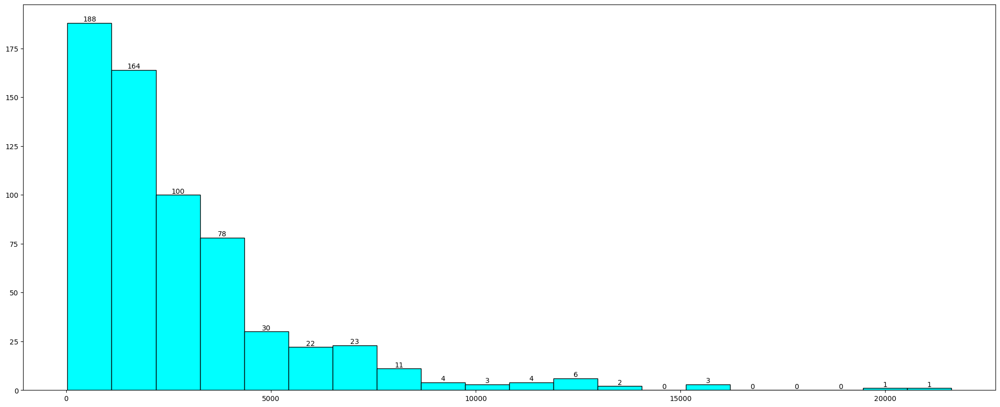

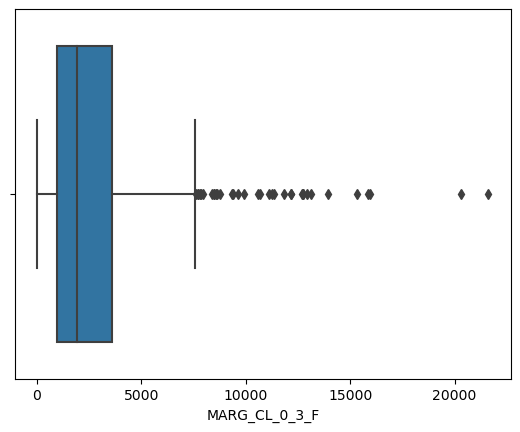

Description of MARG_AL_0_3_M
----------------------------------------------------------------------------
count     640.000000
mean      250.889062
std       453.336594
min         0.000000
25%        47.000000
50%       114.500000
75%       270.750000
max      5775.000000
Name: MARG_AL_0_3_M, dtype: float64 Skew : 5.81
Distribution of MARG_AL_0_3_M
----------------------------------------------------------------------------
BoxPlot of MARG_AL_0_3_M
----------------------------------------------------------------------------


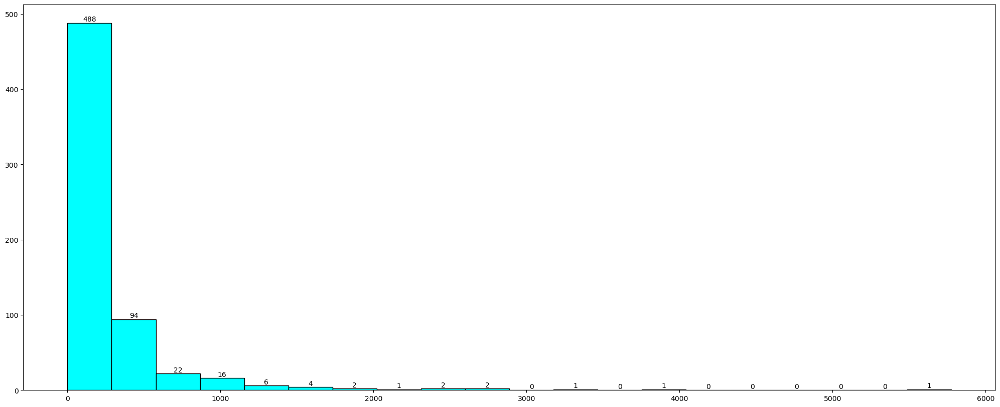

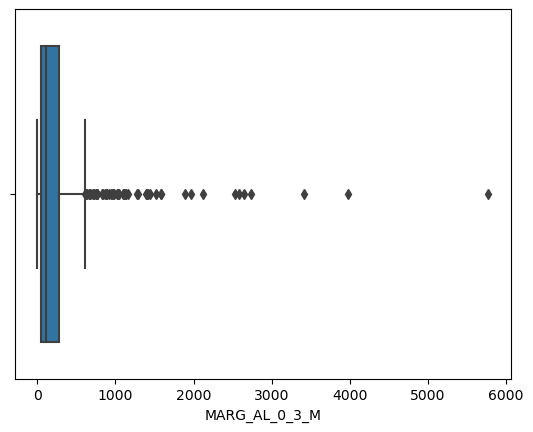

Description of MARG_AL_0_3_F
----------------------------------------------------------------------------
count      640.000000
mean       558.098438
std       1117.642748
min          0.000000
25%        109.000000
50%        247.500000
75%        568.750000
max      17153.000000
Name: MARG_AL_0_3_F, dtype: float64 Skew : 7.69
Distribution of MARG_AL_0_3_F
----------------------------------------------------------------------------
BoxPlot of MARG_AL_0_3_F
----------------------------------------------------------------------------


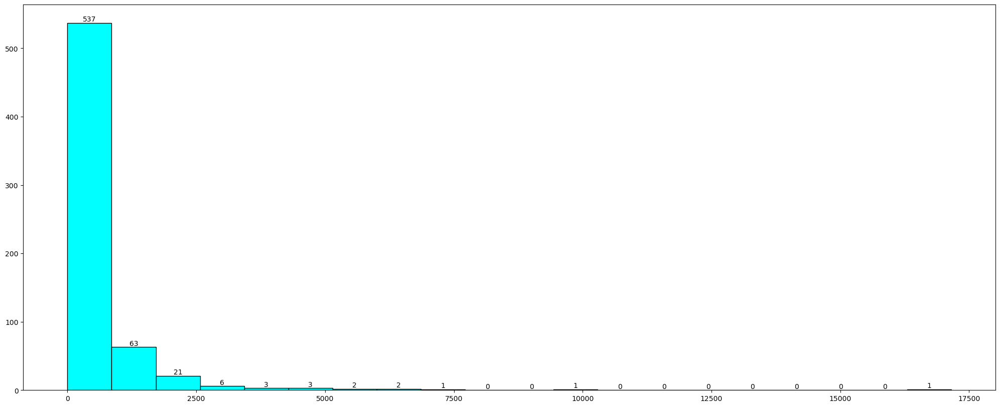

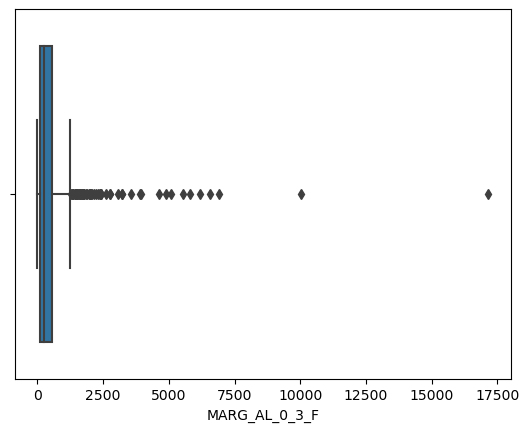

Description of MARG_HH_0_3_M
----------------------------------------------------------------------------
count     640.000000
mean      560.690625
std       762.578991
min         0.000000
25%       136.500000
50%       308.000000
75%       642.000000
max      6116.000000
Name: MARG_HH_0_3_M, dtype: float64 Skew : 3.09
Distribution of MARG_HH_0_3_M
----------------------------------------------------------------------------
BoxPlot of MARG_HH_0_3_M
----------------------------------------------------------------------------


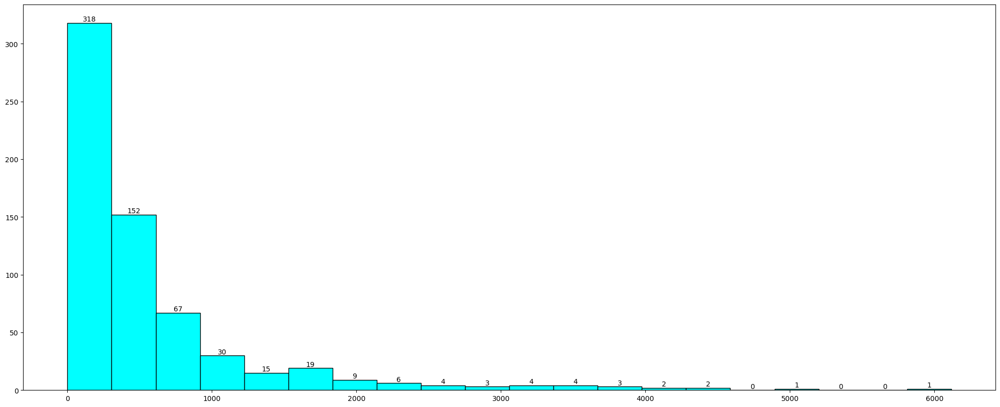

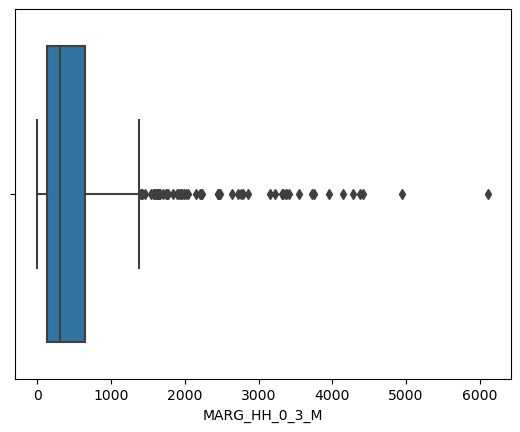

Description of MARG_HH_0_3_F
----------------------------------------------------------------------------
count      640.000000
mean      1293.431250
std       1585.377936
min          0.000000
25%        298.000000
50%        717.000000
75%       1710.750000
max      13714.000000
Name: MARG_HH_0_3_F, dtype: float64 Skew : 2.62
Distribution of MARG_HH_0_3_F
----------------------------------------------------------------------------
BoxPlot of MARG_HH_0_3_F
----------------------------------------------------------------------------


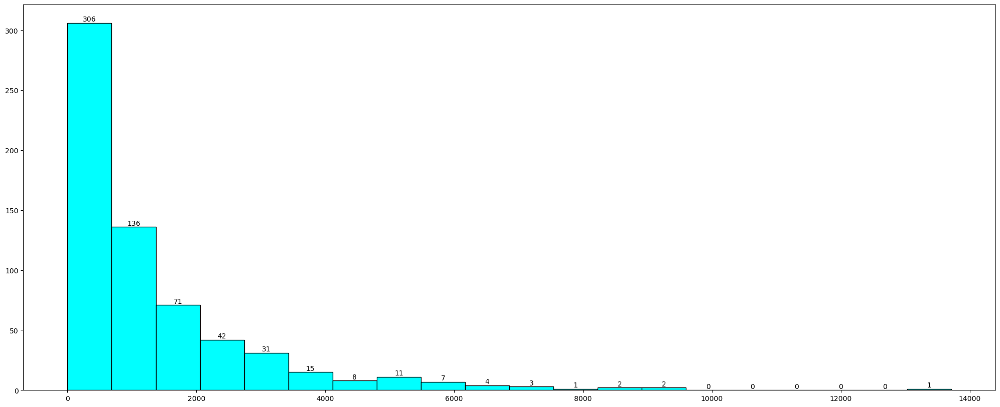

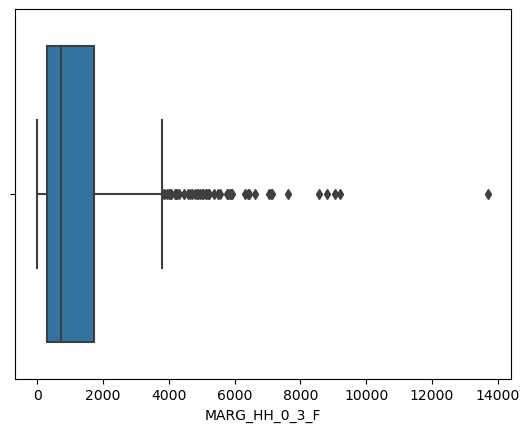

Description of MARG_OT_0_3_M
----------------------------------------------------------------------------
count    640.000000
mean      71.379688
std      107.897627
min        0.000000
25%       14.000000
50%       35.000000
75%       79.000000
max      895.000000
Name: MARG_OT_0_3_M, dtype: float64 Skew : 3.81
Distribution of MARG_OT_0_3_M
----------------------------------------------------------------------------
BoxPlot of MARG_OT_0_3_M
----------------------------------------------------------------------------


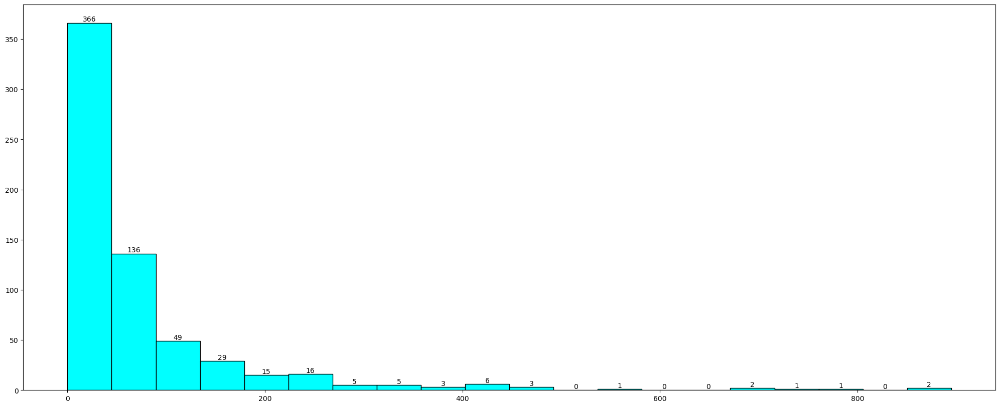

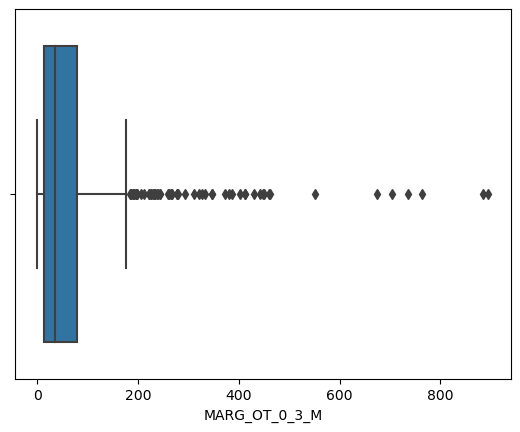

Description of MARG_OT_0_3_F
----------------------------------------------------------------------------
count     640.000000
mean      200.742188
std       309.740854
min         0.000000
25%        43.000000
50%       113.000000
75%       240.000000
max      3354.000000
Name: MARG_OT_0_3_F, dtype: float64 Skew : 4.74
Distribution of MARG_OT_0_3_F
----------------------------------------------------------------------------
BoxPlot of MARG_OT_0_3_F
----------------------------------------------------------------------------


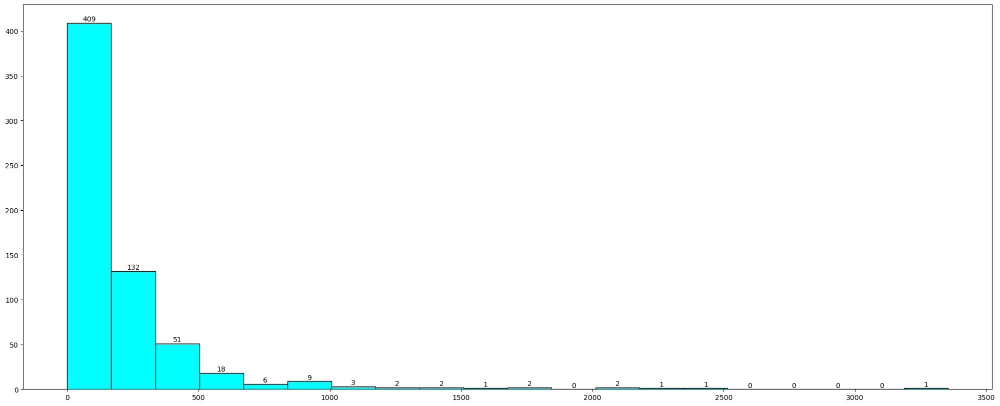

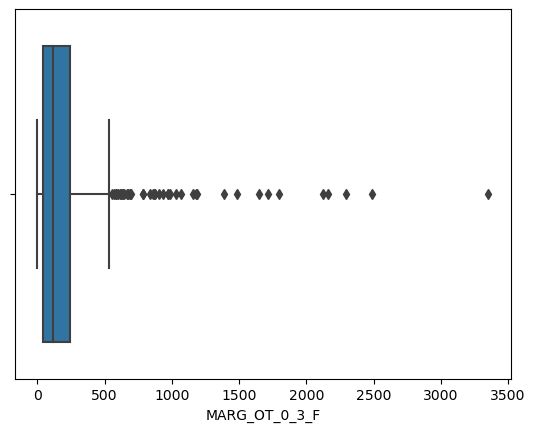

Description of NON_WORK_M
----------------------------------------------------------------------------
count     640.000000
mean      510.014063
std       610.603187
min         0.000000
25%       161.000000
50%       326.000000
75%       604.500000
max      6456.000000
Name: NON_WORK_M, dtype: float64 Skew : 3.63
Distribution of NON_WORK_M
----------------------------------------------------------------------------
BoxPlot of NON_WORK_M
----------------------------------------------------------------------------


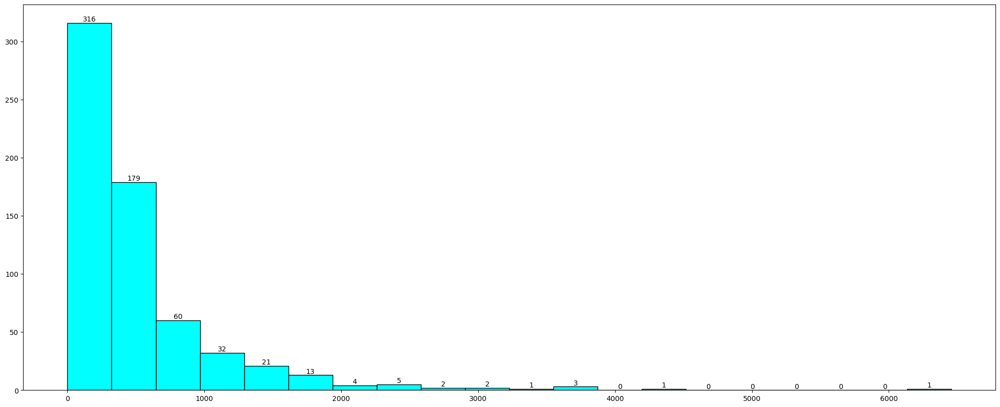

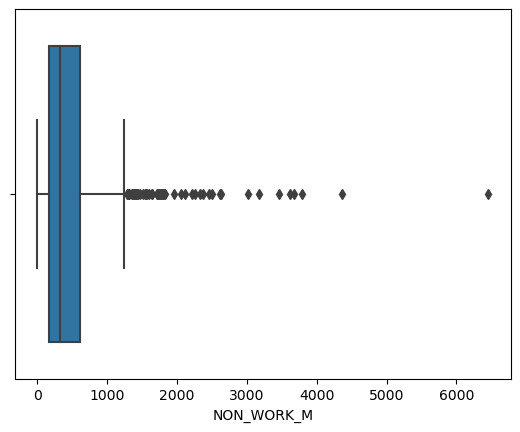

Description of NON_WORK_F
----------------------------------------------------------------------------
count      640.000000
mean       704.778125
std        910.209225
min          5.000000
25%        220.500000
50%        464.500000
75%        853.500000
max      10533.000000
Name: NON_WORK_F, dtype: float64 Skew : 4.8
Distribution of NON_WORK_F
----------------------------------------------------------------------------
BoxPlot of NON_WORK_F
----------------------------------------------------------------------------


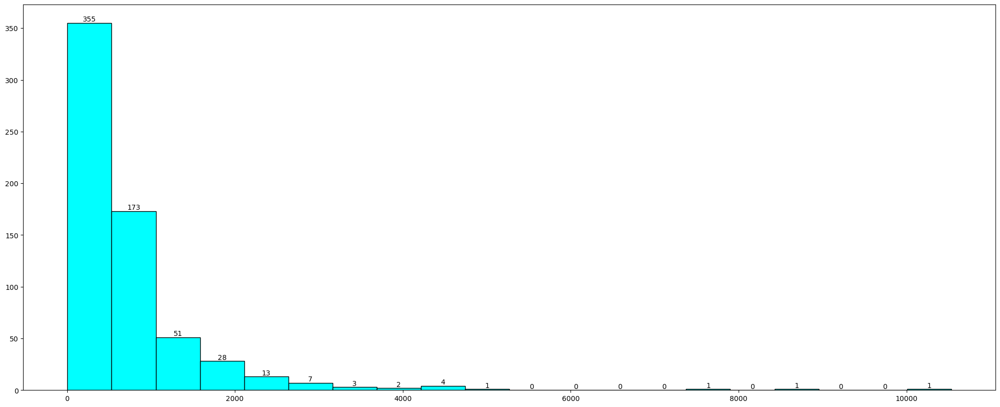

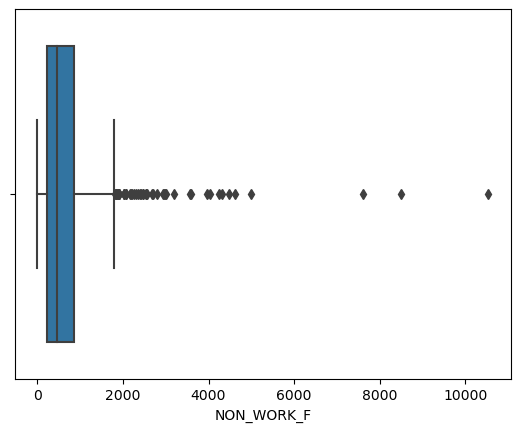

In [74]:
for x in lstnumericcolumns:
    univariateAnalysis_numeric(x,20)

**Even after scaling data, it shows outlier. Since PCA are sensitive to outlier , those were treated using IQR method.**

### Outlier Treatment:

In [75]:
Q1 = pca_df_num_scaled.quantile(0.25)
Q3 = pca_df_num_scaled.quantile(0.75)
IQR = Q3 - Q1

In [76]:
((pca_df_num_scaled < (Q1 - 1.5 * IQR)) | (pca_df_num_scaled > (Q3 + 1.5 * IQR))).sum()

State Code        0
Dist.Code         0
No_HH            31
TOT_M            25
TOT_F            26
                 ..
MARG_OT_0_3_F    42
NON_WORK_M       54
NON_WORK_F       47
Genderratio       0
Agriculturist    32
Length: 61, dtype: int64

In [77]:
no_outlier = ['State Code','Dist.Code']

In [78]:
def treat_outlier(x):
    q5=np.percentile(x,5)
    q25=np.percentile(x,25)
    q75=np.percentile(x,75)
    q95=np.percentile(x,95)
    IQR=q75-q25
    lower_bound=q25-(1.5*IQR)
    upper_bound=q75+(1.5*IQR)
    return x.apply(lambda y: q95 if y > q75 else y).apply(lambda y: q5 if y < q25 else y)

In [79]:
outlier_list_pca = [x for x in pca_df_num_scaled.columns if x not in no_outlier]

In [80]:
for i in pca_df_num_scaled[outlier_list_pca]:    
    pca_df_num_scaled[i]=treat_outlier(pca_df_num_scaled[i])

In [81]:
pca_df_num_scaled.head()

,State Code,Dist.Code,No_HH,TOT_M,TOT_F,M_06,F_06,M_SC,F_SC,M_ST,...,MARG_AL_0_3_M,MARG_AL_0_3_F,MARG_HH_0_3_M,MARG_HH_0_3_F,MARG_OT_0_3_M,MARG_OT_0_3_F,NON_WORK_M,NON_WORK_F,Genderratio,Agriculturist
0,-1.710782,-1.729347,-0.996132,-1.018532,-1.007502,-0.561012,-0.507738,-0.958783,-0.957049,-0.423306,...,-0.156494,-0.287524,1.869739,-0.807020,-0.365258,-0.499977,-0.413053,-0.725706,1.547408,-0.697786
1,-1.710782,-1.723934,-0.996132,-1.018532,-1.007502,-1.010815,-0.994973,-0.958783,-0.957049,-0.582014,...,-0.282327,-0.294688,-0.491731,-0.807020,0.042855,-0.073481,-0.783632,-0.725706,1.547408,-0.950424
2,-1.710782,-1.718521,-0.996132,-1.018532,-1.007502,-1.010815,-0.994973,-0.958783,-0.957049,-0.038951,...,-0.536200,-0.482775,-0.722773,-0.807020,-0.643517,-0.625987,-0.783632,-0.725706,-0.654934,-0.950424
3,-1.710782,-1.713109,-0.996132,-1.018532,-1.007502,-1.010815,-0.994973,-0.958783,-0.957049,-0.355965,...,-0.419198,-0.385127,-0.722773,-0.807020,-0.643517,-0.625987,-0.783632,-0.725706,0.053784,-0.950424
4,-1.710782,-1.707696,-0.996132,-1.018532,-1.007502,-0.622359,-0.994973,-0.958783,-0.957049,1.974538,...,1.523152,1.252901,-0.466796,-0.625849,-0.439461,-0.309346,-0.540895,-0.249344,0.325728,-0.950424


In [82]:
def univariateAnalysis_numeric_s(column,nbins):
    print("Description of " + column)
    print("----------------------------------------------------------------------------")
    print(pca_df_num_scaled[column].describe(),end=' ')
    print('Skew :',round(pca_df_num_scaled[column].skew(),2))
    
    plt.figure(figsize=[25,10])
    print("Distribution of " + column)
    print("----------------------------------------------------------------------------")
    a=round(pca_df_num_scaled[column].min())
    b=round(pca_df_num_scaled[column].max())
    freq, bins, patches = plt.hist(pca_df_num_scaled[column], bins=nbins, range=[a,b], edgecolor='Black', color='cyan')
    bin_centers = np.diff(bins)*0.5 + bins[:-1]
    n = 0
    for fr, x, patch in zip(freq, bin_centers, patches):
      height = int(freq[n])
      plt.annotate("{}".format(height),
               xy = (x, height),             # top left corner of the histogram bar
               xytext = (0,0.2),             # offsetting label position above its bar
               textcoords = "offset points", # Offset (in points) from the *xy* value
               ha = 'center', va = 'bottom'
               )
      n = n+1

    #plt.legend()
    #plt.xticks(range(a,b,round((b-a)/nbins)))
    plt.show;
    plt.figure()
    print("BoxPlot of " + column)
    print("----------------------------------------------------------------------------")
    ax = sns.boxplot(x=pca_df_num_scaled[column])
    #ax.legend()
    plt.show()

Description of State Code
----------------------------------------------------------------------------
count    6.400000e+02
mean     8.881784e-17
std      1.000782e+00
min     -1.710782e+00
25%     -8.614460e-01
50%      9.405736e-02
75%      7.310596e-01
max      1.898897e+00
Name: State Code, dtype: float64 Skew : 0.04
Distribution of State Code
----------------------------------------------------------------------------
BoxPlot of State Code
----------------------------------------------------------------------------


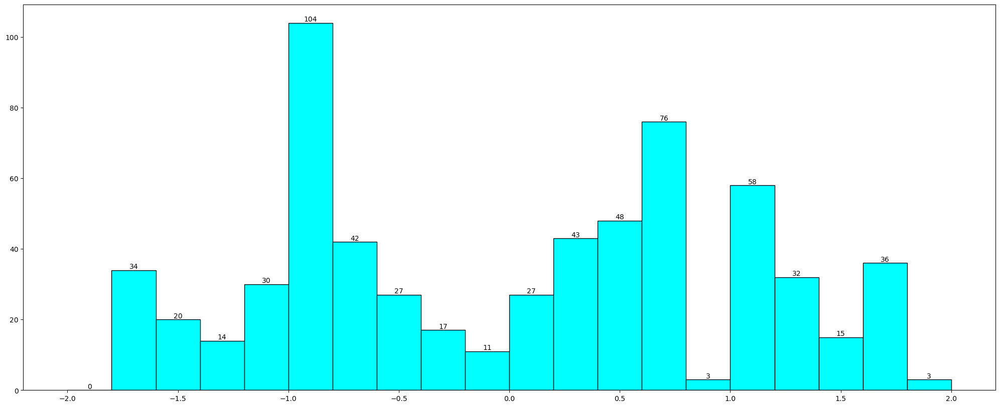

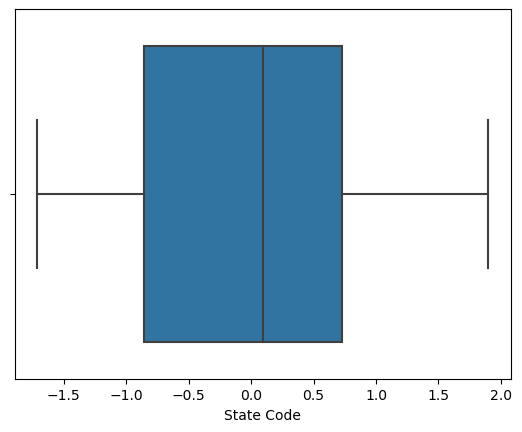

Description of Dist.Code
----------------------------------------------------------------------------
count    640.000000
mean       0.000000
std        1.000782
min       -1.729347
25%       -0.864673
50%        0.000000
75%        0.864673
max        1.729347
Name: Dist.Code, dtype: float64 Skew : -0.0
Distribution of Dist.Code
----------------------------------------------------------------------------
BoxPlot of Dist.Code
----------------------------------------------------------------------------


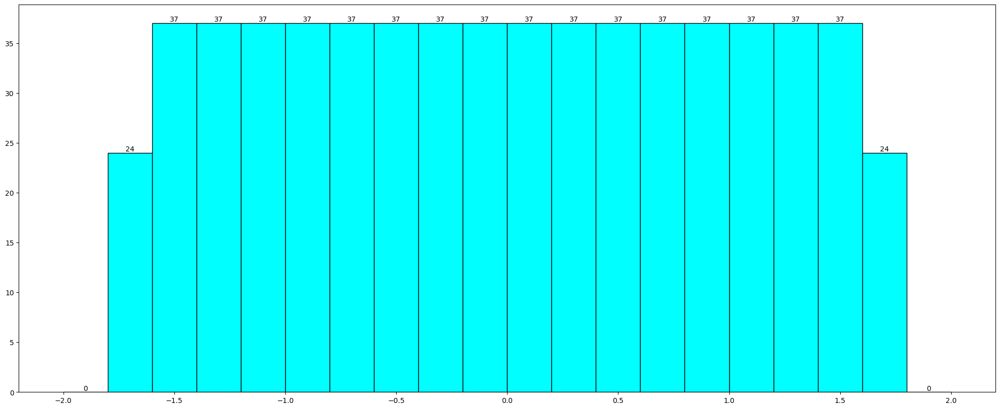

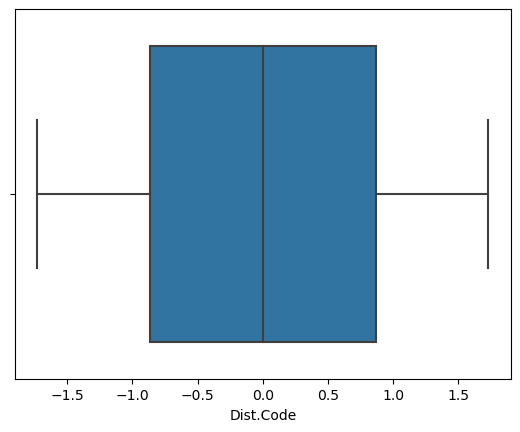

Description of No_HH
----------------------------------------------------------------------------
count    640.000000
mean       0.092859
std        1.092847
min       -0.996132
25%       -0.743929
50%       -0.319887
75%        0.744047
max        1.878228
Name: No_HH, dtype: float64 Skew : 0.8
Distribution of No_HH
----------------------------------------------------------------------------
BoxPlot of No_HH
----------------------------------------------------------------------------


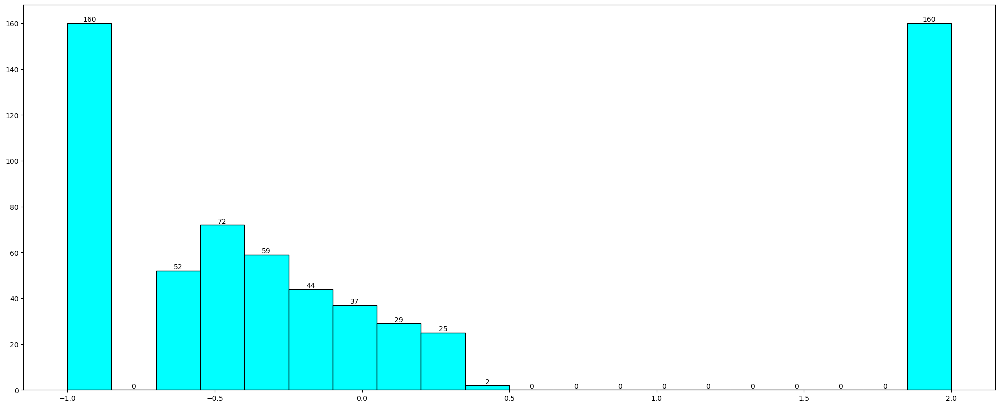

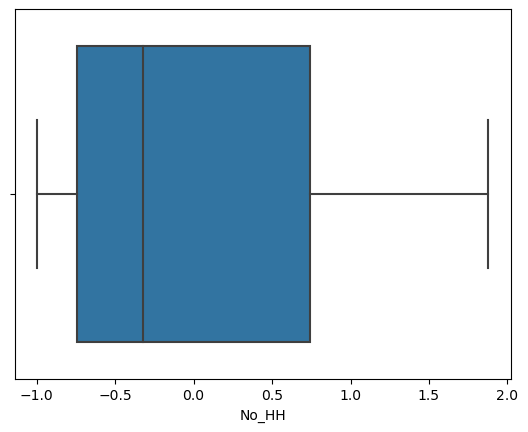

Description of TOT_M
----------------------------------------------------------------------------
count    640.000000
mean       0.067329
std        1.055316
min       -1.018532
25%       -0.762364
50%       -0.294592
75%        0.728318
max        1.771181
Name: TOT_M, dtype: float64 Skew : 0.74
Distribution of TOT_M
----------------------------------------------------------------------------
BoxPlot of TOT_M
----------------------------------------------------------------------------


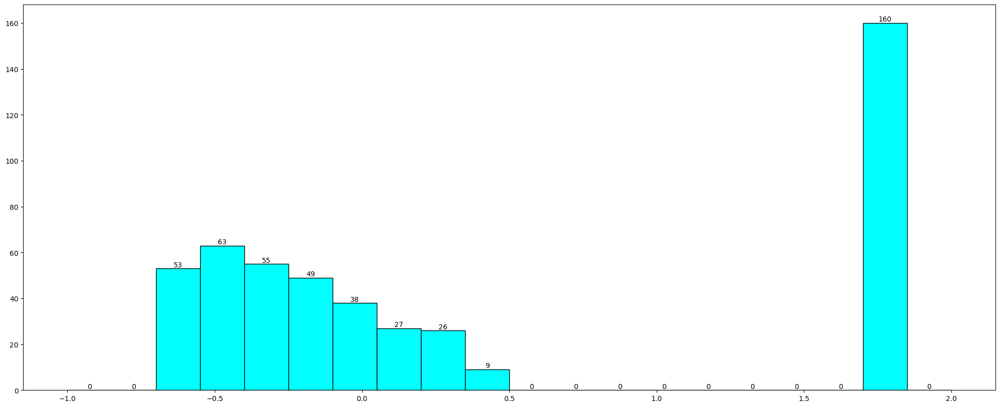

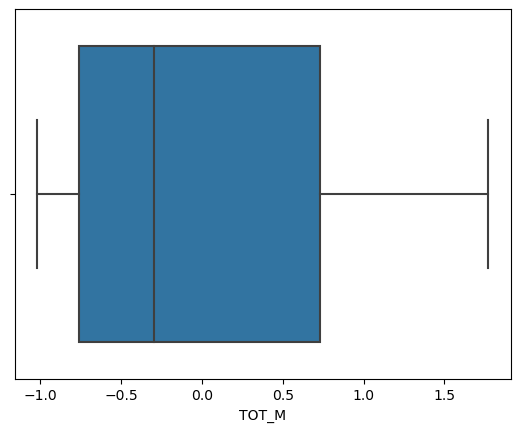

Description of TOT_F
----------------------------------------------------------------------------
count    640.000000
mean       0.074891
std        1.065171
min       -1.007502
25%       -0.752890
50%       -0.305233
75%        0.725335
max        1.802610
Name: TOT_F, dtype: float64 Skew : 0.77
Distribution of TOT_F
----------------------------------------------------------------------------
BoxPlot of TOT_F
----------------------------------------------------------------------------


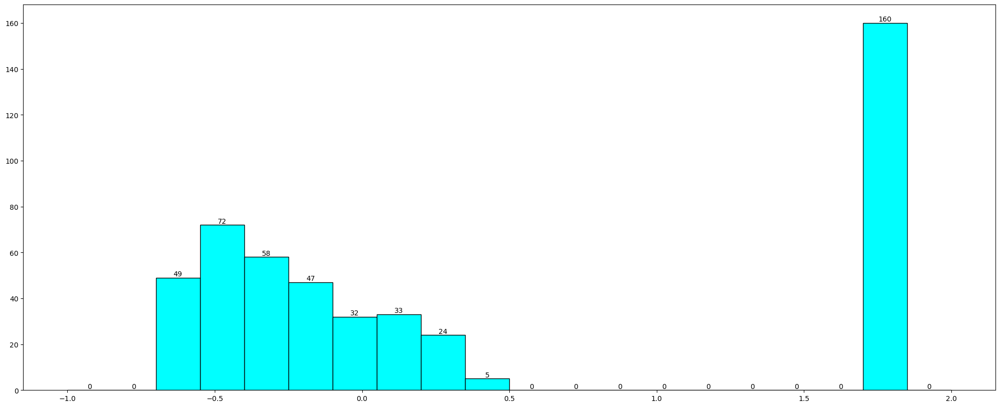

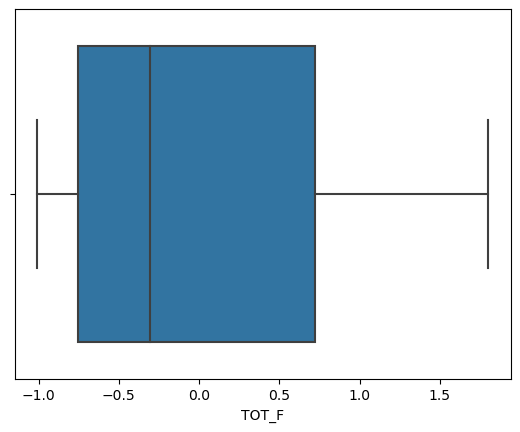

Description of M_06
----------------------------------------------------------------------------
count    640.000000
mean       0.095802
std        1.102675
min       -1.010815
25%       -0.746883
50%       -0.274114
75%        0.748652
max        1.896385
Name: M_06, dtype: float64 Skew : 0.8
Distribution of M_06
----------------------------------------------------------------------------
BoxPlot of M_06
----------------------------------------------------------------------------


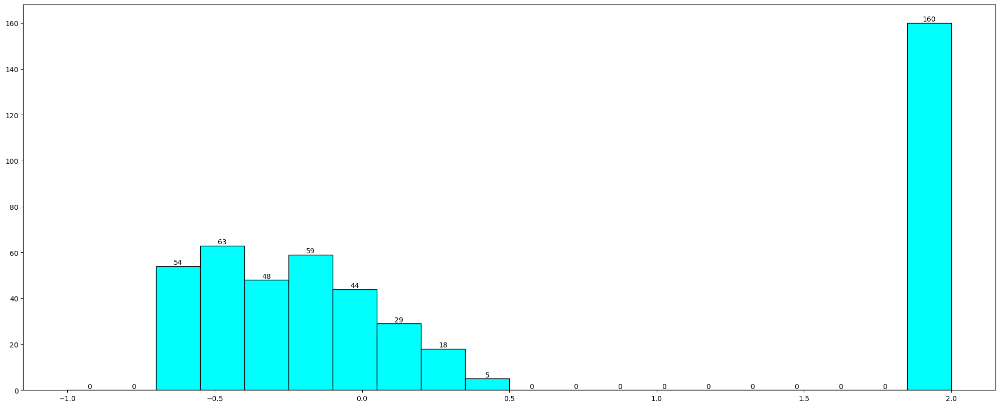

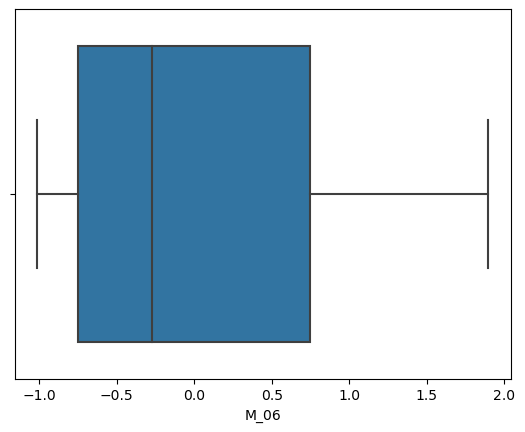

Description of F_06
----------------------------------------------------------------------------
count    640.000000
mean       0.100241
std        1.105652
min       -0.994973
25%       -0.730144
50%       -0.289756
75%        0.739910
max        1.912133
Name: F_06, dtype: float64 Skew : 0.82
Distribution of F_06
----------------------------------------------------------------------------
BoxPlot of F_06
----------------------------------------------------------------------------


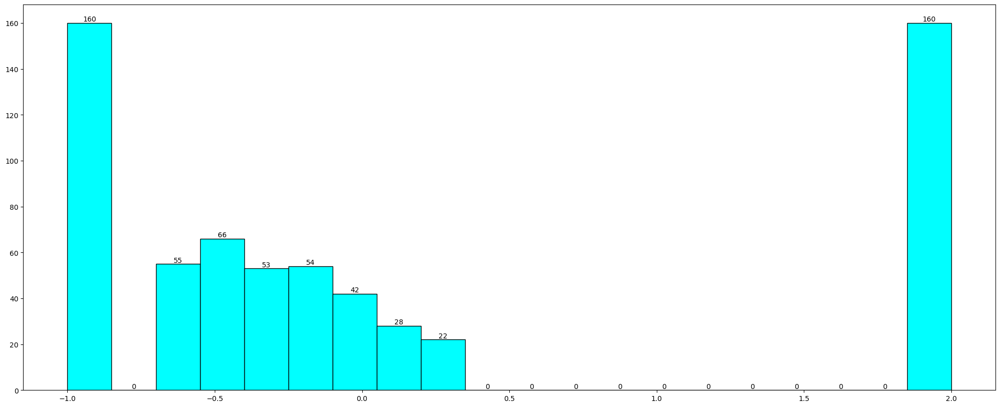

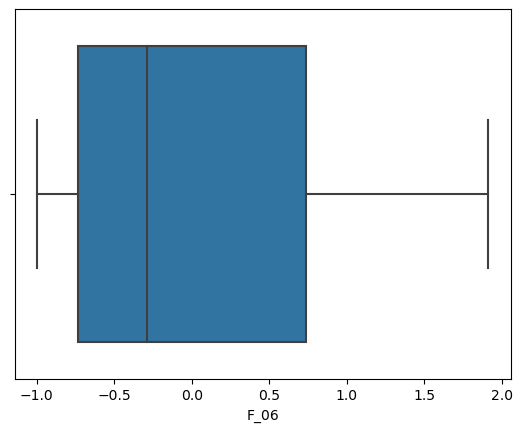

Description of M_SC
----------------------------------------------------------------------------
count    640.000000
mean       0.128858
std        1.120477
min       -0.958783
25%       -0.778399
50%       -0.293404
75%        0.781880
max        1.960816
Name: M_SC, dtype: float64 Skew : 0.81
Distribution of M_SC
----------------------------------------------------------------------------
BoxPlot of M_SC
----------------------------------------------------------------------------


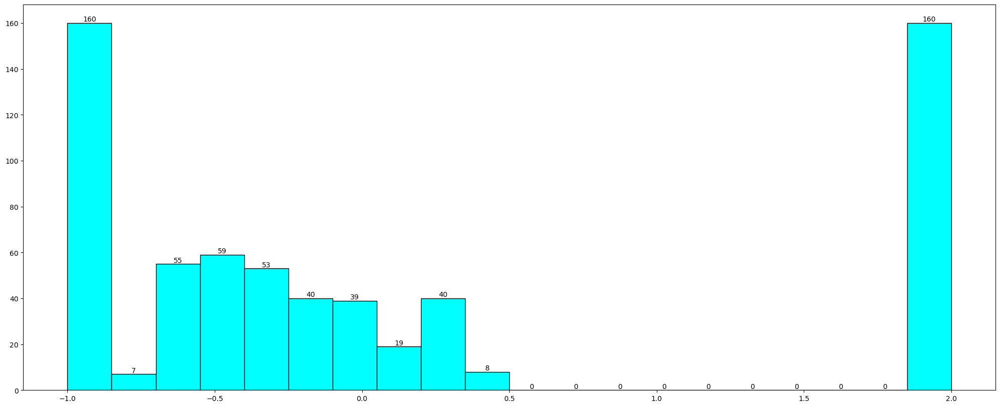

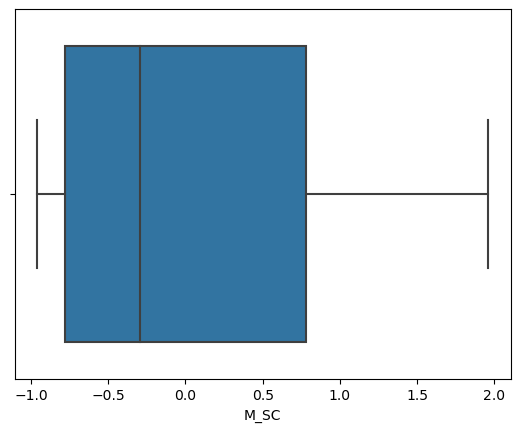

Description of F_SC
----------------------------------------------------------------------------
count    640.000000
mean       0.117882
std        1.107213
min       -0.957049
25%       -0.761836
50%       -0.325615
75%        0.386976
max        1.936041
Name: F_SC, dtype: float64 Skew : 0.82
Distribution of F_SC
----------------------------------------------------------------------------
BoxPlot of F_SC
----------------------------------------------------------------------------


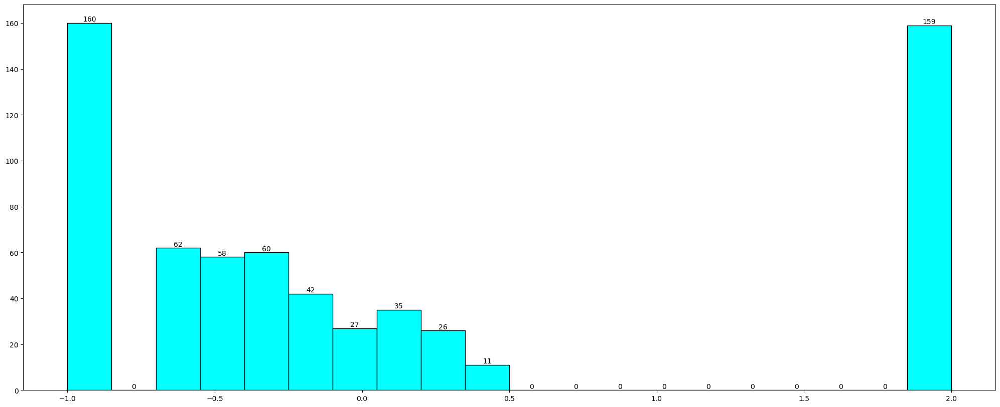

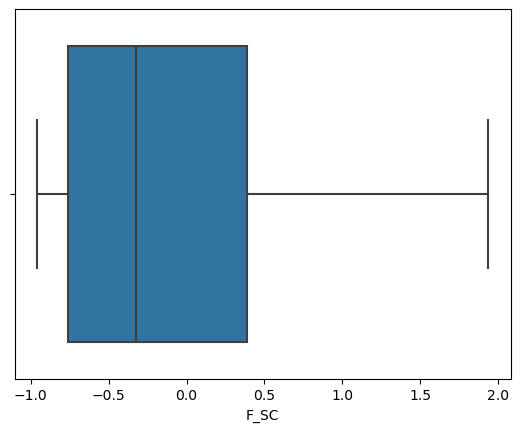

Description of M_ST
----------------------------------------------------------------------------
count    640.000000
mean       0.173964
std        1.058828
min       -0.625124
25%       -0.602863
50%       -0.389534
75%        0.604352
max        1.974538
Name: M_ST, dtype: float64 Skew : 1.05
Distribution of M_ST
----------------------------------------------------------------------------
BoxPlot of M_ST
----------------------------------------------------------------------------


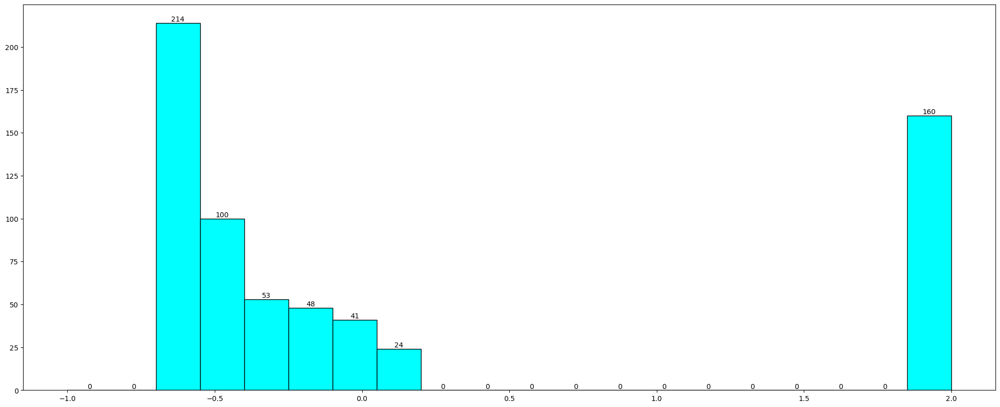

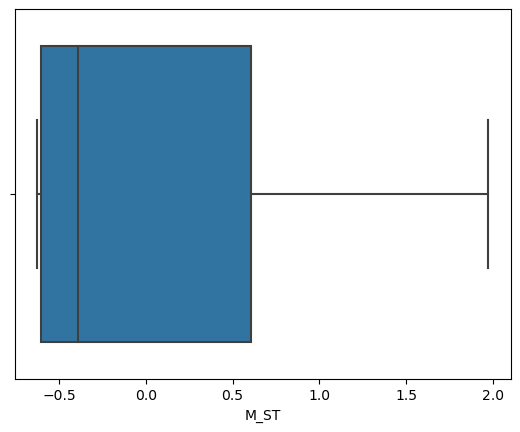

Description of F_ST
----------------------------------------------------------------------------
count    640.000000
mean       0.181856
std        1.099306
min       -0.640197
25%       -0.619868
50%       -0.398476
75%        0.622481
max        2.053944
Name: F_ST, dtype: float64 Skew : 1.05
Distribution of F_ST
----------------------------------------------------------------------------
BoxPlot of F_ST
----------------------------------------------------------------------------


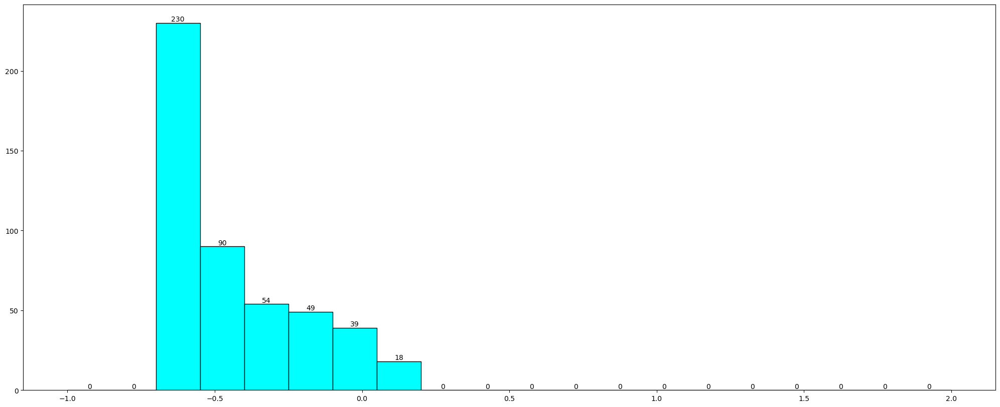

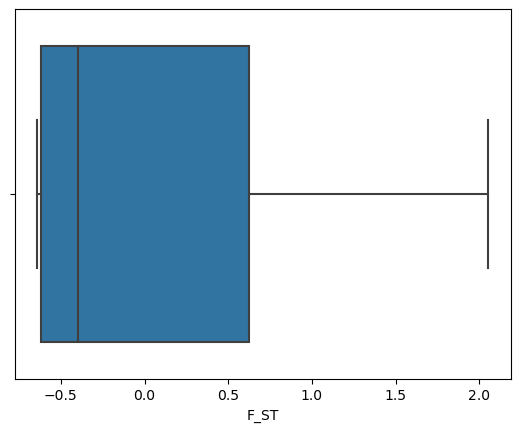

Description of M_LIT
----------------------------------------------------------------------------
count    640.000000
mean       0.091248
std        1.059107
min       -0.970186
25%       -0.734701
50%       -0.273410
75%        0.722391
max        1.815093
Name: M_LIT, dtype: float64 Skew : 0.78
Distribution of M_LIT
----------------------------------------------------------------------------
BoxPlot of M_LIT
----------------------------------------------------------------------------


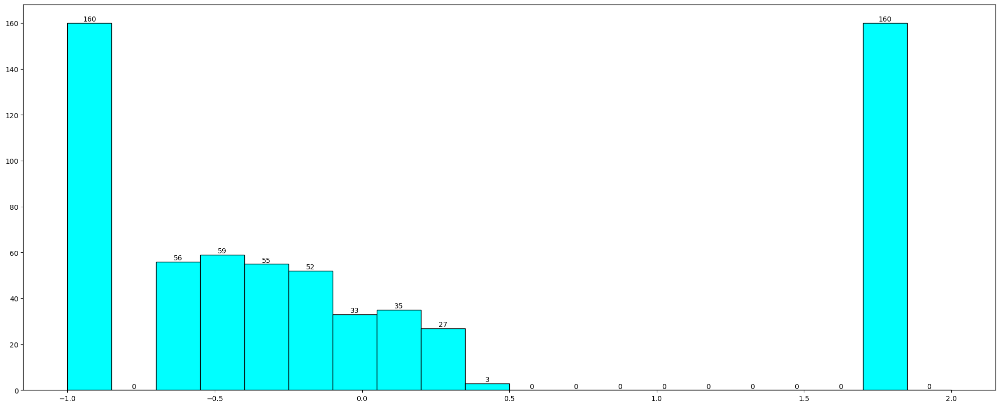

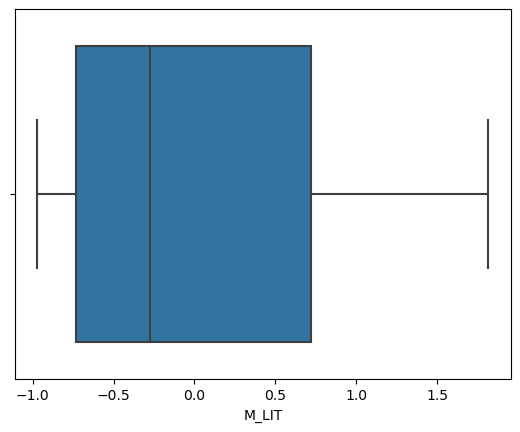

Description of F_LIT
----------------------------------------------------------------------------
count    640.000000
mean       0.076651
std        0.949482
min       -0.828154
25%       -0.661390
50%       -0.300924
75%        0.594022
max        1.642628
Name: F_LIT, dtype: float64 Skew : 0.86
Distribution of F_LIT
----------------------------------------------------------------------------
BoxPlot of F_LIT
----------------------------------------------------------------------------


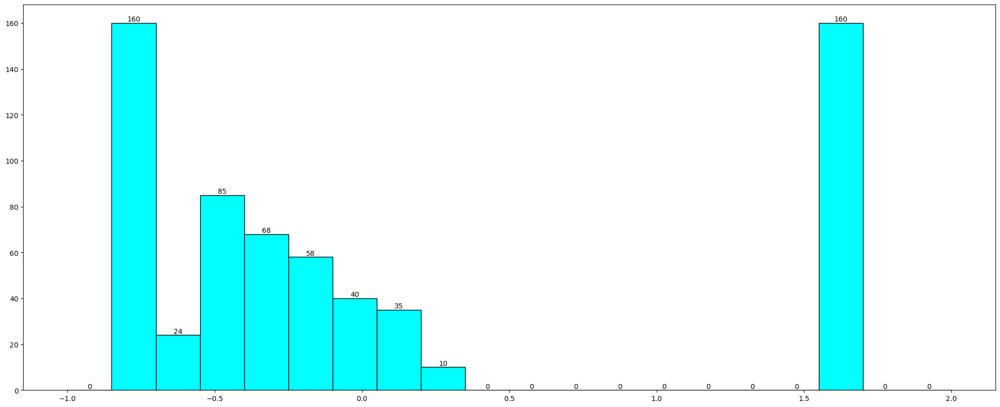

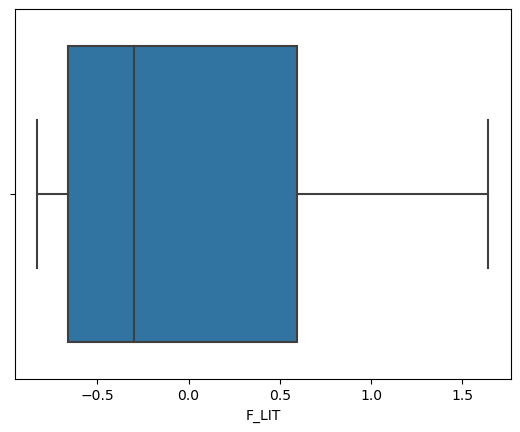

Description of M_ILL
----------------------------------------------------------------------------
count    640.000000
mean       0.121663
std        1.185361
min       -1.044961
25%       -0.767330
50%       -0.313229
75%        0.800861
max        2.065630
Name: M_ILL, dtype: float64 Skew : 0.82
Distribution of M_ILL
----------------------------------------------------------------------------
BoxPlot of M_ILL
----------------------------------------------------------------------------


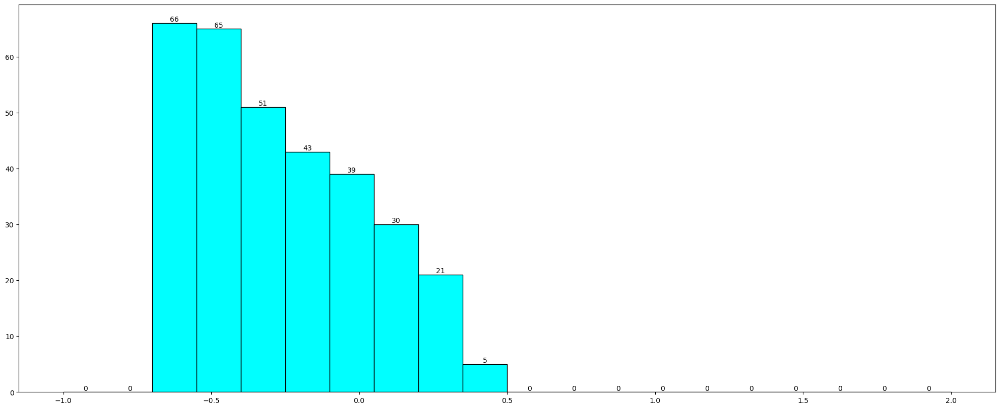

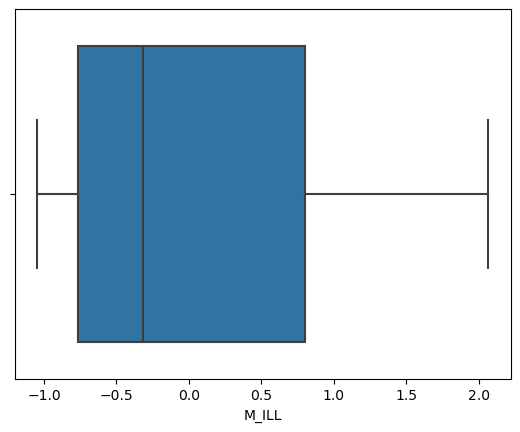

Description of F_ILL
----------------------------------------------------------------------------
count    640.000000
mean       0.089762
std        1.169946
min       -1.125025
25%       -0.816732
50%       -0.289434
75%        0.851125
max        1.975642
Name: F_ILL, dtype: float64 Skew : 0.73
Distribution of F_ILL
----------------------------------------------------------------------------
BoxPlot of F_ILL
----------------------------------------------------------------------------


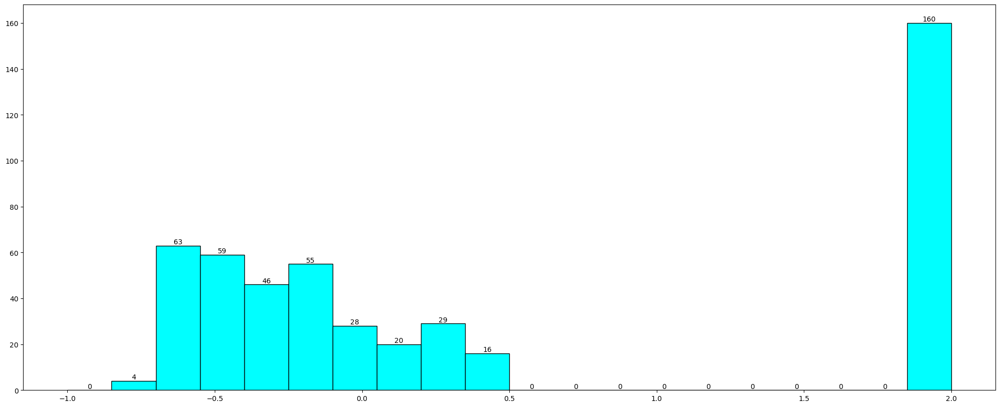

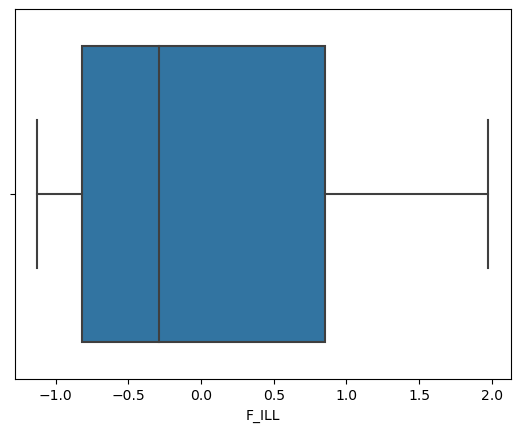

Description of TOT_WORK_M
----------------------------------------------------------------------------
count    640.000000
mean       0.094686
std        1.070445
min       -0.982480
25%       -0.745078
50%       -0.276329
75%        0.709424
max        1.835288
Name: TOT_WORK_M, dtype: float64 Skew : 0.78
Distribution of TOT_WORK_M
----------------------------------------------------------------------------
BoxPlot of TOT_WORK_M
----------------------------------------------------------------------------


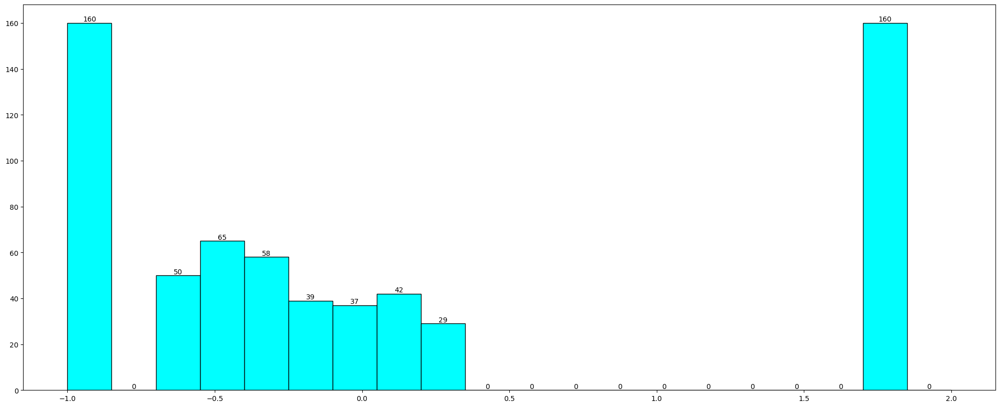

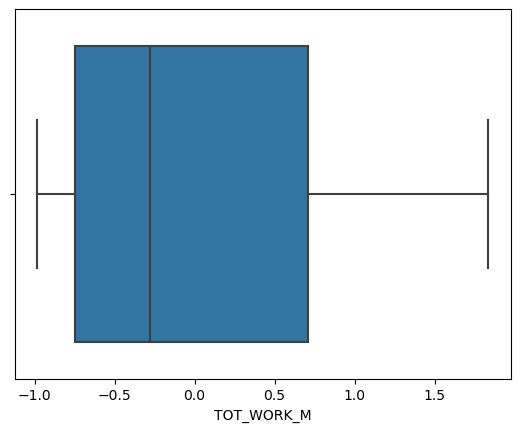

Description of TOT_WORK_F
----------------------------------------------------------------------------
count    640.000000
mean       0.126028
std        1.162069
min       -1.027728
25%       -0.765413
50%       -0.288114
75%        0.746792
max        2.026929
Name: TOT_WORK_F, dtype: float64 Skew : 0.81
Distribution of TOT_WORK_F
----------------------------------------------------------------------------
BoxPlot of TOT_WORK_F
----------------------------------------------------------------------------


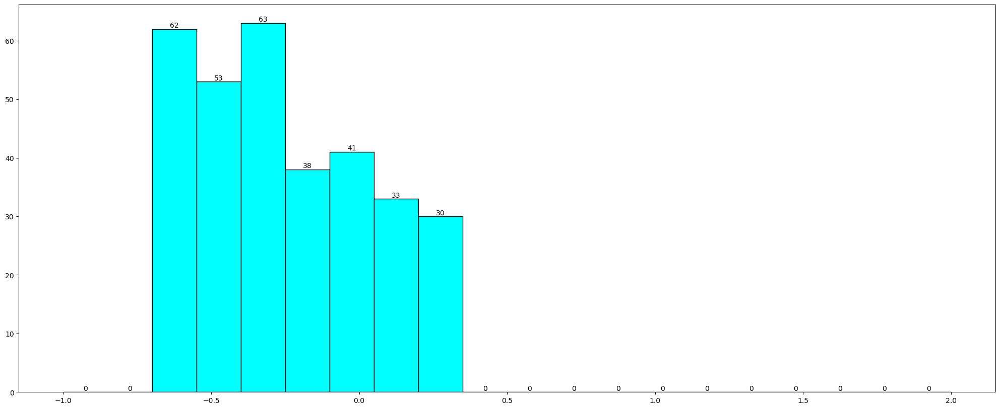

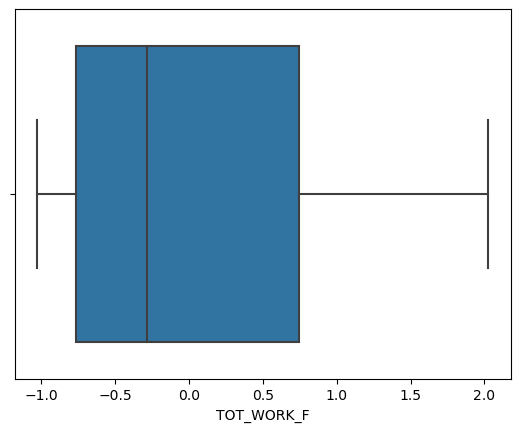

Description of MAINWORK_M
----------------------------------------------------------------------------
count    640.000000
mean       0.107974
std        1.055788
min       -0.912626
25%       -0.714938
50%       -0.284647
75%        0.695453
max        1.842552
Name: MAINWORK_M, dtype: float64 Skew : 0.84
Distribution of MAINWORK_M
----------------------------------------------------------------------------
BoxPlot of MAINWORK_M
----------------------------------------------------------------------------


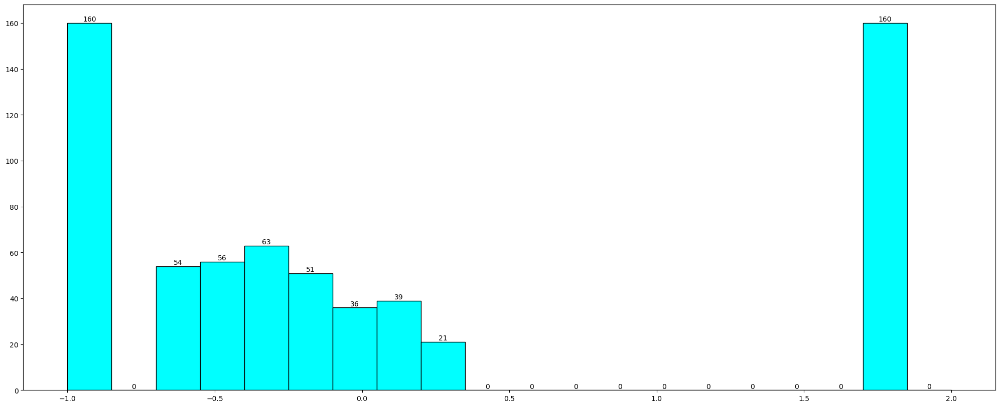

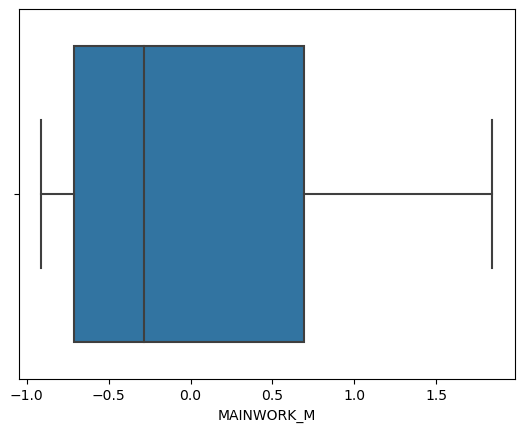

Description of MAINWORK_F
----------------------------------------------------------------------------
count    640.000000
mean       0.167493
std        1.160987
min       -0.870089
25%       -0.685311
50%       -0.324100
75%        0.700115
max        2.113468
Name: MAINWORK_F, dtype: float64 Skew : 0.95
Distribution of MAINWORK_F
----------------------------------------------------------------------------
BoxPlot of MAINWORK_F
----------------------------------------------------------------------------


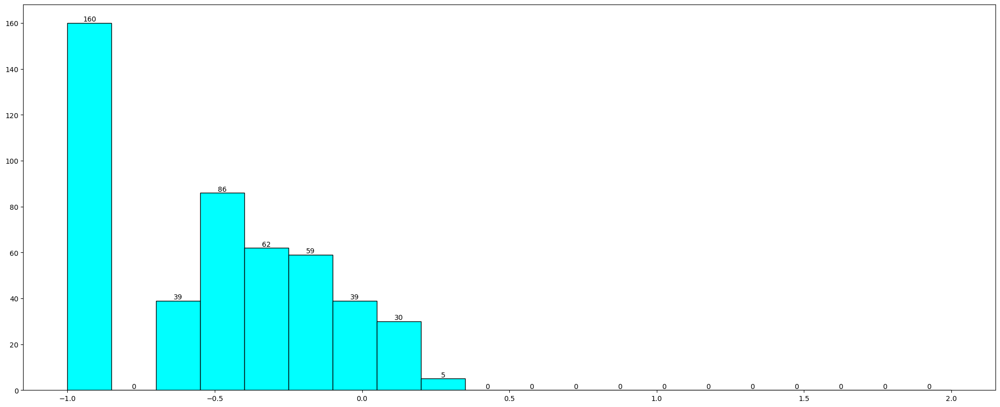

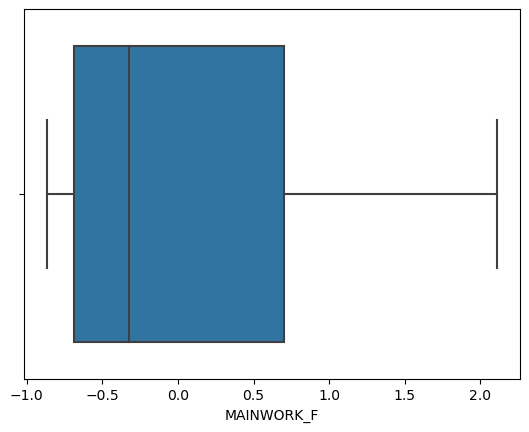

Description of MAIN_CL_M
----------------------------------------------------------------------------
count    640.000000
mean       0.107750
std        1.145676
min       -1.081013
25%       -0.808798
50%       -0.266889
75%        0.846084
max        1.952801
Name: MAIN_CL_M, dtype: float64 Skew : 0.73
Distribution of MAIN_CL_M
----------------------------------------------------------------------------
BoxPlot of MAIN_CL_M
----------------------------------------------------------------------------


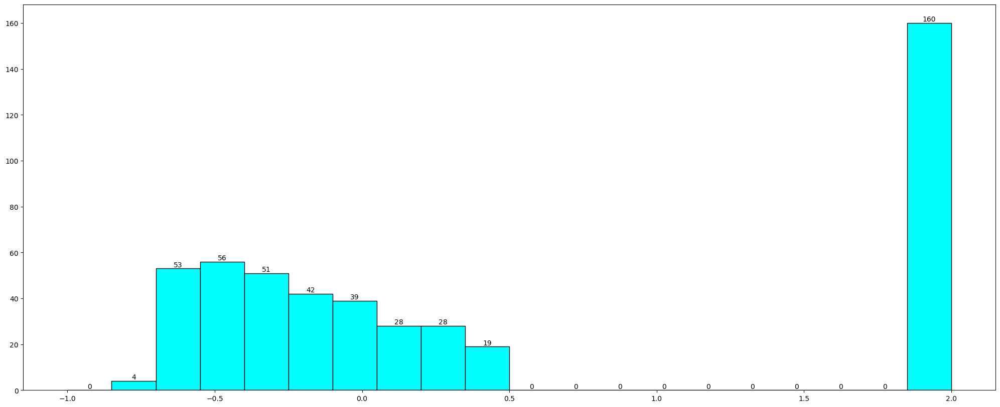

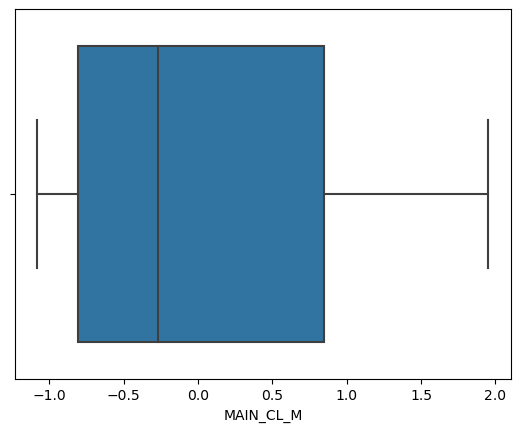

Description of MAIN_CL_F
----------------------------------------------------------------------------
count    640.000000
mean       0.085500
std        1.042561
min       -0.948836
25%       -0.738887
50%       -0.296408
75%        0.696429
max        1.788031
Name: MAIN_CL_F, dtype: float64 Skew : 0.8
Distribution of MAIN_CL_F
----------------------------------------------------------------------------
BoxPlot of MAIN_CL_F
----------------------------------------------------------------------------


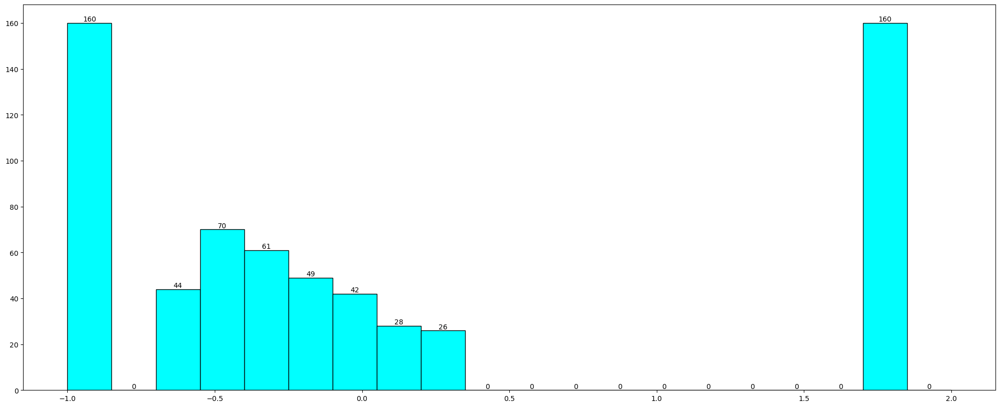

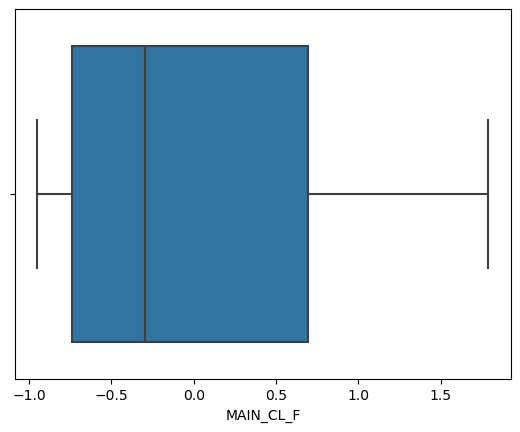

Description of MAIN_AL_M
----------------------------------------------------------------------------
count    640.000000
mean       0.147108
std        1.150335
min       -0.905490
25%       -0.786788
50%       -0.299102
75%        0.769442
max        2.051783
Name: MAIN_AL_M, dtype: float64 Skew : 0.89
Distribution of MAIN_AL_M
----------------------------------------------------------------------------
BoxPlot of MAIN_AL_M
----------------------------------------------------------------------------


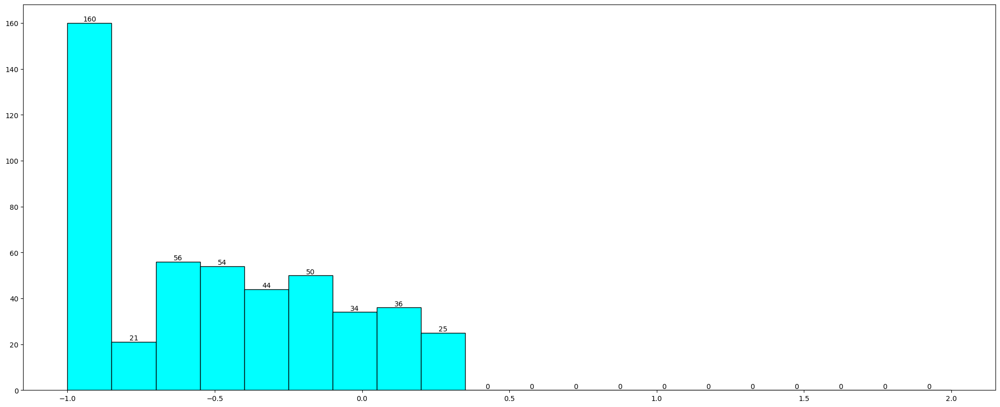

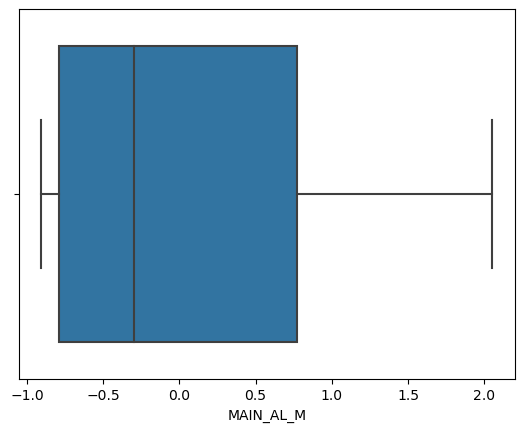

Description of MAIN_AL_F
----------------------------------------------------------------------------
count    640.000000
mean       0.159433
std        1.085829
min       -0.688800
25%       -0.610441
50%       -0.388393
75%        0.599323
max        2.006604
Name: MAIN_AL_F, dtype: float64 Skew : 1.05
Distribution of MAIN_AL_F
----------------------------------------------------------------------------
BoxPlot of MAIN_AL_F
----------------------------------------------------------------------------


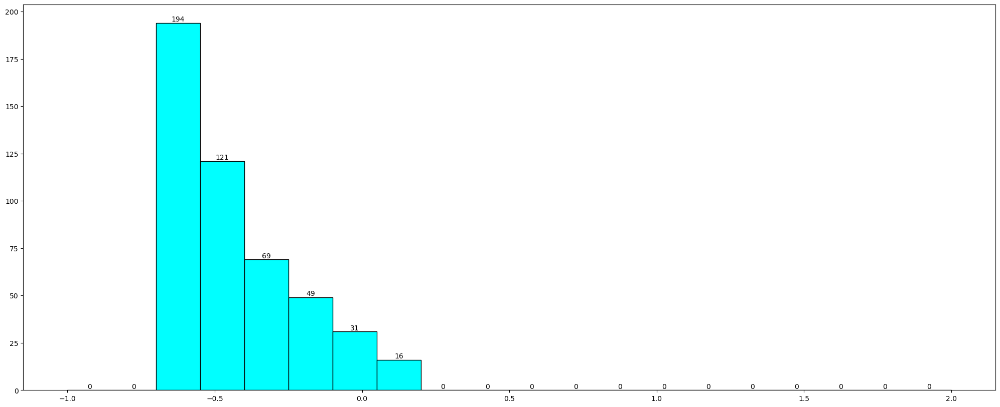

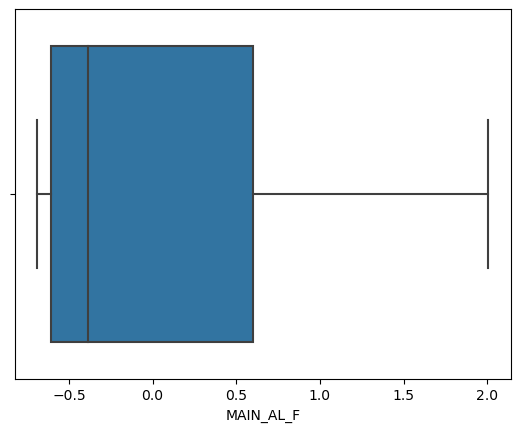

Description of MAIN_HH_M
----------------------------------------------------------------------------
count    640.000000
mean       0.093914
std        0.895136
min       -0.680115
25%       -0.578531
50%       -0.301644
75%        0.525112
max        1.595364
Name: MAIN_HH_M, dtype: float64 Skew : 0.96
Distribution of MAIN_HH_M
----------------------------------------------------------------------------
BoxPlot of MAIN_HH_M
----------------------------------------------------------------------------


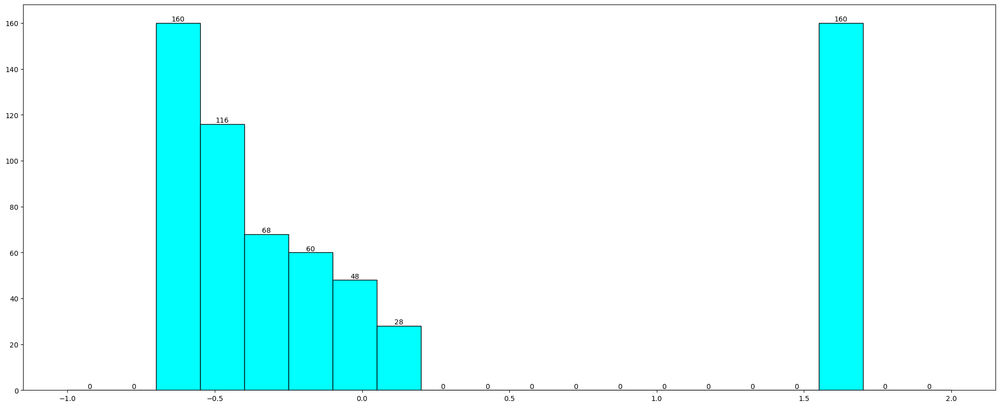

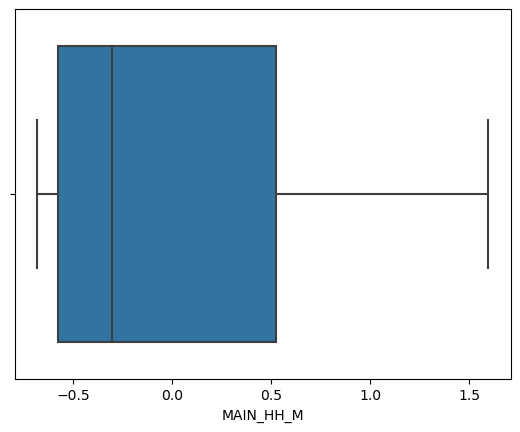

Description of MAIN_HH_F
----------------------------------------------------------------------------
count    640.000000
mean       0.000780
std        0.523229
min       -0.425513
25%       -0.373564
50%       -0.264492
75%        0.233225
max        0.886415
Name: MAIN_HH_F, dtype: float64 Skew : 1.02
Distribution of MAIN_HH_F
----------------------------------------------------------------------------
BoxPlot of MAIN_HH_F
----------------------------------------------------------------------------


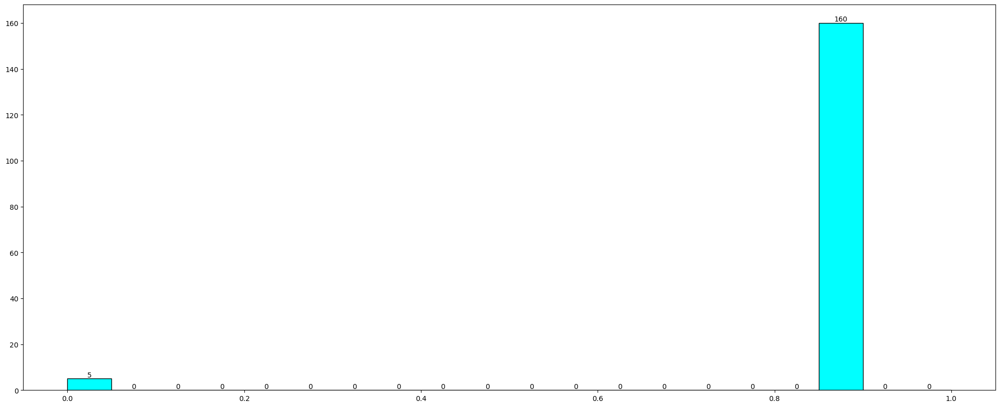

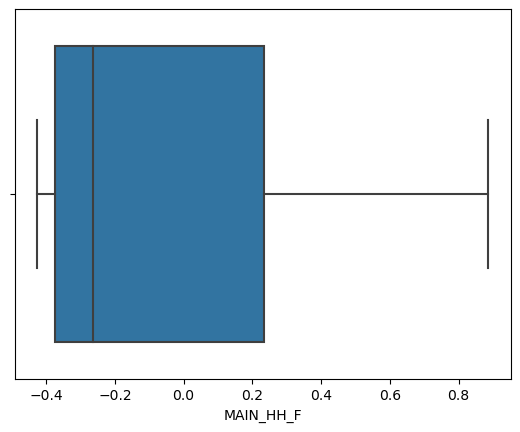

Description of MAIN_OT_M
----------------------------------------------------------------------------
count    640.000000
mean       0.135100
std        0.969813
min       -0.672377
25%       -0.572551
50%       -0.324365
75%        0.535710
max        1.774764
Name: MAIN_OT_M, dtype: float64 Skew : 1.01
Distribution of MAIN_OT_M
----------------------------------------------------------------------------
BoxPlot of MAIN_OT_M
----------------------------------------------------------------------------


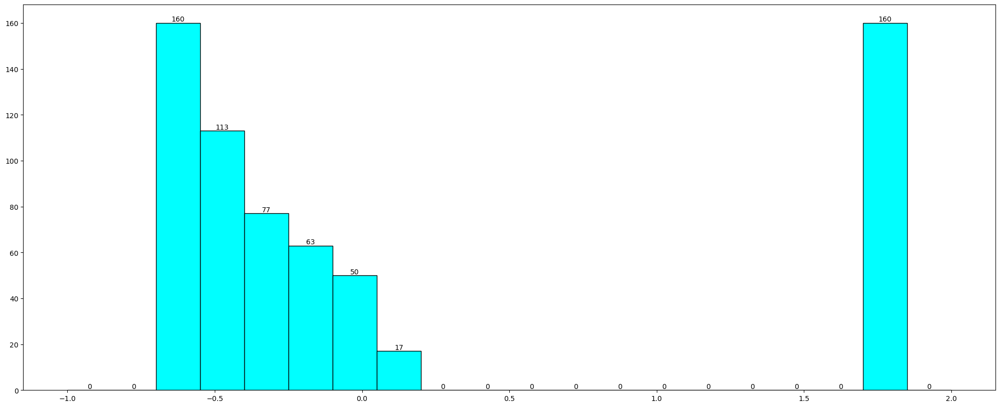

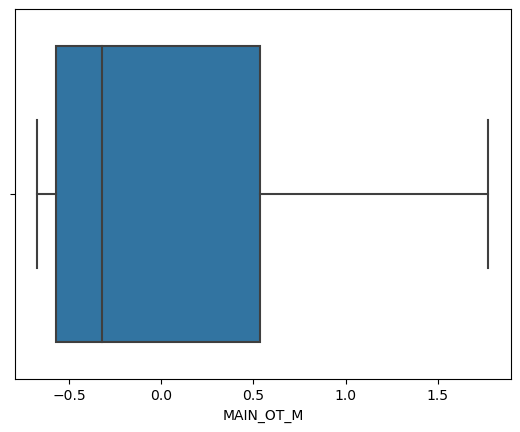

Description of MAIN_OT_F
----------------------------------------------------------------------------
count    640.000000
mean       0.085705
std        0.842328
min       -0.612980
25%       -0.519674
50%       -0.317847
75%        0.453932
max        1.510943
Name: MAIN_OT_F, dtype: float64 Skew : 1.01
Distribution of MAIN_OT_F
----------------------------------------------------------------------------
BoxPlot of MAIN_OT_F
----------------------------------------------------------------------------


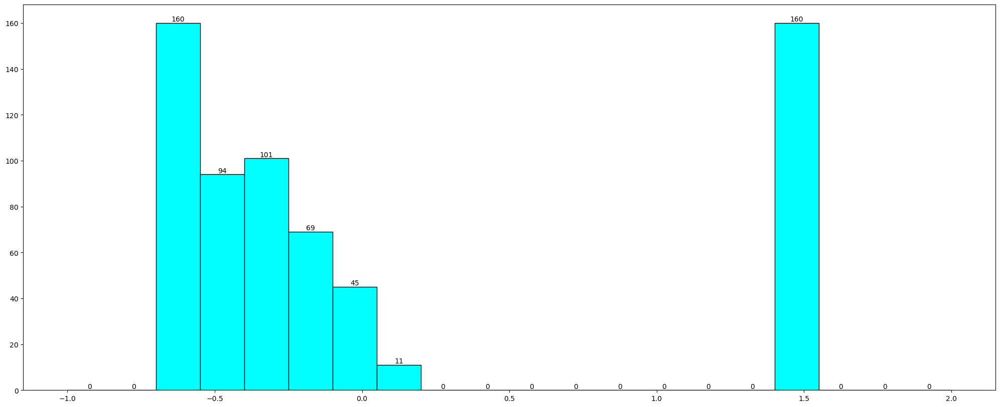

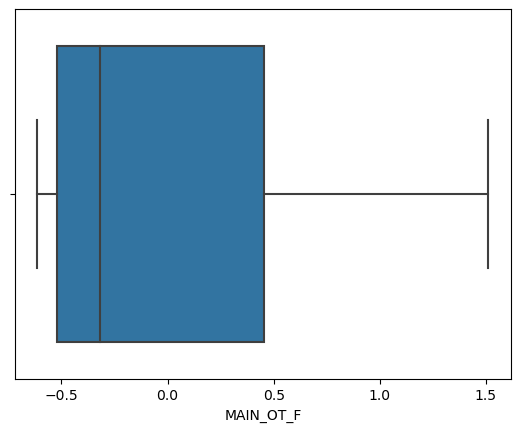

Description of MARGWORK_M
----------------------------------------------------------------------------
count    640.000000
mean       0.142921
std        1.172322
min       -0.989468
25%       -0.738281
50%       -0.291825
75%        0.721584
max        2.076460
Name: MARGWORK_M, dtype: float64 Skew : 0.85
Distribution of MARGWORK_M
----------------------------------------------------------------------------
BoxPlot of MARGWORK_M
----------------------------------------------------------------------------


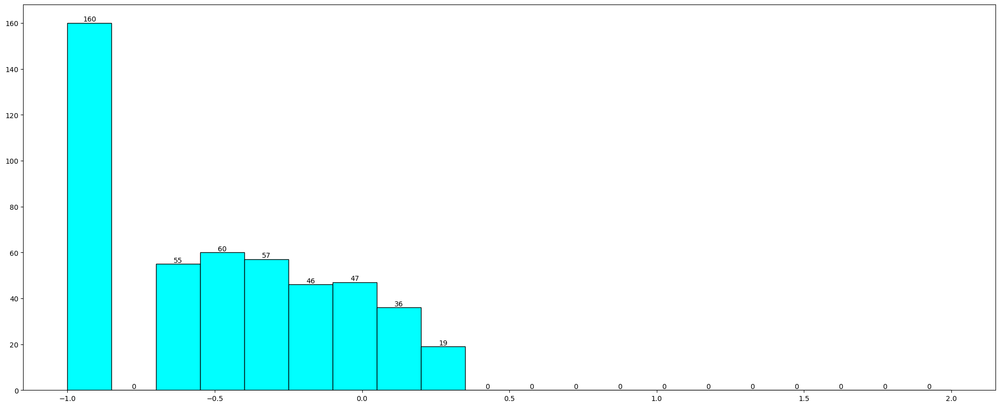

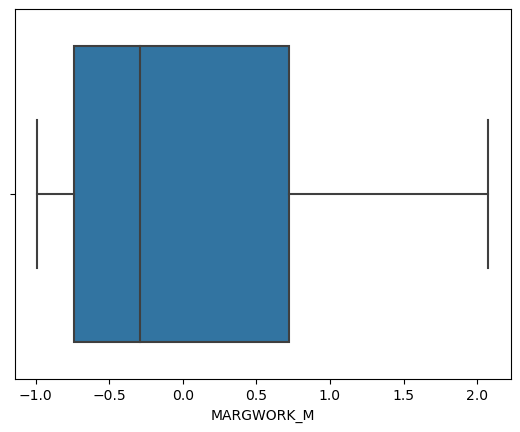

Description of MARGWORK_F
----------------------------------------------------------------------------
count    640.000000
mean       0.064898
std        1.097071
min       -1.117492
25%       -0.803035
50%       -0.265922
75%        0.843183
max        1.798703
Name: MARGWORK_F, dtype: float64 Skew : 0.64
Distribution of MARGWORK_F
----------------------------------------------------------------------------
BoxPlot of MARGWORK_F
----------------------------------------------------------------------------


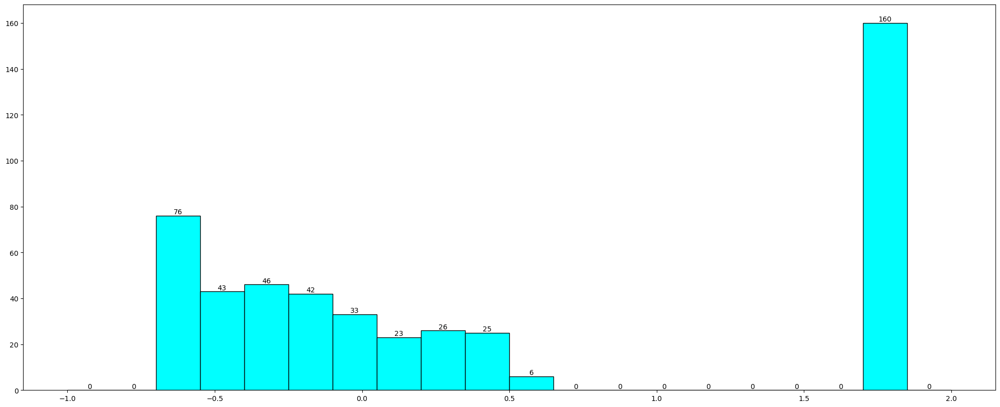

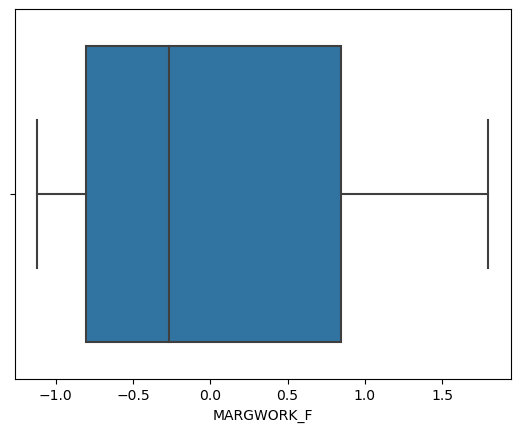

Description of MARG_CL_M
----------------------------------------------------------------------------
count    640.000000
mean       0.119778
std        0.998613
min       -0.737063
25%       -0.601316
50%       -0.331347
75%        0.587180
max        1.801010
Name: MARG_CL_M, dtype: float64 Skew : 0.98
Distribution of MARG_CL_M
----------------------------------------------------------------------------
BoxPlot of MARG_CL_M
----------------------------------------------------------------------------


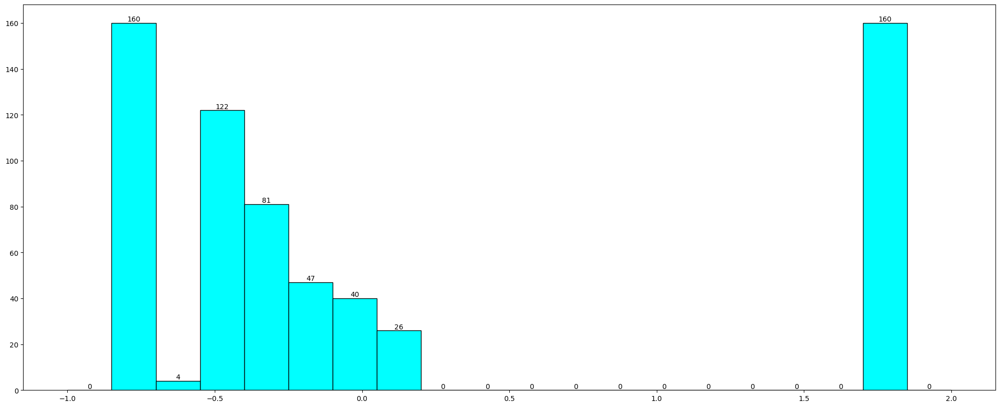

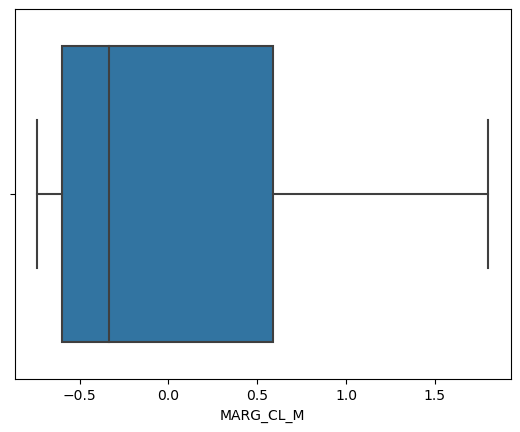

Description of MARG_CL_F
----------------------------------------------------------------------------
count    640.000000
mean       0.088347
std        0.833974
min       -0.606128
25%       -0.504373
50%       -0.303687
75%        0.447456
max        1.499819
Name: MARG_CL_F, dtype: float64 Skew : 1.01
Distribution of MARG_CL_F
----------------------------------------------------------------------------
BoxPlot of MARG_CL_F
----------------------------------------------------------------------------


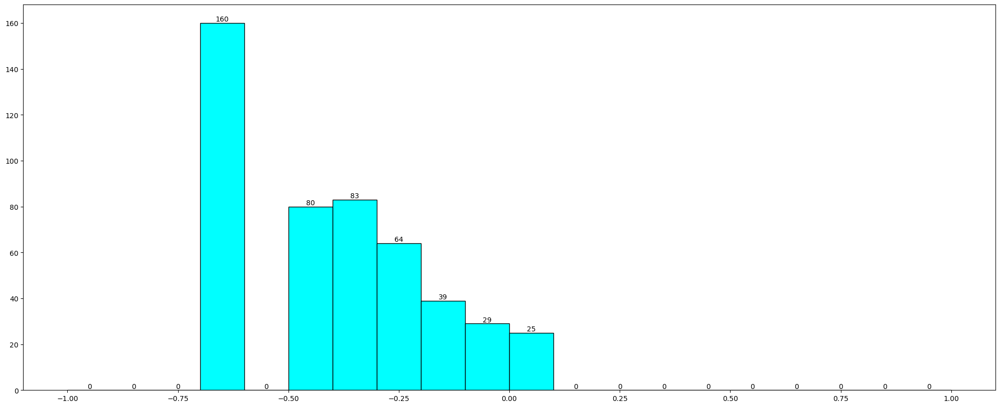

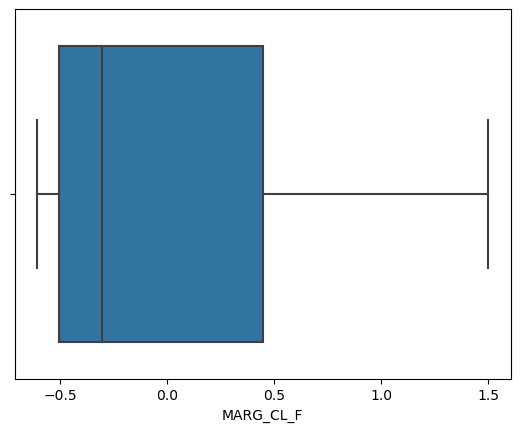

Description of MARG_AL_M
----------------------------------------------------------------------------
count    640.000000
mean       0.183305
std        1.181361
min       -0.861834
25%       -0.696455
50%       -0.328780
75%        0.738206
max        2.162315
Name: MARG_AL_M, dtype: float64 Skew : 0.95
Distribution of MARG_AL_M
----------------------------------------------------------------------------
BoxPlot of MARG_AL_M
----------------------------------------------------------------------------


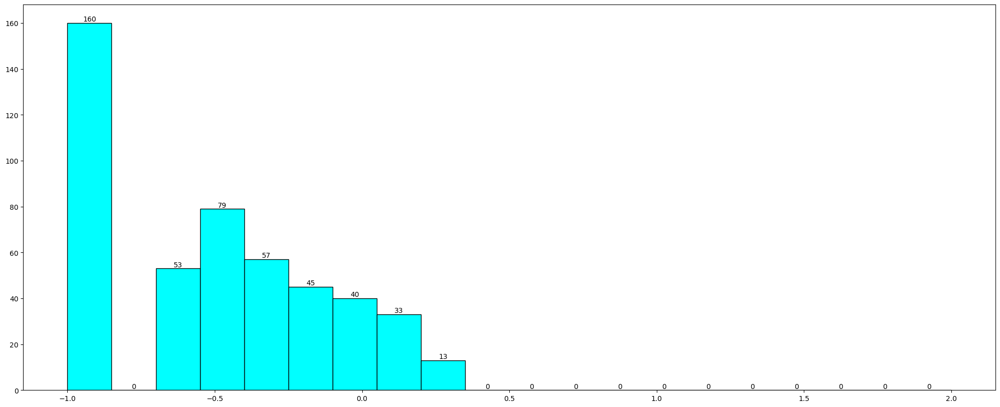

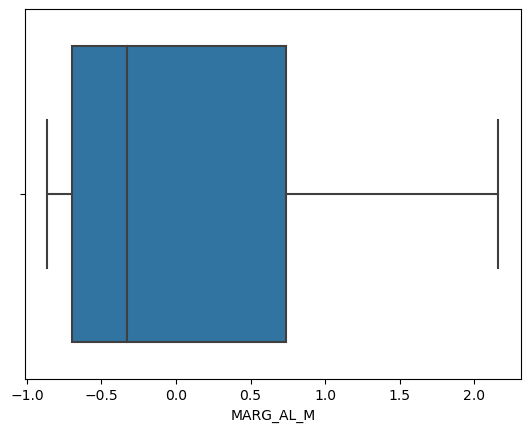

Description of MARG_AL_F
----------------------------------------------------------------------------
count    640.000000
mean       0.130527
std        1.147634
min       -0.943843
25%       -0.796560
50%       -0.360900
75%        0.794082
max        2.022738
Name: MARG_AL_F, dtype: float64 Skew : 0.86
Distribution of MARG_AL_F
----------------------------------------------------------------------------
BoxPlot of MARG_AL_F
----------------------------------------------------------------------------


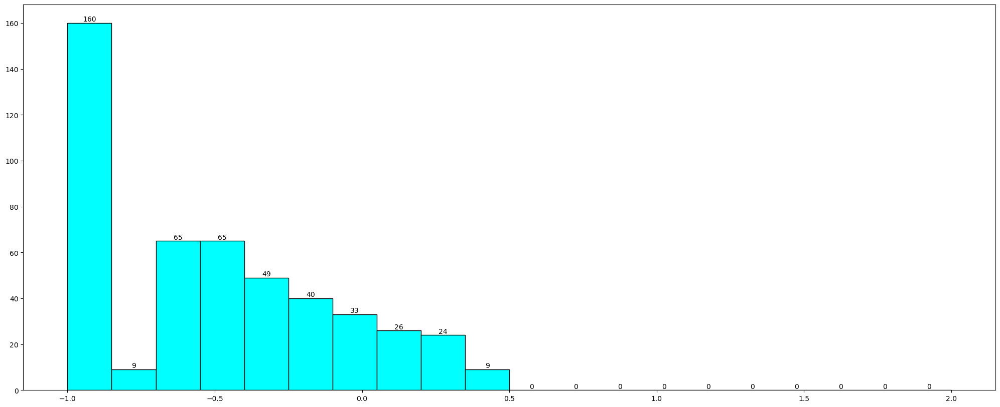

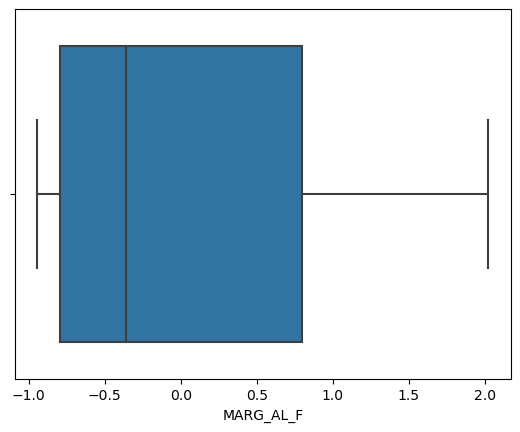

Description of MARG_HH_M
----------------------------------------------------------------------------
count    640.000000
mean       0.106326
std        0.928913
min       -0.663513
25%       -0.562929
50%       -0.326070
75%        0.483442
max        1.679012
Name: MARG_HH_M, dtype: float64 Skew : 1.02
Distribution of MARG_HH_M
----------------------------------------------------------------------------
BoxPlot of MARG_HH_M
----------------------------------------------------------------------------


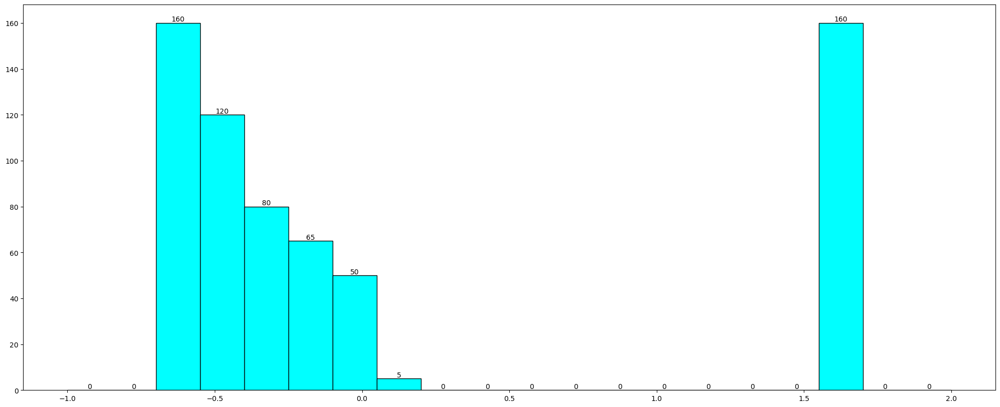

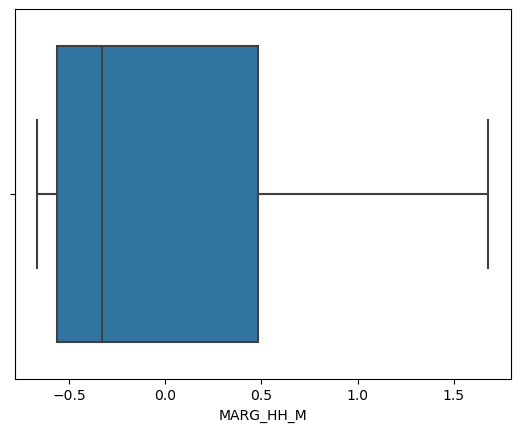

Description of MARG_HH_F
----------------------------------------------------------------------------
count    640.000000
mean       0.101284
std        0.868308
min       -0.633443
25%       -0.543214
50%       -0.298574
75%        0.499599
max        1.564161
Name: MARG_HH_F, dtype: float64 Skew : 0.99
Distribution of MARG_HH_F
----------------------------------------------------------------------------
BoxPlot of MARG_HH_F
----------------------------------------------------------------------------


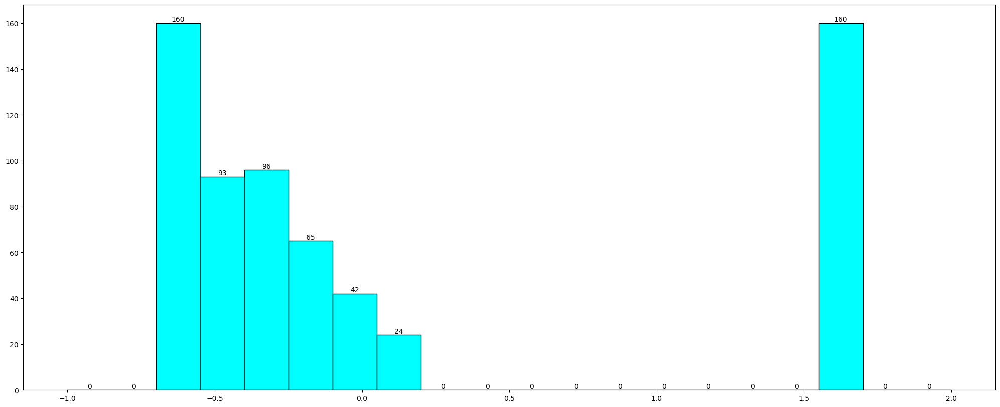

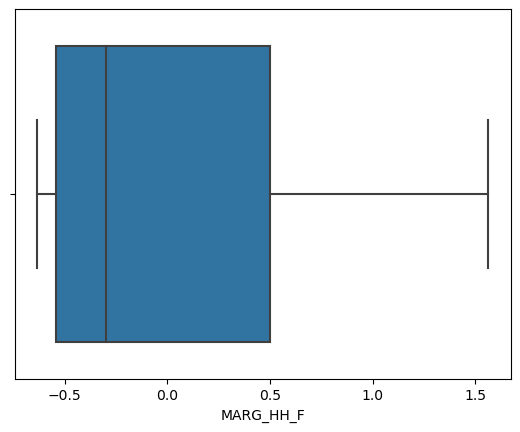

Description of MARG_OT_M
----------------------------------------------------------------------------
count    640.000000
mean       0.130763
std        1.066972
min       -0.831054
25%       -0.662591
50%       -0.302269
75%        0.654700
max        1.915211
Name: MARG_OT_M, dtype: float64 Skew : 0.94
Distribution of MARG_OT_M
----------------------------------------------------------------------------
BoxPlot of MARG_OT_M
----------------------------------------------------------------------------


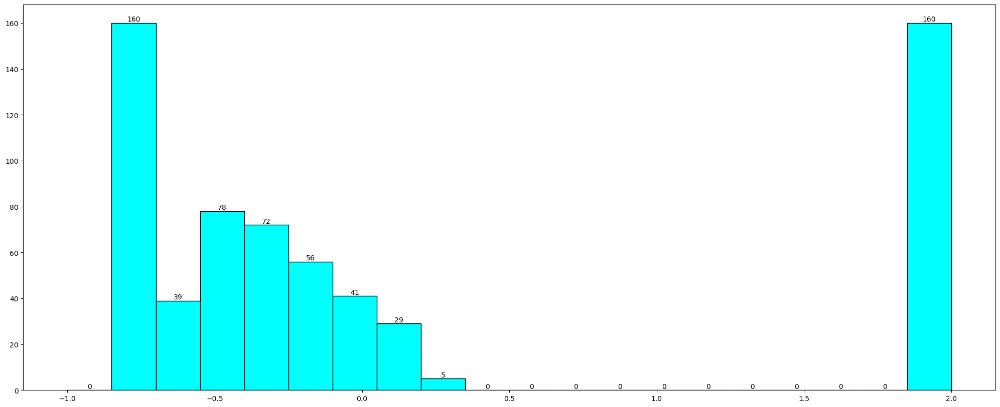

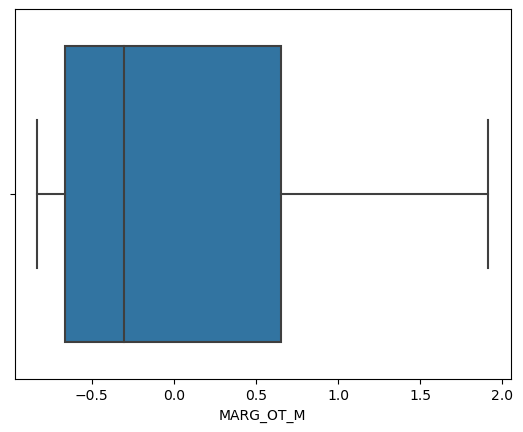

Description of MARG_OT_F
----------------------------------------------------------------------------
count    640.000000
mean       0.161035
std        1.086361
min       -0.811027
25%       -0.651870
50%       -0.289356
75%        0.651445
max        1.979311
Name: MARG_OT_F, dtype: float64 Skew : 0.94
Distribution of MARG_OT_F
----------------------------------------------------------------------------
BoxPlot of MARG_OT_F
----------------------------------------------------------------------------


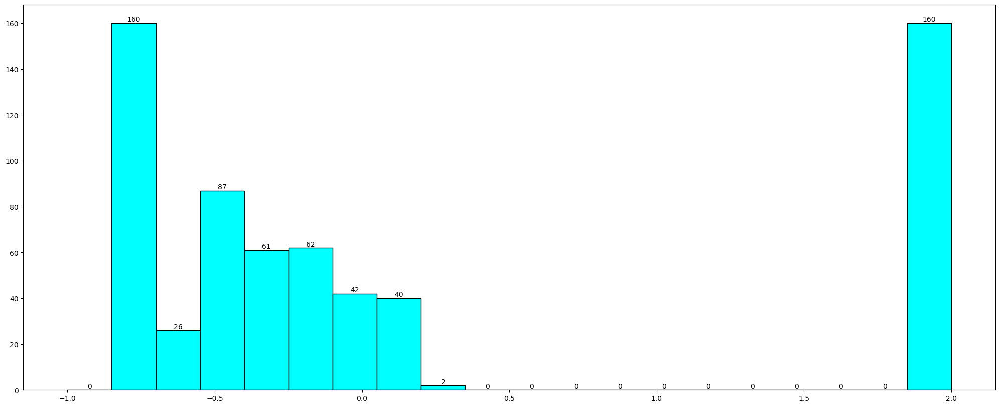

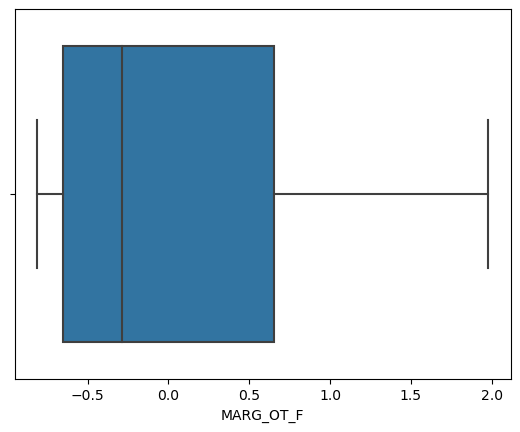

Description of MARGWORK_3_6_M
----------------------------------------------------------------------------
count    640.000000
mean       0.105868
std        1.110204
min       -0.998115
25%       -0.744017
50%       -0.298173
75%        0.772308
max        1.919766
Name: MARGWORK_3_6_M, dtype: float64 Skew : 0.8
Distribution of MARGWORK_3_6_M
----------------------------------------------------------------------------
BoxPlot of MARGWORK_3_6_M
----------------------------------------------------------------------------


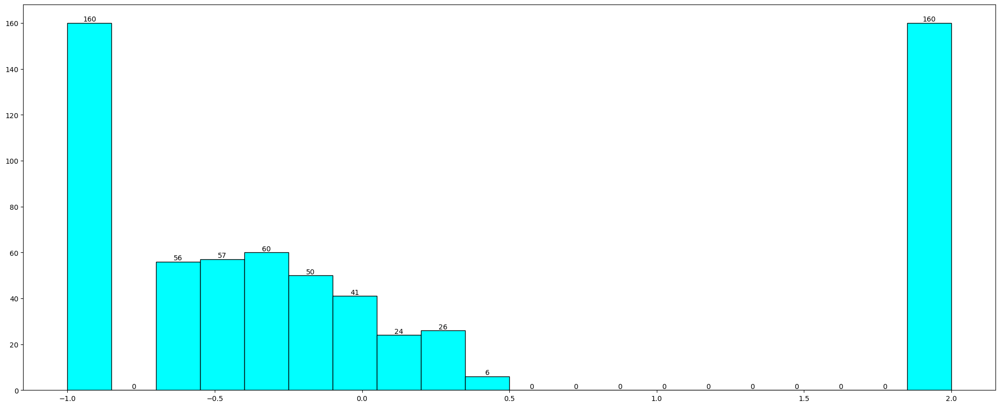

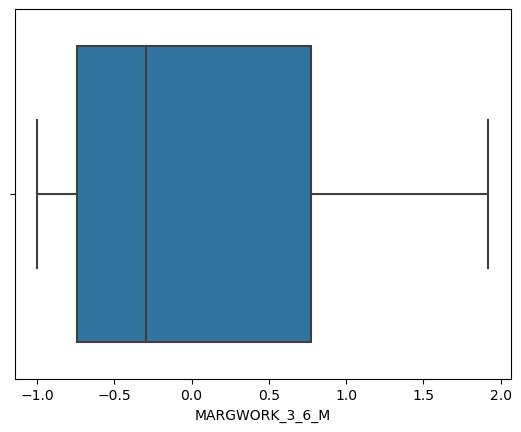

Description of MARGWORK_3_6_F
----------------------------------------------------------------------------
count    640.000000
mean       0.074386
std        1.016331
min       -0.928343
25%       -0.724450
50%       -0.292903
75%        0.675280
max        1.735118
Name: MARGWORK_3_6_F, dtype: float64 Skew : 0.81
Distribution of MARGWORK_3_6_F
----------------------------------------------------------------------------
BoxPlot of MARGWORK_3_6_F
----------------------------------------------------------------------------


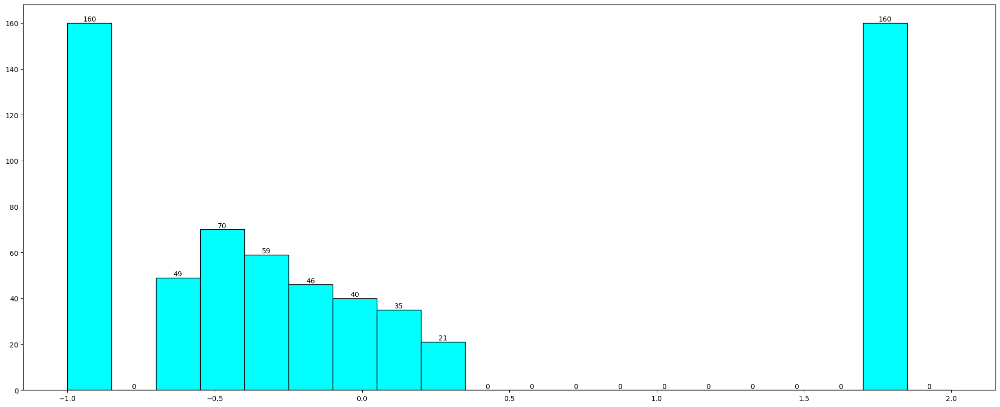

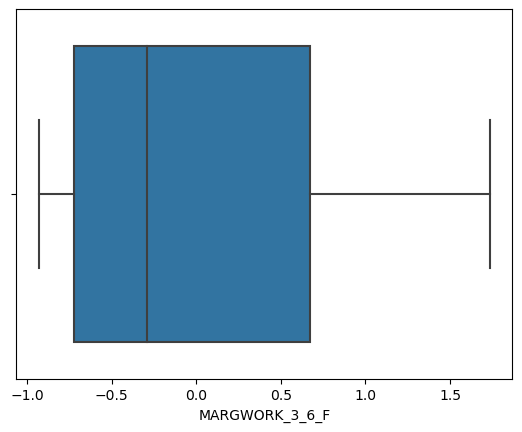

Description of MARG_CL_3_6_M
----------------------------------------------------------------------------
count    640.000000
mean       0.155844
std        1.208252
min       -1.010455
25%       -0.754100
50%       -0.293426
75%        0.757992
max        2.149184
Name: MARG_CL_3_6_M, dtype: float64 Skew : 0.86
Distribution of MARG_CL_3_6_M
----------------------------------------------------------------------------
BoxPlot of MARG_CL_3_6_M
----------------------------------------------------------------------------


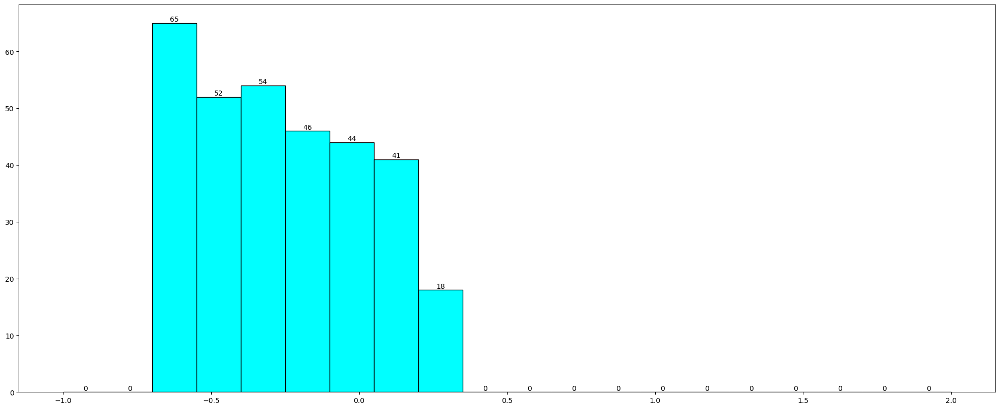

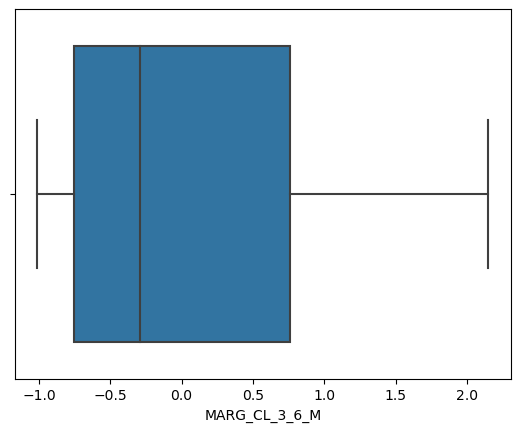

Description of MARG_CL_3_6_F
----------------------------------------------------------------------------
count    640.000000
mean       0.067742
std        1.119433
min       -1.150275
25%       -0.817645
50%       -0.241685
75%        0.879302
max        1.829742
Name: MARG_CL_3_6_F, dtype: float64 Skew : 0.62
Distribution of MARG_CL_3_6_F
----------------------------------------------------------------------------
BoxPlot of MARG_CL_3_6_F
----------------------------------------------------------------------------


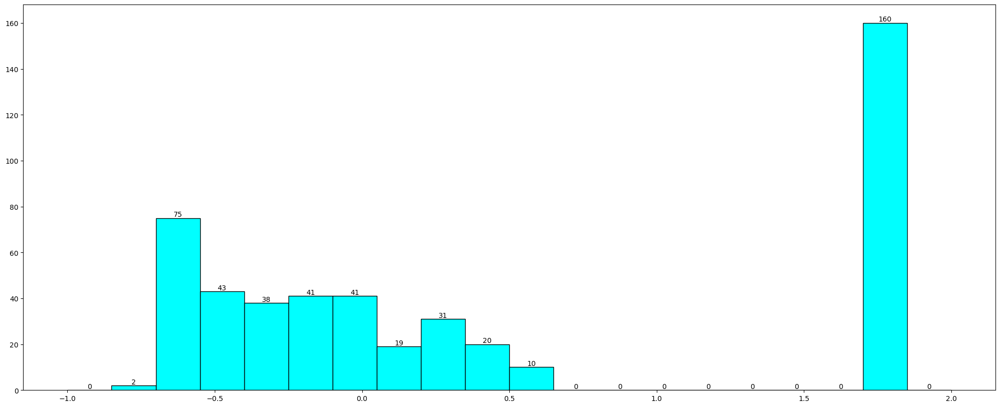

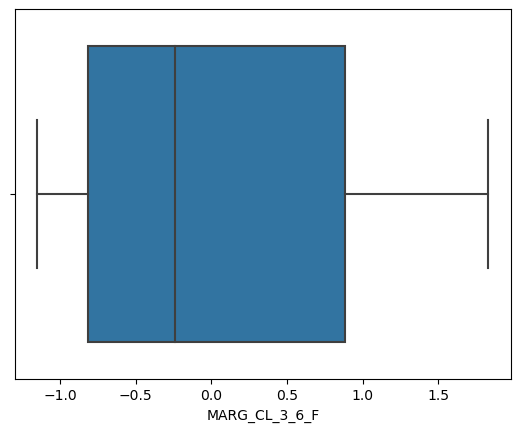

Description of MARG_AL_3_6_M
----------------------------------------------------------------------------
count    640.000000
mean       0.133455
std        1.075408
min       -0.809894
25%       -0.661499
50%       -0.341847
75%        0.645368
max        1.937828
Name: MARG_AL_3_6_M, dtype: float64 Skew : 0.96
Distribution of MARG_AL_3_6_M
----------------------------------------------------------------------------
BoxPlot of MARG_AL_3_6_M
----------------------------------------------------------------------------


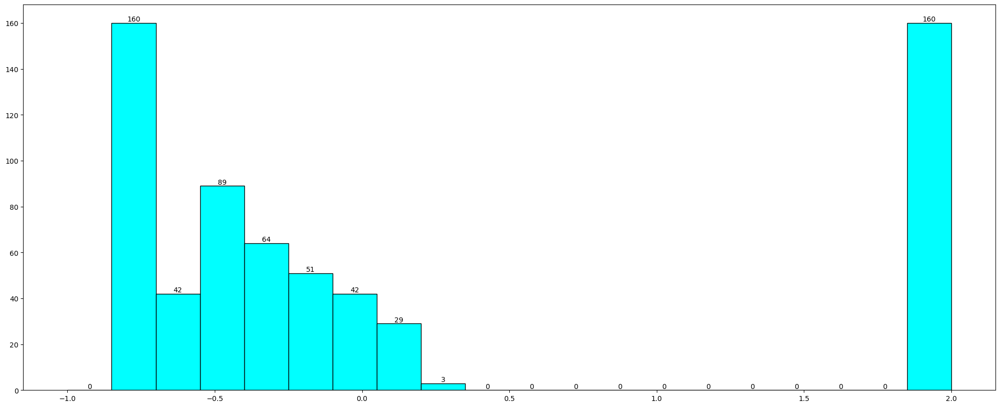

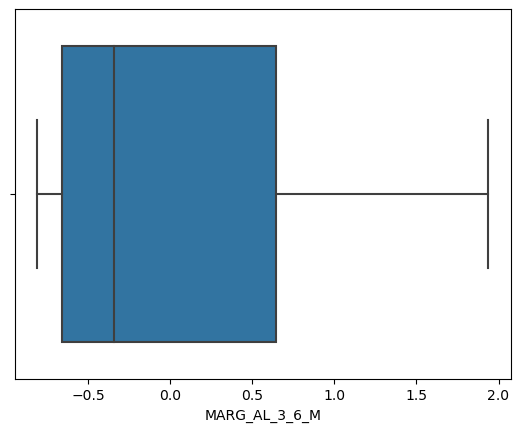

Description of MARG_AL_3_6_F
----------------------------------------------------------------------------
count    640.000000
mean       0.063795
std        0.832569
min       -0.656494
25%       -0.540413
50%       -0.306297
75%        0.457611
max        1.464355
Name: MARG_AL_3_6_F, dtype: float64 Skew : 0.98
Distribution of MARG_AL_3_6_F
----------------------------------------------------------------------------
BoxPlot of MARG_AL_3_6_F
----------------------------------------------------------------------------


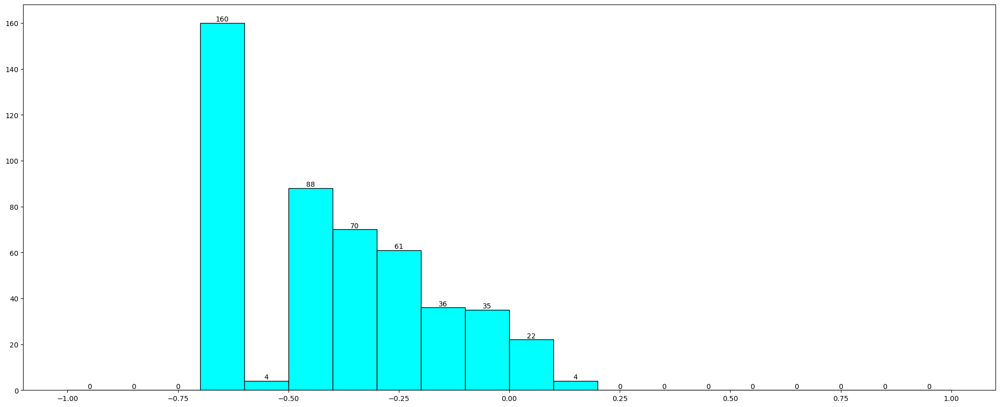

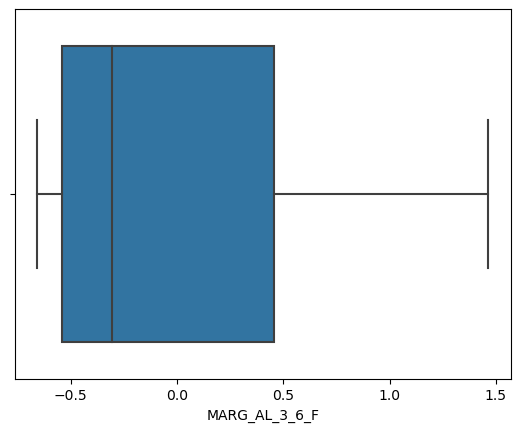

Description of MARG_HH_3_6_M
----------------------------------------------------------------------------
count    640.000000
mean       0.201171
std        1.224175
min       -0.884744
25%       -0.717876
50%       -0.336627
75%        0.796797
max        2.249697
Name: MARG_HH_3_6_M, dtype: float64 Skew : 0.94
Distribution of MARG_HH_3_6_M
----------------------------------------------------------------------------
BoxPlot of MARG_HH_3_6_M
----------------------------------------------------------------------------


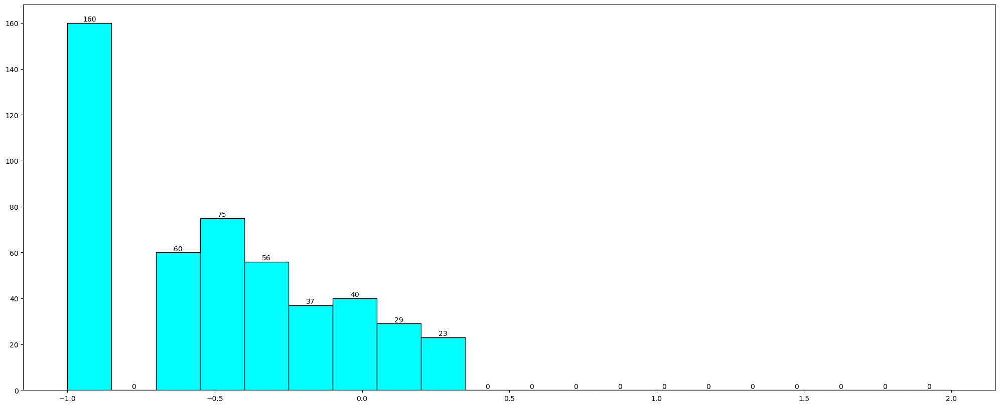

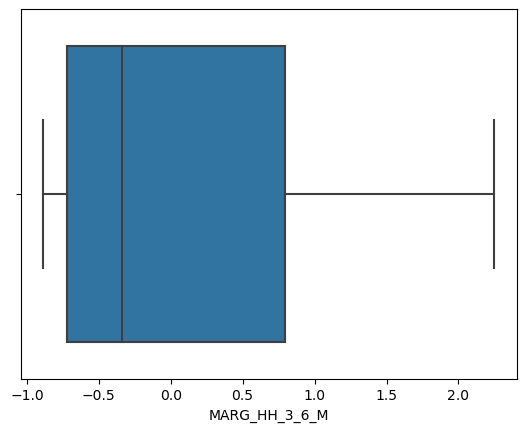

Description of MARG_HH_3_6_F
----------------------------------------------------------------------------
count    640.000000
mean       0.135741
std        1.162963
min       -0.959004
25%       -0.809882
50%       -0.351845
75%        0.839571
max        2.048243
Name: MARG_HH_3_6_F, dtype: float64 Skew : 0.85
Distribution of MARG_HH_3_6_F
----------------------------------------------------------------------------
BoxPlot of MARG_HH_3_6_F
----------------------------------------------------------------------------


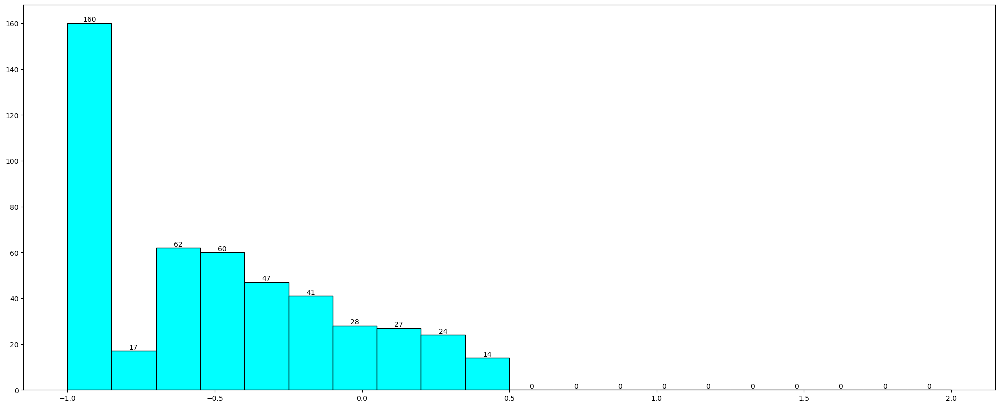

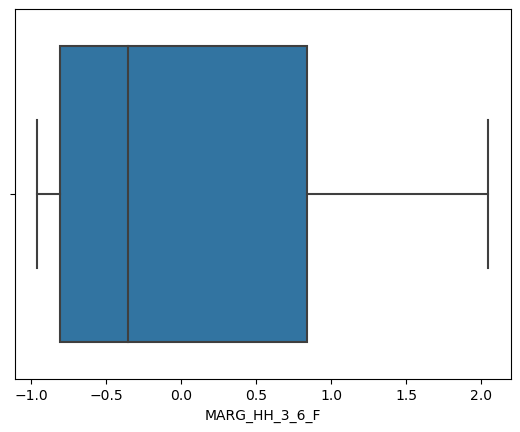

Description of MARG_OT_3_6_M
----------------------------------------------------------------------------
count    640.000000
mean       0.119181
std        0.945784
min       -0.662334
25%       -0.522705
50%       -0.323234
75%        0.488111
max        1.721134
Name: MARG_OT_3_6_M, dtype: float64 Skew : 1.02
Distribution of MARG_OT_3_6_M
----------------------------------------------------------------------------
BoxPlot of MARG_OT_3_6_M
----------------------------------------------------------------------------


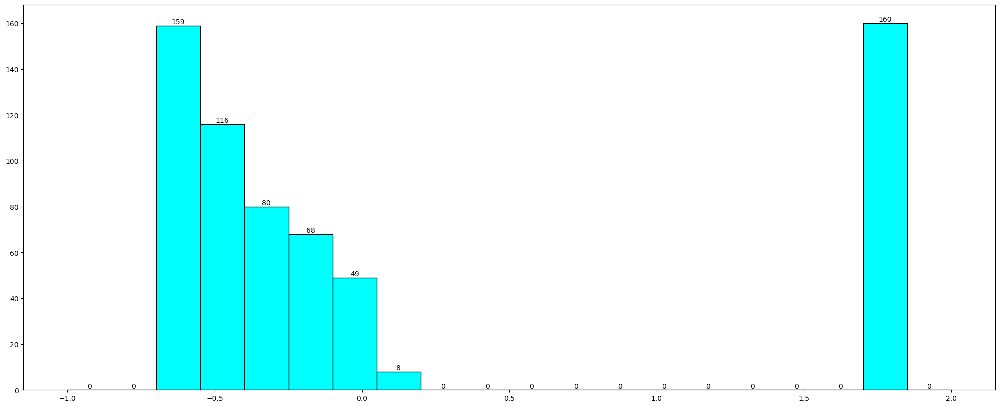

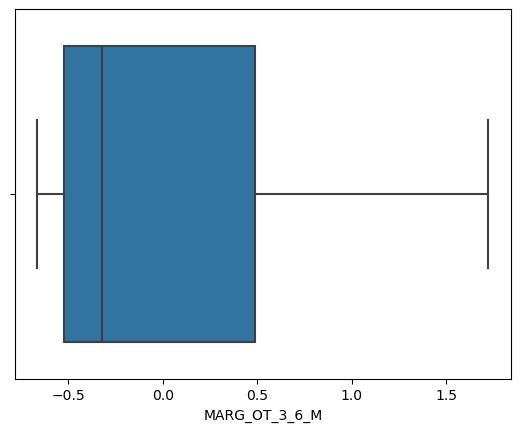

Description of MARG_OT_3_6_F
----------------------------------------------------------------------------
count    640.000000
mean       0.096562
std        0.859338
min       -0.632570
25%       -0.540000
50%       -0.295094
75%        0.496196
max        1.544069
Name: MARG_OT_3_6_F, dtype: float64 Skew : 0.99
Distribution of MARG_OT_3_6_F
----------------------------------------------------------------------------
BoxPlot of MARG_OT_3_6_F
----------------------------------------------------------------------------


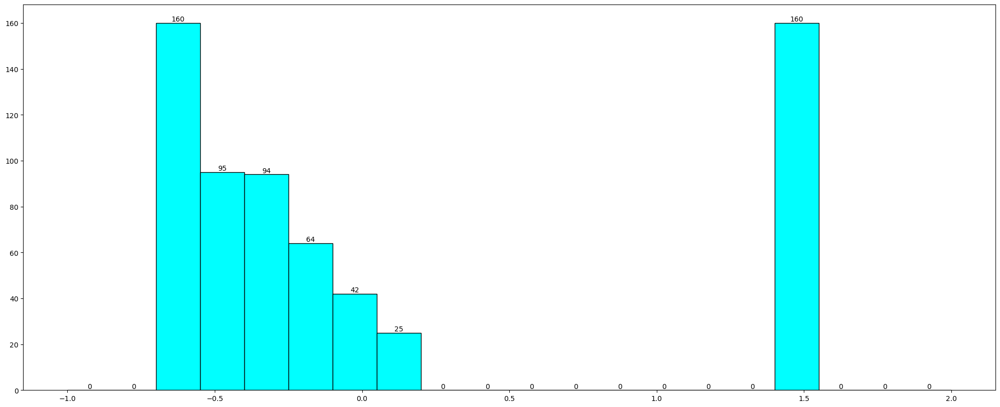

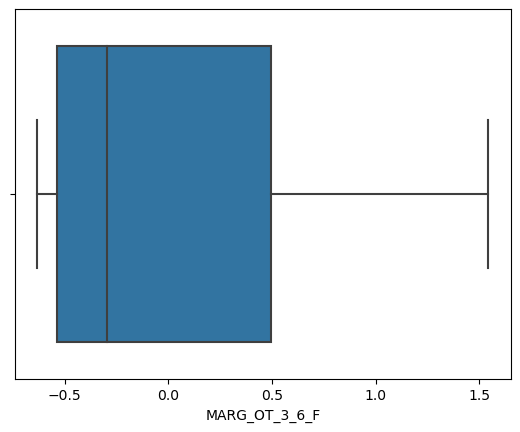

Description of MARGWORK_0_3_M
----------------------------------------------------------------------------
count    640.000000
mean       0.123051
std        1.054304
min       -0.830570
25%       -0.666883
50%       -0.307996
75%        0.644069
max        1.884392
Name: MARGWORK_0_3_M, dtype: float64 Skew : 0.93
Distribution of MARGWORK_0_3_M
----------------------------------------------------------------------------
BoxPlot of MARGWORK_0_3_M
----------------------------------------------------------------------------


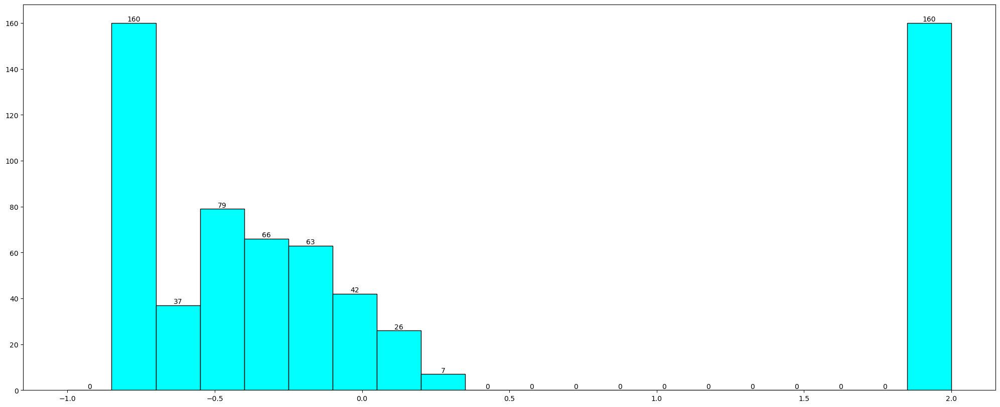

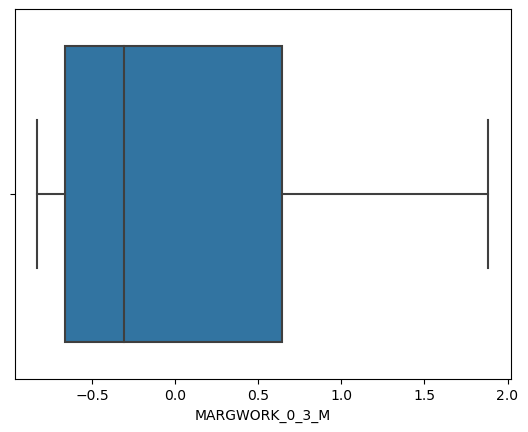

Description of MARGWORK_0_3_F
----------------------------------------------------------------------------
count    640.000000
mean       0.150311
std        1.068062
min       -0.805235
25%       -0.652527
50%       -0.300744
75%        0.656710
max        1.937157
Name: MARGWORK_0_3_F, dtype: float64 Skew : 0.94
Distribution of MARGWORK_0_3_F
----------------------------------------------------------------------------
BoxPlot of MARGWORK_0_3_F
----------------------------------------------------------------------------


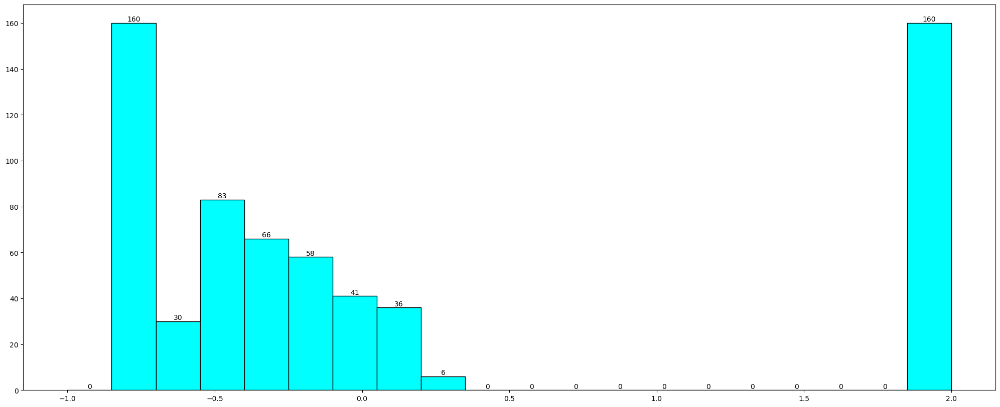

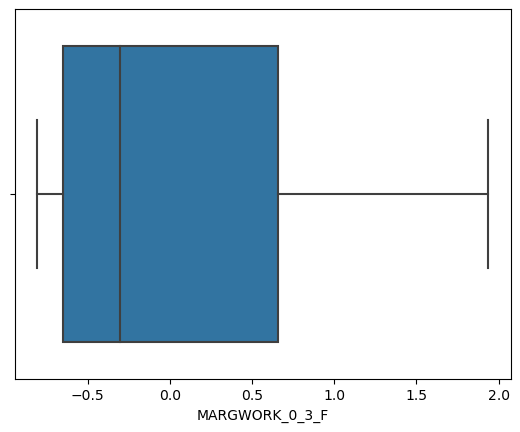

Description of MARG_CL_0_3_M
----------------------------------------------------------------------------
count    640.000000
mean       0.112127
std        1.052391
min       -0.871506
25%       -0.672838
50%       -0.298260
75%        0.625487
max        1.863014
Name: MARG_CL_0_3_M, dtype: float64 Skew : 0.91
Distribution of MARG_CL_0_3_M
----------------------------------------------------------------------------
BoxPlot of MARG_CL_0_3_M
----------------------------------------------------------------------------


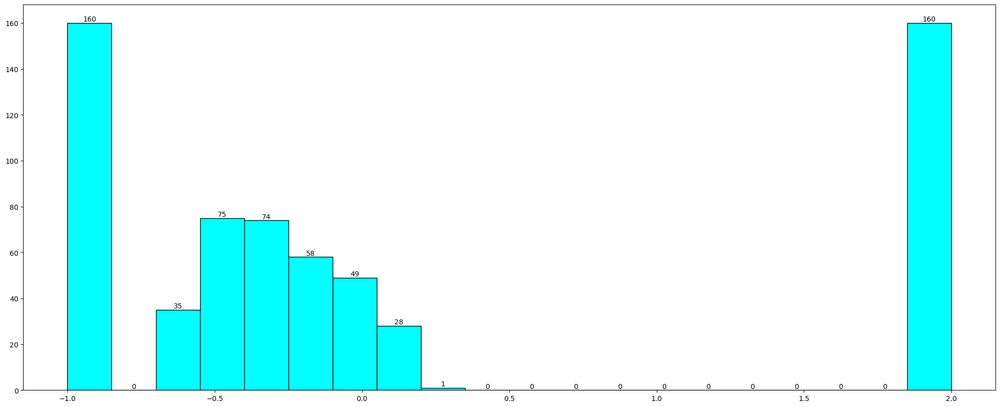

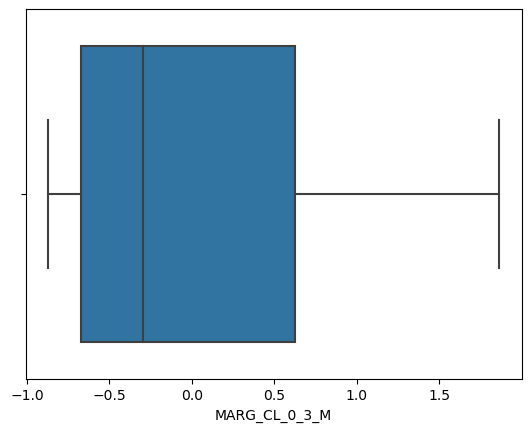

Description of MARG_CL_0_3_F
----------------------------------------------------------------------------
count    640.000000
mean       0.086979
std        1.034520
min       -0.927852
25%       -0.715900
50%       -0.297513
75%        0.668943
max        1.780110
Name: MARG_CL_0_3_F, dtype: float64 Skew : 0.82
Distribution of MARG_CL_0_3_F
----------------------------------------------------------------------------
BoxPlot of MARG_CL_0_3_F
----------------------------------------------------------------------------


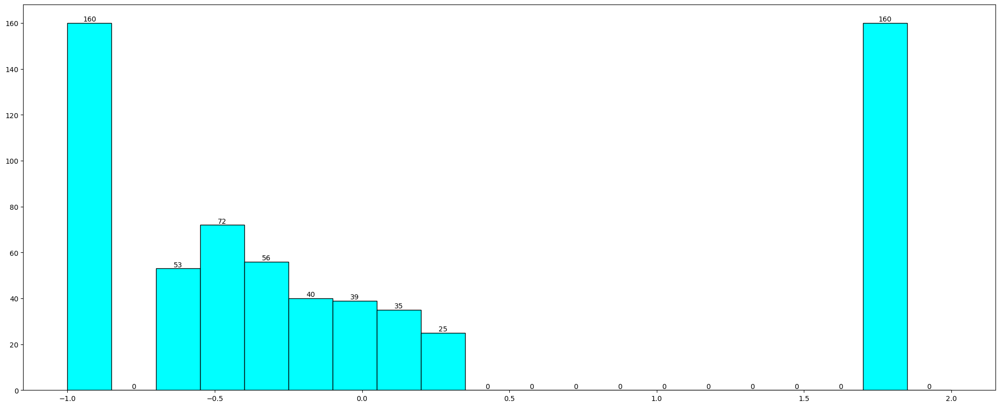

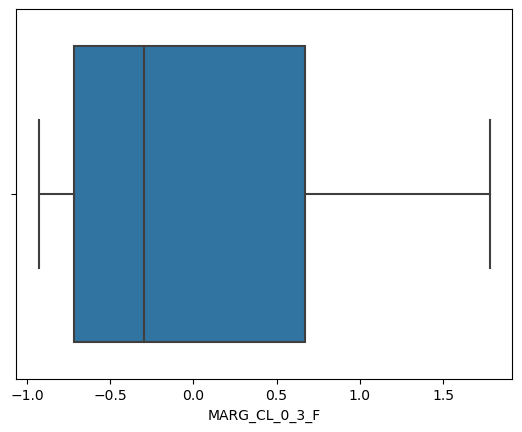

Description of MARG_AL_0_3_M
----------------------------------------------------------------------------
count    640.000000
mean       0.109672
std        0.828932
min       -0.536200
25%       -0.450104
50%       -0.301091
75%        0.412430
max        1.523152
Name: MARG_AL_0_3_M, dtype: float64 Skew : 1.06
Distribution of MARG_AL_0_3_M
----------------------------------------------------------------------------
BoxPlot of MARG_AL_0_3_M
----------------------------------------------------------------------------


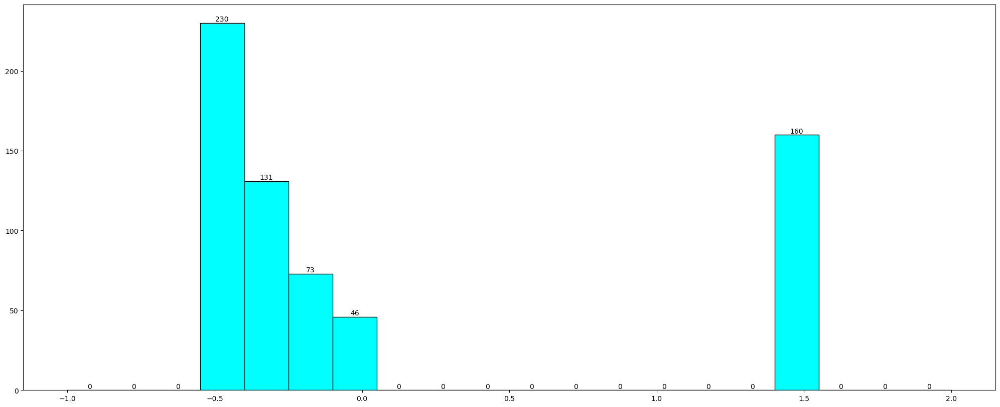

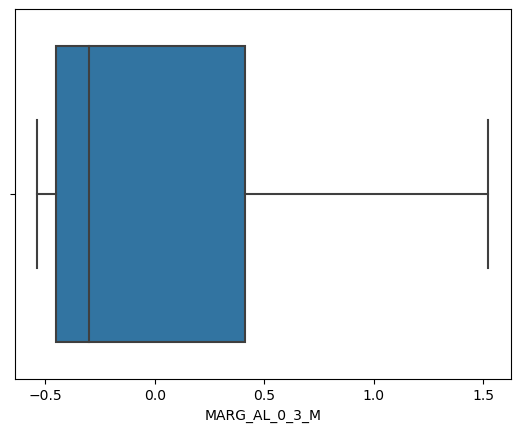

Description of MARG_AL_0_3_F
----------------------------------------------------------------------------
count    640.000000
mean       0.066384
std        0.696610
min       -0.482775
25%       -0.402141
50%       -0.278122
75%        0.319203
max        1.252901
Name: MARG_AL_0_3_F, dtype: float64 Skew : 1.05
Distribution of MARG_AL_0_3_F
----------------------------------------------------------------------------
BoxPlot of MARG_AL_0_3_F
----------------------------------------------------------------------------


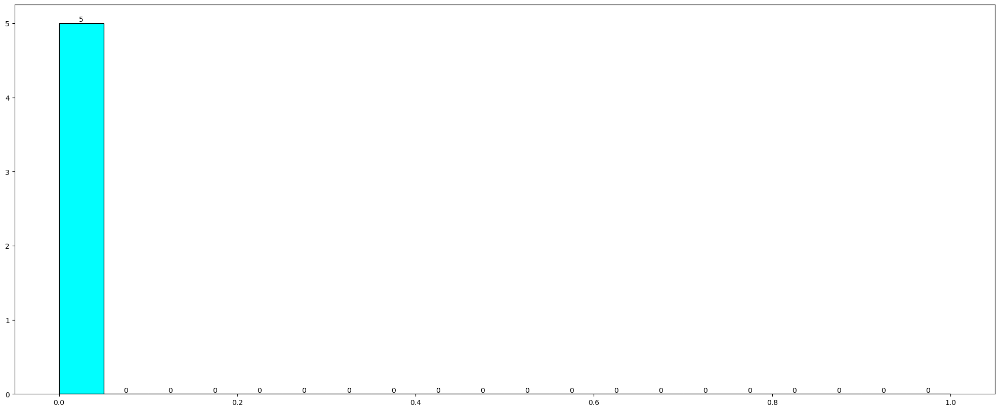

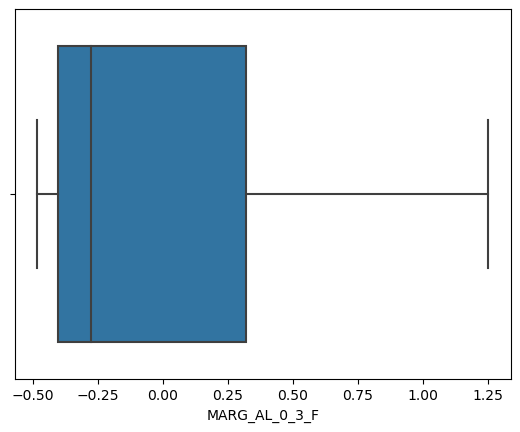

Description of MARG_HH_0_3_M
----------------------------------------------------------------------------
count    640.000000
mean       0.136473
std        1.021171
min       -0.722773
25%       -0.597721
50%       -0.331622
75%        0.106708
max        1.869739
Name: MARG_HH_0_3_M, dtype: float64 Skew : 1.01
Distribution of MARG_HH_0_3_M
----------------------------------------------------------------------------
BoxPlot of MARG_HH_0_3_M
----------------------------------------------------------------------------


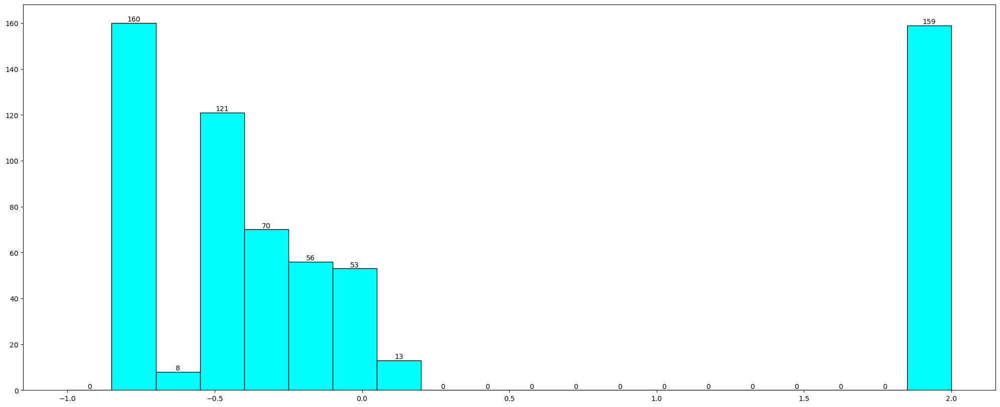

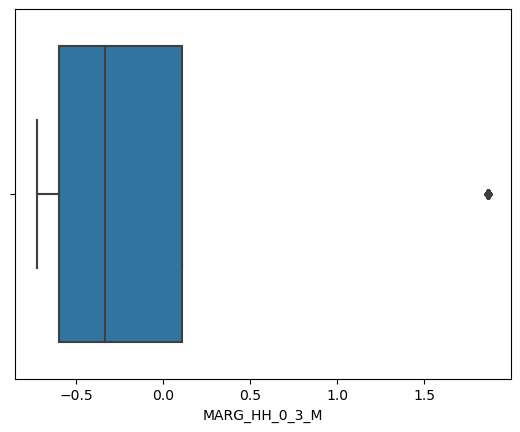

Description of MARG_HH_0_3_F
----------------------------------------------------------------------------
count    640.000000
mean       0.177322
std        1.154931
min       -0.807020
25%       -0.628374
50%       -0.363877
75%        0.727718
max        2.123879
Name: MARG_HH_0_3_F, dtype: float64 Skew : 0.99
Distribution of MARG_HH_0_3_F
----------------------------------------------------------------------------
BoxPlot of MARG_HH_0_3_F
----------------------------------------------------------------------------


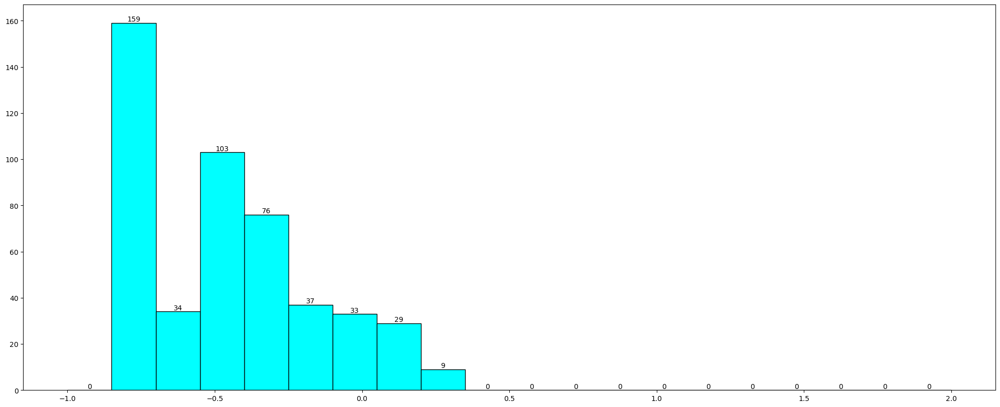

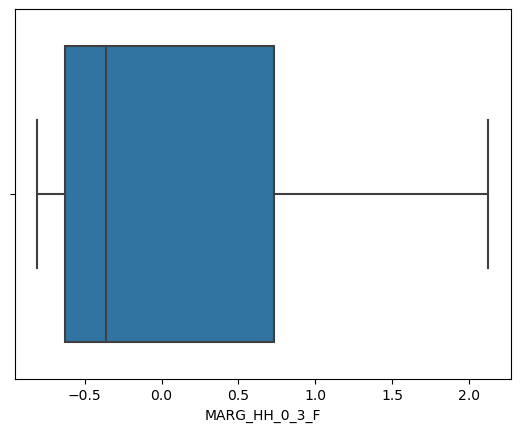

Description of MARG_OT_0_3_M
----------------------------------------------------------------------------
count    640.000000
mean       0.128573
std        0.958019
min       -0.643517
25%       -0.532213
50%       -0.337432
75%        0.070681
max        1.769914
Name: MARG_OT_0_3_M, dtype: float64 Skew : 1.06
Distribution of MARG_OT_0_3_M
----------------------------------------------------------------------------
BoxPlot of MARG_OT_0_3_M
----------------------------------------------------------------------------


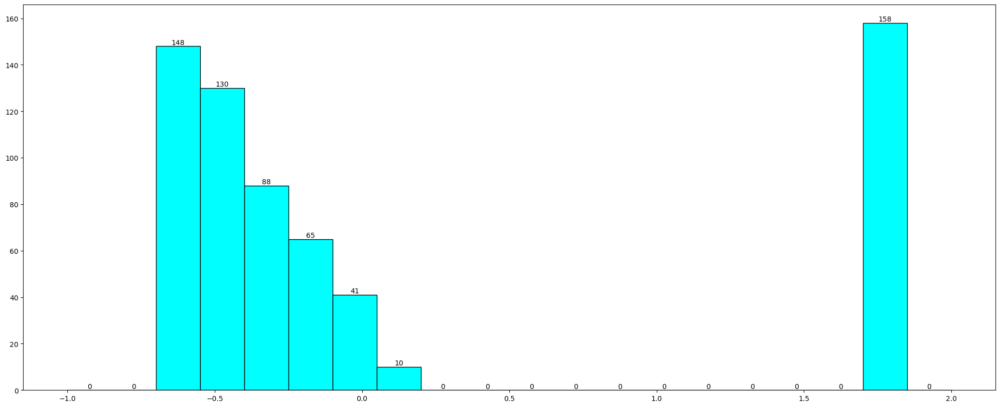

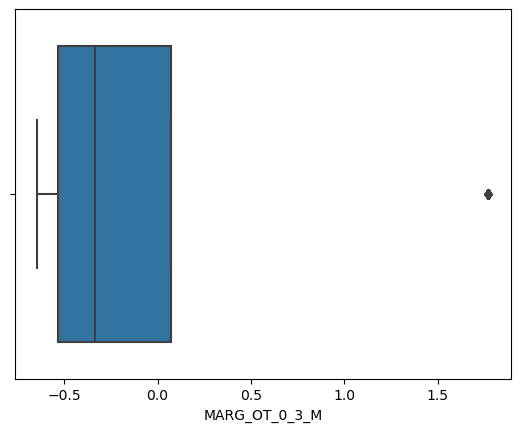

Description of MARG_OT_0_3_F
----------------------------------------------------------------------------
count    640.000000
mean       0.061916
std        0.801384
min       -0.625987
25%       -0.509670
50%       -0.283498
75%        0.126843
max        1.417155
Name: MARG_OT_0_3_F, dtype: float64 Skew : 0.98
Distribution of MARG_OT_0_3_F
----------------------------------------------------------------------------
BoxPlot of MARG_OT_0_3_F
----------------------------------------------------------------------------


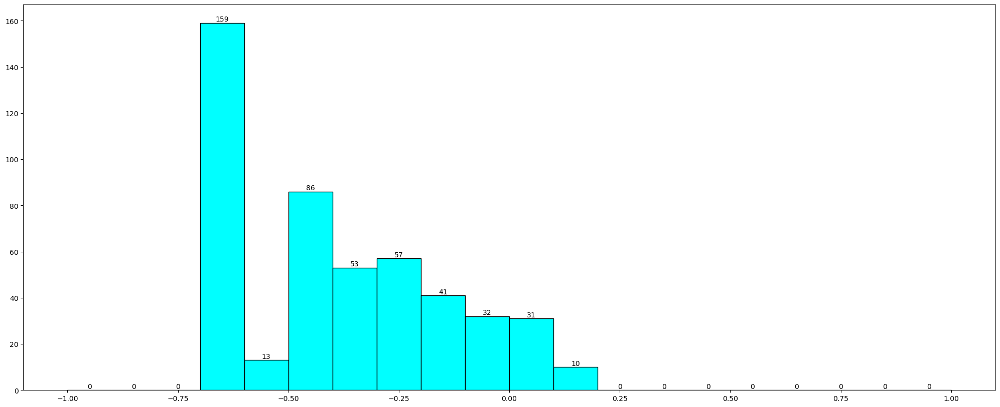

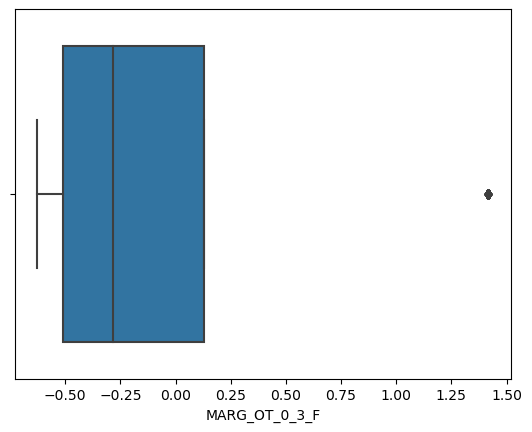

Description of NON_WORK_M
----------------------------------------------------------------------------
count    640.000000
mean       0.115891
std        0.997433
min       -0.783632
25%       -0.572036
50%       -0.301600
75%        0.561418
max        1.783543
Name: NON_WORK_M, dtype: float64 Skew : 0.94
Distribution of NON_WORK_M
----------------------------------------------------------------------------
BoxPlot of NON_WORK_M
----------------------------------------------------------------------------


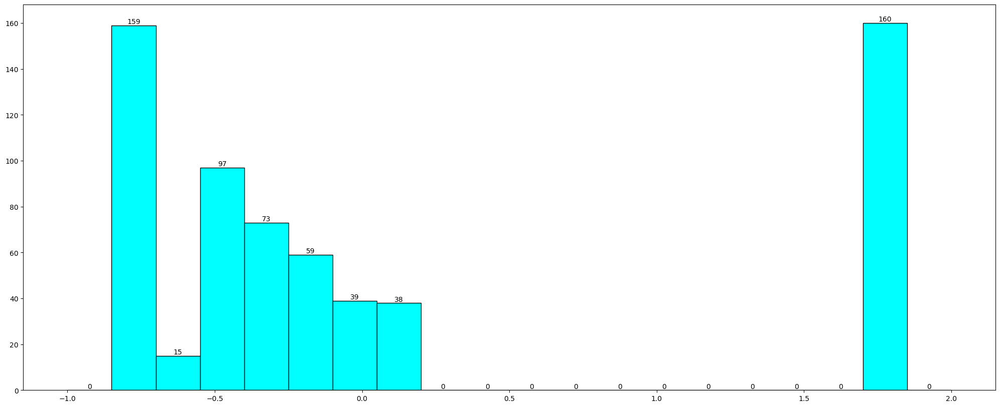

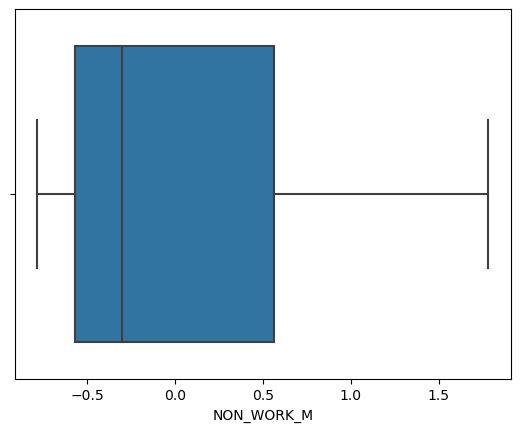

Description of NON_WORK_F
----------------------------------------------------------------------------
count    640.000000
mean       0.098578
std        0.904017
min       -0.725706
25%       -0.580365
50%       -0.264188
75%        0.523431
max        1.604811
Name: NON_WORK_F, dtype: float64 Skew : 0.92
Distribution of NON_WORK_F
----------------------------------------------------------------------------
BoxPlot of NON_WORK_F
----------------------------------------------------------------------------


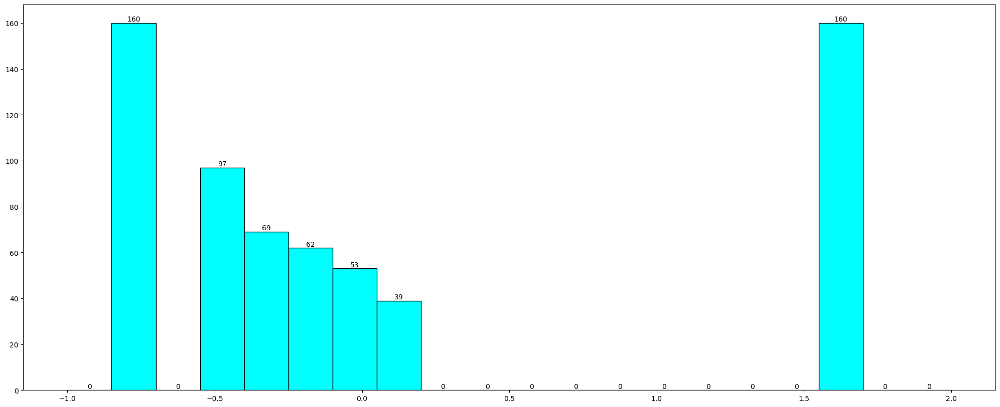

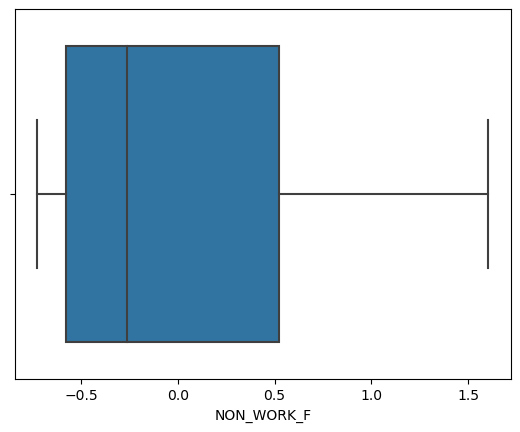

In [83]:
for x in lstnumericcolumns:
    univariateAnalysis_numeric_s(x,20)

In [84]:
pca_df_num_scaled.drop(['Genderratio','Agriculturist'],axis=1,inplace=True)

No Outlier observed in this box plots

**Perform all the required steps for PCA (use sklearn only) Create the covariance Matrix Get eigen values and eigen vector.**

In [85]:
from factor_analyzer.factor_analyzer import calculate_bartlett_sphericity
chi_square_value,p_value=calculate_bartlett_sphericity(pca_df_num_scaled)
p_value

0.0

In [86]:
from factor_analyzer.factor_analyzer import calculate_kmo
kmo_all,kmo_model=calculate_kmo(pca_df_num_scaled)
kmo_model

0.9639180078892161

In [87]:
from sklearn.decomposition import PCA
pca = PCA(n_components=59, random_state=123)
df_pca = pca.fit_transform(pca_df_num_scaled)
df_pca.transpose().round(2)

array([[-5.88, -6.08, -7.15, ..., -6.94, -7.02, -6.98],
       [ 0.86,  0.23,  0.02, ..., -1.27, -1.31, -1.37],
       [-2.01, -2.4 , -1.3 , ...,  0.66,  0.65,  0.66],
       ...,
       [-0.02,  0.08, -0.01, ..., -0.01, -0.01, -0.01],
       [ 0.06,  0.01,  0.02, ...,  0.  , -0.01, -0.  ],
       [-0.01, -0.05, -0.02, ..., -0.13, -0.12, -0.12]])

In [88]:
print('Eigen Vectors \n ',pca.components_.round(2))

Eigen Vectors 
  [[ 0.03  0.03  0.16 ...  0.1   0.13  0.12]
 [-0.14 -0.13 -0.13 ...  0.03 -0.04 -0.03]
 [ 0.31  0.32  0.07 ... -0.07 -0.11 -0.03]
 ...
 [-0.05  0.05  0.   ... -0.    0.05  0.02]
 [ 0.06 -0.07  0.03 ...  0.04  0.01  0.03]
 [-0.69  0.7   0.03 ... -0.   -0.   -0.  ]]


In [89]:
var_exp = pca.explained_variance_ratio_
print('Eigen Values \n ', var_exp.round(5))

Eigen Values 
  [5.7130e-01 1.1008e-01 7.8820e-02 4.1790e-02 3.7620e-02 2.0870e-02
 1.7960e-02 1.2440e-02 1.0460e-02 8.9300e-03 8.0000e-03 6.8500e-03
 6.4000e-03 5.5900e-03 5.0900e-03 4.4200e-03 4.0000e-03 3.8100e-03
 3.5600e-03 3.2600e-03 3.0700e-03 2.7100e-03 2.4800e-03 2.4400e-03
 2.3300e-03 2.0300e-03 1.8400e-03 1.7900e-03 1.7000e-03 1.5500e-03
 1.5100e-03 1.2500e-03 1.2000e-03 1.1700e-03 1.0400e-03 9.6000e-04
 8.8000e-04 8.5000e-04 8.1000e-04 7.4000e-04 6.4000e-04 6.0000e-04
 5.7000e-04 5.0000e-04 4.8000e-04 4.4000e-04 4.1000e-04 4.0000e-04
 3.4000e-04 3.2000e-04 2.8000e-04 2.5000e-04 2.3000e-04 2.1000e-04
 1.9000e-04 1.7000e-04 1.4000e-04 1.4000e-04 8.0000e-05]


>>Eigen Values and Eigen Vectors are shown above using the PCA covariance matrix.

In [90]:
cum_var_exp = np.cumsum(var_exp)
print('Cumulative Variance Explained in Percentage:',(cum_var_exp*100).round(2))

Cumulative Variance Explained in Percentage: [ 57.13  68.14  76.02  80.2   83.96  86.05  87.84  89.09  90.13  91.03
  91.83  92.51  93.15  93.71  94.22  94.66  95.06  95.44  95.8   96.12
  96.43  96.7   96.95  97.19  97.43  97.63  97.81  97.99  98.16  98.32
  98.47  98.6   98.72  98.83  98.94  99.03  99.12  99.21  99.29  99.36
  99.42  99.48  99.54  99.59  99.64  99.68  99.72  99.76  99.8   99.83
  99.86  99.88  99.91  99.93  99.95  99.96  99.98  99.99 100.  ]


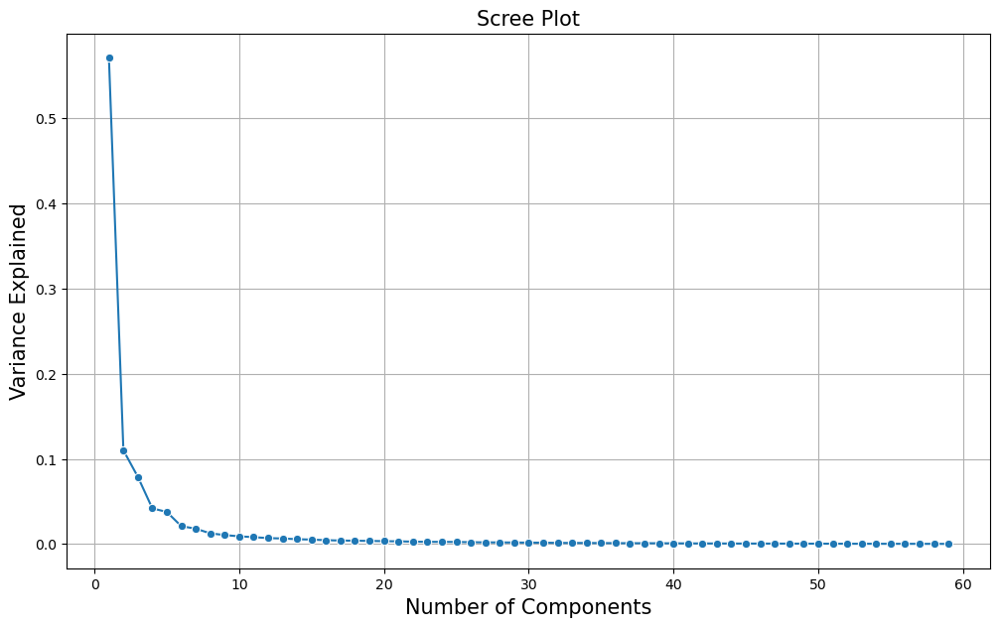

In [91]:
plt.figure(figsize=(12,7))
sns.lineplot(y=var_exp,x=range(1,len(var_exp)+1),marker='o')
plt.xlabel('Number of Components',fontsize=15)
plt.ylabel('Variance Explained',fontsize=15)
plt.title('Scree Plot',fontsize=15)
plt.grid()
plt.show()

In [92]:
from sklearn.decomposition import PCA
pca_8 = PCA(n_components=8, random_state=123)
df_pca_8 = pca_8.fit_transform(pca_df_num_scaled)
df_pca_8.transpose().round(2)

array([[-5.88, -6.08, -7.15, ..., -6.94, -7.02, -6.98],
       [ 0.86,  0.23,  0.02, ..., -1.27, -1.31, -1.37],
       [-2.01, -2.4 , -1.3 , ...,  0.66,  0.65,  0.66],
       ...,
       [-0.48, -0.53, -0.65, ...,  1.33,  1.46,  1.47],
       [ 0.76, -0.88,  0.76, ..., -1.03, -0.91, -0.87],
       [-0.06,  0.74,  0.66, ..., -1.3 , -1.3 , -1.29]])

In [93]:
var_exp_8 = pca_8.explained_variance_ratio_
print('Eigen Value for 8 \n ', var_exp_8.round(5))

Eigen Value for 8 
  [0.5713  0.11008 0.07882 0.04179 0.03762 0.02087 0.01796 0.01244]


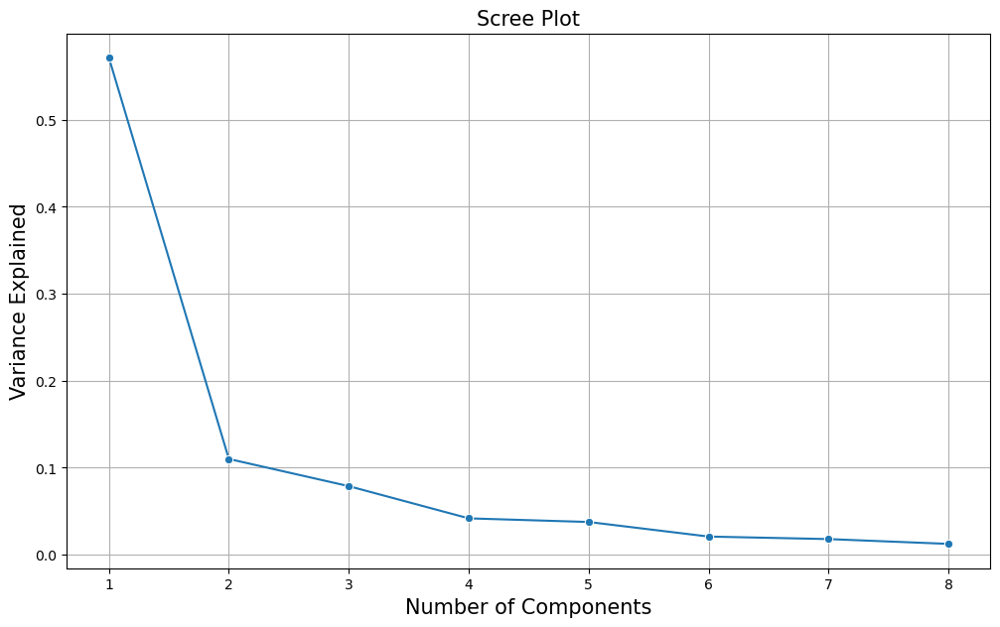

In [94]:
# Step 3 View Scree Plot to identify the number of components to be built
plt.figure(figsize=(12,7))
sns.lineplot(y=var_exp_8,x=range(1,len(var_exp_8)+1),marker='o')
plt.xlabel('Number of Components',fontsize=15)
plt.ylabel('Variance Explained',fontsize=15)
plt.title('Scree Plot',fontsize=15)
plt.grid()
plt.show()

In [95]:
# Loading of each feature on the components
# Eigen Vectors when PC's are kept as 8
pca_8.components_.round(2)

array([[ 0.03,  0.03,  0.16,  0.16,  0.16,  0.17,  0.17,  0.15,  0.15,
         0.02,  0.02,  0.16,  0.13,  0.18,  0.18,  0.16,  0.16,  0.14,
         0.14,  0.12,  0.09,  0.14,  0.1 ,  0.12,  0.07,  0.11,  0.09,
         0.17,  0.15,  0.08,  0.05,  0.14,  0.13,  0.13,  0.11,  0.15,
         0.15,  0.17,  0.15,  0.18,  0.16,  0.09,  0.05,  0.15,  0.13,
         0.13,  0.11,  0.15,  0.15,  0.14,  0.13,  0.04,  0.04,  0.11,
         0.12,  0.13,  0.1 ,  0.13,  0.12],
       [-0.14, -0.13, -0.13, -0.09, -0.1 , -0.03, -0.02, -0.1 , -0.11,
         0.09,  0.09, -0.11, -0.13, -0.02, -0.04, -0.13, -0.08, -0.18,
        -0.17,  0.02,  0.08, -0.05, -0.07, -0.09, -0.05, -0.2 , -0.17,
         0.11,  0.12,  0.25,  0.2 ,  0.2 ,  0.18,  0.03,  0.01, -0.08,
        -0.09, -0.06, -0.1 ,  0.09,  0.1 ,  0.26,  0.2 ,  0.2 ,  0.17,
         0.03,  0.  , -0.08, -0.1 ,  0.15,  0.18,  0.2 ,  0.18,  0.21,
         0.22,  0.05,  0.03, -0.04, -0.03],
       [ 0.31,  0.32,  0.07, -0.05, -0.  , -0.11, -0.1 , -0.

In [96]:
df_pca_loading_8 = pd.DataFrame(pca_8.components_.round(2),columns=list(pca_df_num_scaled))
df_pca_loading_8.shape

(8, 59)

In [97]:
df_pca_loading_8.head(6)

,State Code,Dist.Code,No_HH,TOT_M,TOT_F,M_06,F_06,M_SC,F_SC,M_ST,...,MARG_CL_0_3_M,MARG_CL_0_3_F,MARG_AL_0_3_M,MARG_AL_0_3_F,MARG_HH_0_3_M,MARG_HH_0_3_F,MARG_OT_0_3_M,MARG_OT_0_3_F,NON_WORK_M,NON_WORK_F
0,0.03,0.03,0.16,0.16,0.16,0.17,0.17,0.15,0.15,0.02,...,0.14,0.13,0.04,0.04,0.11,0.12,0.13,0.10,0.13,0.12
1,-0.14,-0.13,-0.13,-0.09,-0.10,-0.03,-0.02,-0.10,-0.11,0.09,...,0.15,0.18,0.20,0.18,0.21,0.22,0.05,0.03,-0.04,-0.03
2,0.31,0.32,0.07,-0.05,-0.00,-0.11,-0.10,-0.07,-0.01,0.28,...,-0.10,0.03,-0.10,-0.07,0.01,0.17,-0.11,-0.07,-0.11,-0.03
3,-0.02,-0.04,0.07,0.04,0.05,0.01,0.01,0.03,0.04,0.13,...,-0.01,0.01,0.24,0.21,-0.21,-0.17,-0.15,-0.11,-0.02,0.01
4,0.17,0.15,-0.02,-0.06,-0.02,-0.07,-0.07,-0.17,-0.16,0.32,...,0.14,0.09,0.02,-0.01,-0.03,-0.03,0.04,0.05,0.23,0.21
5,0.22,0.22,0.08,-0.04,0.01,-0.11,-0.11,-0.06,-0.00,-0.51,...,0.07,0.17,0.04,0.07,-0.02,0.09,-0.03,0.03,0.01,0.10


In [98]:
def highlight_max(s):
    is_max = s == np.abs(s).max()
    return ['background-color: yellow; color: red' if v else '' for v in is_max]

In [99]:
df_pca_loading_8.style.apply(highlight_max).format("{:.2f}")

,State Code,Dist.Code,No_HH,TOT_M,TOT_F,M_06,F_06,M_SC,F_SC,M_ST,F_ST,M_LIT,F_LIT,M_ILL,F_ILL,TOT_WORK_M,TOT_WORK_F,MAINWORK_M,MAINWORK_F,MAIN_CL_M,MAIN_CL_F,MAIN_AL_M,MAIN_AL_F,MAIN_HH_M,MAIN_HH_F,MAIN_OT_M,MAIN_OT_F,MARGWORK_M,MARGWORK_F,MARG_CL_M,MARG_CL_F,MARG_AL_M,MARG_AL_F,MARG_HH_M,MARG_HH_F,MARG_OT_M,MARG_OT_F,MARGWORK_3_6_M,MARGWORK_3_6_F,MARG_CL_3_6_M,MARG_CL_3_6_F,MARG_AL_3_6_M,MARG_AL_3_6_F,MARG_HH_3_6_M,MARG_HH_3_6_F,MARG_OT_3_6_M,MARG_OT_3_6_F,MARGWORK_0_3_M,MARGWORK_0_3_F,MARG_CL_0_3_M,MARG_CL_0_3_F,MARG_AL_0_3_M,MARG_AL_0_3_F,MARG_HH_0_3_M,MARG_HH_0_3_F,MARG_OT_0_3_M,MARG_OT_0_3_F,NON_WORK_M,NON_WORK_F
0,0.03,0.03,0.16,0.16,0.16,0.17,0.17,0.15,0.15,0.02,0.02,0.16,0.13,0.18,0.18,0.16,0.16,0.14,0.14,0.12,0.09,0.14,0.10,0.12,0.07,0.11,0.09,0.17,0.15,0.08,0.05,0.14,0.13,0.13,0.11,0.15,0.15,0.17,0.15,0.18,0.16,0.09,0.05,0.15,0.13,0.13,0.11,0.15,0.15,0.14,0.13,0.04,0.04,0.11,0.12,0.13,0.10,0.13,0.12
1,-0.14,-0.13,-0.13,-0.09,-0.10,-0.03,-0.02,-0.10,-0.11,0.09,0.09,-0.11,-0.13,-0.02,-0.04,-0.13,-0.08,-0.18,-0.17,0.02,0.08,-0.05,-0.07,-0.09,-0.05,-0.20,-0.17,0.11,0.12,0.25,0.20,0.20,0.18,0.03,0.01,-0.08,-0.09,-0.06,-0.10,0.09,0.10,0.26,0.20,0.20,0.17,0.03,0.00,-0.08,-0.10,0.15,0.18,0.20,0.18,0.21,0.22,0.05,0.03,-0.04,-0.03
2,0.31,0.32,0.07,-0.05,-0.00,-0.11,-0.10,-0.07,-0.01,0.28,0.30,-0.04,-0.01,-0.09,0.04,-0.01,0.17,0.01,0.20,-0.04,0.12,0.17,0.31,-0.09,-0.00,-0.01,0.05,-0.07,0.10,-0.11,-0.05,0.08,0.24,-0.11,-0.07,-0.13,-0.06,-0.09,-0.06,-0.06,0.12,-0.11,-0.04,0.10,0.26,-0.11,-0.07,-0.12,-0.06,-0.10,0.03,-0.10,-0.07,0.01,0.17,-0.11,-0.07,-0.11,-0.03
3,-0.02,-0.04,0.07,0.04,0.05,0.01,0.01,0.03,0.04,0.13,0.11,0.06,0.07,-0.04,0.01,0.04,0.15,0.06,0.15,0.15,0.34,-0.07,0.04,-0.04,-0.02,0.07,0.07,-0.09,0.06,0.23,0.29,-0.25,-0.12,-0.15,-0.12,-0.04,0.05,0.03,0.02,-0.12,0.06,0.22,0.29,-0.26,-0.10,-0.14,-0.11,-0.03,0.03,-0.01,0.01,0.24,0.21,-0.21,-0.17,-0.15,-0.11,-0.02,0.01
4,0.17,0.15,-0.02,-0.06,-0.02,-0.07,-0.07,-0.17,-0.16,0.32,0.34,-0.03,0.02,-0.10,-0.13,-0.06,-0.00,-0.06,-0.03,-0.29,-0.19,-0.29,-0.19,-0.04,0.00,0.08,0.11,0.10,0.06,0.02,0.00,-0.09,-0.07,0.05,0.06,0.21,0.22,-0.05,-0.03,0.09,0.06,0.02,0.01,-0.10,-0.08,0.05,0.06,0.19,0.20,0.14,0.09,0.02,-0.01,-0.03,-0.03,0.04,0.05,0.23,0.21
5,0.22,0.22,0.08,-0.04,0.01,-0.11,-0.11,-0.06,-0.00,-0.51,-0.51,-0.02,0.02,-0.17,-0.04,-0.04,0.13,-0.05,0.11,-0.29,-0.01,-0.11,0.07,-0.11,-0.01,0.01,0.04,0.05,0.15,0.07,0.06,-0.04,0.06,-0.07,-0.01,0.01,0.06,-0.08,-0.03,0.04,0.12,0.08,0.06,-0.06,0.06,-0.06,-0.03,0.02,0.05,0.07,0.17,0.04,0.07,-0.02,0.09,-0.03,0.03,0.01,0.10
6,-0.24,-0.24,0.06,0.10,0.08,0.08,0.06,0.09,0.09,0.03,0.03,0.11,0.11,0.03,0.02,0.06,-0.01,0.07,-0.09,-0.29,-0.22,-0.15,-0.18,-0.00,-0.11,0.16,0.07,-0.02,0.12,-0.09,-0.04,0.04,0.12,-0.23,-0.28,-0.02,-0.00,0.12,0.12,-0.05,0.09,-0.12,-0.06,0.02,0.10,-0.25,-0.28,-0.01,-0.02,0.04,0.18,-0.02,0.01,0.09,0.22,-0.22,-0.21,-0.02,0.01
7,-0.28,-0.29,-0.00,-0.09,-0.04,-0.27,-0.29,0.16,0.17,-0.02,-0.01,-0.05,-0.01,-0.24,-0.05,-0.02,-0.00,0.01,-0.04,0.18,0.10,0.01,0.03,0.05,0.09,0.03,0.04,-0.20,0.05,-0.09,0.01,0.01,0.15,0.01,0.12,0.09,0.29,-0.20,-0.09,-0.17,0.05,-0.09,0.03,0.04,0.15,0.03,0.12,0.09,0.27,-0.18,-0.01,-0.05,0.00,-0.03,0.12,-0.05,0.05,0.08,0.21


In [100]:
from matplotlib.patches import Rectangle

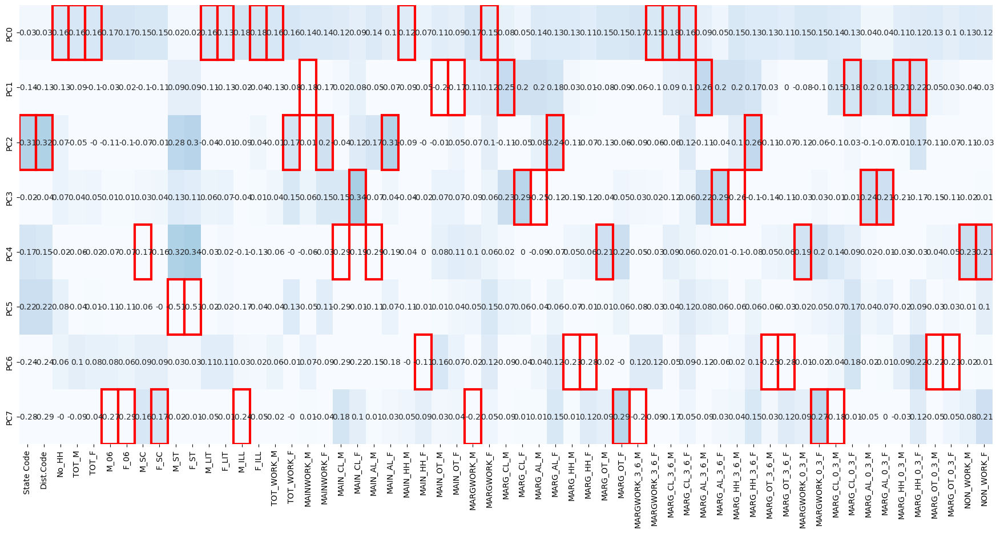

In [101]:
fig,ax = plt.subplots(figsize=(22, 10), facecolor='w', edgecolor='k')
ax = sns.heatmap(df_pca_loading_8, annot=True, vmax=1.0, vmin=0, cmap='Blues', cbar=False, fmt='.2g', ax=ax,
                 yticklabels=['PC0','PC1','PC2','PC3','PC4','PC5','PC6','PC7'])

column_max = df_pca_loading_8.abs().idxmax(axis=0)

for col, variable in enumerate(df_pca_loading_8.columns):
    position = df_pca_loading_8.index.get_loc(column_max[variable])
    ax.add_patch(Rectangle((col, position),1,1, fill=False, edgecolor='red', lw=3))

PC0 - explains 57% of feature details. 
PC1 - explains upto 68% of details.
PC7 explains 90% of the data. 

Thus we have reduced 59 to 8 features.

In [102]:
for i in range(0,59):
    print("(",np.round(pca_8.components_[0][i],2),")",'*',pca_df_num_scaled.columns[i], end=' + ')

( 0.03 ) * State Code + ( 0.03 ) * Dist.Code + ( 0.16 ) * No_HH + ( 0.16 ) * TOT_M + ( 0.16 ) * TOT_F + ( 0.17 ) * M_06 + ( 0.17 ) * F_06 + ( 0.15 ) * M_SC + ( 0.15 ) * F_SC + ( 0.02 ) * M_ST + ( 0.02 ) * F_ST + ( 0.16 ) * M_LIT + ( 0.13 ) * F_LIT + ( 0.18 ) * M_ILL + ( 0.18 ) * F_ILL + ( 0.16 ) * TOT_WORK_M + ( 0.16 ) * TOT_WORK_F + ( 0.14 ) * MAINWORK_M + ( 0.14 ) * MAINWORK_F + ( 0.12 ) * MAIN_CL_M + ( 0.09 ) * MAIN_CL_F + ( 0.14 ) * MAIN_AL_M + ( 0.1 ) * MAIN_AL_F + ( 0.12 ) * MAIN_HH_M + ( 0.07 ) * MAIN_HH_F + ( 0.11 ) * MAIN_OT_M + ( 0.09 ) * MAIN_OT_F + ( 0.17 ) * MARGWORK_M + ( 0.15 ) * MARGWORK_F + ( 0.08 ) * MARG_CL_M + ( 0.05 ) * MARG_CL_F + ( 0.14 ) * MARG_AL_M + ( 0.13 ) * MARG_AL_F + ( 0.13 ) * MARG_HH_M + ( 0.11 ) * MARG_HH_F + ( 0.15 ) * MARG_OT_M + ( 0.15 ) * MARG_OT_F + ( 0.17 ) * MARGWORK_3_6_M + ( 0.15 ) * MARGWORK_3_6_F + ( 0.18 ) * MARG_CL_3_6_M + ( 0.16 ) * MARG_CL_3_6_F + ( 0.09 ) * MARG_AL_3_6_M + ( 0.05 ) * MARG_AL_3_6_F + ( 0.15 ) * MARG_HH_3_6_M + ( 0.13 ) *

First equation of PCA